In [1]:
import os 
import json
import pandas as pd
import numpy as np
from utils import view_histo_from_massaged, do_pca, do_tsne

CONFIDENCE = 0.85 # Probalility threshold from range [0.0..1.0]
target_dir = "ann_training85" # location where intermediate training sets, models, dataframes are stored

In [2]:
meta = {
    "dset_path": "/home/mantydze/data/ZeroBias2017B/massaged/chargeInner_PXLayer_1.csv",
    "dset_name": "ZeroBias",
    "dset_era": "2017B",
    "histo_name": "chargeInner_PXLayer_1",
    
    "good": [{"run_number": 297050, "exclude": [420, 421, 424, 426, 429]}, 
             {"run_number": 297056, "exclude": [31, 34, 36, 40]}, 
             {"run_number": 297178, "exclude": [675, 678, 680, 683, 1266, 1378]}, 
             {"run_number": 297359, "include": [39, 43, 45, 180]}
#              ,{"run_number": 297675, "exclude": [242]}
            ],
    "bad": [{"run_number": 297047}, {"run_number": 297048}, 
            {"run_number": 297170}, {"run_number": 297171}, 
            {"run_number": 297281}, {"run_number": 297284}, 
            {"run_number": 297286}, {"run_number": 297664}, 
            {"run_number": 297671}, {"run_number": 297672}, 
            {"run_number": 297050, "include": [420, 421, 424, 426, 429]}, 
            {"run_number": 297056, "include": [31, 34, 36, 40]}, 
            {"run_number": 297178, "include": [675, 678, 680, 683, 1266, 1378]}]
}

# Train and test data

In [3]:
# Train data
df_train = pd.read_csv("train.csv")
df_train.shape

(2606, 117)

In [4]:
# Test data
df_test = pd.read_csv("test.csv")
df_test.shape

(24122, 116)

In [5]:
# Filter list of columns which will be used for training
bin_cols = [col for col in df_train.columns if 'bin_' in col]

# remove first and last values as those are over/under flows
bin_cols = bin_cols[1:-1]

In [6]:
bin_cols = ["bin_{}".format(i) for i in range(1, 60, 2)]

Explained variance ratio [0.89516432 0.09171519 0.00397091 0.00129648]


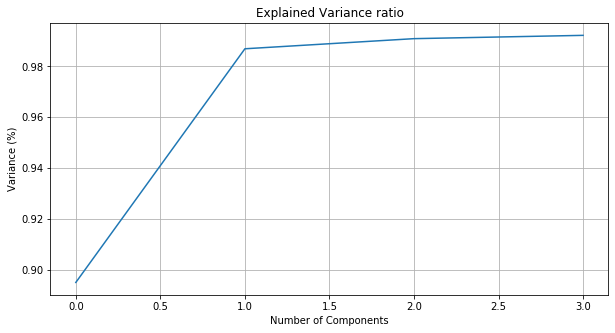

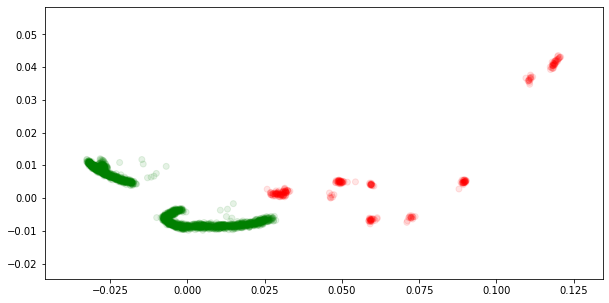

In [7]:
do_pca(df_train)

# ANN training

In [8]:
from tensorflow import keras
from tensorflow.keras import layers

def create_model(input_shape):
    model = keras.Sequential()
    model.add(layers.Dense(units=50, activation="relu", input_shape=(input_shape,)))
    model.add(layers.Dropout(0.2))
    model.add(layers.Dense(units=25, activation="relu"))
    model.add(layers.Dropout(0.2))
    model.add(layers.Dense(units=1, activation="sigmoid"))
    model.compile(optimizer="adam", loss="binary_crossentropy", metrics=["accuracy"])
    
    return model

In [9]:
from tensorflow.keras.callbacks import EarlyStopping
from sklearn.metrics import confusion_matrix, accuracy_score
from sklearn.model_selection import train_test_split

def train_model(df):    
    print("Training model")
    
    # Normalization, divide every bin value by total entries
    X = df.filter(bin_cols, axis=1).copy().div(df.entries, axis=0)
    y = df["y"]
    
    # Stratified shuffle split
    X_train, X_test, y_train, y_test = train_test_split(X, y, stratify=y, test_size=0.25)
    
    X_train = np.asarray(X_train)
    X_test = np.asarray(X_test)
    
    
    y_train = np.asarray(y_train)
    y_test = np.asarray(y_test)
    
    model = create_model(len(bin_cols))
    
    # Train
    es = EarlyStopping(monitor='loss', mode='min', patience=5, verbose=1)
    model.fit(X_train, y_train, verbose=0, 
              batch_size=150, 
              epochs=1000, 
              shuffle=True,
              callbacks=[es])
    
    # Predict
    y_pred_ = model.predict(X_test)
    y_pred = (y_pred_ > 0.5)
    
    # Validate model    
    print("Accuracy", round(accuracy_score(y_test, y_pred), 3))
    print(confusion_matrix(y_test, y_pred))    
   
    return model

In [10]:
import matplotlib.pyplot as plt

def view_lumisections(df, label, limit=3):
    
    rows, cols = divmod(limit, 3) # three plots per row
    if cols > 0:
        rows+=1
    
    fig = plt.figure(figsize=(15, rows*3))
    fig.subplots_adjust(hspace=0.4, wspace=0.4)
       
    i = 1
    for index, row in df[df['y']==label].iterrows():
        
        data = [row[col] for col in row.keys() if 'bin_' in col]
        
        # remove first and last values as those are over/under flows
        data = data[1:-1]
        
        hname = row["hname"]
        run_number = row["run"]
        ls_number = row["lumi"]
        is_good = row["good"]
        y = row["ybins"]
        x = row["xbins"]
        y_pred = row["y_pred"]
        
        ax = plt.subplot(rows, 3, i)
        
        ax.set_title("run %d, ls: %s, y_pred: %.2f" % (run_number, ls_number, y_pred))        
        ax.plot(range(len(data)), data, drawstyle='steps-pre', label=hname)
                
        i = i + 1        
        if i > limit:        
            break            
            
    if i > 1:
        plt.show()
    else:
        plt.close()

In [11]:
df_anomalies = None

def self_train(df_train, df_test, run_numbers):
    
    model = train_model(df_train)
    
    print(df_train.shape)
    
    for index, run_number in enumerate(run_numbers):
        
        print()
        print("*"*80)
        print("Classifying Run {}\n".format(run_number))
        
        # Classify new run
       
        # Dataset of a single run
        df_run = df_test[df_test["run"] == run_number].copy()
    
        if len(df_run) == 0:
            print("Run {} has no data in test dataset".format(run_number))
            continue

        # Scale each row by dividing by number of total entries within a run
        X = df_run.filter(bin_cols, axis=1).div(df_run.entries, axis=0)
        X = np.asarray(X)
        
        y_pred = model.predict(X)

        # Prediction value by ANN
        df_run["y_pred"] = y_pred
        
        # Predictions with higher probability than threshold are considered as GOOD
        df_run['y_good'] = (y_pred >= CONFIDENCE)
        # Predictions with lower probability than threshold are considered as BAD
        df_run['y_bad'] = (y_pred <= 1-CONFIDENCE)
        # Predictions between lower and higher thresholds are considered as ANOMALIES
        df_run['y_anom'] = (1-CONFIDENCE < y_pred) & (y_pred < CONFIDENCE)
        
        # Create new column y and set final label there
        df_run.loc[df_run['y_good'] == 1, 'y'] = 1
        df_run.loc[df_run['y_bad'] == 1, 'y'] = 0
        df_run.loc[df_run['y_anom'] == 1, 'y'] = 2
        df_run = df_run.astype({"y":"int32"})
        
        # Preview distribution of a single run data
        try:
            do_pca(df_run, include_elbow=False, title="Run {}".format(run_number))
        except Exception as e:
            print(e)
            print("failed to do pca for run {}".format(run_number))
        
        # Preview a subset of classified lumisections
        bad_ls = df_run[df_run['y']==0]["lumi"].tolist()
        good_ls = df_run[df_run['y']==1]["lumi"].tolist()
        anom_ls = df_run[df_run['y']==2]["lumi"].tolist()
        
        print("Good LS:", len(good_ls), sorted(good_ls))
        print("Bad LS:", len(bad_ls), sorted(bad_ls))
        print("Anomalies LS:", len(anom_ls), sorted(anom_ls))
        
        print("GOOD LS")
        view_lumisections(df_run, 1, 4)
        print("BAD LS")
        view_lumisections(df_run, 0, 6)
        print("ANOMALOUS LS")
        view_lumisections(df_run, 2, 6)
        
        # Take a subset of only anomalies (y=2)
        new_anomalies = df_run[df_run["y"]==2].copy()        
        global df_anomalies        
        if df_anomalies is None:
            df_anomalies = new_anomalies
        else:
            df_anomalies = pd.concat([df_anomalies, new_anomalies], ignore_index=True, sort=False)    
            
            
        # Take a subset of only good and bad predictions, but no anomalies
        df_confident = df_run[df_run["y"]<=1].copy()
        
        # Add new predictions to a training dataset
        df_train = pd.concat([df_train, df_confident], ignore_index=True, sort=False)
        
        
        print("Training set shape", df_train.shape)
        
        try:
            do_pca(pd.concat([df_anomalies, df_train], ignore_index=True, sort=False), 
                   include_elbow=False, title="Training set {}".format(index), 
                   save_path="{}/{}.png".format(target_dir, index))
        except Exception as e:
            print(e)
            print("failed to do pca for run {}".format(run_number))
        
        # Retrain model with extended dataset
        model = train_model(df_train)
    
    return model, df_train

In [12]:
run_numbers = sorted(list(df_test["run"].unique()))
# run_numbers = run_numbers[:10]
print(run_numbers)


[297049, 297057, 297099, 297100, 297101, 297113, 297114, 297168, 297169, 297175, 297176, 297177, 297179, 297180, 297181, 297211, 297215, 297218, 297219, 297224, 297225, 297227, 297282, 297283, 297285, 297287, 297288, 297289, 297290, 297291, 297292, 297293, 297296, 297308, 297359, 297411, 297424, 297425, 297426, 297429, 297430, 297431, 297432, 297433, 297434, 297435, 297467, 297468, 297469, 297474, 297483, 297484, 297485, 297486, 297487, 297488, 297494, 297495, 297496, 297497, 297498, 297499, 297501, 297502, 297503, 297504, 297505, 297557, 297558, 297562, 297563, 297598, 297599, 297603, 297604, 297605, 297606, 297620, 297656, 297657, 297658, 297659, 297660, 297661, 297662, 297663, 297665, 297666, 297670, 297673, 297674, 297678, 297722, 297723, 298653, 298678, 298996, 298997, 298998, 299000, 299042, 299061, 299062, 299064, 299065, 299067, 299096, 299149, 299178, 299180, 299183, 299184, 299185, 299316, 299317, 299318, 299324, 299325, 299326, 299327, 299329]


### Train ANN

Training model
Epoch 00060: early stopping
Accuracy 0.974
[[ 54  17]
 [  0 581]]
(2606, 117)

********************************************************************************
Classifying Run 297049

Explained variance ratio [0.14436087 0.14033191 0.12865562 0.11408609]


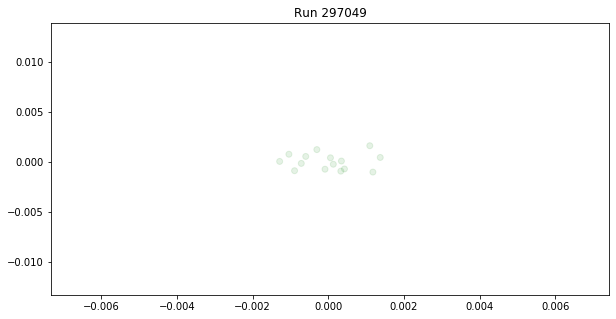

Good LS: 15 [1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15]
Bad LS: 0 []
Anomalies LS: 0 []
GOOD LS


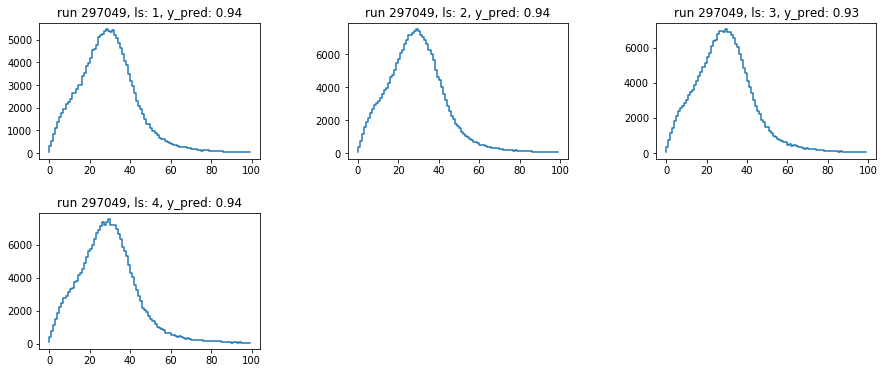

BAD LS
ANOMALOUS LS
Training set shape (2621, 121)
Explained variance ratio [0.89523068 0.09161885 0.00398712 0.00129474]


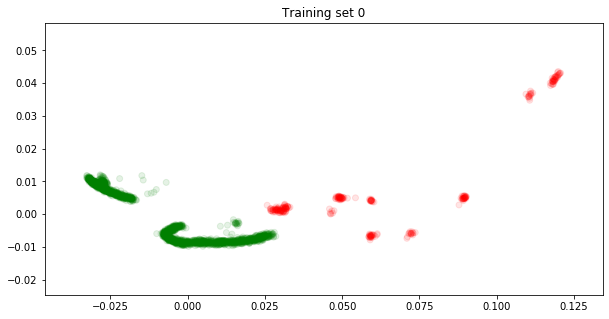

Training model
Epoch 00086: early stopping
Accuracy 0.994
[[ 67   4]
 [  0 585]]

********************************************************************************
Classifying Run 297057

Explained variance ratio [0.89894577 0.0448453  0.01241251 0.00238898]


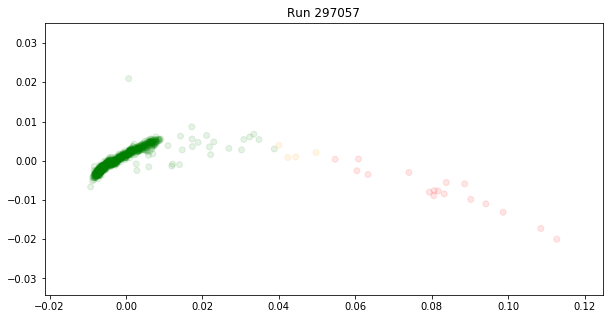

Good LS: 886 [1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92, 93, 94, 95, 96, 97, 98, 99, 100, 101, 102, 103, 104, 105, 106, 107, 108, 109, 110, 111, 112, 113, 114, 115, 116, 117, 118, 119, 120, 121, 122, 123, 124, 125, 126, 127, 128, 129, 130, 131, 132, 133, 134, 135, 136, 137, 138, 139, 140, 141, 142, 143, 144, 145, 146, 147, 148, 149, 150, 151, 152, 153, 154, 155, 156, 157, 158, 159, 160, 161, 162, 163, 164, 165, 166, 167, 168, 169, 170, 171, 172, 173, 174, 175, 176, 177, 178, 179, 180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192, 193, 194, 195, 196, 198, 199, 200, 202, 204, 205, 207, 208, 209, 210, 211, 212, 213, 214, 215, 216, 217, 218, 219, 220, 221, 222, 223,

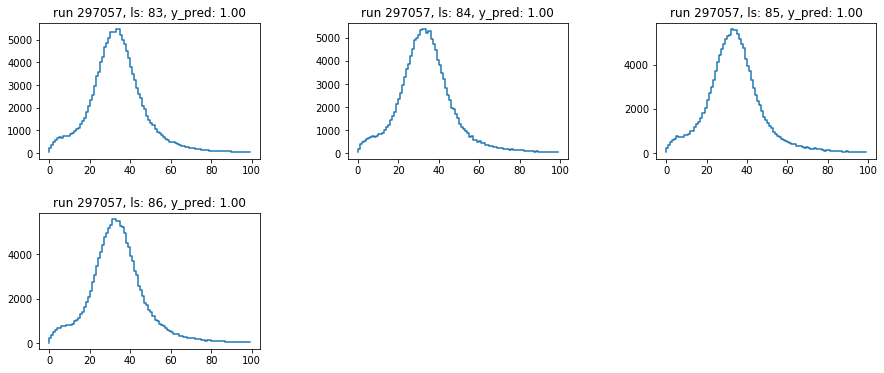

BAD LS


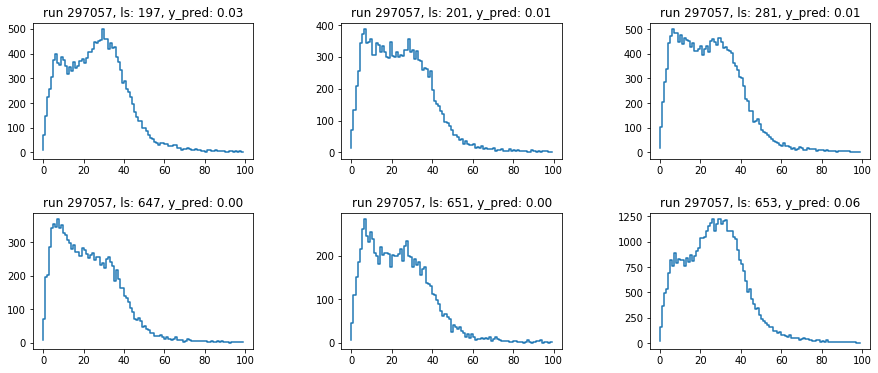

ANOMALOUS LS


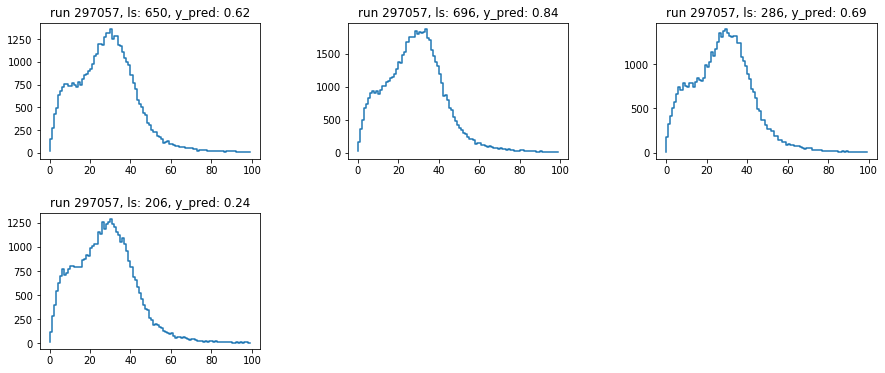

Training set shape (3524, 121)
Explained variance ratio [0.8947156  0.09020564 0.00387086 0.00128674]


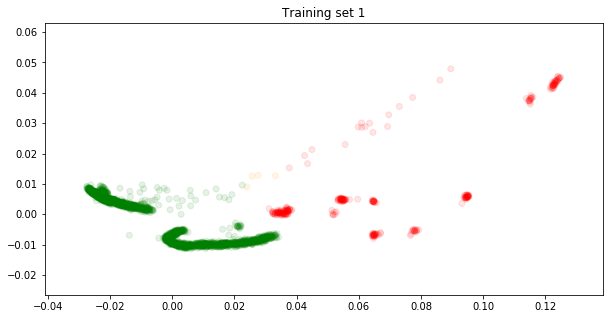

Training model
Epoch 00089: early stopping
Accuracy 0.997
[[ 72   3]
 [  0 806]]

********************************************************************************
Classifying Run 297099

Explained variance ratio [0.82535404 0.06858427 0.02886628 0.01011672]


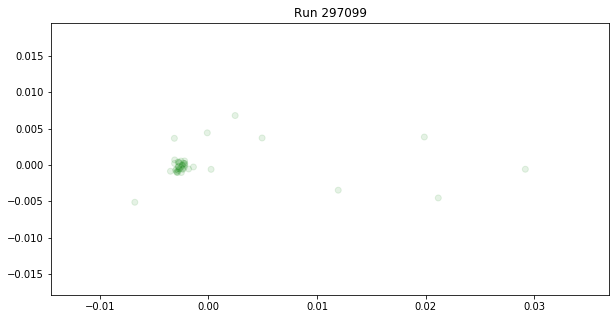

Good LS: 41 [20, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62]
Bad LS: 0 []
Anomalies LS: 0 []
GOOD LS


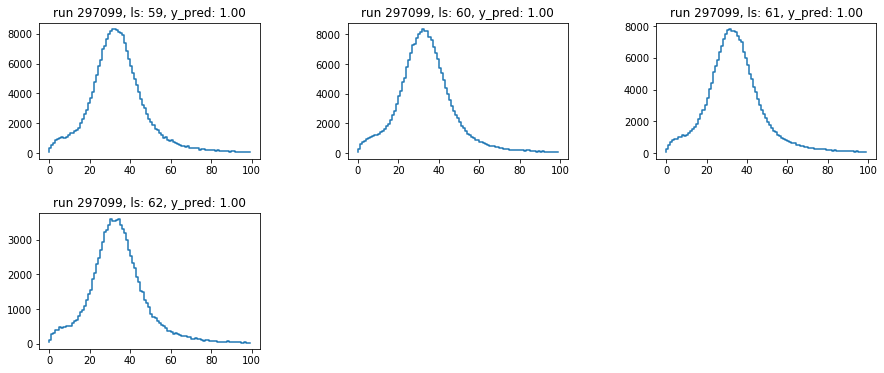

BAD LS
ANOMALOUS LS
Training set shape (3565, 121)
Explained variance ratio [0.89484009 0.08995782 0.00388795 0.00128445]


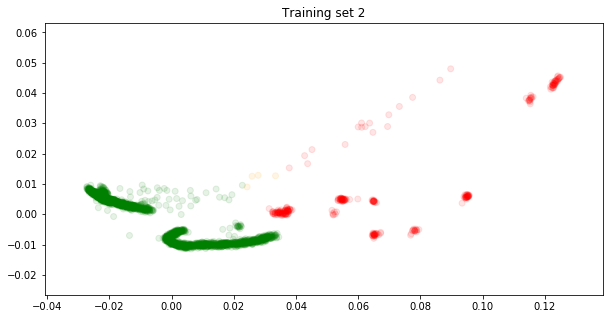

Training model
Epoch 00048: early stopping
Accuracy 0.99
[[ 66   9]
 [  0 817]]

********************************************************************************
Classifying Run 297100

Explained variance ratio [0.35384556 0.25251687 0.09188728 0.06362276]


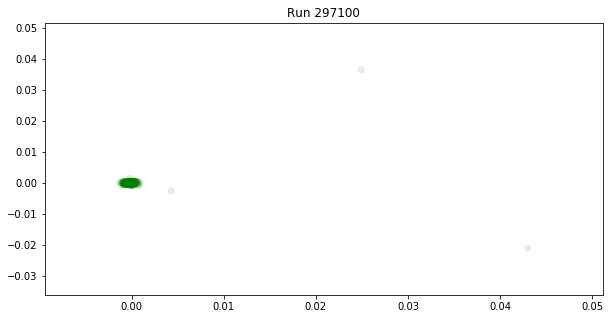

Good LS: 376 [1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92, 93, 94, 95, 96, 97, 98, 99, 100, 101, 102, 103, 104, 105, 106, 107, 108, 109, 110, 111, 112, 113, 114, 115, 116, 117, 118, 119, 120, 121, 122, 123, 124, 125, 126, 127, 128, 129, 130, 131, 132, 133, 134, 135, 136, 137, 138, 139, 140, 141, 142, 143, 144, 145, 146, 147, 148, 149, 150, 151, 152, 153, 154, 155, 156, 157, 158, 159, 160, 161, 162, 163, 164, 165, 166, 167, 168, 169, 170, 171, 172, 173, 174, 175, 176, 177, 178, 179, 180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192, 193, 194, 195, 196, 197, 198, 199, 200, 201, 202, 203, 204, 205, 206, 207, 208, 209, 210, 211, 212, 213, 214, 215, 216, 217, 218, 219,

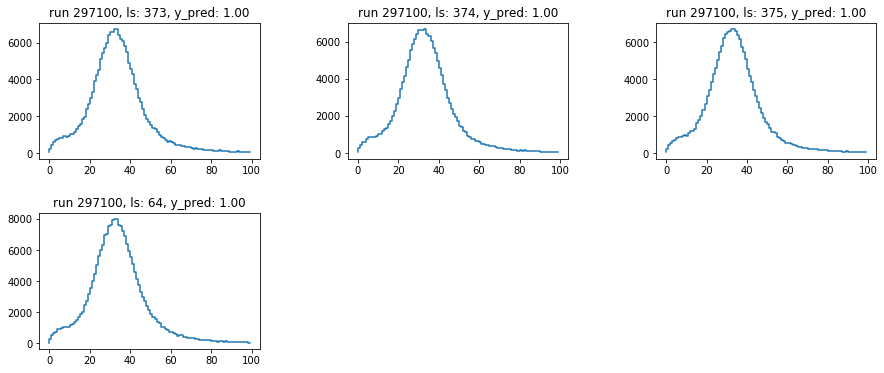

BAD LS
ANOMALOUS LS
Training set shape (3941, 121)
Explained variance ratio [0.89742176 0.08606218 0.00376562 0.00122727]


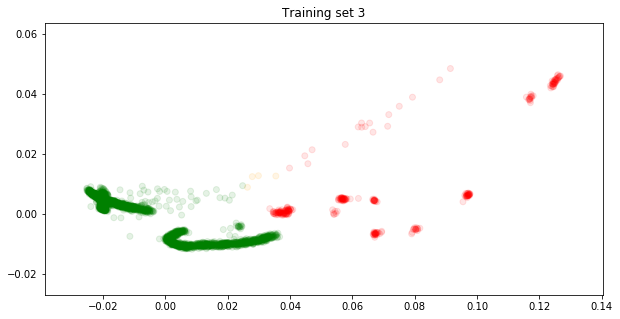

Training model
Epoch 00089: early stopping
Accuracy 1.0
[[ 75   0]
 [  0 911]]

********************************************************************************
Classifying Run 297101

Explained variance ratio [0.82395161 0.08475625 0.00396142 0.0038774 ]


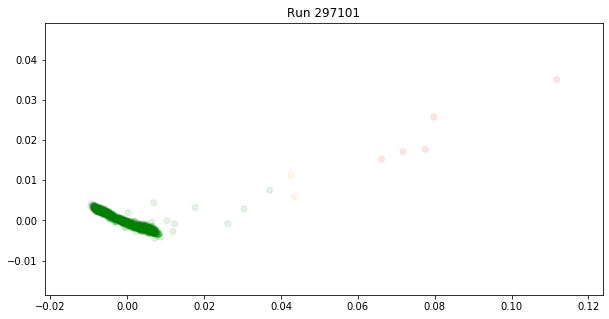

Good LS: 1095 [1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92, 93, 94, 95, 96, 97, 98, 99, 100, 101, 102, 103, 104, 105, 106, 107, 108, 109, 110, 111, 112, 113, 114, 115, 116, 117, 118, 119, 120, 121, 122, 123, 124, 125, 126, 127, 128, 129, 130, 131, 132, 133, 134, 135, 136, 137, 138, 139, 140, 141, 142, 143, 144, 145, 146, 147, 148, 149, 150, 151, 152, 153, 154, 155, 156, 157, 158, 159, 160, 161, 162, 163, 164, 165, 166, 167, 168, 169, 170, 171, 172, 173, 174, 175, 176, 177, 178, 179, 180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192, 193, 194, 195, 196, 197, 198, 199, 200, 201, 202, 203, 204, 205, 206, 207, 208, 209, 210, 211, 212, 213, 214, 215, 216, 217, 218, 219

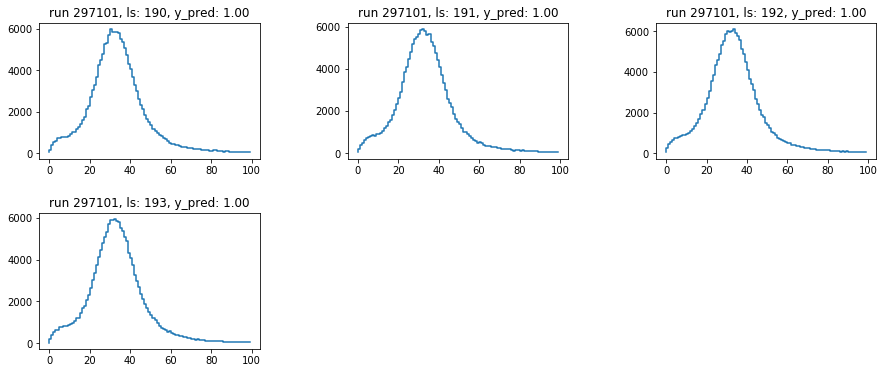

BAD LS


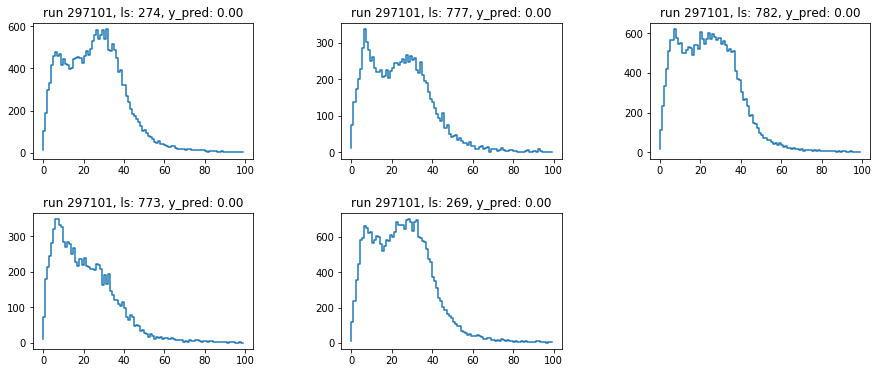

ANOMALOUS LS


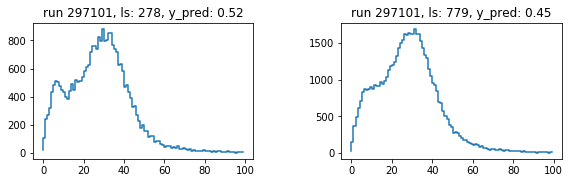

Training set shape (5041, 121)
Explained variance ratio [0.89734852 0.08261327 0.00523802 0.00148662]


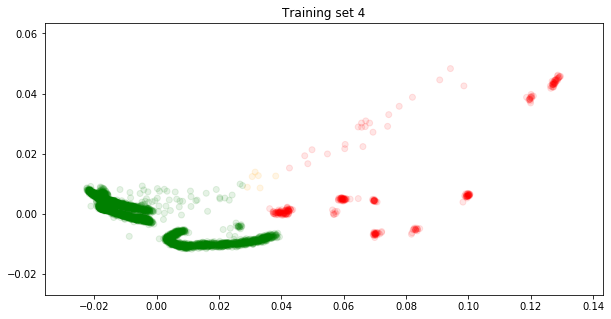

Training model
Epoch 00111: early stopping
Accuracy 1.0
[[  76    0]
 [   0 1185]]

********************************************************************************
Classifying Run 297113

Explained variance ratio [0.64772268 0.1421538  0.05741199 0.01768059]


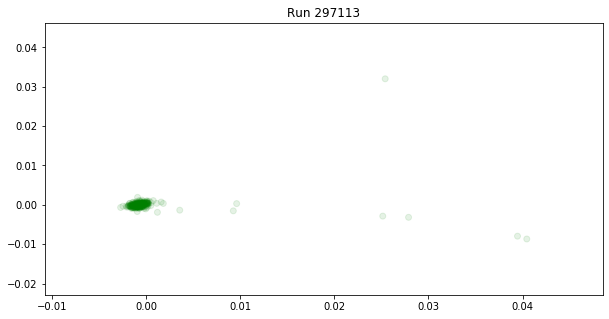

Good LS: 241 [1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92, 93, 94, 95, 96, 97, 98, 99, 100, 101, 102, 103, 104, 105, 106, 107, 108, 109, 110, 111, 112, 113, 114, 115, 116, 117, 118, 119, 120, 121, 122, 123, 124, 125, 126, 127, 128, 129, 130, 131, 132, 133, 134, 135, 136, 137, 138, 139, 140, 141, 142, 143, 144, 145, 146, 147, 148, 149, 150, 151, 152, 153, 154, 155, 156, 157, 158, 159, 160, 161, 162, 163, 164, 165, 166, 167, 168, 169, 170, 171, 172, 173, 174, 175, 176, 177, 178, 179, 180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192, 193, 194, 195, 196, 197, 198, 199, 200, 201, 202, 203, 204, 205, 206, 207, 208, 209, 210, 211, 212, 213, 214, 215, 216, 217, 218, 219,

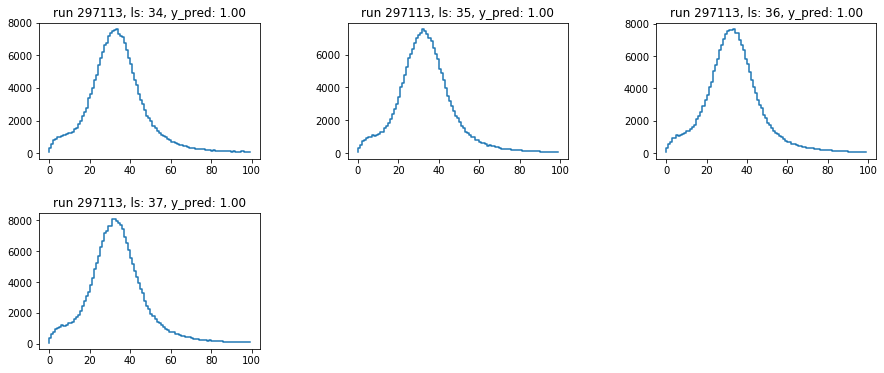

BAD LS
ANOMALOUS LS
Training set shape (5282, 121)
Explained variance ratio [0.89705341 0.08210122 0.00538363 0.0015934 ]


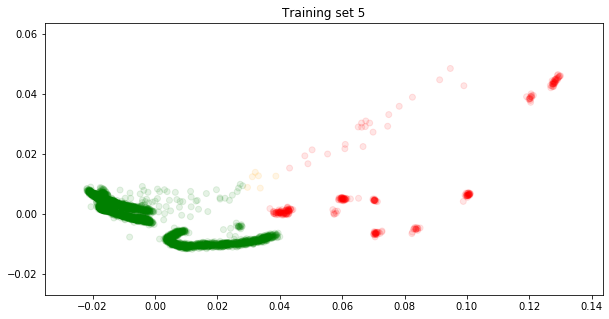

Training model
Epoch 00038: early stopping
Accuracy 0.982
[[  52   24]
 [   0 1245]]

********************************************************************************
Classifying Run 297114

Explained variance ratio [0.47187337 0.32183408 0.03316011 0.01360935]


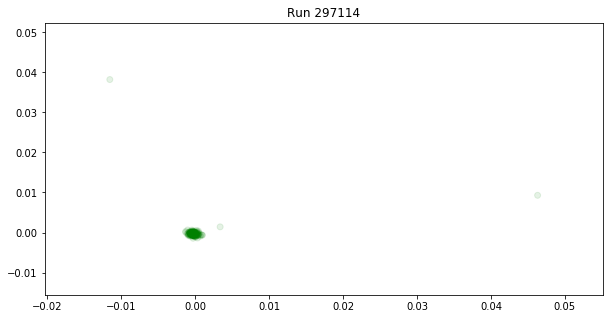

Good LS: 162 [1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92, 93, 94, 95, 96, 97, 98, 99, 100, 101, 102, 103, 104, 105, 106, 107, 108, 109, 110, 111, 112, 113, 114, 115, 116, 117, 118, 119, 120, 121, 122, 123, 124, 125, 126, 127, 128, 129, 130, 131, 132, 133, 134, 135, 136, 137, 138, 139, 140, 141, 142, 143, 144, 145, 146, 147, 148, 149, 150, 151, 152, 153, 154, 155, 156, 157, 158, 159, 160, 161, 162]
Bad LS: 0 []
Anomalies LS: 0 []
GOOD LS


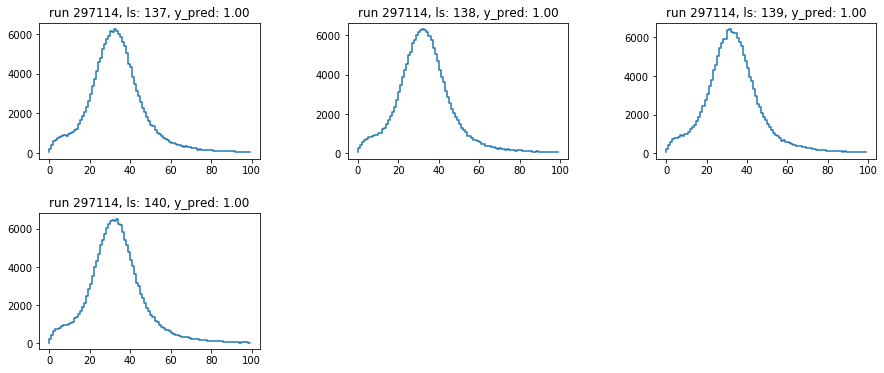

BAD LS
ANOMALOUS LS
Training set shape (5444, 121)
Explained variance ratio [0.89669698 0.08140533 0.00540619 0.00163165]


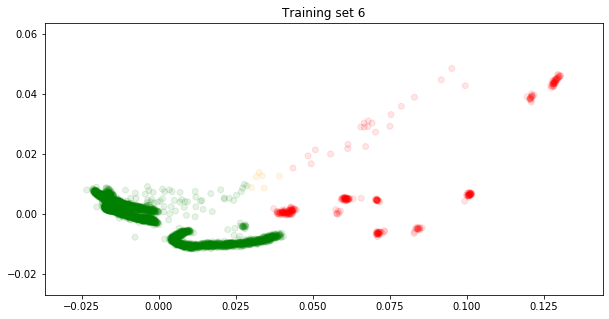

Training model
Epoch 00063: early stopping
Accuracy 0.996
[[  71    5]
 [   0 1285]]

********************************************************************************
Classifying Run 297168

Explained variance ratio [0.55080975 0.085428   0.0746647  0.04752504]


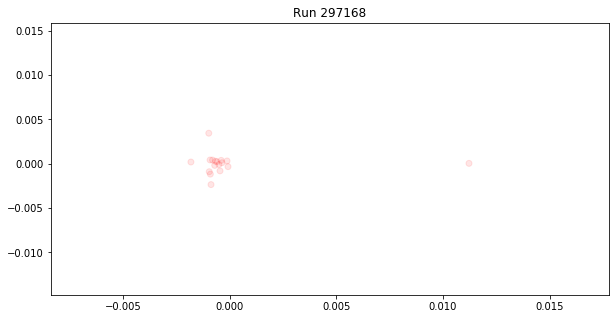

Good LS: 0 []
Bad LS: 17 [38, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56]
Anomalies LS: 0 []
GOOD LS
BAD LS


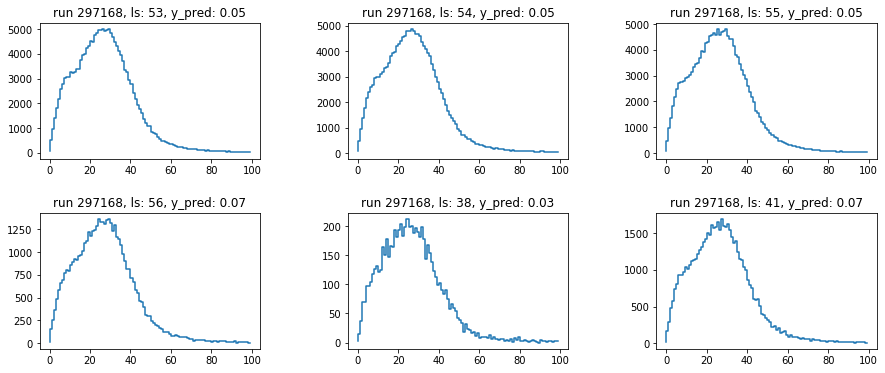

ANOMALOUS LS
Training set shape (5461, 121)
Explained variance ratio [0.89781119 0.08047711 0.00535106 0.00161465]


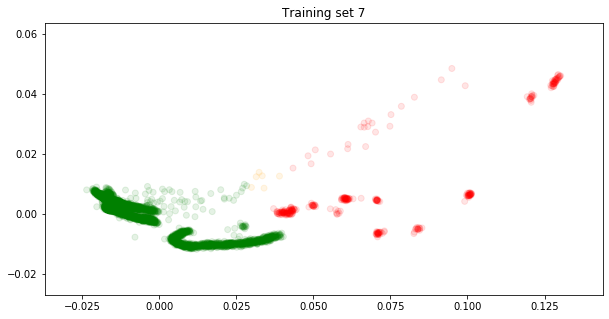

Training model
Epoch 00081: early stopping
Accuracy 0.997
[[  76    4]
 [   0 1286]]

********************************************************************************
Classifying Run 297169

Explained variance ratio [0.97722009 0.00594466 0.00466752 0.00363842]


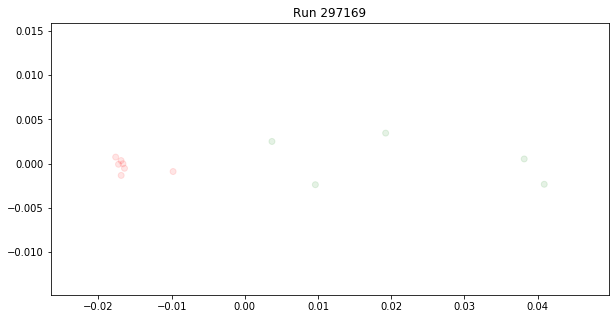

Good LS: 5 [1, 2, 3, 4, 5]
Bad LS: 7 [6, 7, 8, 9, 10, 11, 12]
Anomalies LS: 0 []
GOOD LS


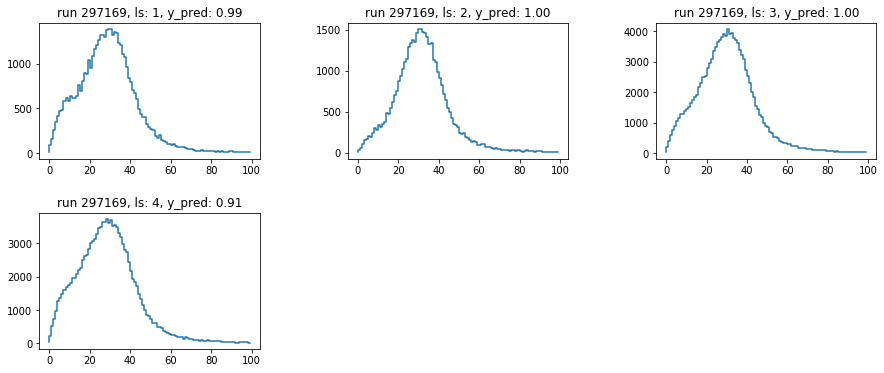

BAD LS


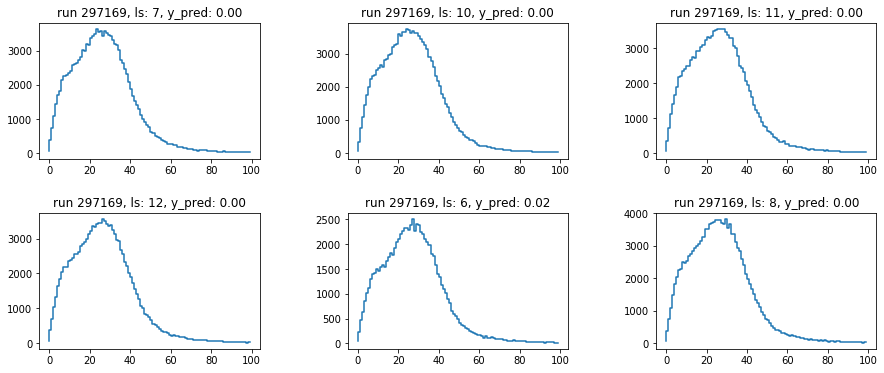

ANOMALOUS LS
Training set shape (5473, 121)
Explained variance ratio [0.8982755  0.08007621 0.00533517 0.00161345]


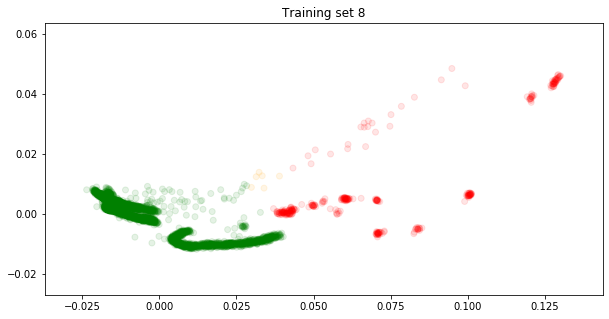

Training model
Epoch 00068: early stopping
Accuracy 0.998
[[  79    3]
 [   0 1287]]

********************************************************************************
Classifying Run 297175

Explained variance ratio [0.1877493  0.07531626 0.0524396  0.05053793]


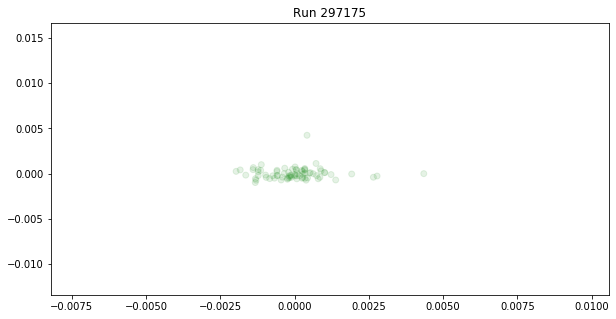

Good LS: 75 [1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75]
Bad LS: 0 []
Anomalies LS: 0 []
GOOD LS


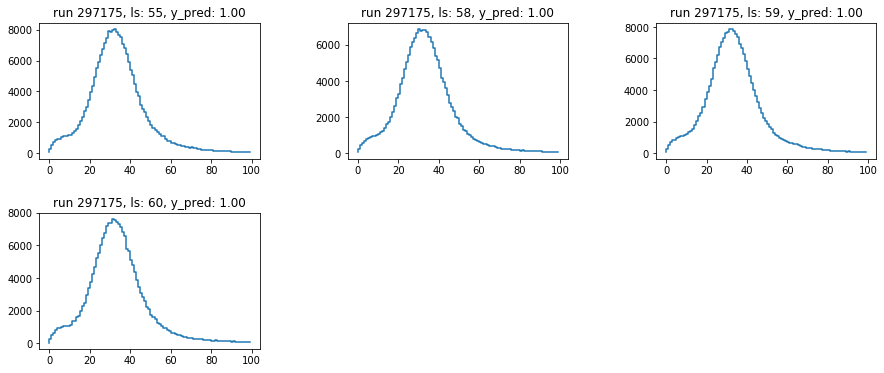

BAD LS
ANOMALOUS LS
Training set shape (5548, 121)
Explained variance ratio [0.89847966 0.07979178 0.00532227 0.00164199]


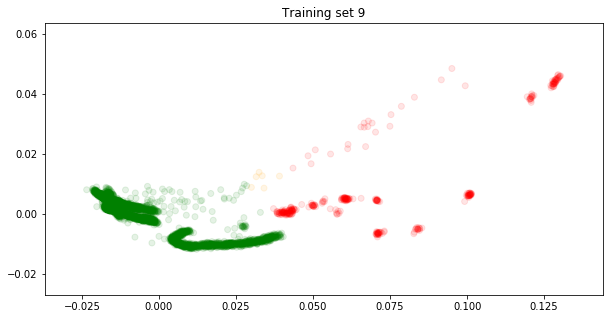

Training model
Epoch 00042: early stopping
Accuracy 0.998
[[  79    3]
 [   0 1305]]

********************************************************************************
Classifying Run 297176

Explained variance ratio [0.48156088 0.02769562 0.0261655  0.02563542]


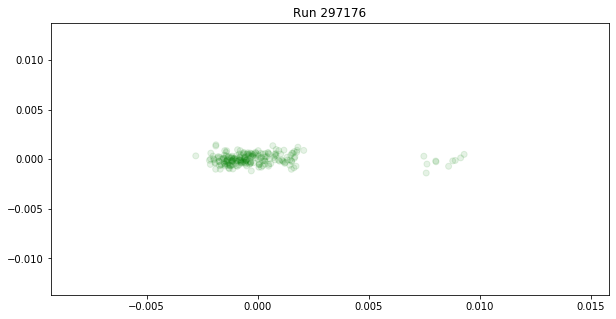

Good LS: 210 [1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92, 93, 94, 95, 96, 97, 98, 99, 100, 101, 102, 103, 104, 105, 106, 107, 108, 109, 110, 111, 112, 113, 114, 115, 116, 117, 118, 119, 120, 121, 122, 123, 124, 125, 126, 127, 128, 129, 130, 131, 132, 133, 134, 135, 136, 137, 138, 139, 140, 141, 142, 143, 144, 145, 146, 147, 148, 149, 150, 151, 152, 153, 154, 155, 156, 157, 158, 159, 160, 161, 162, 163, 164, 165, 166, 167, 168, 169, 170, 171, 172, 173, 174, 175, 176, 177, 178, 179, 180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192, 193, 194, 195, 196, 197, 198, 199, 200, 201, 202, 203, 204, 205, 206, 207, 208, 209, 210]
Bad LS: 0 []
Anomalies LS: 0 []
GOOD LS


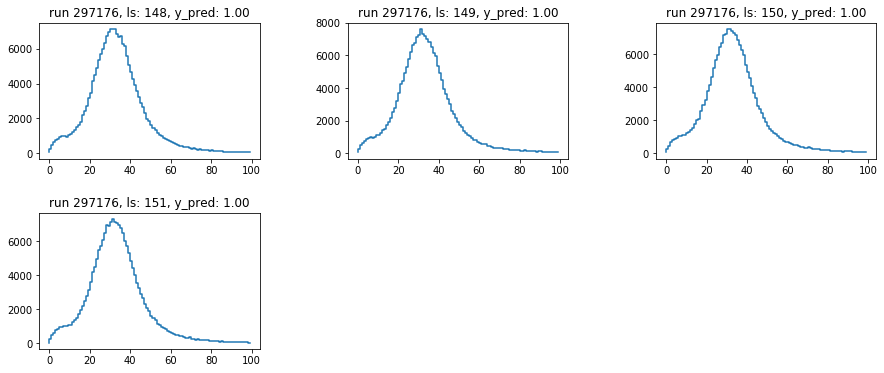

BAD LS
ANOMALOUS LS
Training set shape (5758, 121)
Explained variance ratio [0.89872494 0.07927963 0.00530272 0.00171351]


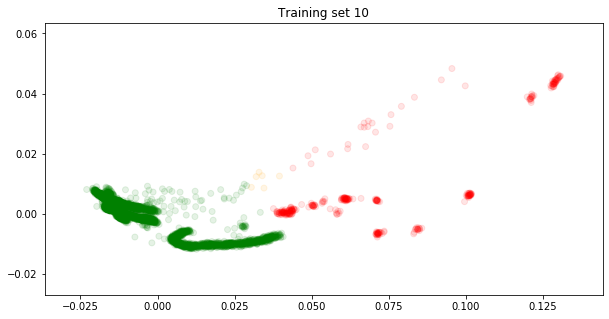

Training model
Epoch 00075: early stopping
Accuracy 0.999
[[  80    2]
 [   0 1358]]

********************************************************************************
Classifying Run 297177

Explained variance ratio [0.4741838  0.02874529 0.02729751 0.02531004]


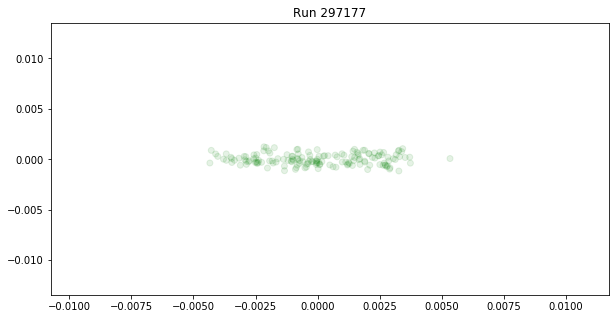

Good LS: 157 [1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92, 93, 94, 95, 96, 97, 98, 99, 100, 101, 102, 103, 104, 105, 106, 107, 108, 109, 110, 111, 112, 113, 114, 115, 116, 117, 118, 119, 120, 121, 122, 123, 124, 125, 126, 127, 128, 129, 130, 131, 132, 133, 134, 135, 136, 137, 138, 139, 140, 141, 142, 143, 144, 145, 146, 147, 148, 149, 150, 151, 152, 153, 154, 155, 156, 157]
Bad LS: 0 []
Anomalies LS: 0 []
GOOD LS


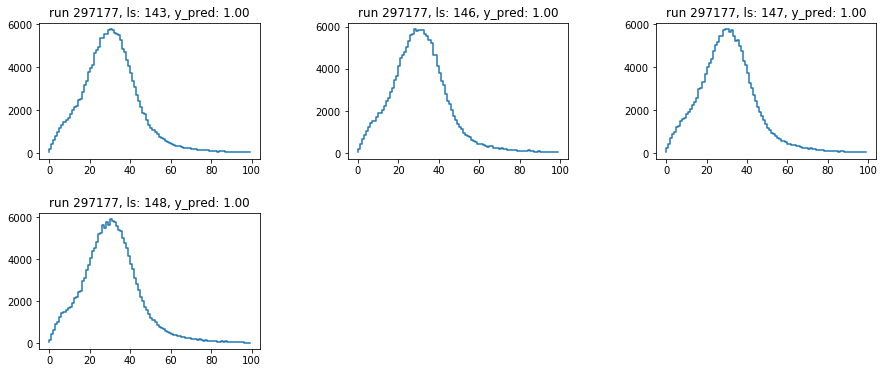

BAD LS
ANOMALOUS LS
Training set shape (5915, 121)
Explained variance ratio [0.89848994 0.07930418 0.00545504 0.00170024]


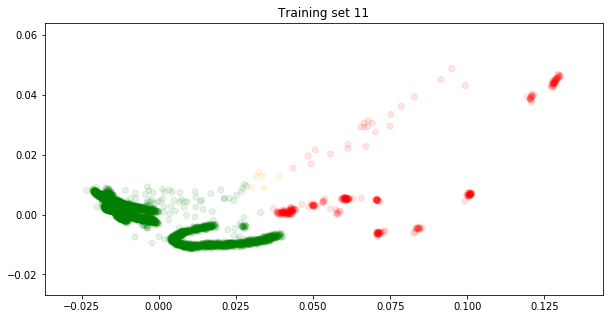

Training model
Epoch 00068: early stopping
Accuracy 0.999
[[  81    1]
 [   0 1397]]

********************************************************************************
Classifying Run 297179

Explained variance ratio [0.54050441 0.27460709 0.03176575 0.01253855]


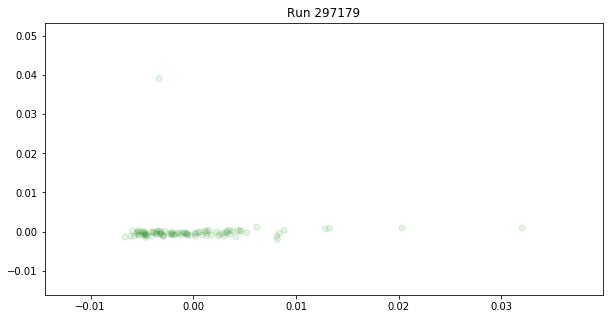

Good LS: 92 [1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92]
Bad LS: 0 []
Anomalies LS: 0 []
GOOD LS


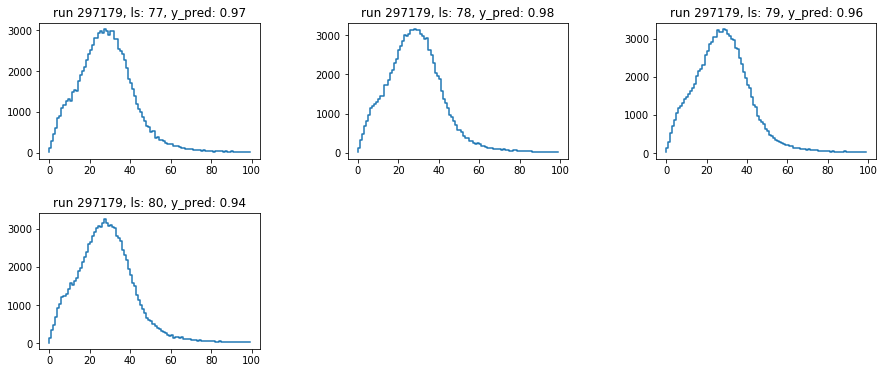

BAD LS
ANOMALOUS LS
Training set shape (6007, 121)
Explained variance ratio [0.89856143 0.0790137  0.00534889 0.00166856]


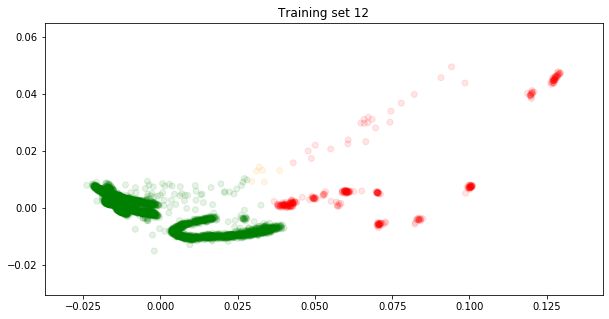

Training model
Epoch 00111: early stopping
Accuracy 1.0
[[  82    0]
 [   0 1420]]

********************************************************************************
Classifying Run 297180

Explained variance ratio [0.69982363 0.22809309 0.00457988 0.0039503 ]


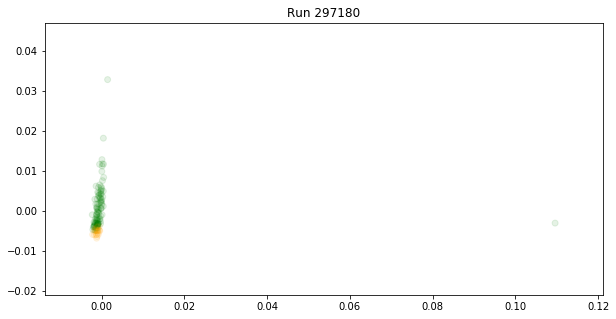

Good LS: 103 [1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 75, 76, 77, 78, 79, 80, 82, 84, 86, 87, 89, 90, 92, 93, 96, 97, 101, 103, 105, 108, 109, 110, 112, 113, 118, 121, 123, 126, 127, 129]
Bad LS: 0 []
Anomalies LS: 26 [74, 81, 83, 85, 88, 91, 94, 95, 98, 99, 100, 102, 104, 106, 107, 111, 114, 115, 116, 117, 119, 120, 122, 124, 125, 128]
GOOD LS


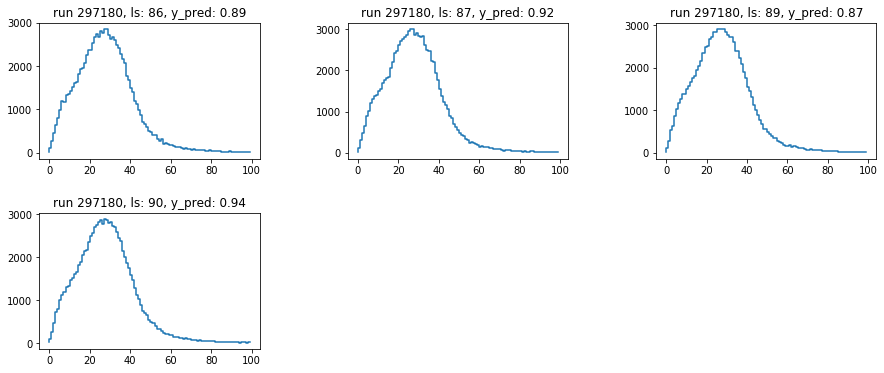

BAD LS
ANOMALOUS LS


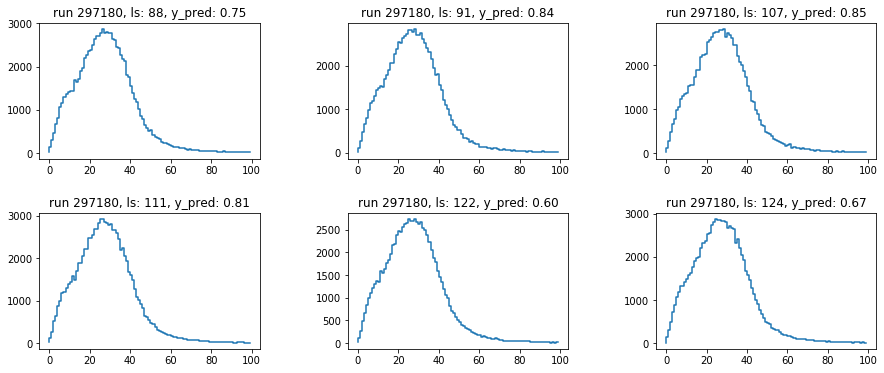

Training set shape (6110, 121)
Explained variance ratio [0.89774698 0.07738021 0.00516511 0.00338601]


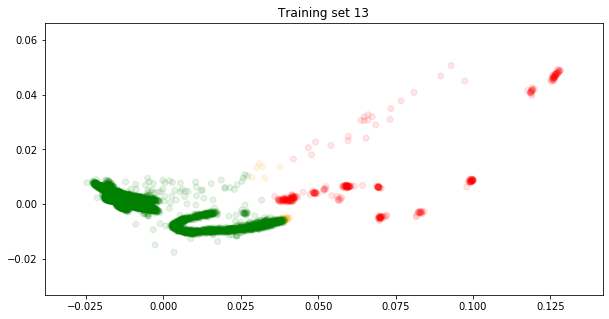

Training model
Epoch 00087: early stopping
Accuracy 0.999
[[  81    1]
 [   0 1446]]

********************************************************************************
Classifying Run 297181

Explained variance ratio [0.93511378 0.03465915 0.00560621 0.00297418]


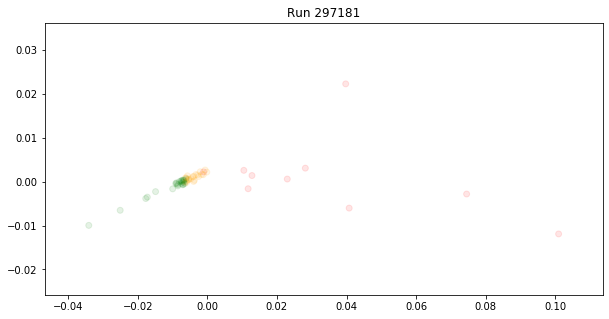

Good LS: 24 [1, 2, 3, 4, 5, 6, 7, 8, 10, 11, 12, 14, 15, 17, 18, 19, 20, 21, 22, 25, 26, 27, 51, 52]
Bad LS: 10 [38, 39, 41, 42, 43, 44, 46, 47, 53, 56]
Anomalies LS: 22 [9, 13, 16, 23, 24, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 40, 45, 48, 49, 50, 54, 55]
GOOD LS


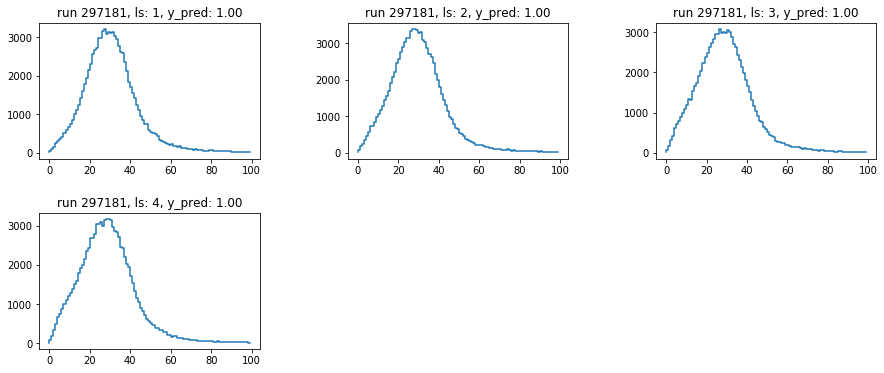

BAD LS


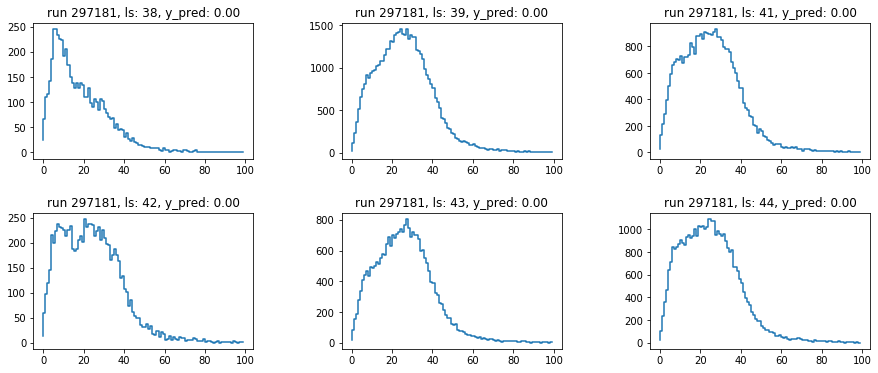

ANOMALOUS LS


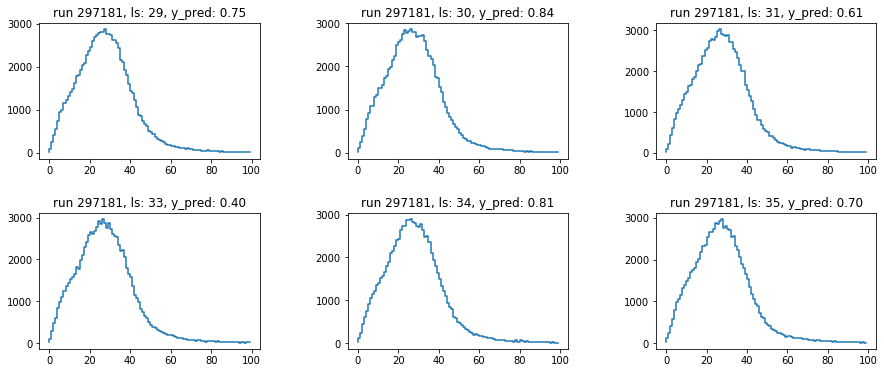

Training set shape (6144, 121)
Explained variance ratio [0.89792016 0.07750046 0.00513775 0.00328368]


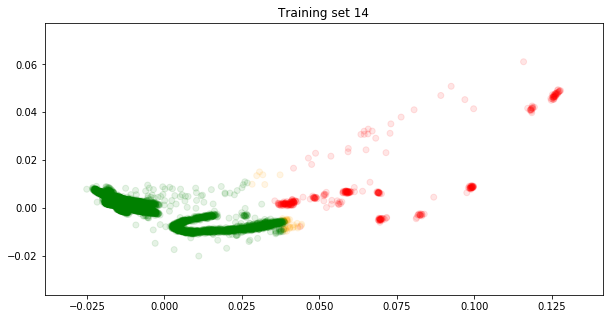

Training model
Epoch 00076: early stopping
Accuracy 0.998
[[  81    3]
 [   0 1452]]

********************************************************************************
Classifying Run 297211

Explained variance ratio [0.96300404 0.00815317 0.0070235  0.00276707]


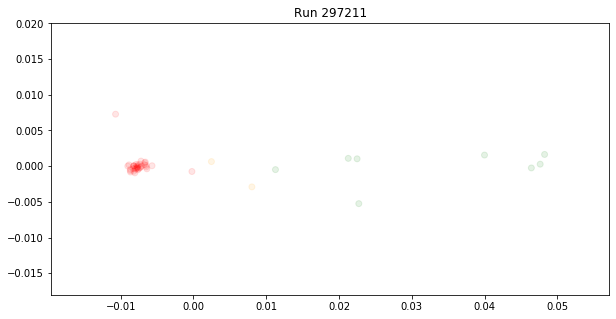

Good LS: 8 [34, 35, 36, 37, 38, 39, 40, 42]
Bad LS: 36 [28, 31, 32, 33, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75]
Anomalies LS: 2 [41, 43]
GOOD LS


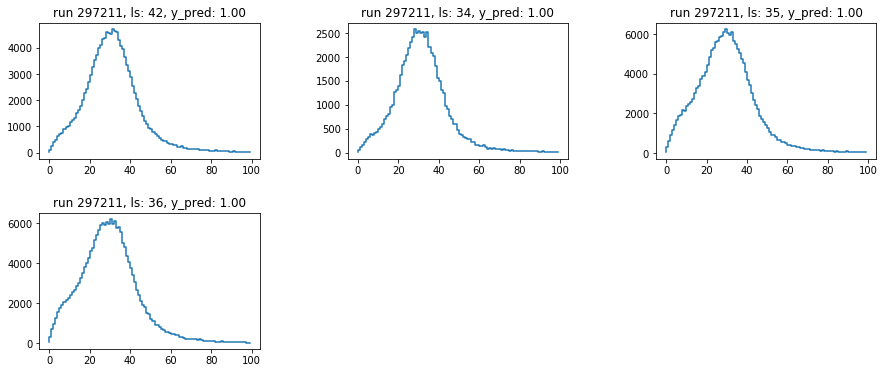

BAD LS


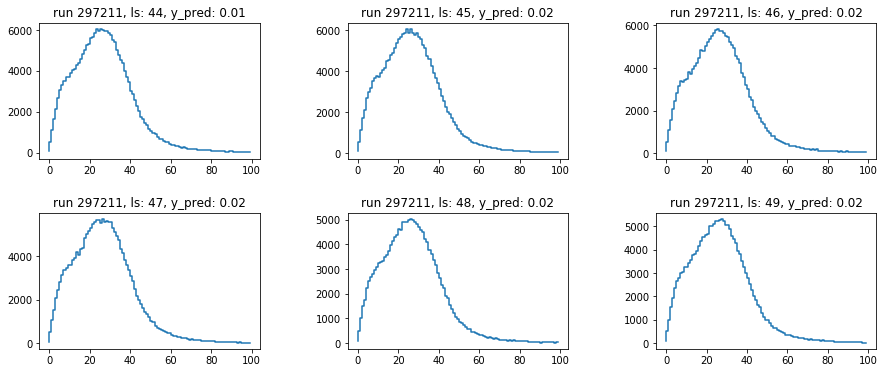

ANOMALOUS LS


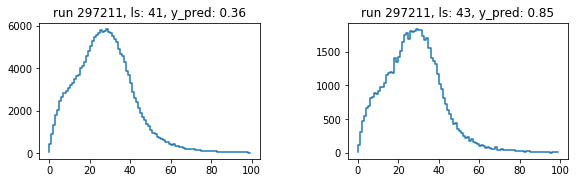

Training set shape (6188, 121)
Explained variance ratio [0.89981109 0.07598282 0.0050696  0.00321334]


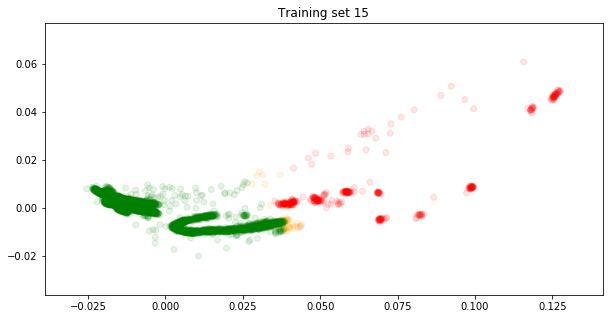

Training model
Epoch 00098: early stopping
Accuracy 0.999
[[  93    1]
 [   0 1453]]

********************************************************************************
Classifying Run 297215

Explained variance ratio [0.21977555 0.08704365 0.05397695 0.0495534 ]


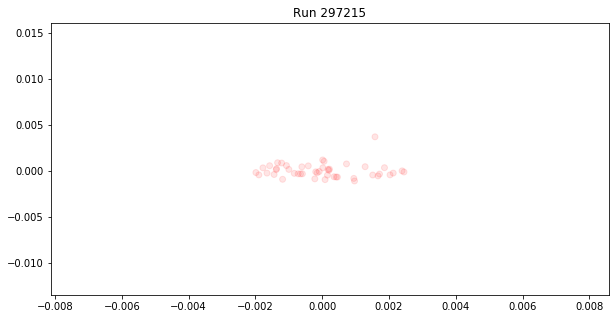

Good LS: 0 []
Bad LS: 47 [1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47]
Anomalies LS: 0 []
GOOD LS
BAD LS


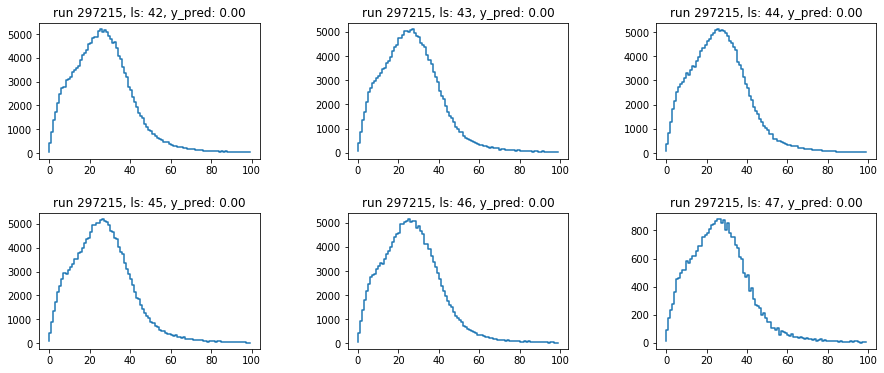

ANOMALOUS LS
Training set shape (6235, 121)
Explained variance ratio [0.90244003 0.07392522 0.00495418 0.00312516]


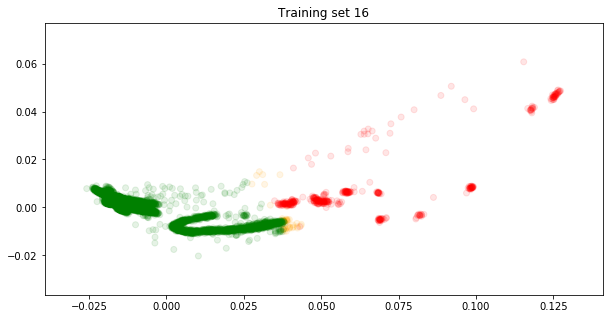

Training model
Epoch 00084: early stopping
Accuracy 0.999
[[ 103    2]
 [   0 1454]]

********************************************************************************
Classifying Run 297218

Explained variance ratio [0.22387065 0.1371262  0.11567247 0.08958345]


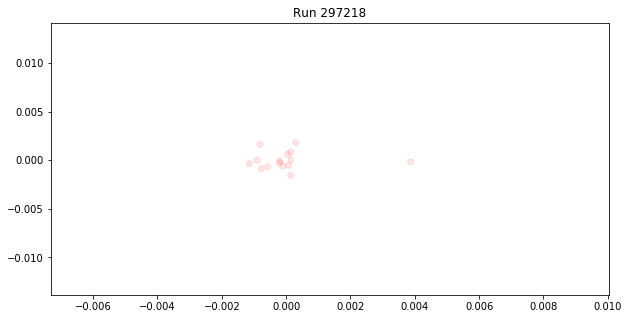

Good LS: 0 []
Bad LS: 15 [1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15]
Anomalies LS: 0 []
GOOD LS
BAD LS


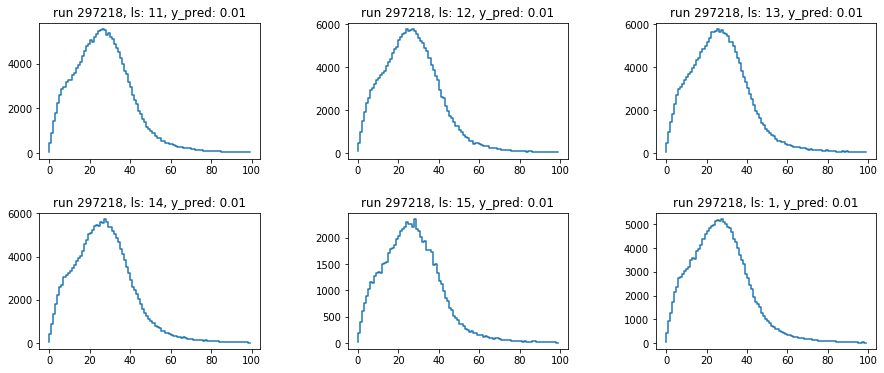

ANOMALOUS LS
Training set shape (6250, 121)
Explained variance ratio [0.9031375  0.07337287 0.00492731 0.00310214]


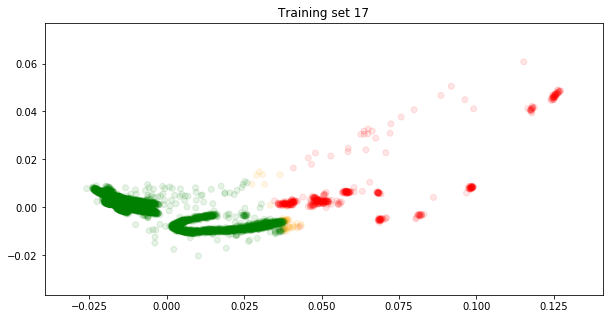

Training model
Epoch 00087: early stopping
Accuracy 1.0
[[ 109    0]
 [   0 1454]]

********************************************************************************
Classifying Run 297219

Explained variance ratio [0.85717917 0.10737877 0.0043606  0.00419314]


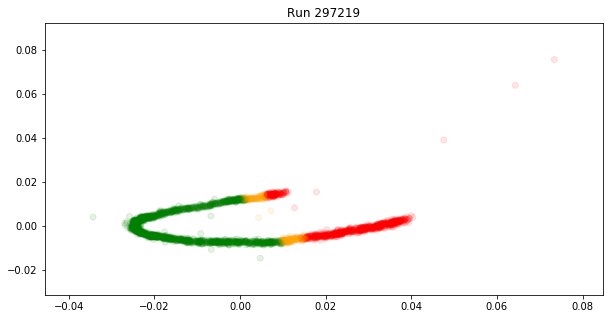

Good LS: 1632 [65, 66, 67, 186, 190, 192, 193, 194, 195, 196, 197, 199, 201, 202, 203, 204, 205, 206, 207, 208, 209, 210, 211, 212, 213, 214, 215, 216, 217, 218, 219, 220, 221, 222, 223, 224, 225, 226, 227, 228, 229, 230, 231, 232, 233, 234, 235, 237, 241, 242, 243, 244, 245, 246, 247, 248, 253, 254, 258, 260, 261, 262, 263, 264, 265, 266, 267, 268, 269, 270, 271, 272, 273, 274, 275, 276, 277, 278, 279, 280, 281, 282, 284, 285, 286, 287, 288, 289, 290, 291, 292, 293, 294, 295, 296, 297, 298, 299, 300, 301, 302, 303, 304, 305, 306, 307, 308, 309, 310, 311, 312, 313, 314, 315, 316, 317, 318, 319, 320, 321, 322, 323, 324, 325, 326, 327, 328, 329, 330, 331, 332, 333, 334, 335, 336, 337, 338, 339, 340, 341, 342, 343, 344, 345, 346, 347, 348, 349, 350, 351, 352, 353, 354, 355, 356, 357, 358, 359, 360, 361, 362, 363, 364, 365, 366, 367, 368, 369, 370, 371, 372, 373, 374, 375, 376, 377, 378, 379, 380, 381, 382, 383, 384, 385, 386, 387, 388, 389, 390, 391, 392, 393, 394, 395, 396, 397, 398, 399

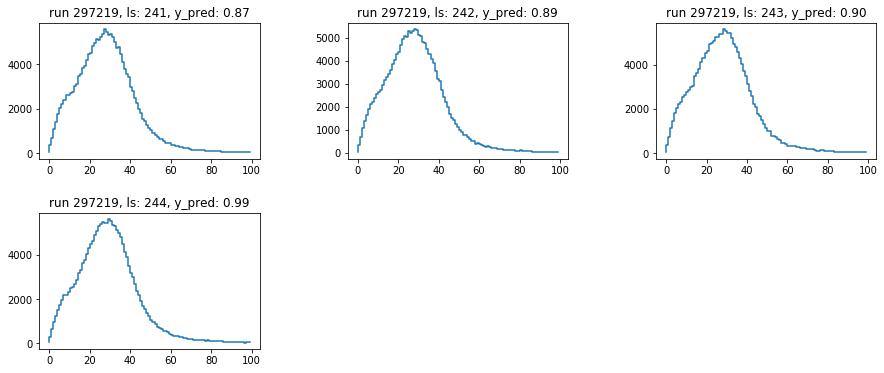

BAD LS


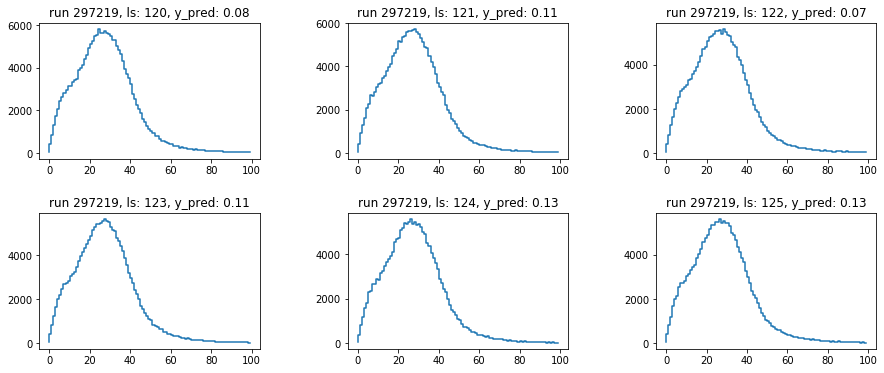

ANOMALOUS LS


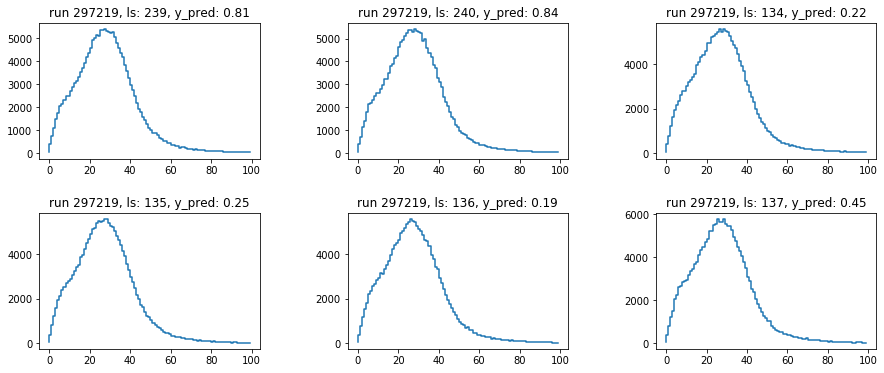

Training set shape (8669, 121)
Explained variance ratio [0.89426105 0.08690604 0.00331123 0.00178852]


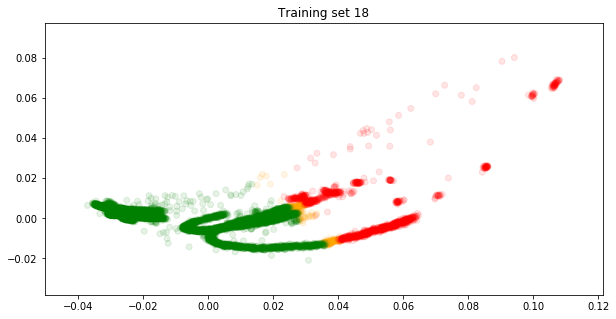

Training model
Epoch 00096: early stopping
Accuracy 1.0
[[ 305    1]
 [   0 1862]]

********************************************************************************
Classifying Run 297224

Explained variance ratio [0.5561194  0.09197242 0.02400348 0.02124969]


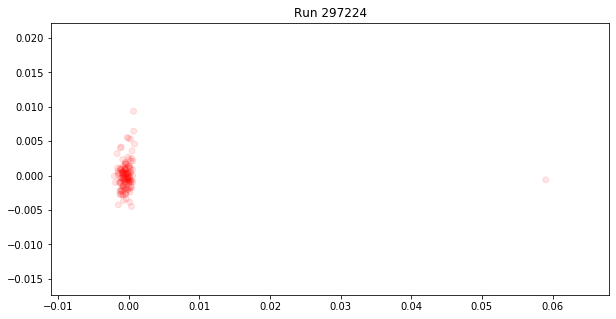

Good LS: 0 []
Bad LS: 138 [1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92, 93, 94, 95, 96, 97, 98, 99, 100, 101, 102, 103, 104, 105, 106, 107, 108, 109, 110, 111, 112, 113, 114, 115, 116, 117, 118, 119, 120, 121, 122, 123, 124, 125, 126, 127, 128, 129, 130, 131, 132, 133, 134, 135, 136, 137, 138]
Anomalies LS: 0 []
GOOD LS
BAD LS


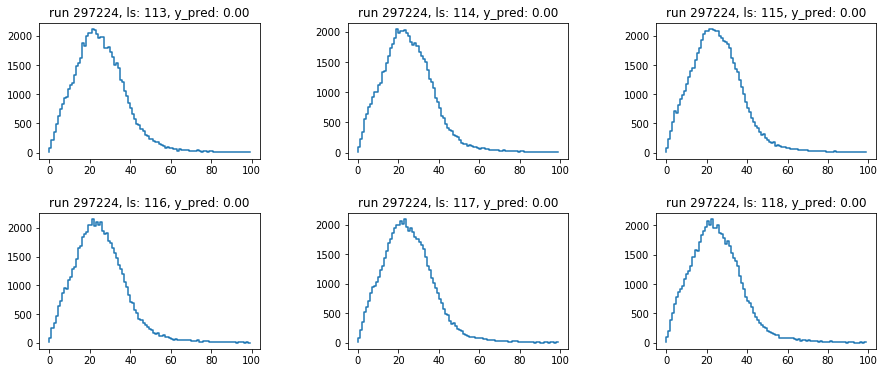

ANOMALOUS LS
Training set shape (8807, 121)
Explained variance ratio [0.89778835 0.08338527 0.00321457 0.00172999]


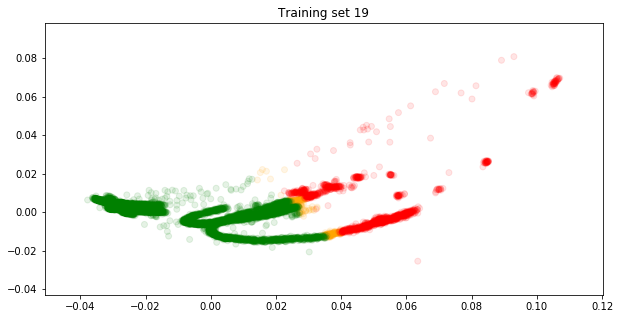

Training model
Epoch 00075: early stopping
Accuracy 0.999
[[ 337    3]
 [   0 1862]]

********************************************************************************
Classifying Run 297225

Explained variance ratio [0.32839863 0.09315074 0.06844678 0.05980532]


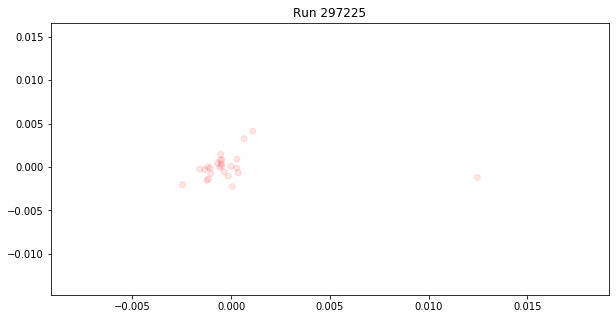

Good LS: 0 []
Bad LS: 25 [1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25]
Anomalies LS: 0 []
GOOD LS
BAD LS


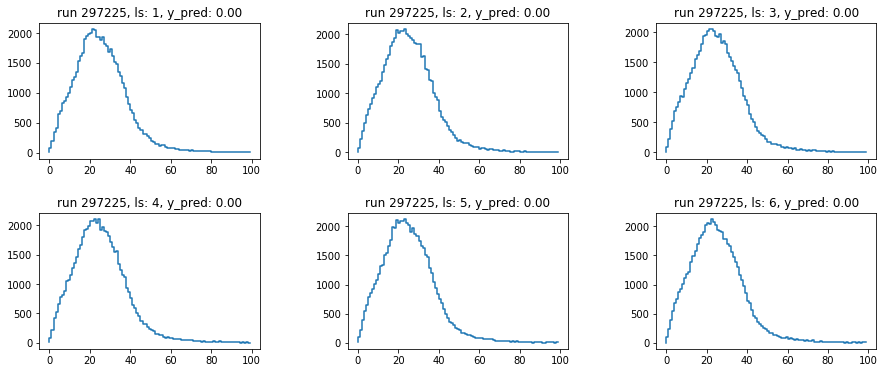

ANOMALOUS LS
Training set shape (8832, 121)
Explained variance ratio [0.8985153  0.08271027 0.00319969 0.00171652]


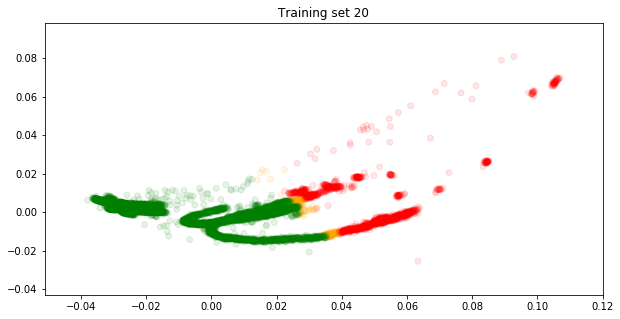

Training model
Epoch 00108: early stopping
Accuracy 1.0
[[ 346    0]
 [   0 1862]]

********************************************************************************
Classifying Run 297227

Explained variance ratio [0.9202875  0.02036456 0.0061848  0.00349785]


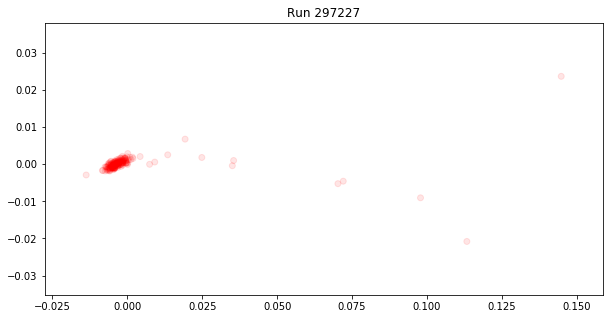

Good LS: 0 []
Bad LS: 193 [1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92, 93, 94, 95, 96, 97, 98, 99, 100, 101, 102, 103, 104, 105, 106, 107, 108, 109, 110, 111, 112, 113, 114, 115, 116, 117, 118, 119, 120, 121, 122, 123, 124, 125, 126, 127, 128, 129, 130, 131, 132, 133, 134, 135, 136, 137, 138, 139, 140, 141, 142, 143, 144, 145, 146, 147, 148, 149, 150, 151, 152, 153, 154, 155, 156, 157, 158, 159, 160, 161, 162, 163, 164, 165, 166, 167, 168, 169, 170, 171, 172, 173, 174, 175, 176, 177, 178, 179, 180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192, 193]
Anomalies LS: 0 []
GOOD LS
BAD LS


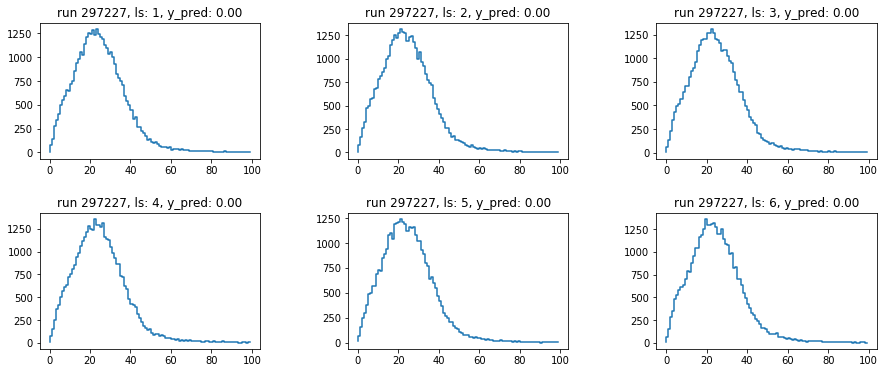

ANOMALOUS LS
Training set shape (9025, 121)
Explained variance ratio [0.90083468 0.08083258 0.00323004 0.00160028]


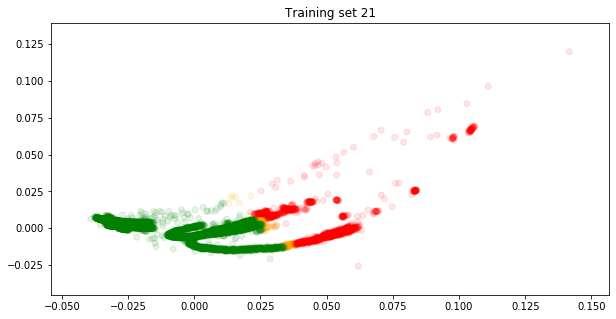

Training model
Epoch 00089: early stopping
Accuracy 1.0
[[ 395    0]
 [   1 1861]]

********************************************************************************
Classifying Run 297282

Explained variance ratio [0.48807875 0.09152552 0.06316792 0.05832288]


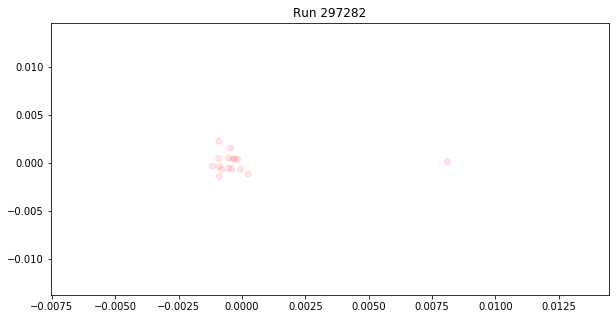

Good LS: 0 []
Bad LS: 16 [1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16]
Anomalies LS: 0 []
GOOD LS
BAD LS


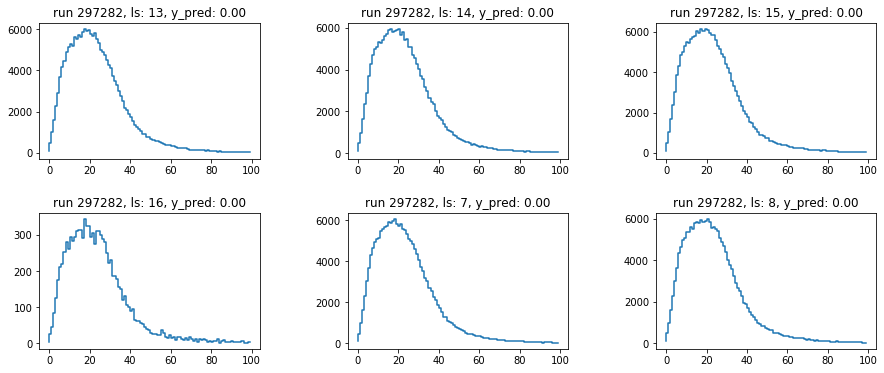

ANOMALOUS LS
Training set shape (9041, 121)
Explained variance ratio [0.90087879 0.08083861 0.00326383 0.00158807]


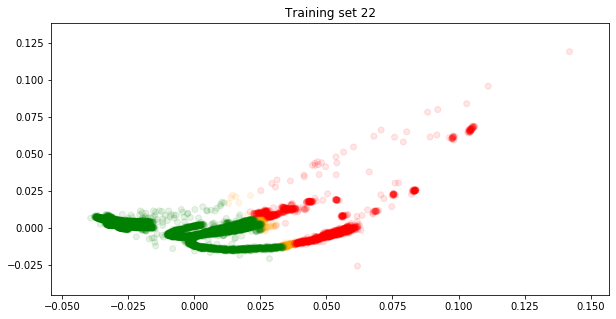

Training model
Epoch 00100: early stopping
Accuracy 1.0
[[ 399    0]
 [   0 1862]]

********************************************************************************
Classifying Run 297283

Explained variance ratio [0.16521814 0.13602566 0.12120337 0.11091802]


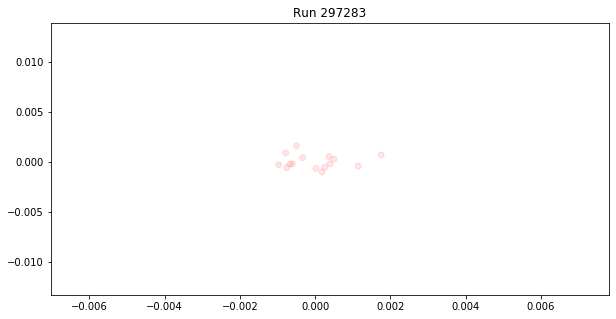

Good LS: 0 []
Bad LS: 15 [1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15]
Anomalies LS: 0 []
GOOD LS
BAD LS


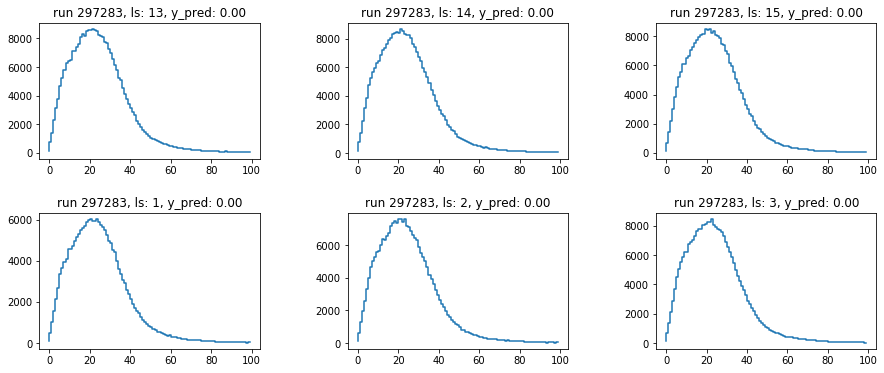

ANOMALOUS LS
Training set shape (9056, 121)
Explained variance ratio [0.90116582 0.08062348 0.0032666  0.00157932]


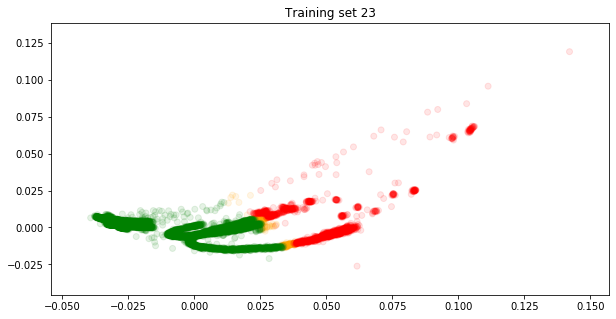

Training model
Epoch 00078: early stopping
Accuracy 1.0
[[ 403    0]
 [   0 1861]]

********************************************************************************
Classifying Run 297285

Explained variance ratio [0.98345093 0.00781884 0.00234876 0.00170219]


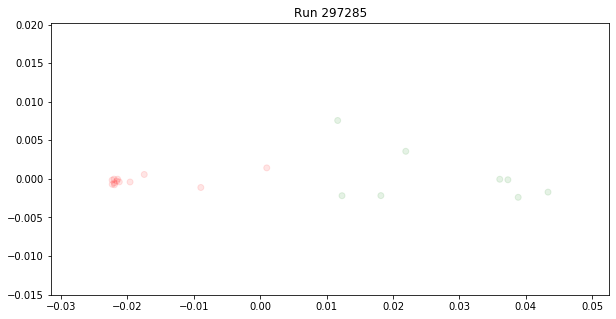

Good LS: 8 [4, 5, 7, 8, 10, 11, 12, 13]
Bad LS: 12 [1, 2, 3, 6, 9, 14, 15, 16, 17, 18, 19, 20]
Anomalies LS: 0 []
GOOD LS


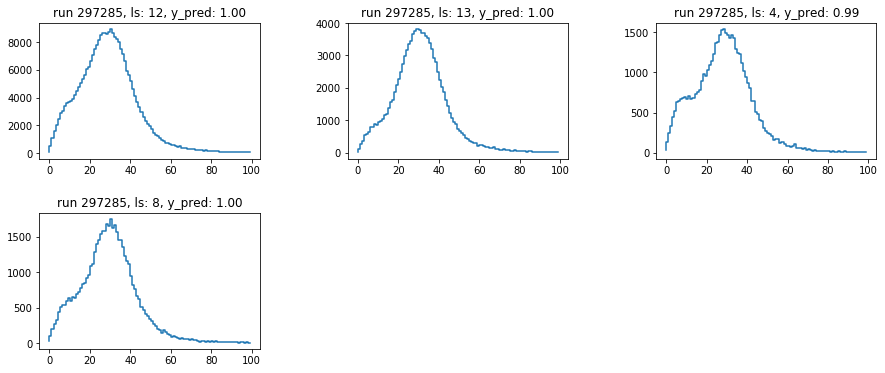

BAD LS


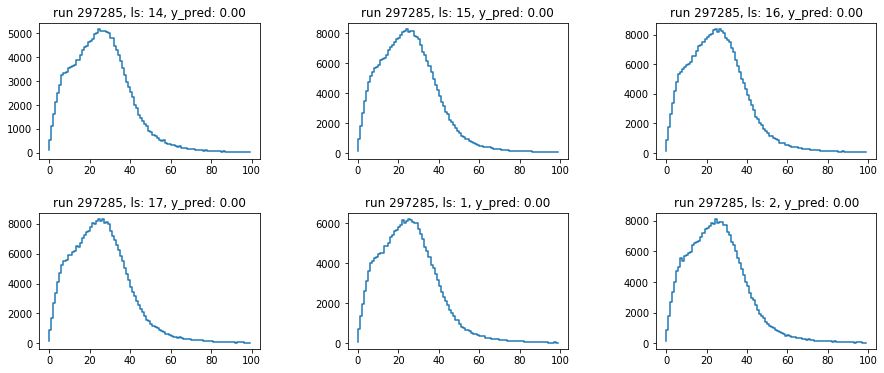

ANOMALOUS LS
Training set shape (9076, 121)
Explained variance ratio [0.90107175 0.08072698 0.00327403 0.00157688]


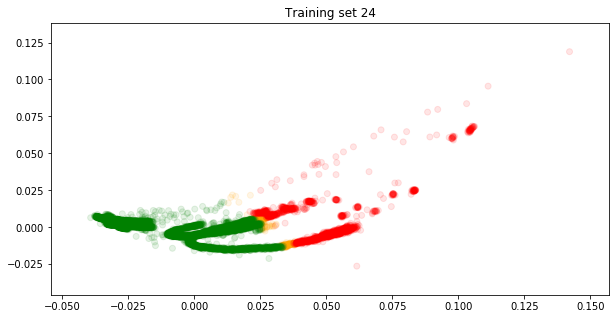

Training model
Epoch 00083: early stopping
Accuracy 1.0
[[ 405    1]
 [   0 1863]]

********************************************************************************
Classifying Run 297287

Explained variance ratio [0.5404742  0.07432947 0.06567407 0.05254541]


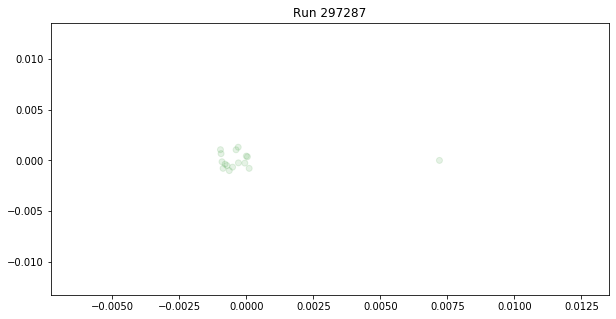

Good LS: 16 [1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16]
Bad LS: 0 []
Anomalies LS: 0 []
GOOD LS


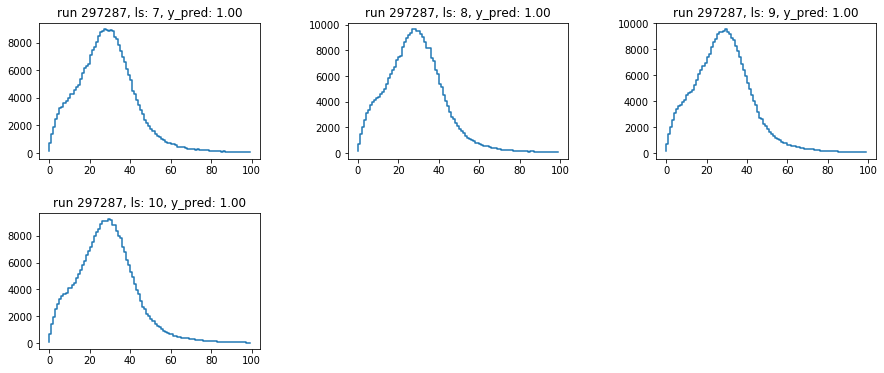

BAD LS
ANOMALOUS LS
Training set shape (9092, 121)
Explained variance ratio [0.90103709 0.08075422 0.00327334 0.00157626]


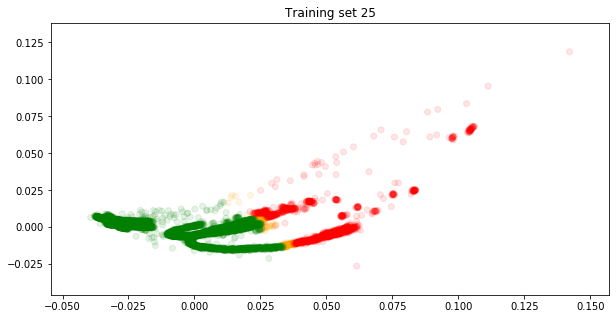

Training model
Epoch 00079: early stopping
Accuracy 1.0
[[ 405    0]
 [   0 1868]]

********************************************************************************
Classifying Run 297288

Explained variance ratio [0.17608653 0.14280351 0.12881575 0.10372949]


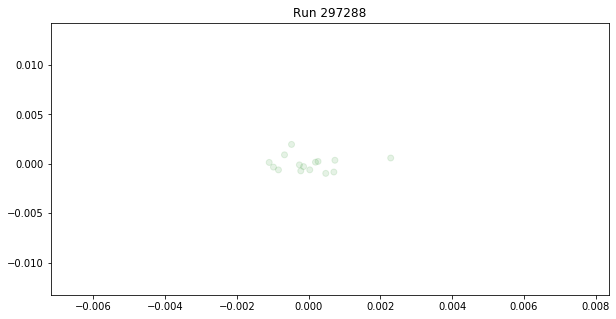

Good LS: 15 [1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15]
Bad LS: 0 []
Anomalies LS: 0 []
GOOD LS


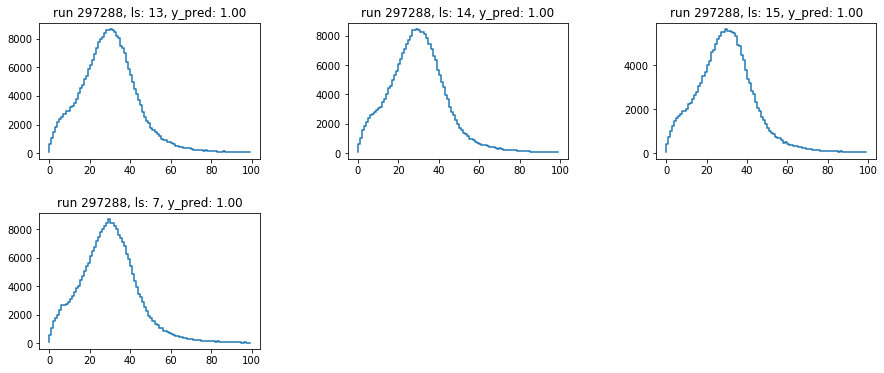

BAD LS
ANOMALOUS LS
Training set shape (9107, 121)
Explained variance ratio [0.90100521 0.08077783 0.00327355 0.00157642]


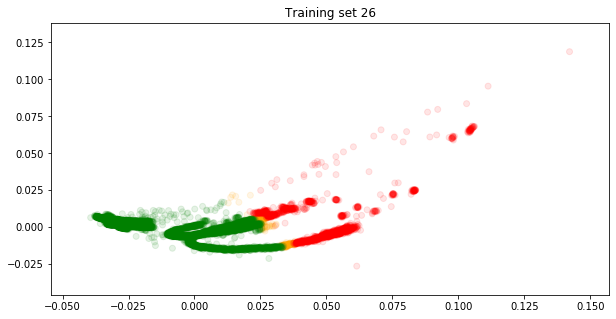

Training model
Epoch 00091: early stopping
Accuracy 1.0
[[ 406    0]
 [   1 1870]]

********************************************************************************
Classifying Run 297289

Explained variance ratio [0.22518064 0.1435798  0.11241329 0.08491791]


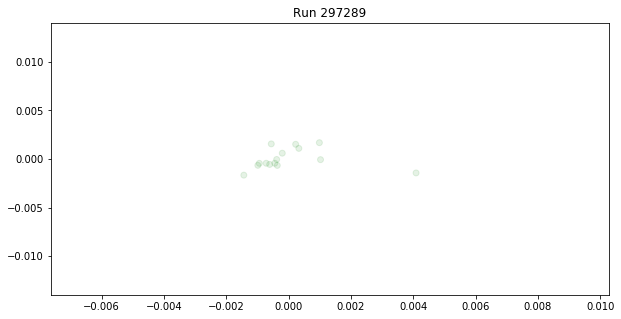

Good LS: 15 [1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15]
Bad LS: 0 []
Anomalies LS: 0 []
GOOD LS


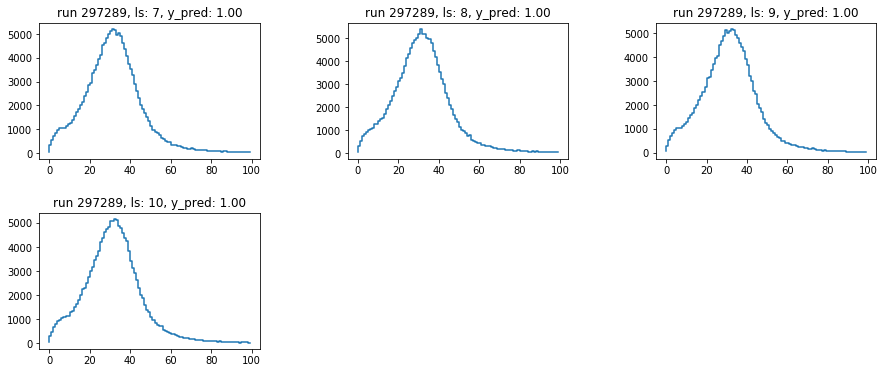

BAD LS
ANOMALOUS LS
Training set shape (9122, 121)
Explained variance ratio [0.90097766 0.08078102 0.00327938 0.00157689]


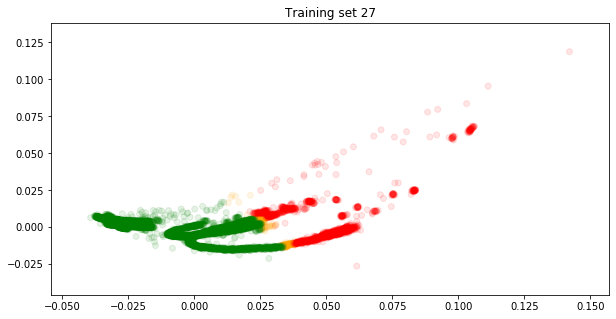

Training model
Epoch 00076: early stopping
Accuracy 1.0
[[ 406    0]
 [   0 1875]]

********************************************************************************
Classifying Run 297290

Explained variance ratio [0.70085004 0.0752365  0.04031927 0.03329943]


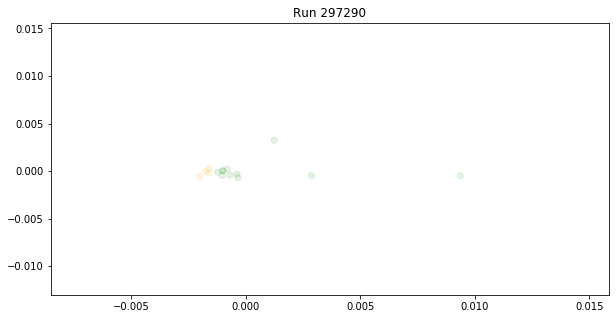

Good LS: 11 [1, 2, 5, 7, 9, 10, 11, 12, 13, 14, 15]
Bad LS: 0 []
Anomalies LS: 4 [3, 4, 6, 8]
GOOD LS


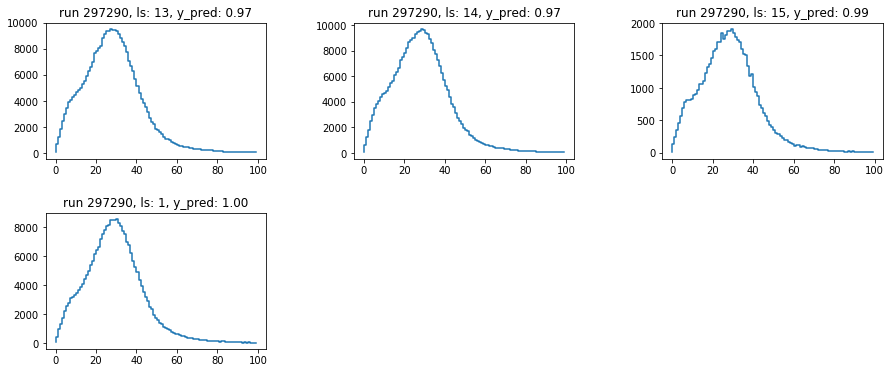

BAD LS
ANOMALOUS LS


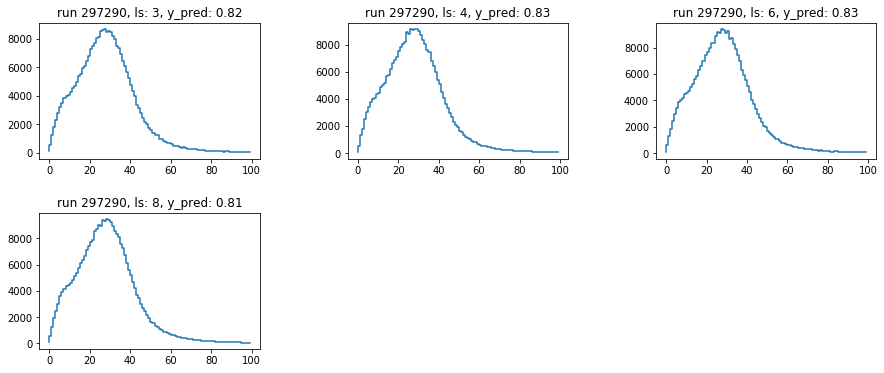

Training set shape (9133, 121)
Explained variance ratio [0.9009959  0.08076575 0.00327723 0.00157645]


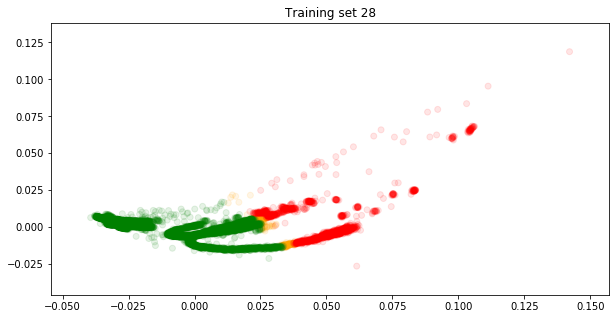

Training model
Epoch 00081: early stopping
Accuracy 1.0
[[ 405    1]
 [   0 1878]]

********************************************************************************
Classifying Run 297291

Explained variance ratio [0.1729952  0.134933   0.11129879 0.08645673]


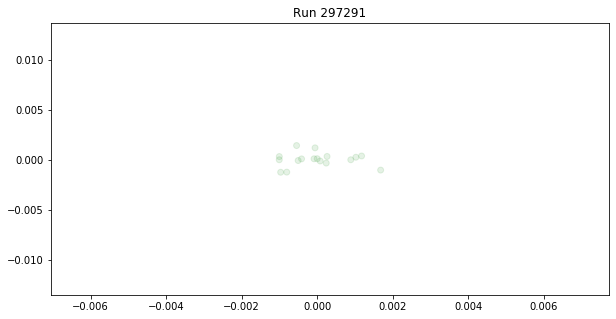

Good LS: 17 [1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17]
Bad LS: 0 []
Anomalies LS: 0 []
GOOD LS


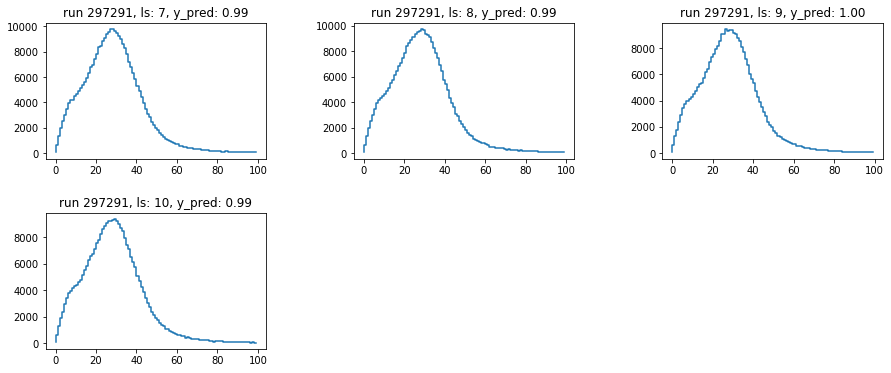

BAD LS
ANOMALOUS LS
Training set shape (9150, 121)
Explained variance ratio [0.9010132  0.08075167 0.0032752  0.00157613]


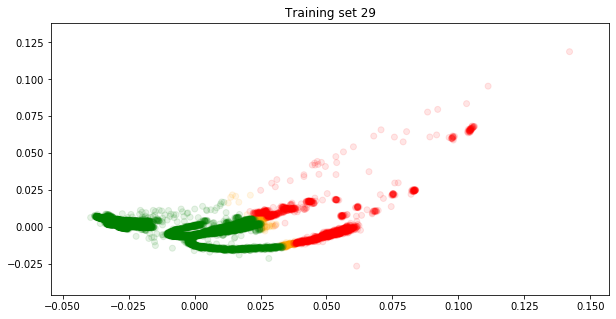

Training model
Epoch 00094: early stopping
Accuracy 1.0
[[ 406    0]
 [   0 1882]]

********************************************************************************
Classifying Run 297292

Explained variance ratio [0.9546885  0.01270085 0.00323911 0.00262293]


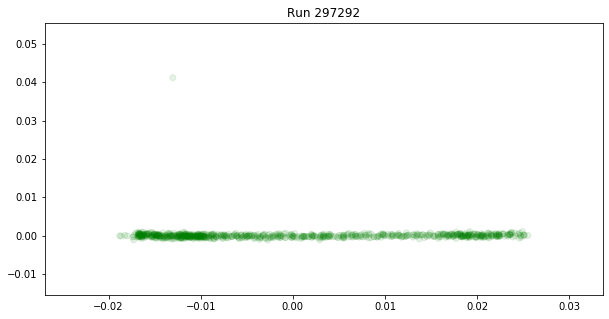

Good LS: 748 [1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92, 93, 94, 95, 96, 97, 98, 99, 100, 101, 102, 103, 104, 105, 106, 107, 108, 109, 110, 111, 112, 113, 114, 115, 116, 117, 118, 119, 120, 121, 122, 123, 124, 125, 126, 127, 128, 129, 130, 131, 132, 133, 134, 135, 136, 137, 138, 139, 140, 141, 142, 143, 144, 145, 146, 147, 148, 149, 150, 151, 152, 153, 154, 155, 156, 157, 158, 159, 160, 161, 162, 163, 164, 165, 166, 167, 168, 169, 170, 171, 172, 173, 174, 175, 176, 177, 178, 179, 180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192, 193, 194, 195, 196, 197, 198, 199, 200, 201, 202, 203, 204, 205, 206, 207, 208, 209, 210, 211, 212, 213, 214, 215, 216, 217, 218, 219,

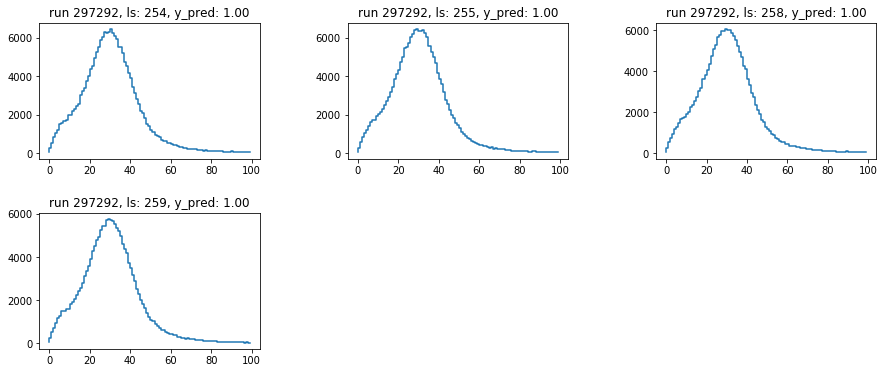

BAD LS
ANOMALOUS LS
Training set shape (9898, 121)
Explained variance ratio [0.89933695 0.08161846 0.00360439 0.00159083]


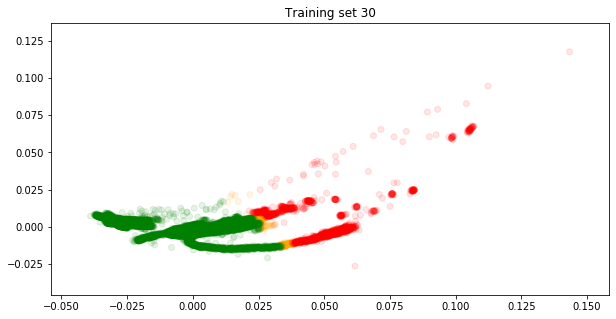

Training model
Epoch 00081: early stopping
Accuracy 1.0
[[ 405    1]
 [   0 2069]]

********************************************************************************
Classifying Run 297293

Explained variance ratio [0.12457849 0.0560452  0.05258672 0.04825242]


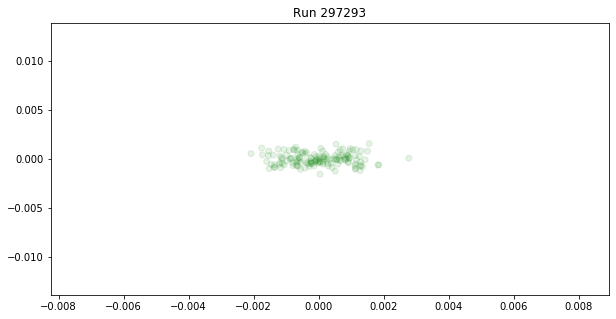

Good LS: 144 [1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92, 93, 94, 95, 96, 97, 98, 99, 100, 101, 102, 103, 104, 105, 106, 107, 108, 109, 110, 111, 112, 113, 114, 115, 116, 117, 118, 119, 120, 121, 122, 123, 124, 125, 126, 127, 128, 129, 130, 131, 132, 133, 134, 135, 136, 137, 138, 139, 140, 141, 142, 143, 144]
Bad LS: 0 []
Anomalies LS: 0 []
GOOD LS


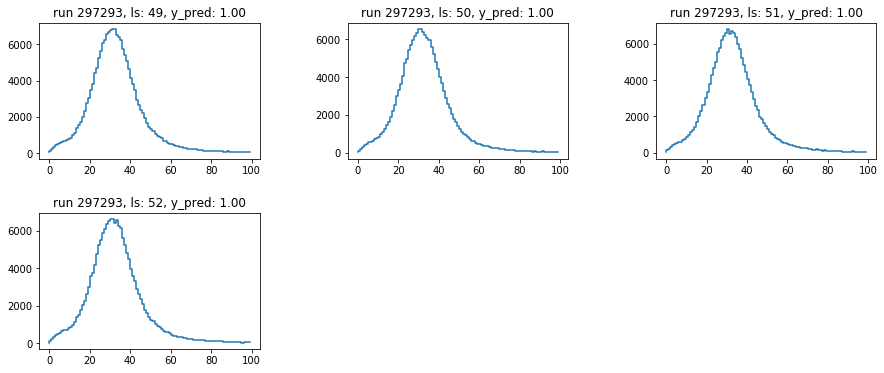

BAD LS
ANOMALOUS LS
Training set shape (10042, 121)
Explained variance ratio [0.89865482 0.08213178 0.00382654 0.00158014]


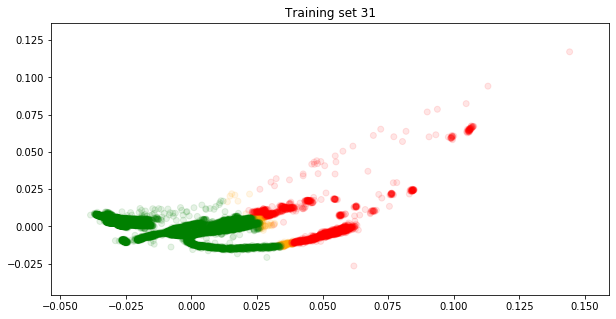

Training model
Epoch 00077: early stopping
Accuracy 1.0
[[ 406    0]
 [   0 2105]]

********************************************************************************
Classifying Run 297296

Explained variance ratio [0.6230785  0.18466088 0.02310609 0.01032666]


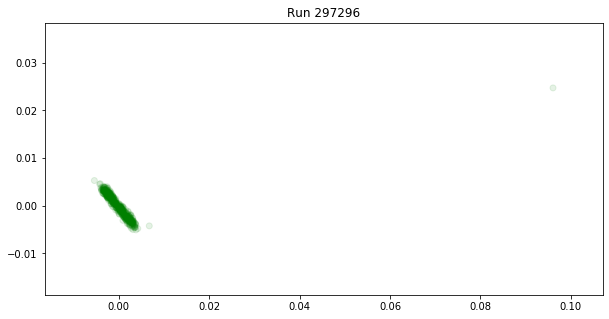

Good LS: 491 [1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92, 93, 94, 95, 96, 97, 98, 99, 100, 101, 102, 103, 104, 105, 106, 107, 108, 109, 110, 111, 112, 113, 114, 115, 116, 117, 118, 119, 120, 121, 122, 123, 124, 125, 126, 127, 128, 129, 130, 131, 132, 133, 134, 135, 136, 137, 138, 139, 140, 141, 142, 143, 144, 145, 146, 147, 148, 149, 150, 151, 152, 153, 154, 155, 156, 157, 158, 159, 160, 161, 162, 163, 164, 165, 166, 167, 168, 169, 170, 171, 172, 173, 174, 175, 176, 177, 178, 179, 180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192, 193, 194, 195, 196, 197, 198, 199, 200, 201, 202, 203, 204, 205, 206, 207, 208, 209, 210, 211, 212, 213, 214, 215, 216, 217, 218, 219,

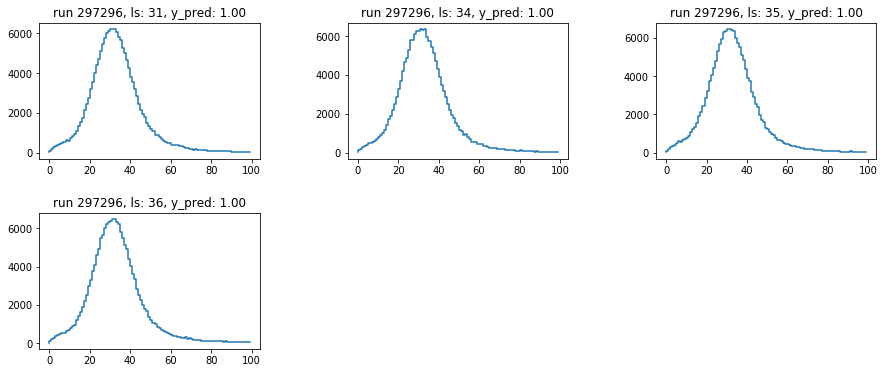

BAD LS
ANOMALOUS LS
Training set shape (10533, 121)
Explained variance ratio [0.89296018 0.08589481 0.00511801 0.00166636]


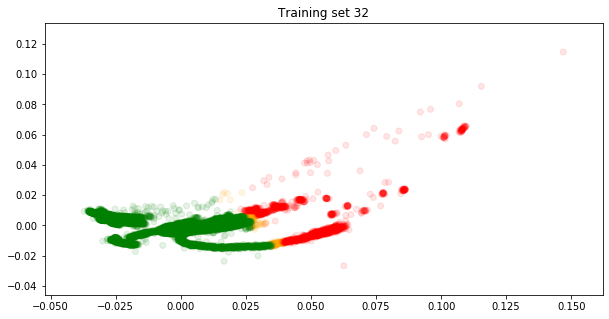

Training model
Epoch 00082: early stopping
Accuracy 1.0
[[ 406    0]
 [   0 2228]]

********************************************************************************
Classifying Run 297308

Explained variance ratio [0.89584088 0.02537327 0.01005656 0.00755411]


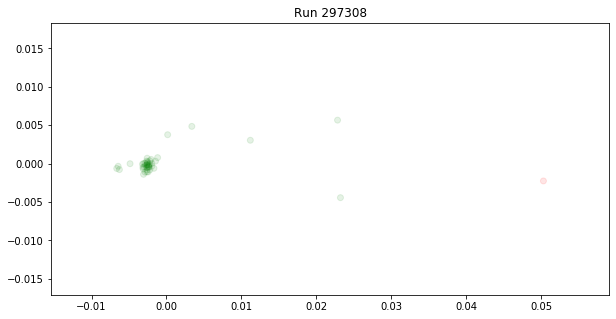

Good LS: 44 [1, 2, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45]
Bad LS: 1 [3]
Anomalies LS: 0 []
GOOD LS


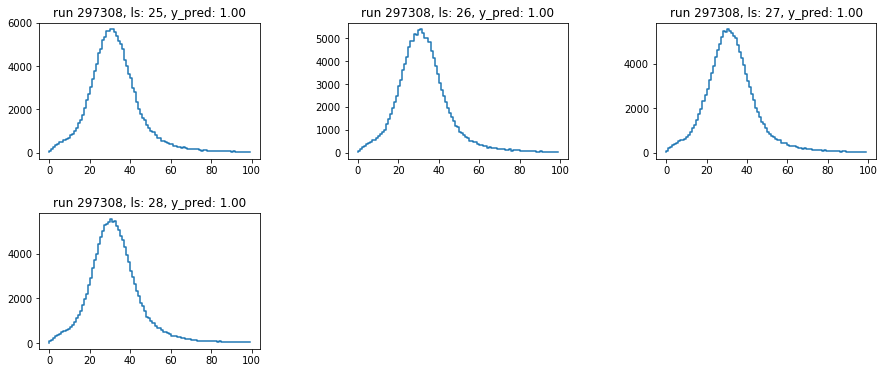

BAD LS


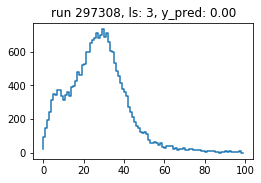

ANOMALOUS LS
Training set shape (10578, 121)
Explained variance ratio [0.89243292 0.0862845  0.00525566 0.00166406]


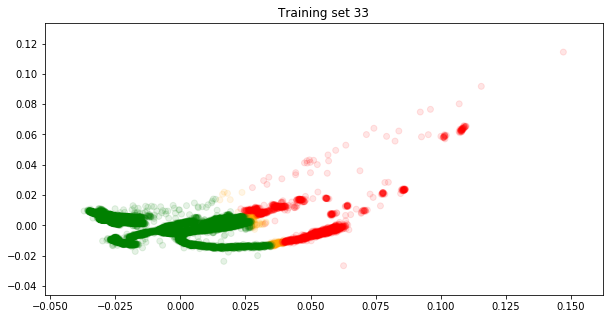

Training model
Epoch 00061: early stopping
Accuracy 1.0
[[ 405    1]
 [   0 2239]]

********************************************************************************
Classifying Run 297359

Explained variance ratio [0.85550884 0.10393722 0.00482706 0.00351026]


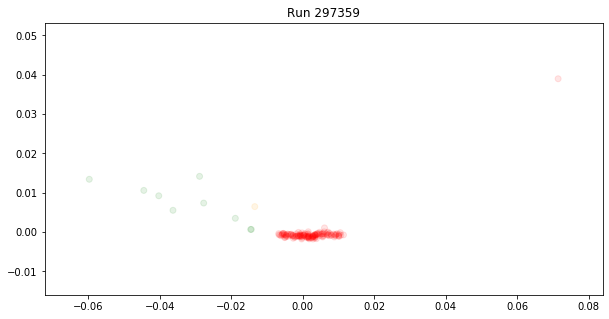

Good LS: 9 [39, 40, 42, 43, 44, 45, 178, 179, 180]
Bad LS: 134 [36, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92, 93, 94, 95, 96, 97, 98, 99, 100, 101, 102, 103, 104, 105, 106, 107, 108, 109, 110, 111, 112, 113, 114, 115, 116, 117, 118, 119, 120, 121, 122, 123, 124, 125, 126, 127, 128, 129, 130, 131, 132, 133, 134, 135, 136, 137, 138, 139, 140, 141, 142, 143, 144, 145, 146, 147, 148, 149, 150, 151, 152, 153, 154, 155, 156, 157, 158, 159, 160, 161, 162, 163, 164, 165, 166, 167, 168, 169, 170, 171, 172, 173, 174, 175, 176, 177, 181]
Anomalies LS: 1 [41]
GOOD LS


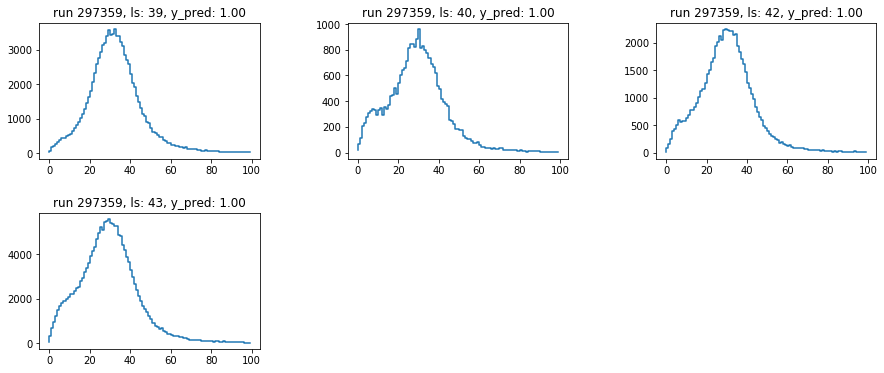

BAD LS


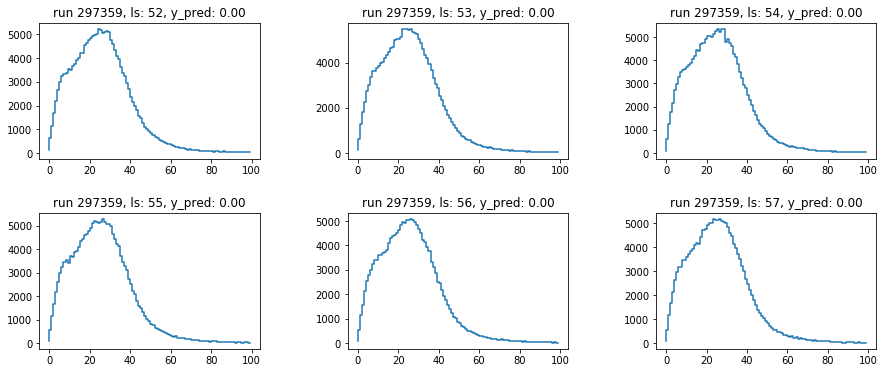

ANOMALOUS LS


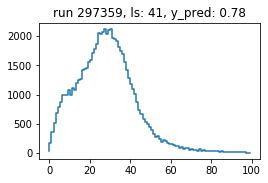

Training set shape (10721, 121)
Explained variance ratio [0.89258858 0.08630072 0.00526704 0.00163027]


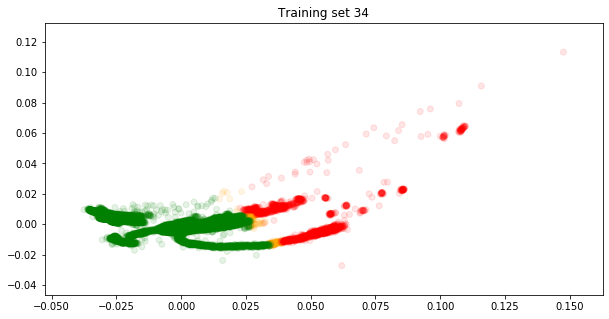

Training model
Epoch 00074: early stopping
Accuracy 0.999
[[ 436    3]
 [   0 2242]]

********************************************************************************
Classifying Run 297411

Explained variance ratio [0.94584489 0.00797465 0.00293892 0.00236459]


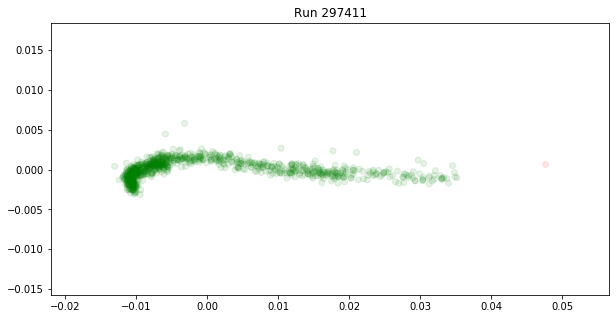

Good LS: 914 [34, 37, 38, 39, 40, 41, 42, 43, 44, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92, 93, 94, 95, 96, 97, 98, 99, 100, 101, 102, 103, 104, 105, 106, 107, 108, 109, 110, 111, 112, 113, 114, 115, 116, 117, 118, 119, 120, 121, 122, 123, 124, 125, 126, 127, 128, 129, 130, 131, 132, 133, 134, 135, 136, 137, 138, 139, 140, 141, 142, 143, 144, 145, 146, 147, 148, 149, 150, 151, 152, 153, 154, 155, 156, 157, 158, 159, 160, 161, 162, 163, 164, 165, 166, 167, 168, 169, 170, 171, 172, 173, 174, 175, 176, 177, 178, 179, 180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192, 193, 194, 195, 196, 197, 198, 199, 200, 201, 202, 203, 204, 205, 206, 207, 208, 209, 210, 211, 212, 213, 214, 215, 216, 217, 218, 219, 220, 221, 222, 223, 224, 225, 226, 227, 228, 229, 230, 231, 232, 233, 234, 235, 236, 237, 238, 239, 240, 241, 242, 243, 244, 245, 246,

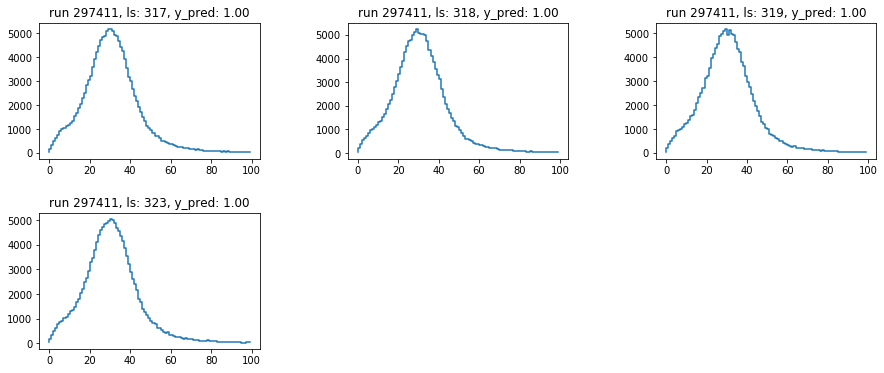

BAD LS


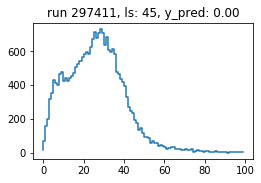

ANOMALOUS LS
Training set shape (11636, 121)
Explained variance ratio [0.88657359 0.09120893 0.00615156 0.00161052]


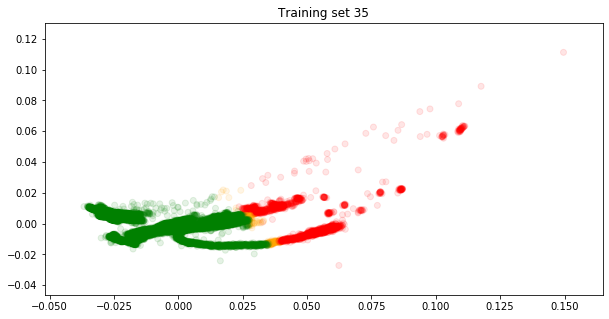

Training model
Epoch 00057: early stopping
Accuracy 1.0
[[ 439    0]
 [   0 2470]]

********************************************************************************
Classifying Run 297424

Explained variance ratio [0.92481032 0.01755616 0.00669283 0.00506258]


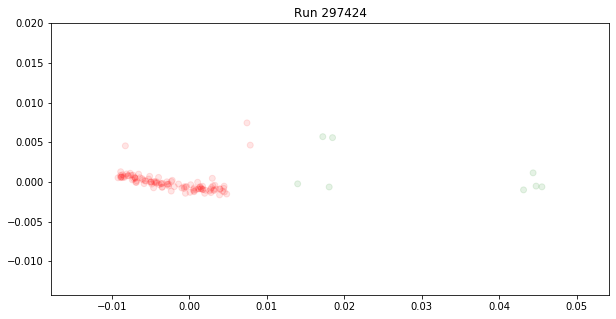

Good LS: 8 [97, 98, 99, 100, 103, 104, 105, 106]
Bad LS: 106 [33, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92, 93, 94, 95, 96, 101, 102, 107, 108, 109, 110, 111, 112, 113, 114, 115, 116, 117, 118, 119, 120, 121, 122, 123, 124, 125, 126, 127, 128, 129, 130, 131, 132, 133, 134, 135, 136, 137, 138, 139, 140, 141, 142, 143, 144, 145, 146, 147, 148]
Anomalies LS: 0 []
GOOD LS


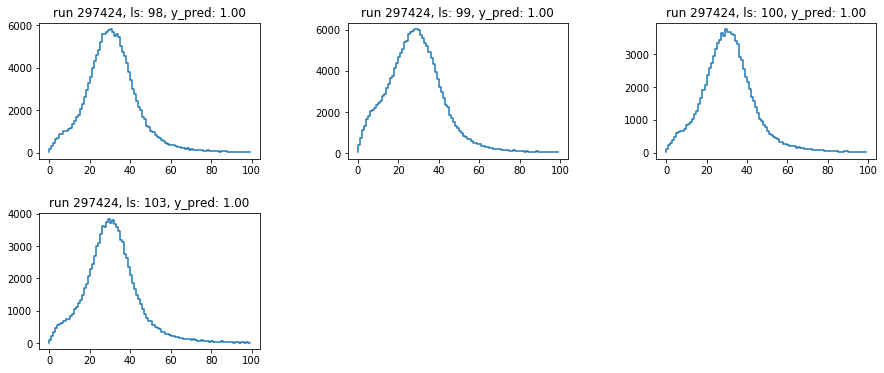

BAD LS


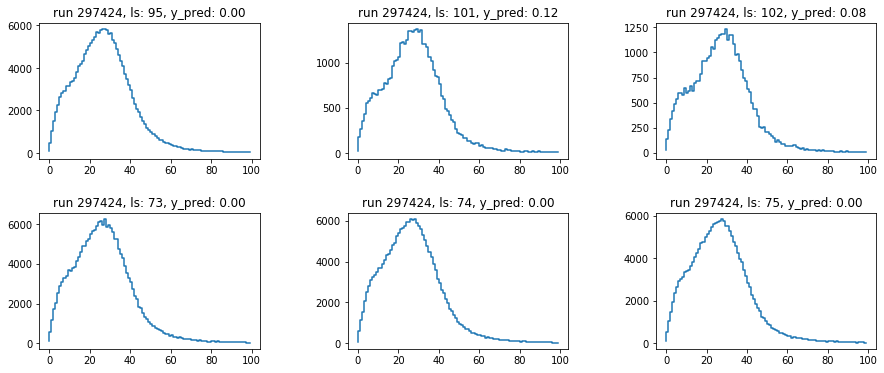

ANOMALOUS LS
Training set shape (11750, 121)
Explained variance ratio [0.88729335 0.09064717 0.00612956 0.00159106]


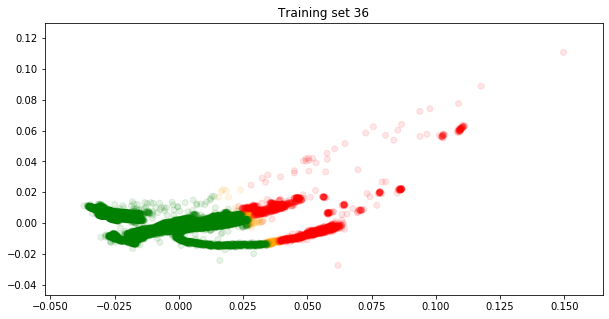

Training model
Epoch 00113: early stopping
Accuracy 1.0
[[ 465    1]
 [   0 2472]]

********************************************************************************
Classifying Run 297425

Explained variance ratio [0.7950792  0.01400027 0.01033435 0.01013837]


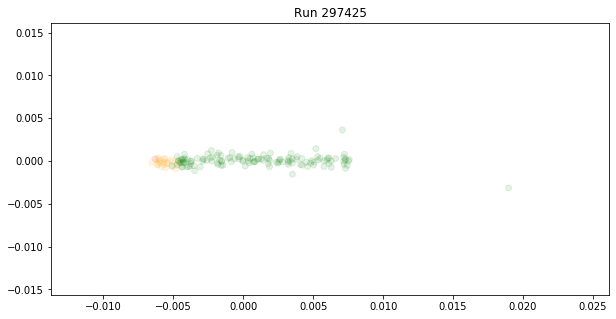

Good LS: 130 [5, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 40, 41, 42, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92, 93, 94, 95, 96, 97, 98, 99, 100, 101, 102, 103, 104, 105, 106, 107, 108, 109, 110, 111, 112, 113, 114, 115, 116, 117, 118, 119, 120, 121, 122, 123, 124, 125, 126, 127, 128, 129, 130, 131, 132, 133, 134, 135, 136, 137, 138, 139, 140, 141, 142, 143, 144, 145, 146, 147, 148, 149, 150, 151, 152, 153]
Bad LS: 1 [33]
Anomalies LS: 22 [1, 2, 3, 4, 6, 7, 8, 9, 10, 11, 12, 13, 32, 34, 35, 36, 37, 38, 39, 43, 44, 45]
GOOD LS


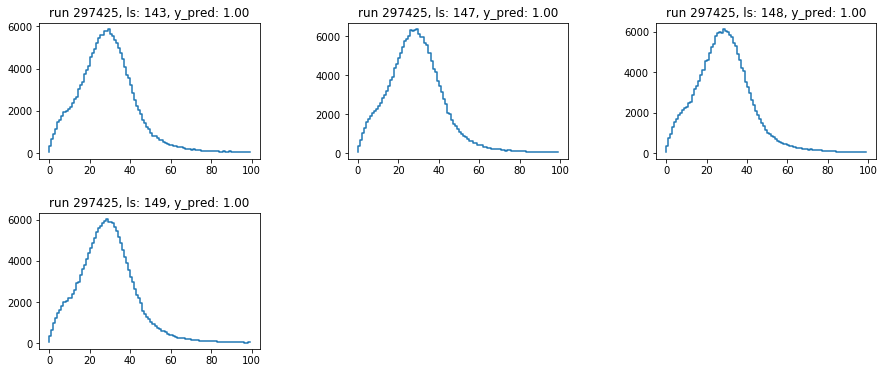

BAD LS


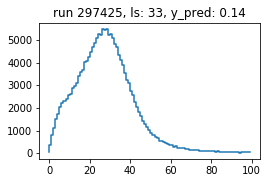

ANOMALOUS LS


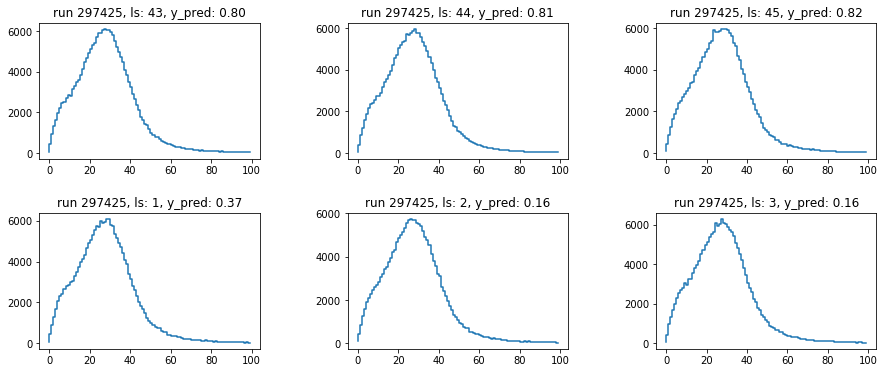

Training set shape (11881, 121)
Explained variance ratio [0.88789447 0.09009085 0.00611553 0.00158216]


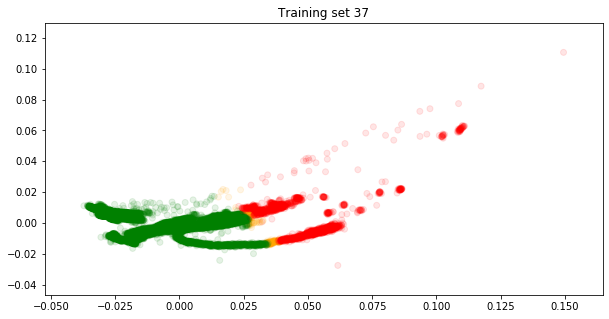

Training model
Epoch 00079: early stopping
Accuracy 1.0
[[ 466    0]
 [   0 2505]]

********************************************************************************
Classifying Run 297426

Explained variance ratio [0.35334077 0.30821319 0.20938523 0.01104226]


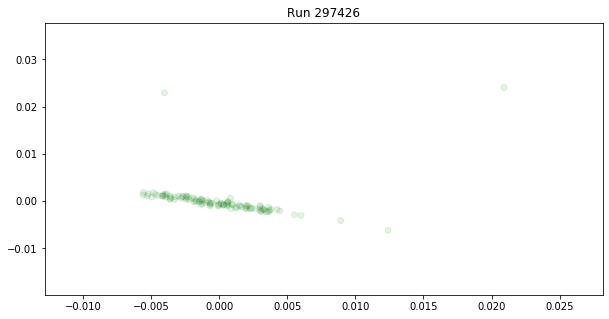

Good LS: 107 [1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92, 93, 94, 95, 96, 97, 98, 99, 100, 101, 102, 103, 104, 105, 106, 107]
Bad LS: 0 []
Anomalies LS: 0 []
GOOD LS


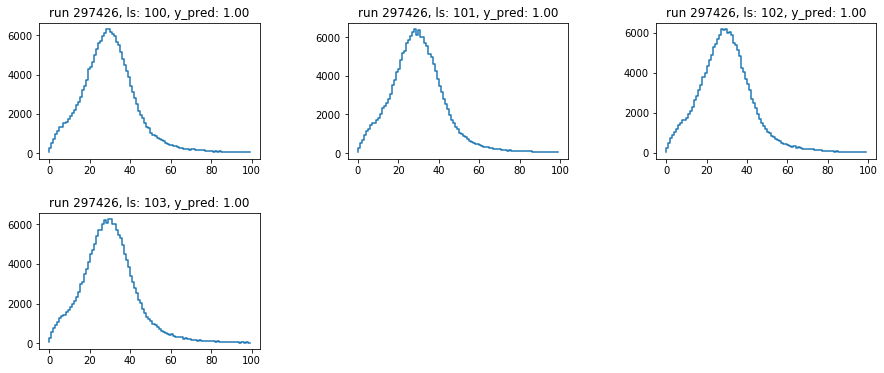

BAD LS
ANOMALOUS LS
Training set shape (11988, 121)
Explained variance ratio [0.88756478 0.09016753 0.00613459 0.00158507]


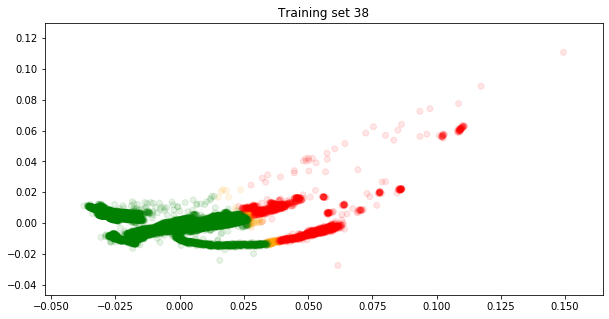

Training model
Epoch 00078: early stopping
Accuracy 0.999
[[ 464    2]
 [   0 2531]]

********************************************************************************
Classifying Run 297429

Explained variance ratio [0.32042234 0.05274089 0.04774718 0.04086197]


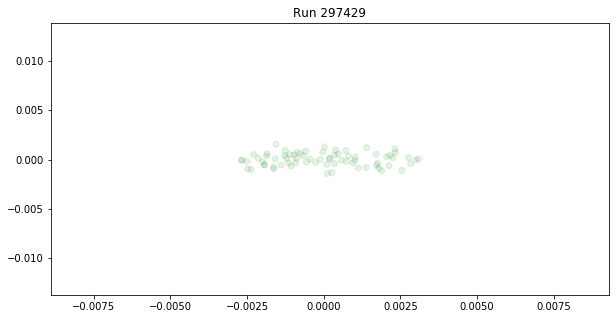

Good LS: 71 [1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71]
Bad LS: 0 []
Anomalies LS: 0 []
GOOD LS


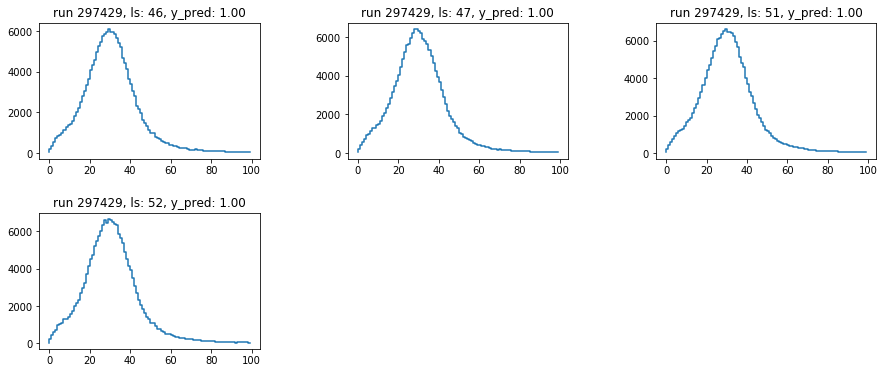

BAD LS
ANOMALOUS LS
Training set shape (12059, 121)
Explained variance ratio [0.88714917 0.0905263  0.00616348 0.00158514]


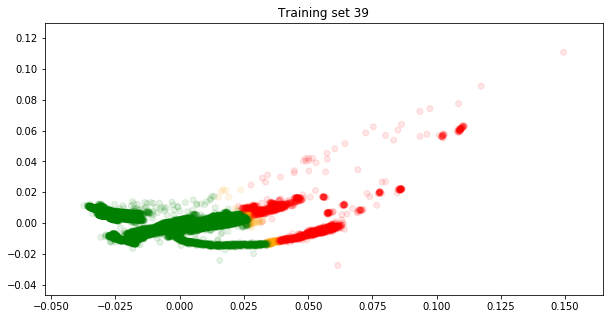

Training model
Epoch 00086: early stopping
Accuracy 1.0
[[ 466    0]
 [   0 2549]]

********************************************************************************
Classifying Run 297430

Explained variance ratio [0.36936735 0.06358082 0.03247029 0.03021363]


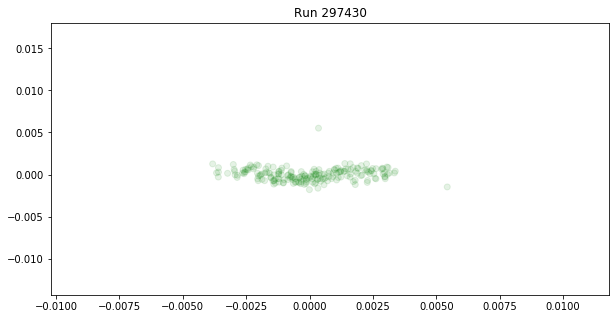

Good LS: 200 [1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92, 93, 94, 95, 96, 97, 98, 99, 100, 101, 102, 103, 104, 105, 106, 107, 108, 109, 110, 111, 112, 113, 114, 115, 116, 117, 118, 119, 120, 121, 122, 123, 124, 125, 126, 127, 128, 129, 130, 131, 132, 133, 134, 135, 136, 137, 138, 139, 140, 141, 142, 143, 144, 145, 146, 147, 148, 149, 150, 151, 152, 153, 154, 155, 156, 157, 158, 159, 160, 161, 162, 163, 164, 165, 166, 167, 168, 169, 170, 171, 172, 173, 174, 175, 176, 177, 178, 179, 180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192, 193, 194, 195, 196, 197, 198, 199, 200]
Bad LS: 0 []
Anomalies LS: 0 []
GOOD LS


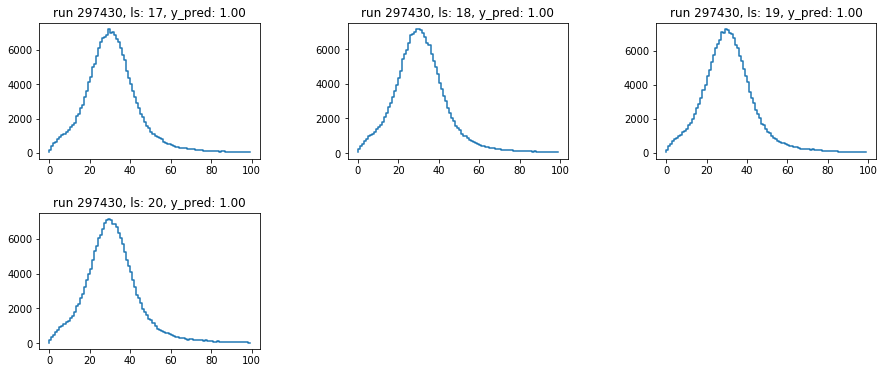

BAD LS
ANOMALOUS LS
Training set shape (12259, 121)
Explained variance ratio [0.88533123 0.09215525 0.00631996 0.00158204]


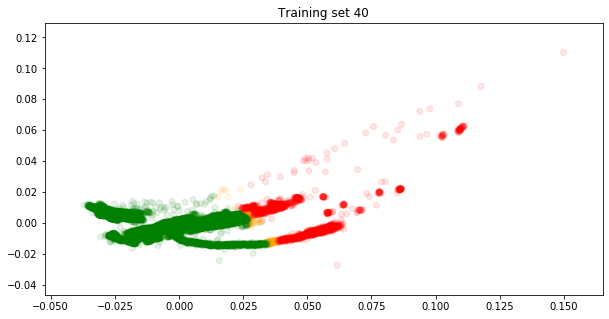

Training model
Epoch 00083: early stopping
Accuracy 1.0
[[ 466    0]
 [   0 2599]]

********************************************************************************
Classifying Run 297431

Explained variance ratio [0.55483491 0.19421562 0.0435401  0.02532968]


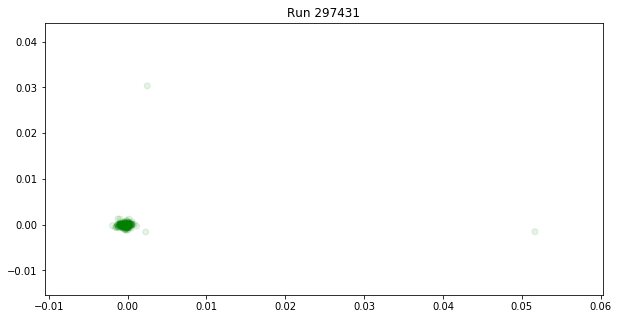

Good LS: 185 [1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92, 93, 94, 95, 96, 97, 98, 99, 100, 101, 102, 103, 104, 105, 106, 107, 108, 109, 110, 111, 112, 113, 114, 115, 116, 117, 118, 119, 120, 121, 122, 123, 124, 125, 126, 127, 128, 129, 130, 131, 132, 133, 134, 135, 136, 137, 138, 139, 140, 141, 142, 143, 144, 145, 146, 147, 148, 149, 150, 151, 152, 153, 154, 155, 156, 157, 158, 159, 160, 161, 162, 163, 164, 165, 166, 167, 168, 169, 170, 171, 172, 173, 174, 175, 176, 177, 178, 179, 180, 181, 182, 183, 184, 185]
Bad LS: 0 []
Anomalies LS: 0 []
GOOD LS


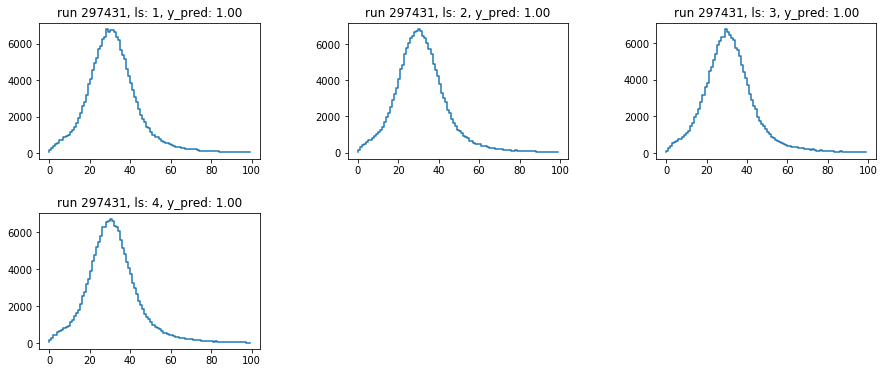

BAD LS
ANOMALOUS LS
Training set shape (12444, 121)
Explained variance ratio [0.8825799  0.09437342 0.00658437 0.00157876]


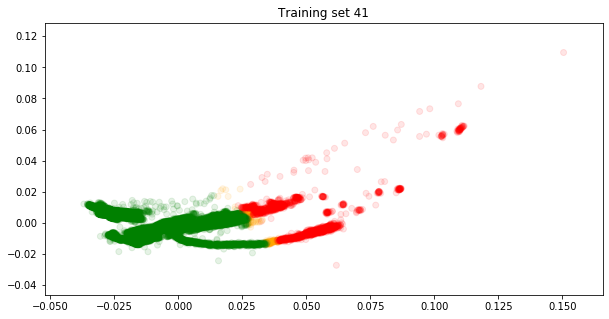

Training model
Epoch 00101: early stopping
Accuracy 1.0
[[ 465    1]
 [   0 2645]]

********************************************************************************
Classifying Run 297432

Explained variance ratio [0.06295936 0.06083612 0.05481713 0.05320464]


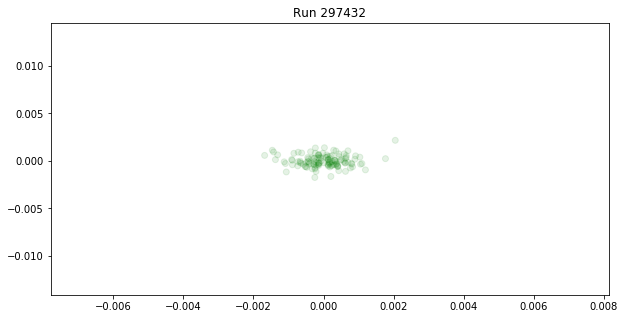

Good LS: 125 [1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92, 93, 94, 95, 96, 97, 98, 99, 100, 101, 102, 103, 104, 105, 106, 107, 108, 109, 110, 111, 112, 113, 114, 115, 116, 117, 118, 119, 120, 121, 122, 123, 124, 125]
Bad LS: 0 []
Anomalies LS: 0 []
GOOD LS


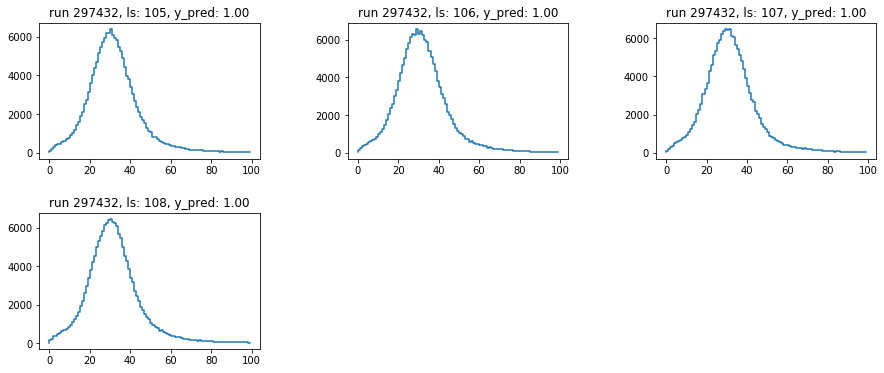

BAD LS
ANOMALOUS LS
Training set shape (12569, 121)
Explained variance ratio [0.8804833  0.09630472 0.00676812 0.00157266]


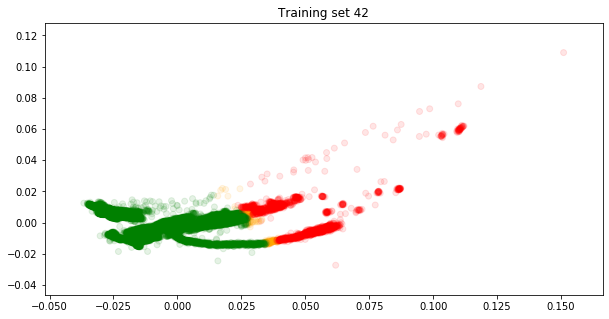

Training model
Epoch 00095: early stopping
Accuracy 1.0
[[ 466    0]
 [   0 2677]]

********************************************************************************
Classifying Run 297433

Explained variance ratio [0.17544248 0.05719792 0.04900708 0.04658902]


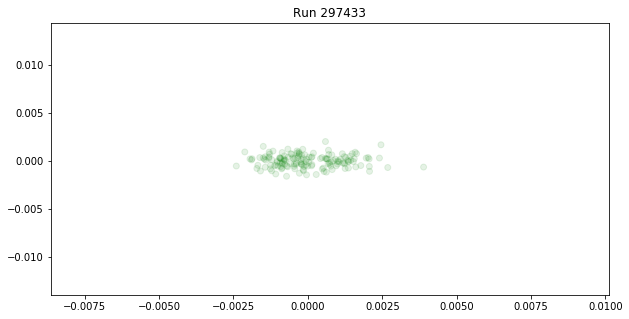

Good LS: 153 [1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92, 93, 94, 95, 96, 97, 98, 99, 100, 101, 102, 103, 104, 105, 106, 107, 108, 109, 110, 111, 112, 113, 114, 115, 116, 117, 118, 119, 120, 121, 122, 123, 124, 125, 126, 127, 128, 129, 130, 131, 132, 133, 134, 135, 136, 137, 138, 139, 140, 141, 142, 143, 144, 145, 146, 147, 148, 149, 150, 151, 152, 153]
Bad LS: 0 []
Anomalies LS: 0 []
GOOD LS


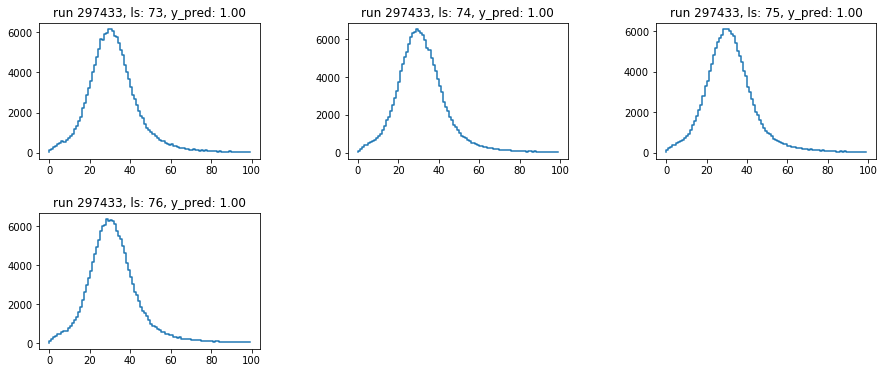

BAD LS
ANOMALOUS LS
Training set shape (12722, 121)
Explained variance ratio [0.87750864 0.09902389 0.00705319 0.00156447]


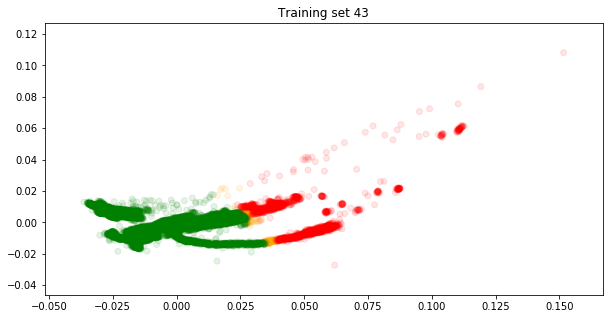

Training model
Epoch 00059: early stopping
Accuracy 1.0
[[ 465    1]
 [   0 2715]]

********************************************************************************
Classifying Run 297434

Explained variance ratio [0.07414444 0.05935494 0.05144813 0.04778536]


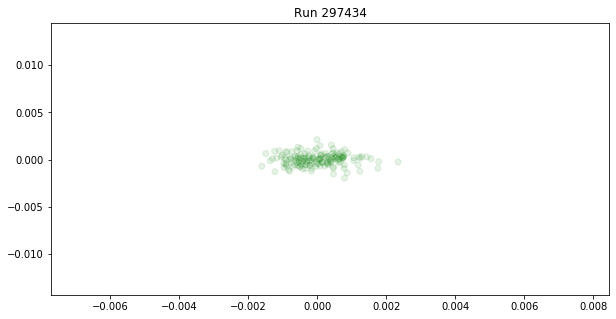

Good LS: 156 [1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92, 93, 94, 95, 96, 97, 98, 99, 100, 101, 102, 103, 104, 105, 106, 107, 108, 109, 110, 111, 112, 113, 114, 115, 116, 117, 118, 119, 120, 121, 122, 123, 124, 125, 126, 127, 128, 129, 130, 131, 132, 133, 134, 135, 136, 137, 138, 139, 140, 141, 142, 143, 144, 145, 146, 147, 148, 149, 150, 151, 152, 153, 154, 155, 156]
Bad LS: 0 []
Anomalies LS: 0 []
GOOD LS


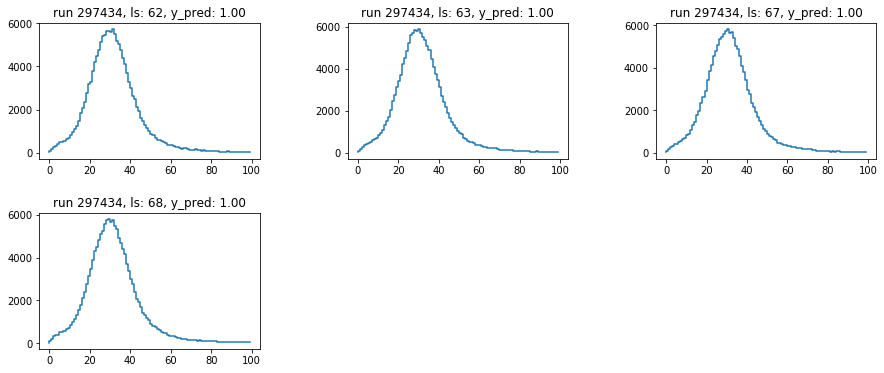

BAD LS
ANOMALOUS LS
Training set shape (12878, 121)
Explained variance ratio [0.87419878 0.10203965 0.00736848 0.00155702]


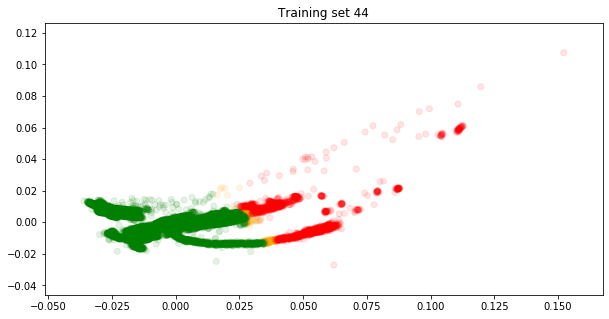

Training model
Epoch 00091: early stopping
Accuracy 1.0
[[ 466    0]
 [   0 2754]]

********************************************************************************
Classifying Run 297435

Explained variance ratio [0.07853304 0.06435726 0.058484   0.05156547]


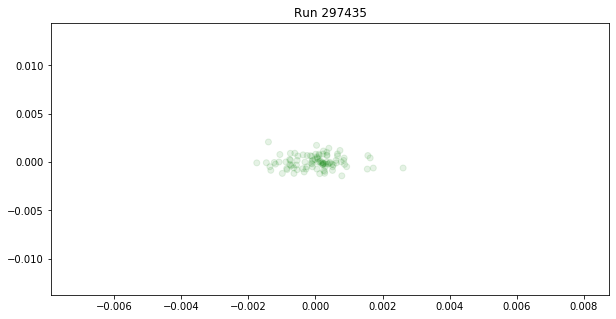

Good LS: 95 [1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92, 93, 94, 95]
Bad LS: 0 []
Anomalies LS: 0 []
GOOD LS


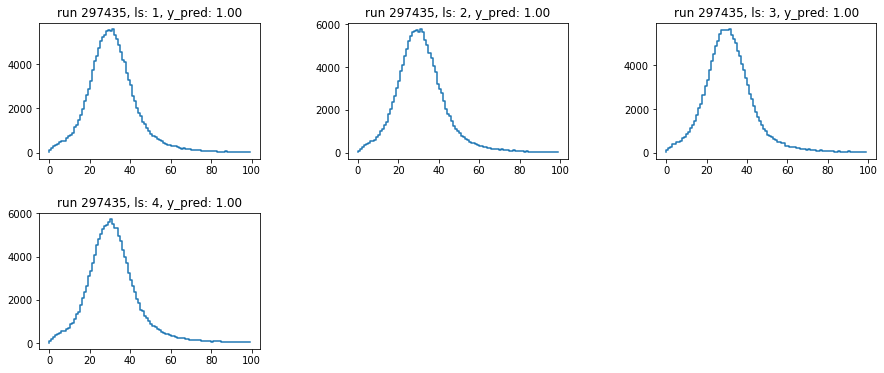

BAD LS
ANOMALOUS LS
Training set shape (12973, 121)
Explained variance ratio [0.87215213 0.10390886 0.00755341 0.00155291]


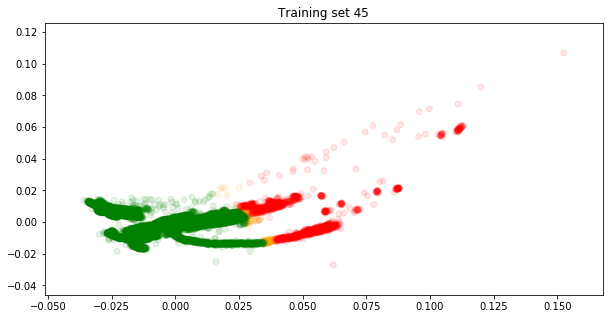

Training model
Epoch 00060: early stopping
Accuracy 1.0
[[ 466    0]
 [   0 2778]]

********************************************************************************
Classifying Run 297467

Explained variance ratio [0.94608983 0.01542404 0.00426229 0.00321476]


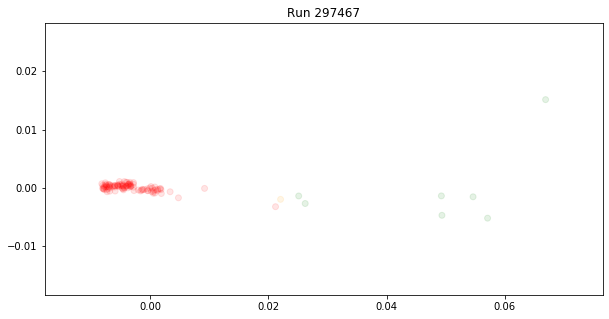

Good LS: 7 [29, 32, 34, 35, 36, 37, 64]
Bad LS: 100 [33, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 65, 66, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92, 93, 94, 95, 96, 97, 98, 99, 100, 101, 102, 103, 104, 105, 106, 107, 108, 109, 110, 111, 112, 113, 114, 115, 116, 117, 118, 119, 120, 121, 122, 123, 124, 125, 126, 127, 128, 129, 130, 131, 132, 133, 134, 135, 136, 137, 138]
Anomalies LS: 1 [67]
GOOD LS


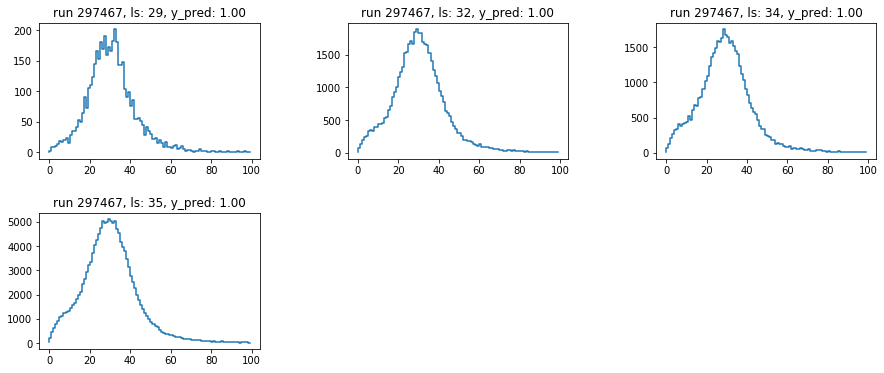

BAD LS


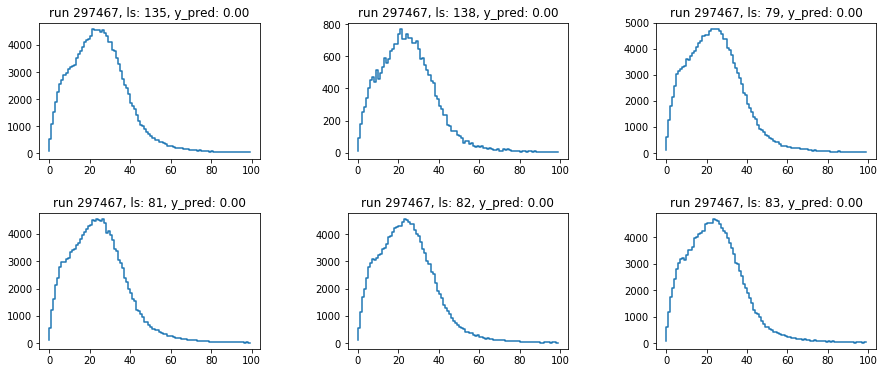

ANOMALOUS LS


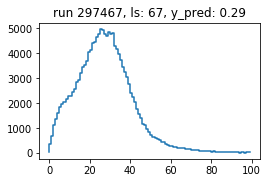

Training set shape (13080, 121)
Explained variance ratio [0.87391747 0.10248038 0.00753074 0.00151565]


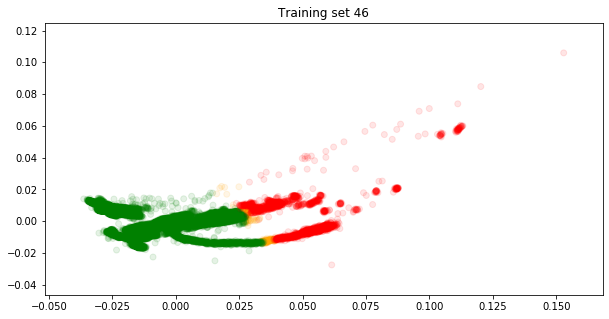

Training model
Epoch 00069: early stopping
Accuracy 1.0
[[ 491    0]
 [   0 2779]]

********************************************************************************
Classifying Run 297468

Explained variance ratio [0.58802719 0.02782124 0.02578354 0.02481037]


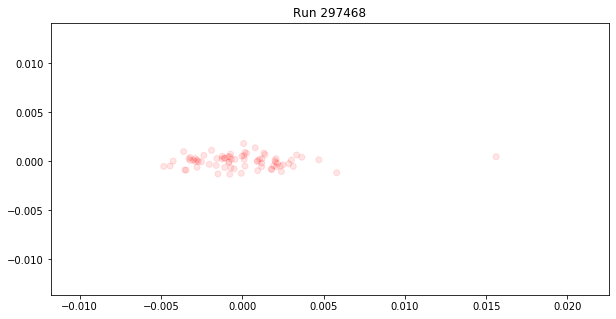

Good LS: 0 []
Bad LS: 74 [1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74]
Anomalies LS: 0 []
GOOD LS
BAD LS


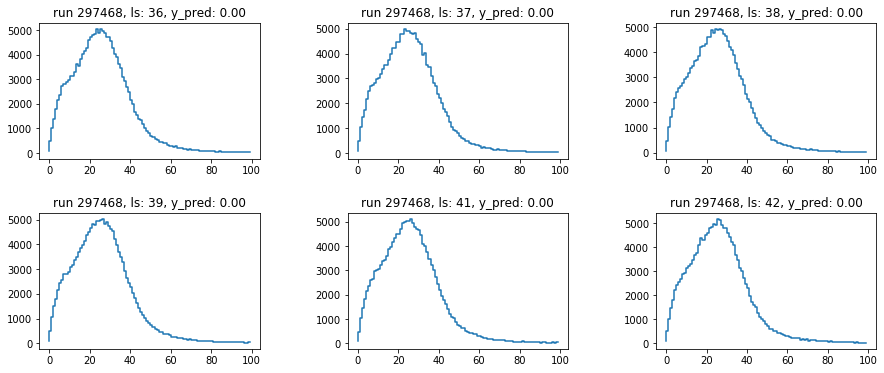

ANOMALOUS LS
Training set shape (13154, 121)
Explained variance ratio [0.87509616 0.10149765 0.00749151 0.0014975 ]


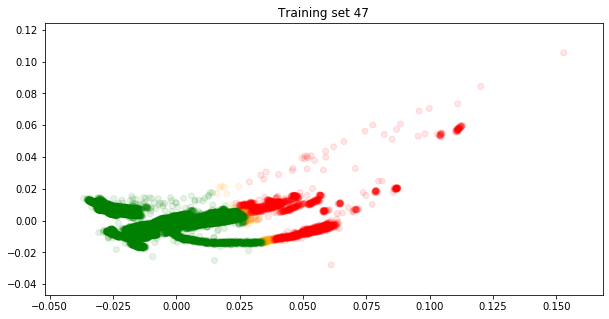

Training model
Epoch 00092: early stopping
Accuracy 1.0
[[ 510    0]
 [   0 2779]]

********************************************************************************
Classifying Run 297469

Explained variance ratio [0.82841954 0.05879724 0.02838351 0.015525  ]


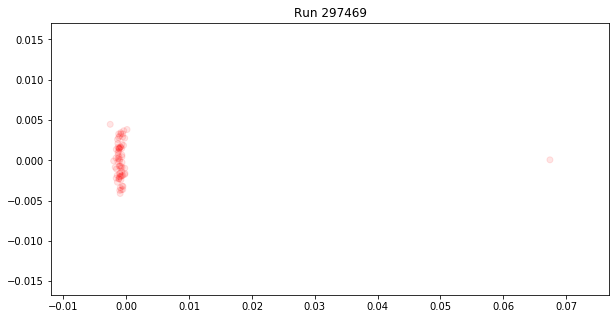

Good LS: 0 []
Bad LS: 69 [1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71]
Anomalies LS: 0 []
GOOD LS
BAD LS


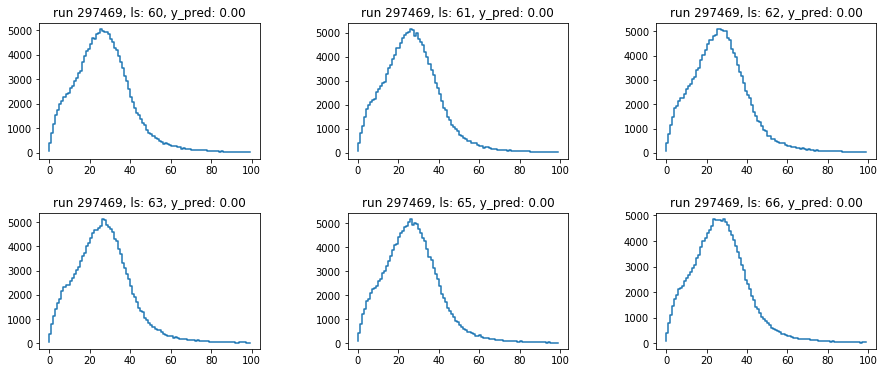

ANOMALOUS LS
Training set shape (13223, 121)
Explained variance ratio [0.8755739  0.10074264 0.00745843 0.00148679]


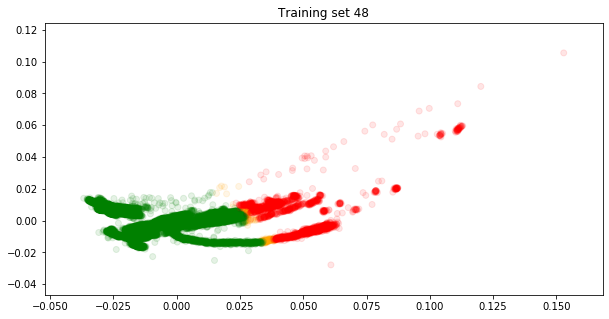

Training model
Epoch 00061: early stopping
Accuracy 1.0
[[ 526    1]
 [   0 2779]]

********************************************************************************
Classifying Run 297474

Explained variance ratio [0.96532752 0.01143995 0.00876882 0.00361711]


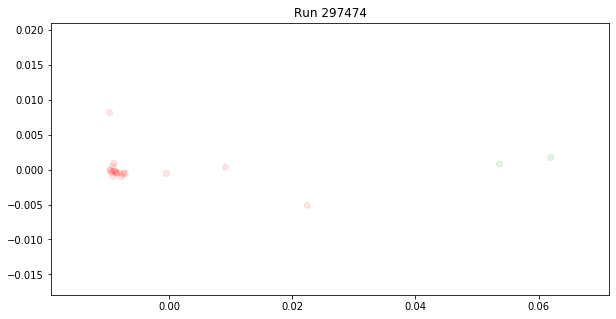

Good LS: 2 [58, 60]
Bad LS: 20 [37, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 59]
Anomalies LS: 0 []
GOOD LS


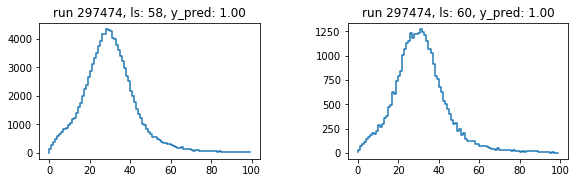

BAD LS


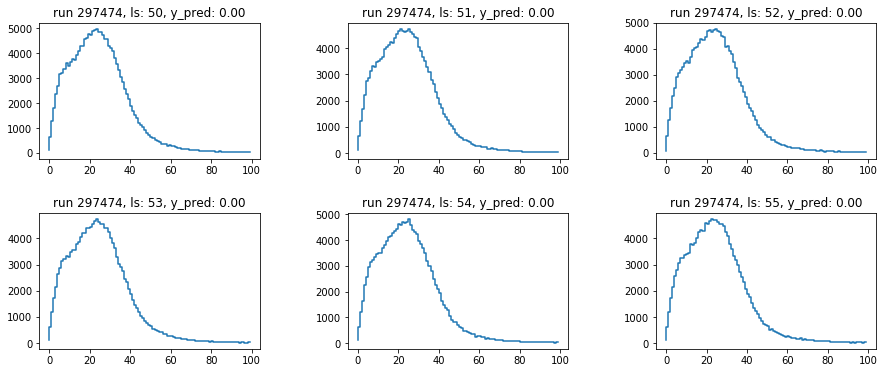

ANOMALOUS LS
Training set shape (13245, 121)
Explained variance ratio [0.87587037 0.1005085  0.00745998 0.00147964]


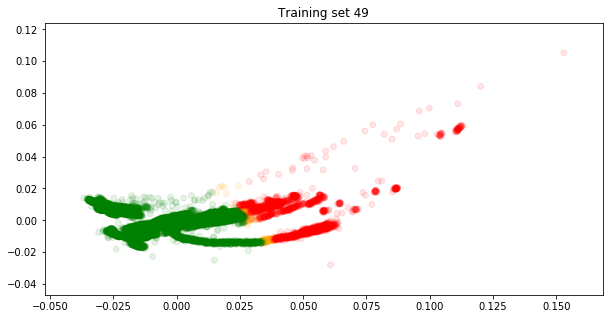

Training model
Epoch 00074: early stopping
Accuracy 1.0
[[ 531    1]
 [   0 2780]]

********************************************************************************
Classifying Run 297483

Explained variance ratio [0.91515783 0.01545735 0.00546654 0.00417679]


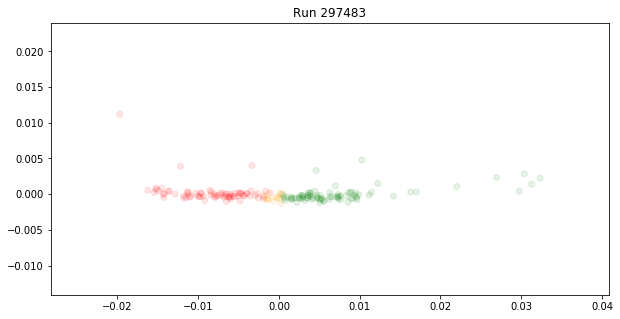

Good LS: 84 [53, 54, 55, 56, 57, 59, 60, 61, 135, 136, 138, 140, 141, 142, 143, 144, 145, 146, 147, 148, 149, 150, 151, 152, 153, 154, 155, 156, 157, 158, 159, 160, 161, 162, 163, 164, 165, 166, 167, 168, 169, 170, 171, 172, 173, 174, 175, 176, 177, 178, 179, 180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192, 193, 194, 195, 196, 197, 198, 199, 200, 201, 202, 203, 204, 205, 206, 207, 208, 209, 210, 211, 212]
Bad LS: 75 [40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 58, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92, 93, 94, 95, 96, 97, 98, 99, 100, 101, 102, 103, 104, 105, 106, 107, 108, 109, 110, 111, 112, 113, 114, 115, 116, 117, 118, 119, 121, 122, 127]
Anomalies LS: 14 [120, 123, 124, 125, 126, 128, 129, 130, 131, 132, 133, 134, 137, 139]
GOOD LS


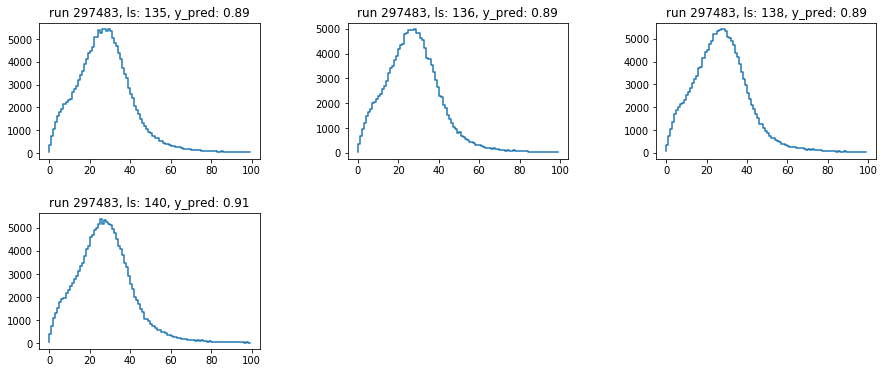

BAD LS


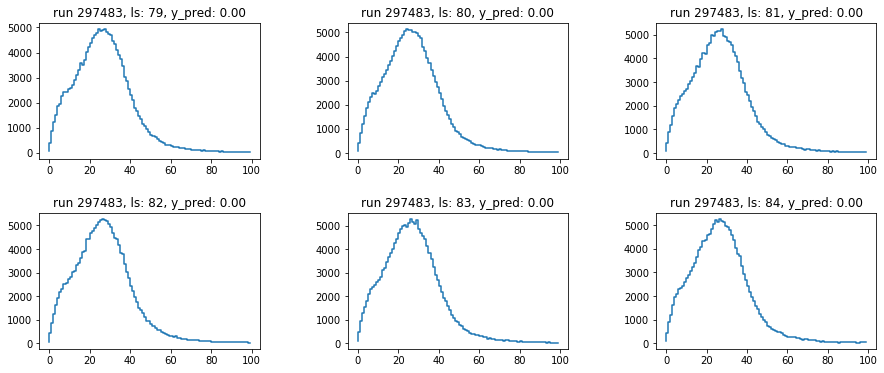

ANOMALOUS LS


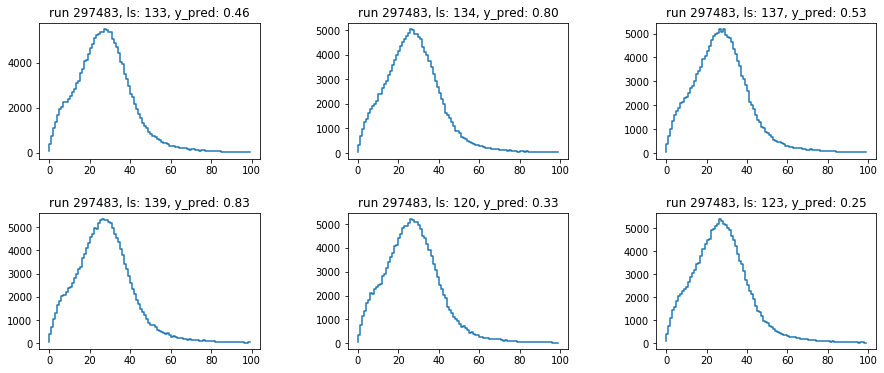

Training set shape (13404, 121)
Explained variance ratio [0.87696399 0.09950301 0.00745783 0.00146491]


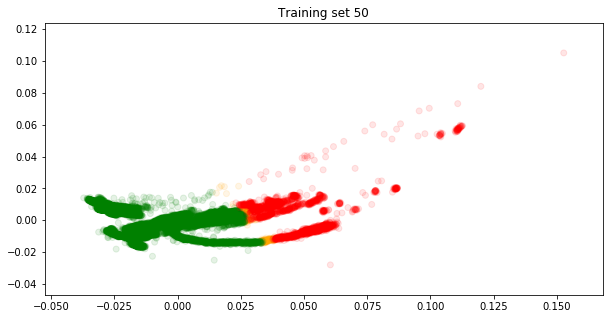

Training model
Epoch 00059: early stopping
Accuracy 1.0
[[ 551    0]
 [   0 2800]]

********************************************************************************
Classifying Run 297484

Explained variance ratio [0.84673214 0.00804872 0.00754749 0.00725149]


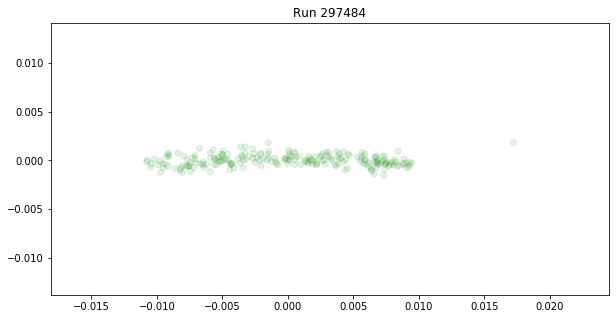

Good LS: 214 [1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92, 93, 94, 95, 96, 97, 98, 99, 100, 101, 102, 103, 104, 105, 106, 107, 108, 109, 110, 111, 112, 113, 114, 115, 116, 117, 118, 119, 120, 121, 122, 123, 124, 125, 126, 127, 128, 129, 130, 131, 132, 133, 134, 135, 136, 137, 138, 139, 140, 141, 142, 143, 144, 145, 146, 147, 148, 149, 150, 151, 152, 153, 154, 155, 156, 157, 158, 159, 160, 161, 162, 163, 164, 165, 166, 167, 168, 169, 170, 171, 172, 173, 174, 175, 176, 177, 178, 179, 180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192, 193, 194, 195, 196, 197, 198, 199, 200, 201, 202, 203, 204, 205, 206, 207, 208, 209, 210, 211, 212, 213, 214]
Bad LS: 0 []
Anomalies L

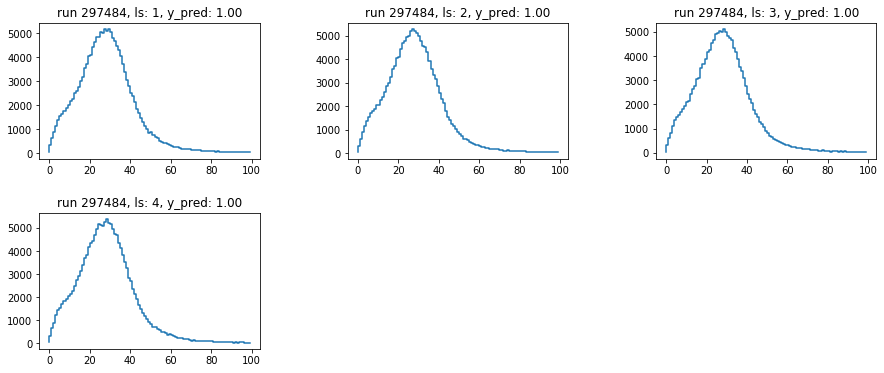

BAD LS
ANOMALOUS LS
Training set shape (13618, 121)
Explained variance ratio [0.87620805 0.10015797 0.00750126 0.00146136]


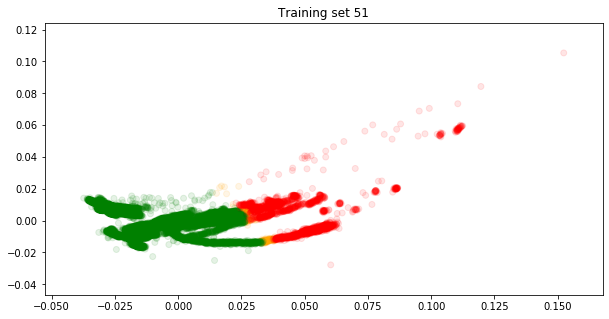

Training model
Epoch 00071: early stopping
Accuracy 0.999
[[ 549    2]
 [   0 2854]]

********************************************************************************
Classifying Run 297485

Explained variance ratio [0.42758331 0.31433349 0.08874092 0.01397639]


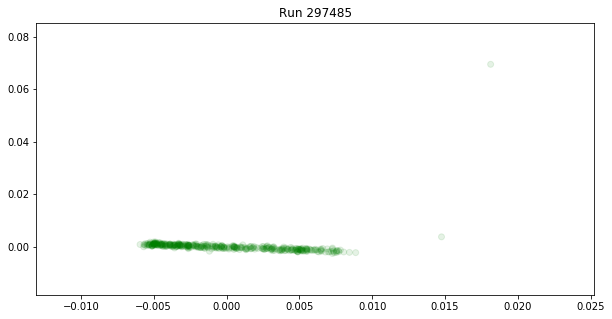

Good LS: 415 [1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92, 93, 94, 95, 96, 97, 98, 99, 100, 101, 102, 103, 104, 105, 106, 107, 108, 109, 110, 111, 112, 113, 114, 115, 116, 117, 118, 119, 120, 121, 122, 123, 124, 125, 126, 127, 128, 129, 130, 131, 132, 133, 134, 135, 136, 137, 138, 139, 140, 141, 142, 143, 144, 145, 146, 147, 148, 149, 150, 151, 152, 153, 154, 155, 156, 157, 158, 159, 160, 161, 162, 163, 164, 165, 166, 167, 168, 169, 170, 171, 172, 173, 174, 175, 176, 177, 178, 179, 180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192, 193, 194, 195, 196, 197, 198, 199, 200, 201, 202, 203, 204, 205, 206, 207, 208, 209, 210, 211, 212, 213, 214, 215, 216, 217, 218, 219,

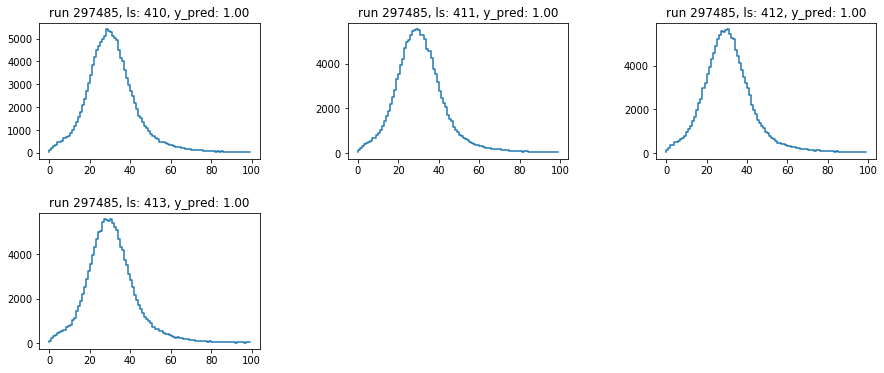

BAD LS
ANOMALOUS LS
Training set shape (14033, 121)
Explained variance ratio [0.86919004 0.10628569 0.00773078 0.00146277]


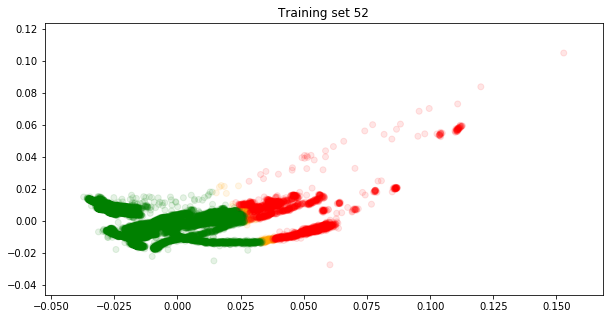

Training model
Epoch 00062: early stopping
Accuracy 1.0
[[ 551    0]
 [   0 2958]]

********************************************************************************
Classifying Run 297486

Explained variance ratio [0.45931775 0.02851388 0.026435   0.02570799]


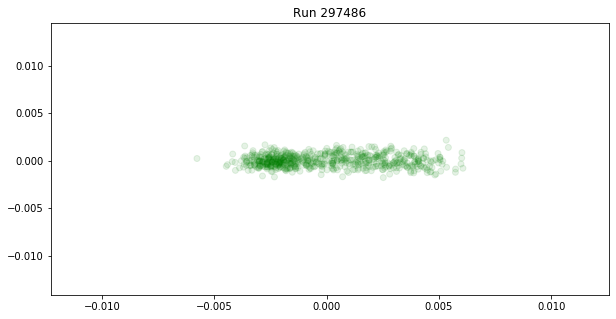

Good LS: 623 [1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92, 93, 94, 95, 96, 97, 98, 99, 100, 101, 102, 103, 104, 105, 106, 107, 108, 109, 110, 111, 112, 113, 114, 115, 116, 117, 118, 119, 120, 121, 122, 123, 124, 125, 126, 127, 128, 129, 130, 131, 132, 133, 134, 135, 136, 137, 138, 139, 140, 141, 142, 143, 144, 145, 146, 147, 148, 149, 150, 151, 152, 153, 154, 155, 156, 157, 158, 159, 160, 161, 162, 163, 164, 165, 166, 167, 168, 169, 170, 171, 172, 173, 174, 175, 176, 177, 178, 179, 180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192, 193, 194, 195, 196, 197, 198, 199, 200, 201, 202, 203, 204, 205, 206, 207, 208, 209, 210, 211, 212, 213, 214, 215, 216, 217, 218, 219,

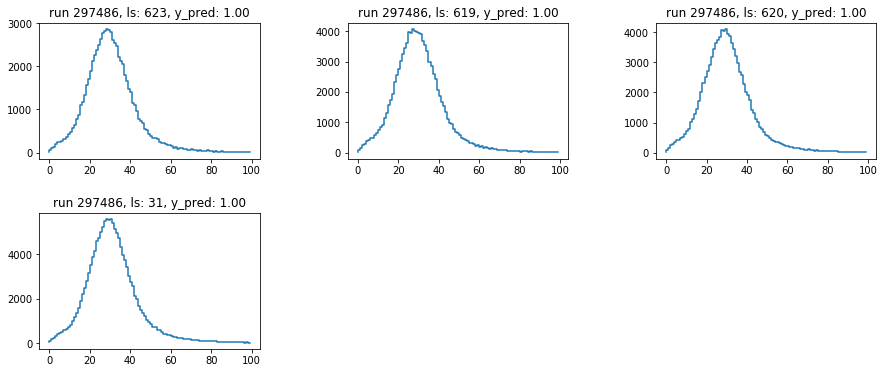

BAD LS
ANOMALOUS LS
Training set shape (14656, 121)
Explained variance ratio [0.85221775 0.1225963  0.00832816 0.00144055]


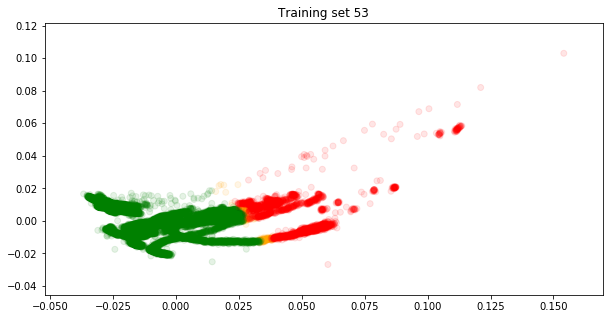

Training model
Epoch 00071: early stopping
Accuracy 1.0
[[ 551    0]
 [   0 3113]]

********************************************************************************
Classifying Run 297487

Explained variance ratio [0.75249443 0.10626718 0.00833708 0.00689887]


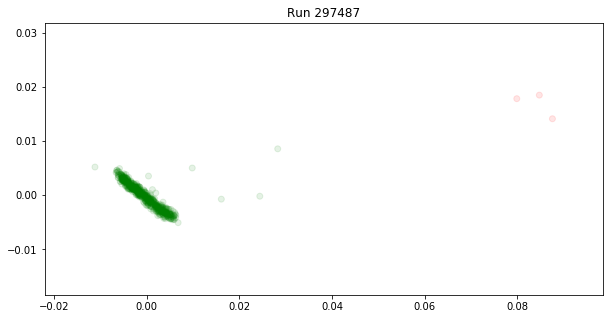

Good LS: 601 [1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92, 93, 94, 95, 96, 97, 98, 99, 100, 101, 102, 103, 104, 105, 106, 107, 108, 109, 110, 112, 113, 115, 117, 118, 119, 120, 121, 122, 123, 124, 125, 126, 127, 128, 129, 130, 131, 132, 133, 134, 135, 136, 137, 138, 139, 140, 141, 142, 143, 144, 145, 146, 147, 148, 149, 150, 151, 152, 153, 154, 155, 156, 157, 158, 159, 160, 161, 162, 163, 164, 165, 166, 167, 168, 169, 170, 171, 172, 173, 174, 175, 176, 177, 178, 179, 180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192, 193, 194, 195, 196, 197, 198, 199, 200, 201, 202, 203, 204, 205, 206, 207, 208, 209, 210, 211, 212, 213, 214, 215, 216, 217, 218, 219, 220, 221, 222,

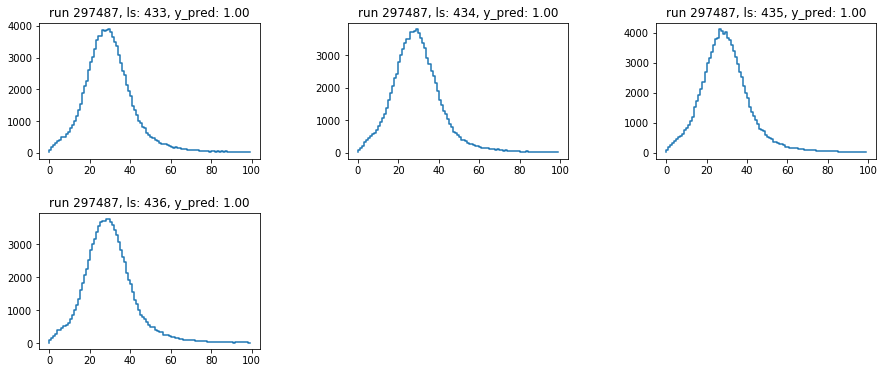

BAD LS


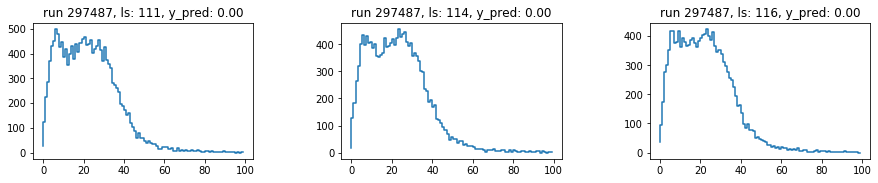

ANOMALOUS LS
Training set shape (15260, 121)
Explained variance ratio [0.83305336 0.14134888 0.00863221 0.00142565]


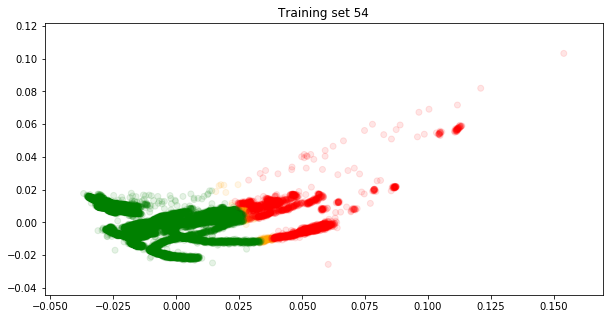

Training model
Epoch 00075: early stopping
Accuracy 1.0
[[ 551    0]
 [   0 3264]]

********************************************************************************
Classifying Run 297488

Explained variance ratio [0.79864058 0.07764316 0.04268815 0.02233681]


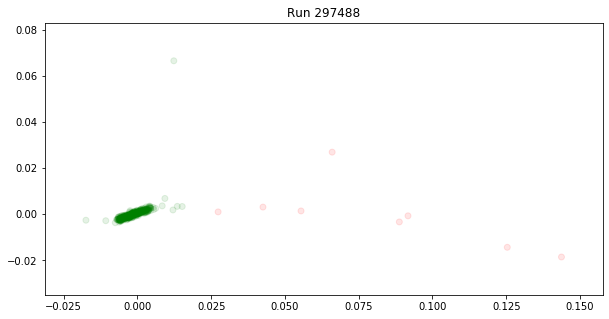

Good LS: 417 [1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92, 93, 94, 95, 96, 97, 98, 99, 100, 101, 102, 103, 104, 105, 106, 107, 108, 109, 110, 111, 112, 113, 114, 115, 116, 117, 118, 119, 120, 121, 122, 123, 124, 125, 126, 127, 128, 129, 130, 131, 132, 133, 134, 135, 136, 137, 138, 139, 140, 141, 142, 143, 144, 145, 146, 147, 148, 149, 150, 151, 152, 153, 154, 155, 156, 157, 158, 159, 160, 161, 162, 163, 164, 165, 166, 167, 168, 169, 170, 171, 172, 173, 174, 175, 176, 177, 178, 179, 180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192, 193, 194, 195, 196, 197, 198, 199, 200, 201, 202, 203, 204, 205, 206, 207, 208, 209, 210, 211, 212, 213, 214, 215, 216, 217, 218, 219,

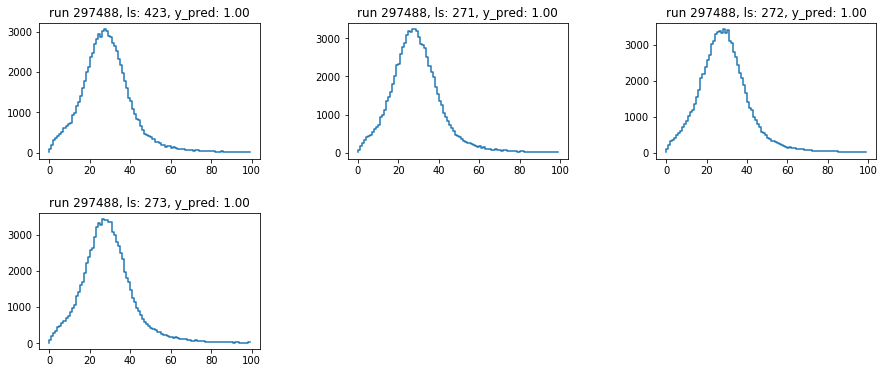

BAD LS


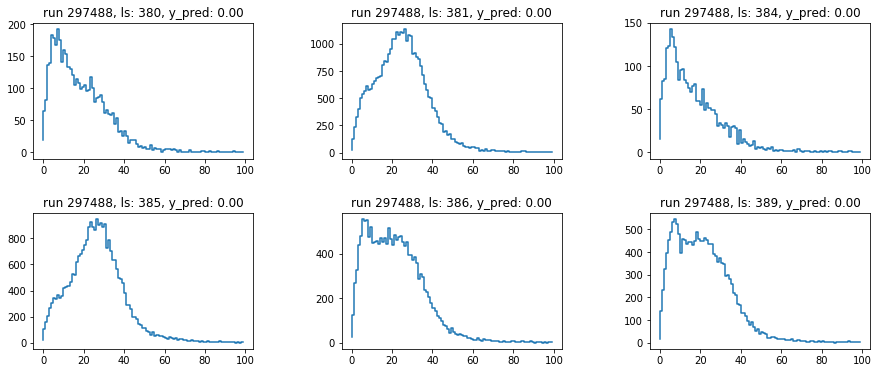

ANOMALOUS LS
Training set shape (15685, 121)
Explained variance ratio [0.82092152 0.15245088 0.0090498  0.00145453]


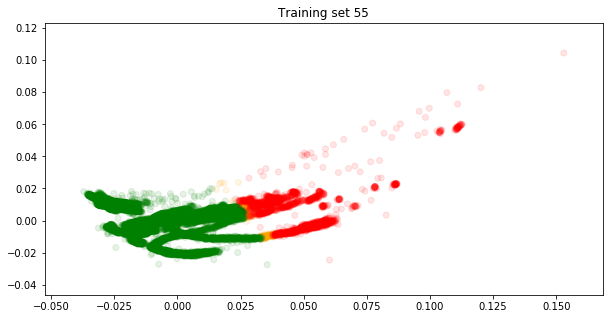

Training model
Epoch 00082: early stopping
Accuracy 1.0
[[ 554    0]
 [   0 3368]]

********************************************************************************
Classifying Run 297494

Explained variance ratio [0.96030364 0.02372374 0.00771634 0.00138893]


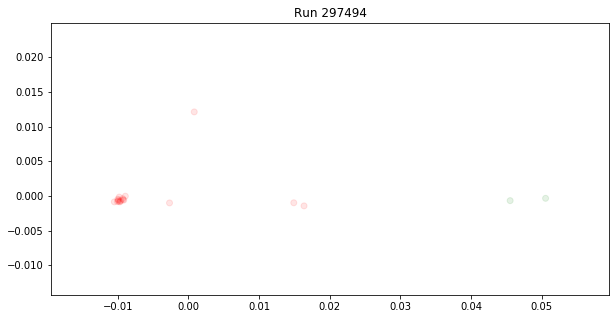

Good LS: 2 [53, 55]
Bad LS: 17 [35, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 54]
Anomalies LS: 0 []
GOOD LS


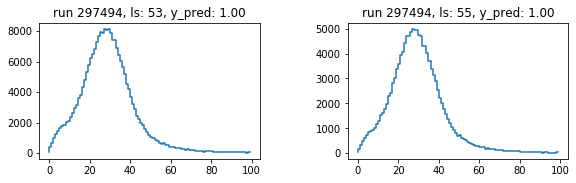

BAD LS


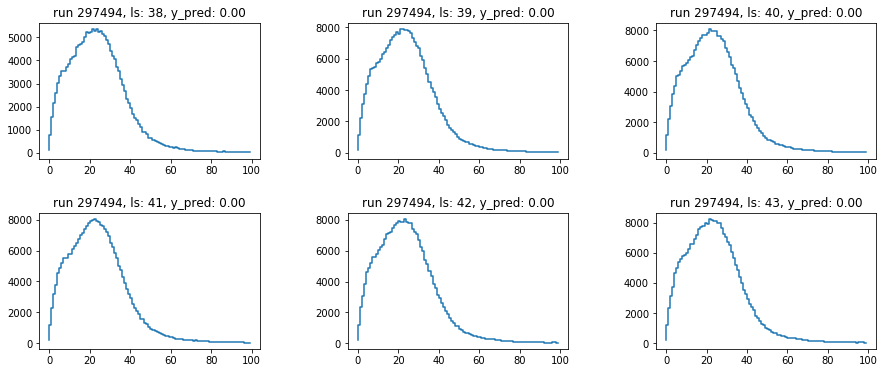

ANOMALOUS LS
Training set shape (15704, 121)
Explained variance ratio [0.82146959 0.15197197 0.00904753 0.00144906]


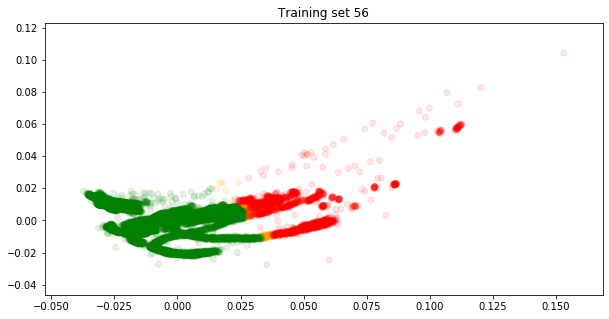

Training model
Epoch 00046: early stopping
Accuracy 1.0
[[ 557    1]
 [   0 3368]]

********************************************************************************
Classifying Run 297495

Explained variance ratio [0.18158394 0.13436028 0.10084025 0.08708262]


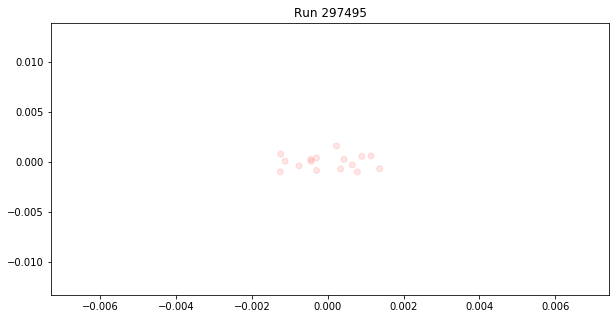

Good LS: 0 []
Bad LS: 16 [1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16]
Anomalies LS: 0 []
GOOD LS
BAD LS


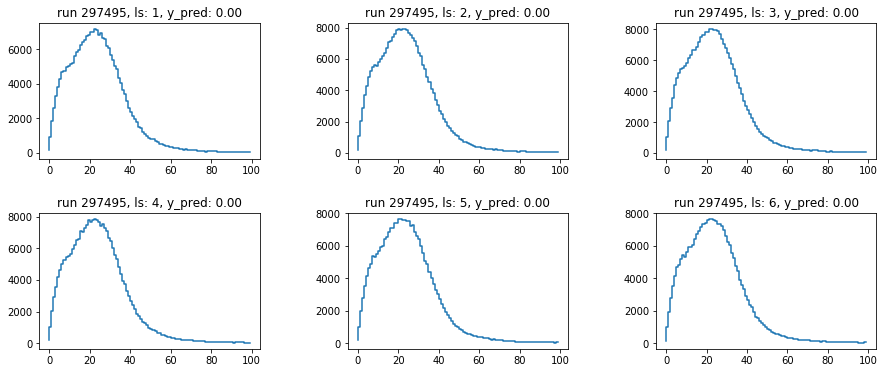

ANOMALOUS LS
Training set shape (15720, 121)
Explained variance ratio [0.82211268 0.15142317 0.00903269 0.00144288]


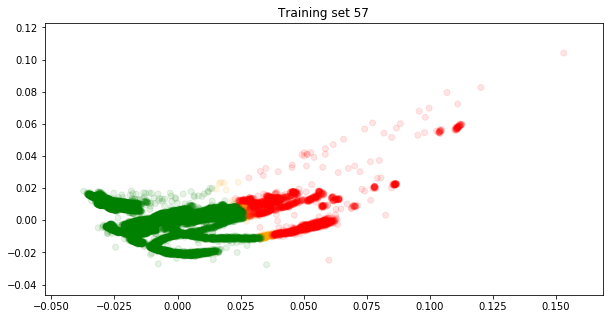

Training model
Epoch 00064: early stopping
Accuracy 1.0
[[ 561    1]
 [   0 3368]]

********************************************************************************
Classifying Run 297496

Explained variance ratio [0.4130871  0.28856552 0.03635517 0.03370127]


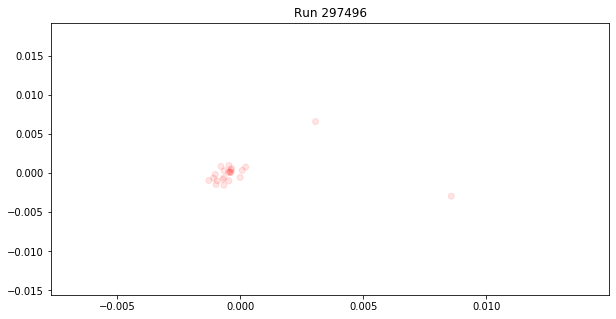

Good LS: 0 []
Bad LS: 23 [1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23]
Anomalies LS: 0 []
GOOD LS
BAD LS


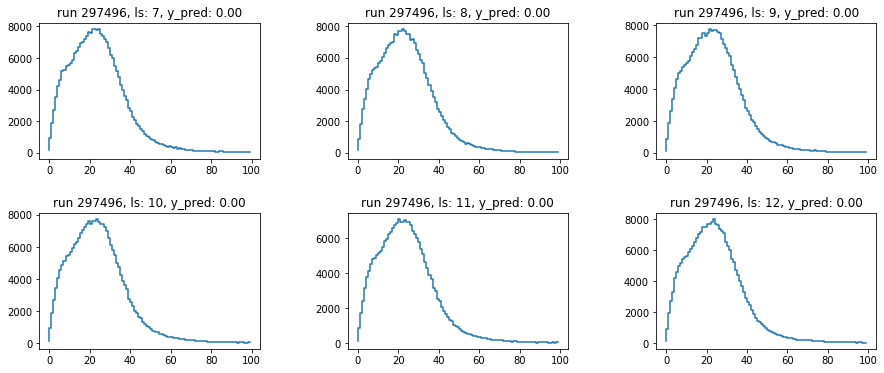

ANOMALOUS LS
Training set shape (15743, 121)
Explained variance ratio [0.82308089 0.15059363 0.00900297 0.00143342]


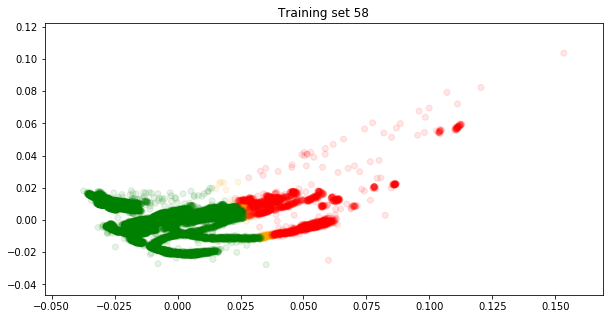

Training model
Epoch 00068: early stopping
Accuracy 0.999
[[ 566    2]
 [   0 3368]]

********************************************************************************
Classifying Run 297497

Explained variance ratio [0.41829936 0.08888349 0.0782412  0.06690883]


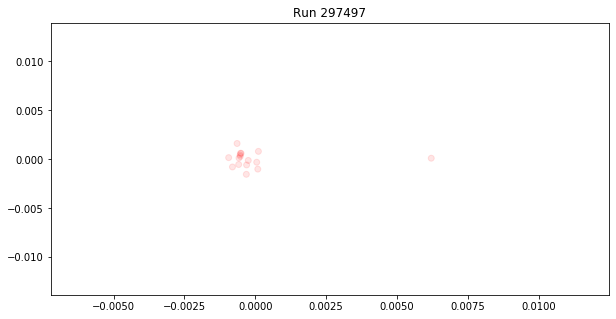

Good LS: 0 []
Bad LS: 16 [1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16]
Anomalies LS: 0 []
GOOD LS
BAD LS


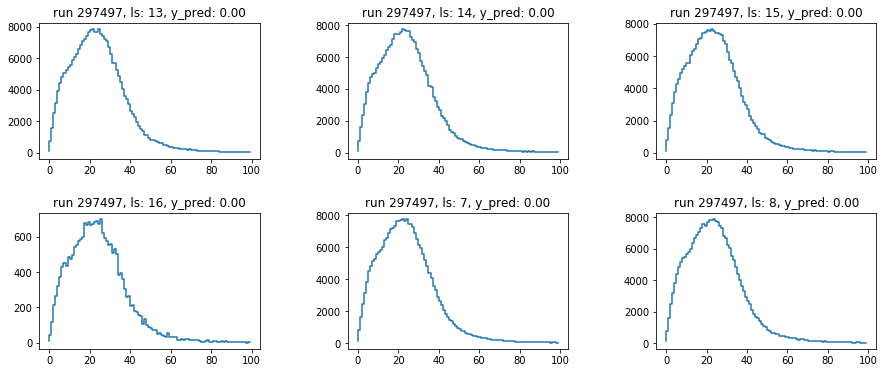

ANOMALOUS LS
Training set shape (15759, 121)
Explained variance ratio [0.82376987 0.15000981 0.00897108 0.00142669]


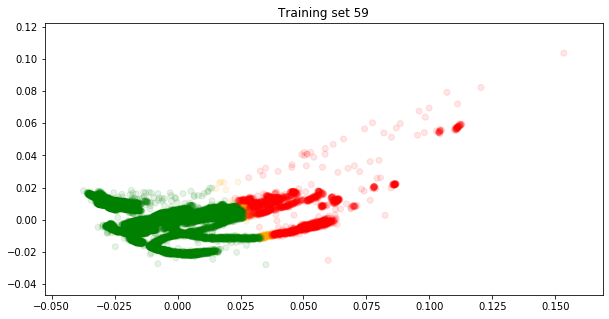

Training model
Epoch 00085: early stopping
Accuracy 1.0
[[ 572    0]
 [   0 3368]]

********************************************************************************
Classifying Run 297498

Explained variance ratio [0.22267363 0.13873979 0.11839851 0.09129253]


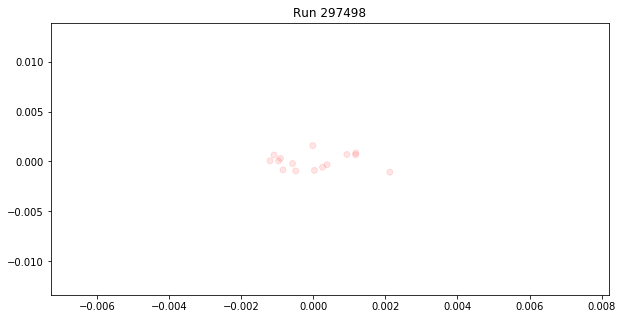

Good LS: 0 []
Bad LS: 15 [1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15]
Anomalies LS: 0 []
GOOD LS
BAD LS


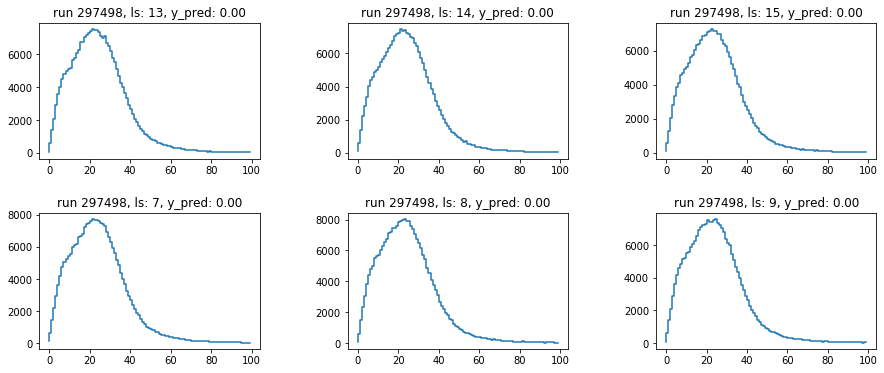

ANOMALOUS LS
Training set shape (15774, 121)
Explained variance ratio [0.82440914 0.14946856 0.00893734 0.00142174]


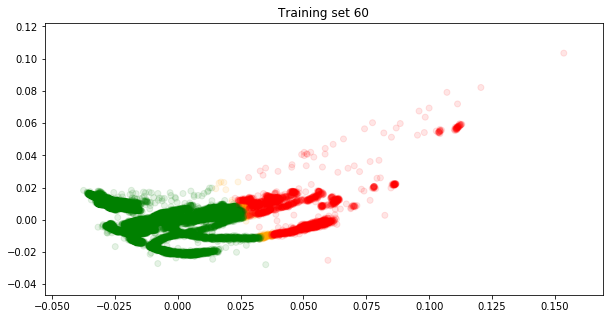

Training model
Epoch 00081: early stopping
Accuracy 1.0
[[ 575    0]
 [   1 3368]]

********************************************************************************
Classifying Run 297499

Explained variance ratio [0.19544763 0.1587162  0.10159146 0.08572268]


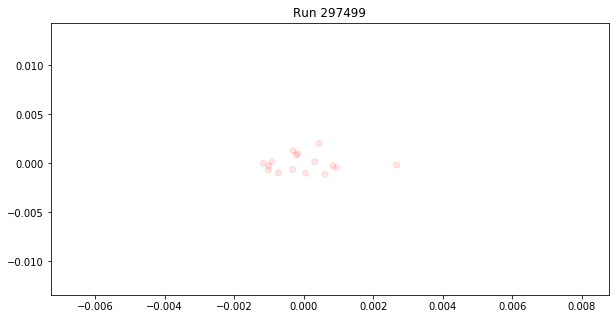

Good LS: 0 []
Bad LS: 16 [1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16]
Anomalies LS: 0 []
GOOD LS
BAD LS


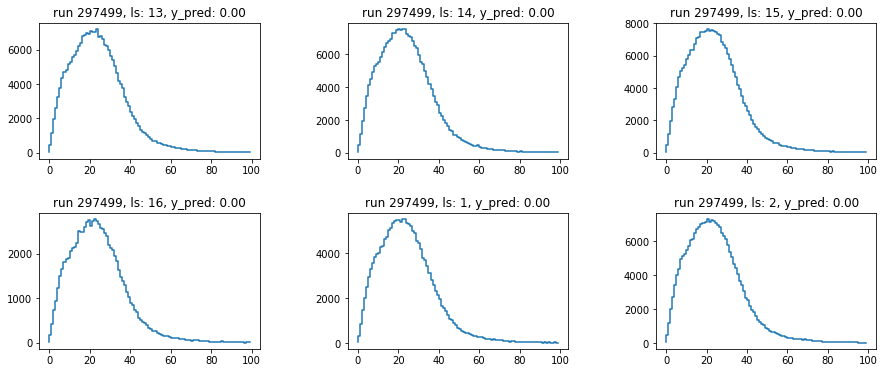

ANOMALOUS LS
Training set shape (15790, 121)
Explained variance ratio [0.82515673 0.14883437 0.00889182 0.0014198 ]


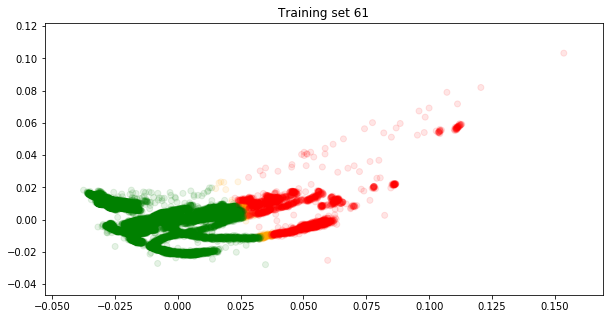

Training model
Epoch 00069: early stopping
Accuracy 0.999
[[ 577    2]
 [   0 3369]]

********************************************************************************
Classifying Run 297501

Explained variance ratio [0.89448234 0.0215184  0.01273714 0.00987414]


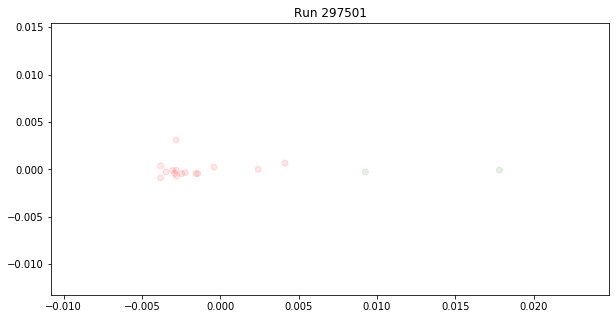

Good LS: 2 [4, 5]
Bad LS: 15 [1, 2, 3, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17]
Anomalies LS: 0 []
GOOD LS


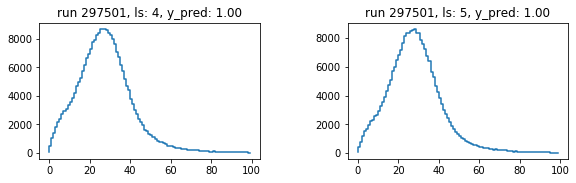

BAD LS


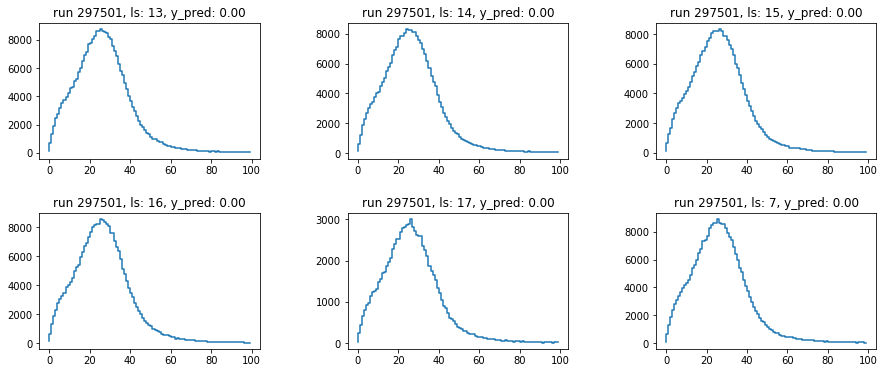

ANOMALOUS LS
Training set shape (15807, 121)
Explained variance ratio [0.8254174  0.14860575 0.00888032 0.00141781]


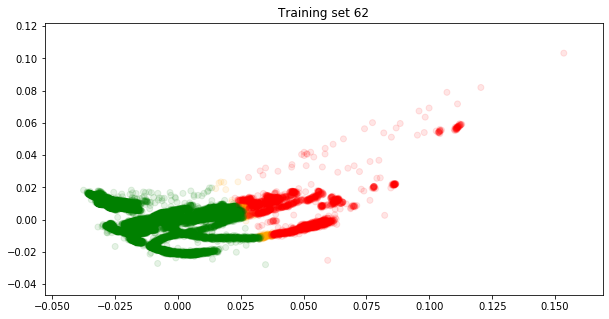

Training model
Epoch 00068: early stopping
Accuracy 0.999
[[ 580    3]
 [   0 3369]]

********************************************************************************
Classifying Run 297502

Explained variance ratio [0.14991535 0.13626796 0.10379525 0.09690051]


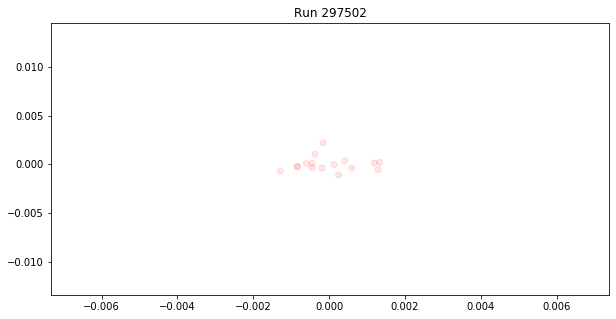

Good LS: 0 []
Bad LS: 16 [1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16]
Anomalies LS: 0 []
GOOD LS
BAD LS


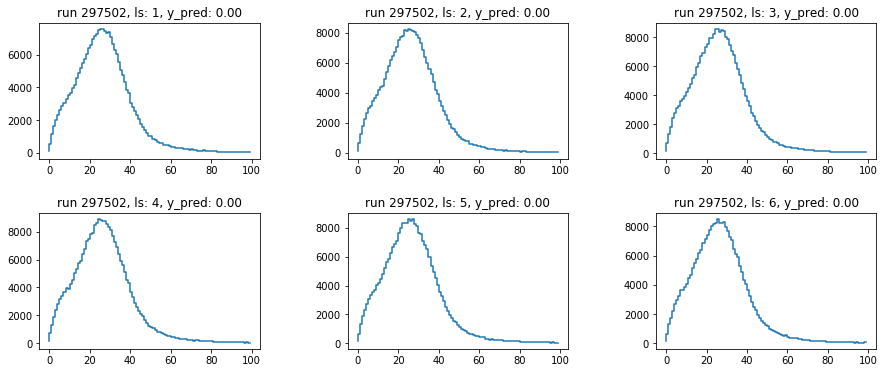

ANOMALOUS LS
Training set shape (15823, 121)
Explained variance ratio [0.82566891 0.14838404 0.00887008 0.00141593]


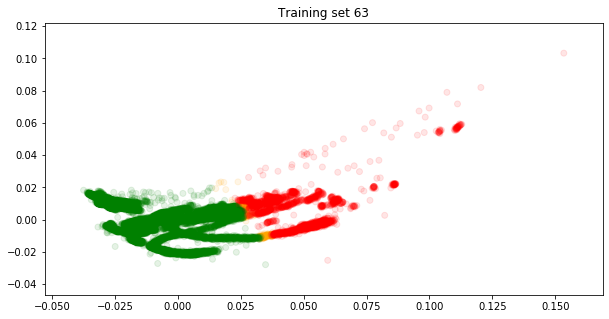

Training model
Epoch 00081: early stopping
Accuracy 1.0
[[ 587    0]
 [   0 3369]]

********************************************************************************
Classifying Run 297503

Explained variance ratio [0.73581272 0.05997124 0.04831304 0.03921841]


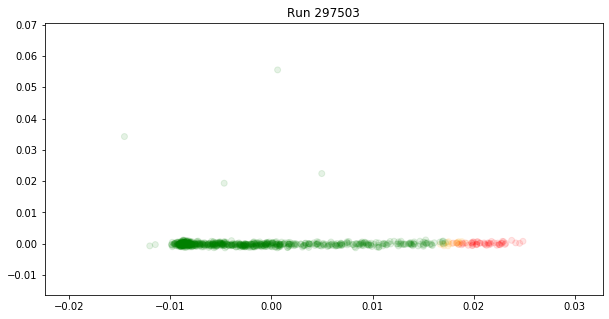

Good LS: 712 [59, 64, 65, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92, 93, 94, 95, 96, 97, 98, 99, 100, 101, 102, 103, 104, 105, 106, 107, 108, 109, 110, 111, 112, 113, 114, 115, 116, 117, 118, 119, 120, 121, 122, 123, 124, 125, 126, 127, 128, 129, 130, 131, 132, 133, 134, 135, 136, 137, 138, 139, 140, 141, 142, 143, 144, 145, 146, 147, 148, 149, 150, 151, 152, 153, 154, 155, 156, 157, 158, 159, 160, 161, 162, 163, 164, 165, 166, 167, 168, 169, 170, 171, 172, 173, 174, 175, 176, 177, 178, 179, 180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192, 193, 194, 195, 196, 197, 198, 199, 200, 201, 202, 203, 204, 205, 206, 207, 208, 209, 210, 211, 212, 213, 214, 215, 216, 217, 218, 219, 220, 221, 222, 223, 224, 225, 226, 227, 228, 229, 230, 231, 232, 233, 234, 235, 236, 237, 238, 239, 240, 241, 242, 243, 244, 245, 246, 247, 248, 249, 250, 251, 252, 253, 254, 255, 256, 257, 258, 259, 260, 261, 262, 263, 264, 265, 266, 267, 268, 2

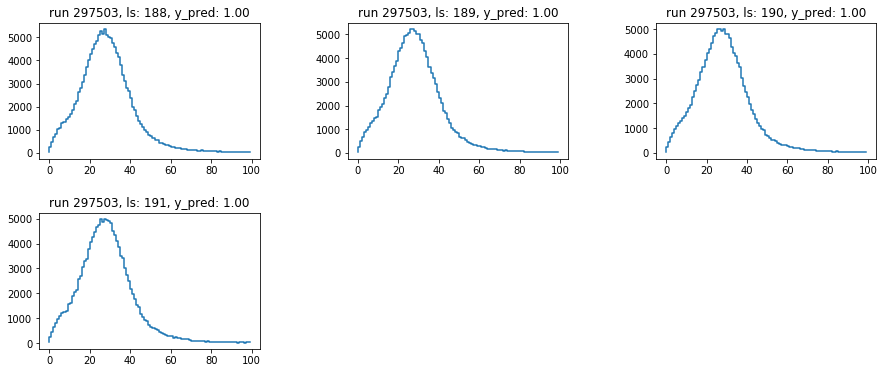

BAD LS


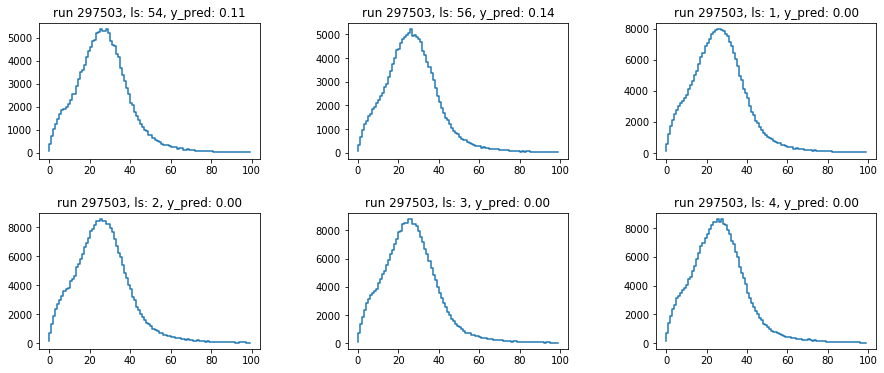

ANOMALOUS LS


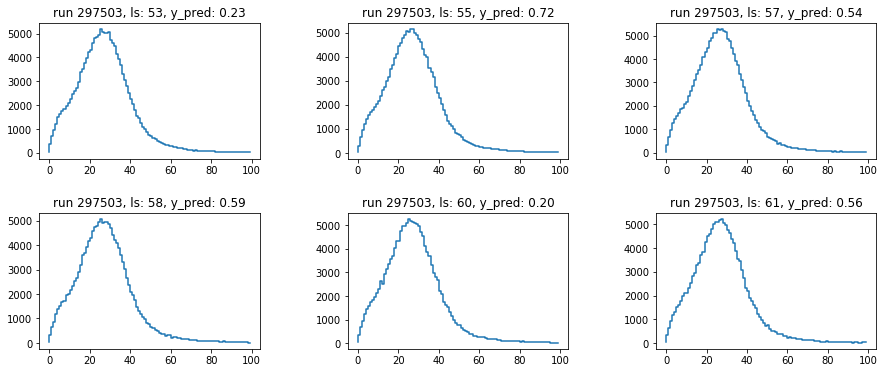

Training set shape (16583, 121)
Explained variance ratio [0.81568602 0.15735765 0.00867112 0.00148226]


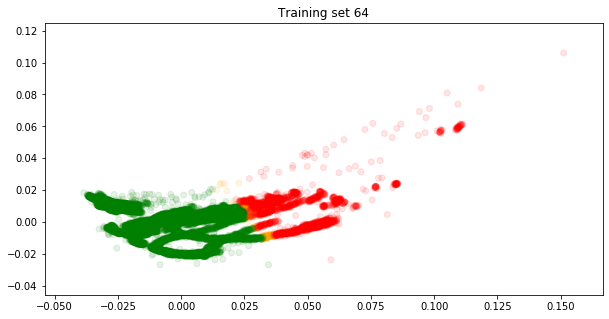

Training model
Epoch 00062: early stopping
Accuracy 1.0
[[ 599    0]
 [   0 3547]]

********************************************************************************
Classifying Run 297504

Explained variance ratio [0.18592649 0.12772394 0.09668733 0.09224173]


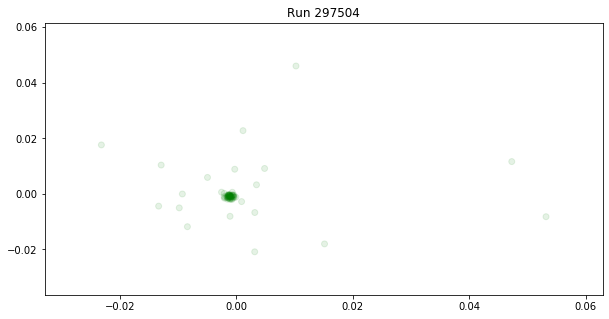

Good LS: 72 [1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 108, 109, 110, 111, 112, 113, 114, 115, 116, 117, 118, 119, 120, 121, 122, 123, 124, 125, 126, 127, 128, 129, 130, 131, 132, 133, 134, 135]
Bad LS: 0 []
Anomalies LS: 0 []
GOOD LS


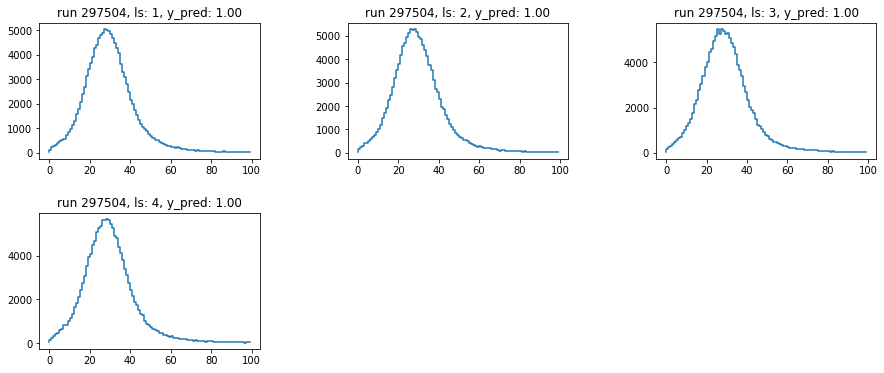

BAD LS
ANOMALOUS LS
Training set shape (16655, 121)
Explained variance ratio [0.81177412 0.158935   0.00866671 0.00155495]


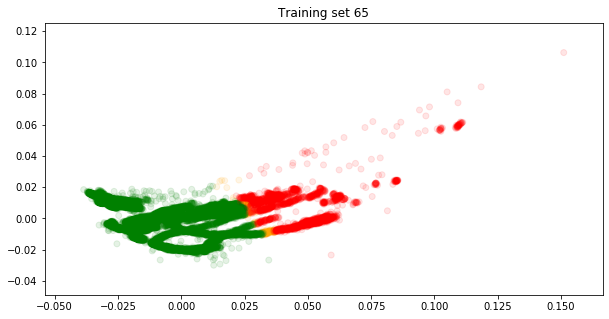

Training model
Epoch 00078: early stopping
Accuracy 1.0
[[ 599    0]
 [   0 3565]]

********************************************************************************
Classifying Run 297505

Explained variance ratio [0.42398893 0.05173678 0.02888207 0.02676341]


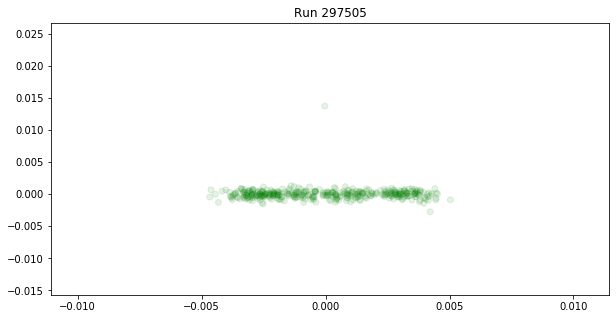

Good LS: 395 [1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92, 93, 94, 95, 96, 97, 98, 99, 100, 101, 102, 103, 104, 105, 106, 107, 108, 109, 110, 111, 112, 113, 114, 115, 116, 117, 118, 119, 120, 121, 122, 123, 124, 125, 126, 127, 128, 129, 130, 131, 132, 133, 134, 135, 136, 137, 138, 139, 140, 141, 142, 143, 144, 145, 146, 147, 148, 149, 150, 151, 152, 153, 154, 155, 156, 157, 158, 159, 160, 161, 162, 163, 164, 165, 166, 167, 168, 169, 170, 171, 172, 173, 174, 175, 176, 177, 178, 179, 180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192, 193, 194, 195, 196, 197, 198, 199, 200, 201, 202, 203, 204, 205, 206, 207, 208, 209, 210, 211, 212, 213, 214, 215, 216, 217, 218, 219,

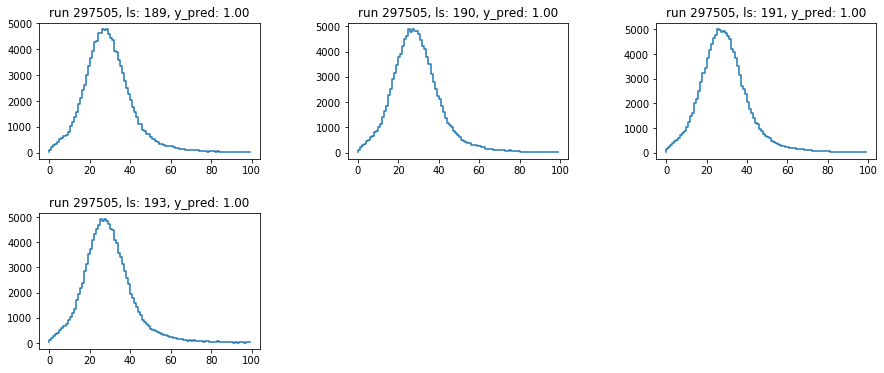

BAD LS
ANOMALOUS LS
Training set shape (17050, 121)
Explained variance ratio [0.80062063 0.17028321 0.00852659 0.00159374]


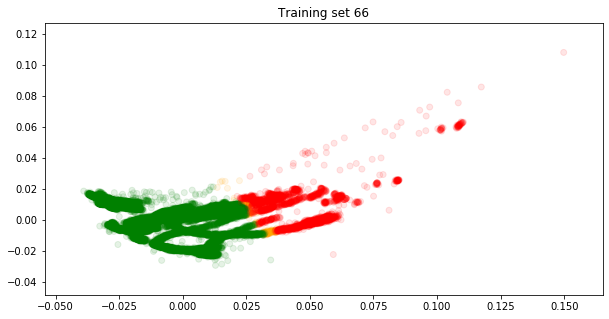

Training model
Epoch 00084: early stopping
Accuracy 1.0
[[ 597    2]
 [   0 3664]]

********************************************************************************
Classifying Run 297557

Explained variance ratio [0.92130242 0.03495049 0.00560268 0.00384342]


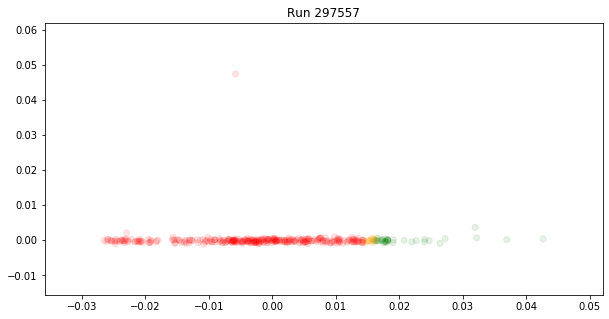

Good LS: 35 [12, 13, 15, 18, 20, 21, 160, 162, 356, 358, 363, 367, 368, 369, 370, 372, 373, 374, 375, 376, 377, 378, 379, 380, 381, 382, 383, 384, 385, 386, 387, 388, 389, 390, 391]
Bad LS: 329 [10, 14, 16, 17, 19, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92, 93, 94, 95, 96, 97, 98, 99, 100, 101, 102, 103, 104, 105, 106, 107, 108, 109, 110, 111, 112, 113, 114, 115, 116, 117, 118, 119, 120, 121, 122, 123, 124, 125, 126, 127, 128, 129, 130, 131, 132, 133, 134, 135, 136, 137, 138, 139, 140, 141, 142, 143, 144, 145, 146, 147, 148, 149, 150, 151, 152, 153, 154, 155, 156, 157, 158, 159, 161, 163, 164, 165, 166, 167, 168, 169, 170, 171, 172, 173, 174, 175, 176, 177, 178, 179, 180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192, 193, 194, 195, 196

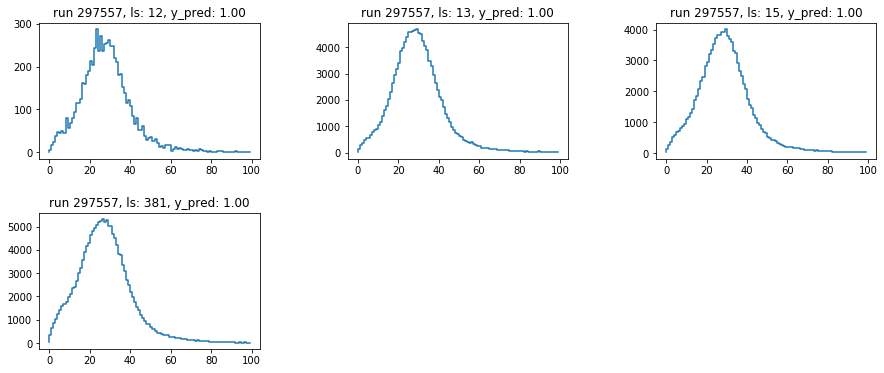

BAD LS


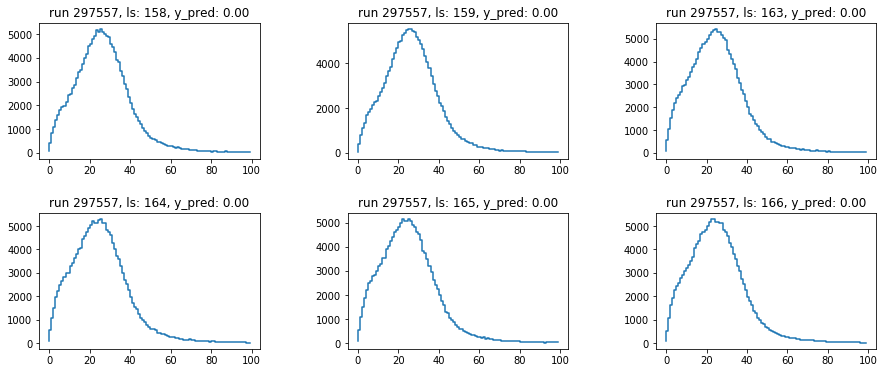

ANOMALOUS LS


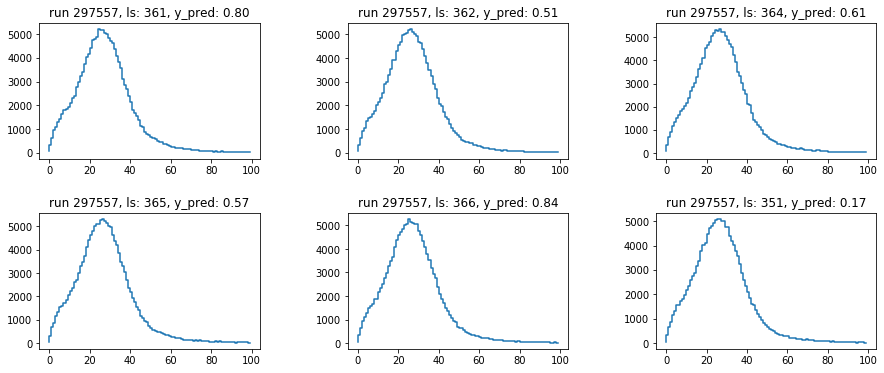

Training set shape (17414, 121)
Explained variance ratio [0.80862423 0.16316999 0.00828689 0.00154831]


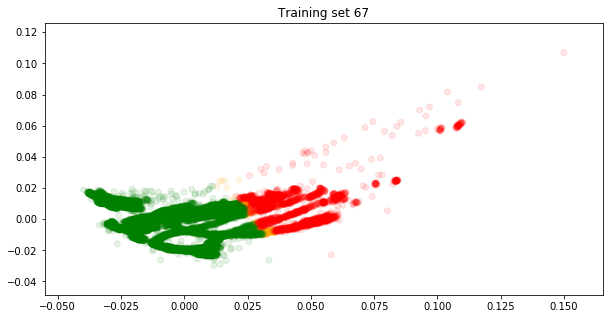

Training model
Epoch 00054: early stopping
Accuracy 1.0
[[ 680    1]
 [   0 3673]]

********************************************************************************
Classifying Run 297558

Explained variance ratio [0.71625971 0.02238686 0.0146746  0.01291545]


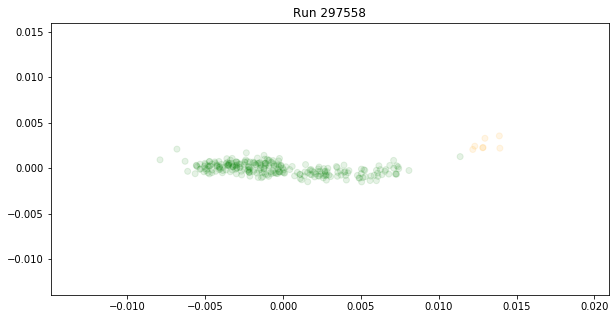

Good LS: 256 [7, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92, 93, 94, 95, 96, 97, 98, 99, 100, 101, 102, 103, 104, 105, 106, 107, 108, 109, 110, 111, 112, 113, 114, 115, 116, 117, 118, 119, 120, 121, 122, 123, 124, 125, 126, 127, 128, 129, 130, 131, 132, 133, 134, 135, 136, 137, 138, 139, 140, 141, 142, 143, 144, 145, 146, 147, 148, 149, 150, 151, 152, 153, 154, 155, 156, 157, 158, 159, 160, 161, 162, 163, 164, 165, 166, 167, 168, 169, 170, 171, 172, 173, 174, 175, 176, 177, 178, 179, 180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192, 193, 194, 195, 196, 197, 198, 199, 200, 201, 202, 203, 204, 205, 206, 207, 208, 209, 210, 211, 212, 213, 214, 215, 216, 217, 218, 219, 220, 221, 222, 223, 

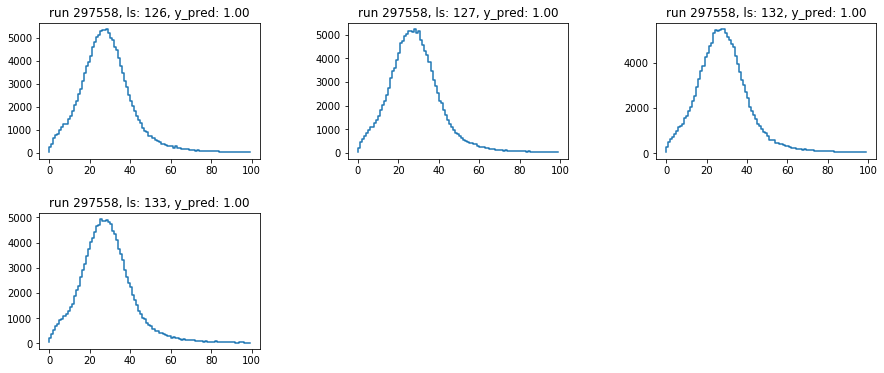

BAD LS
ANOMALOUS LS


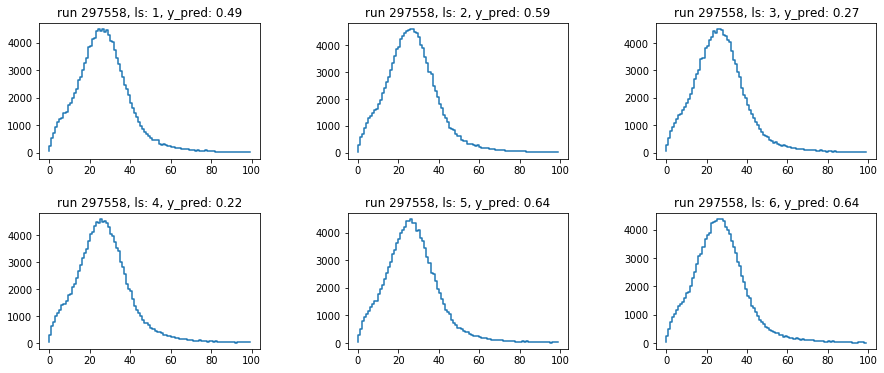

Training set shape (17670, 121)
Explained variance ratio [0.80730364 0.16457145 0.00822442 0.00155183]


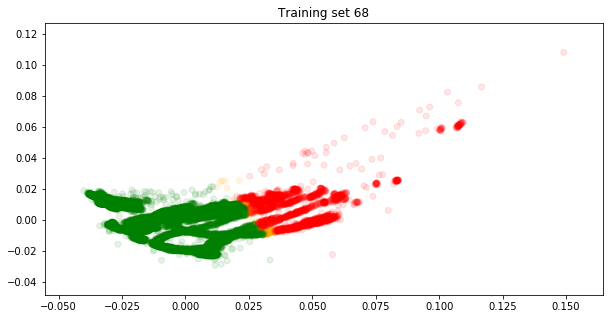

Training model
Epoch 00079: early stopping
Accuracy 1.0
[[ 681    0]
 [   1 3736]]

********************************************************************************
Classifying Run 297562

Explained variance ratio [0.38022943 0.04414797 0.03071508 0.02931449]


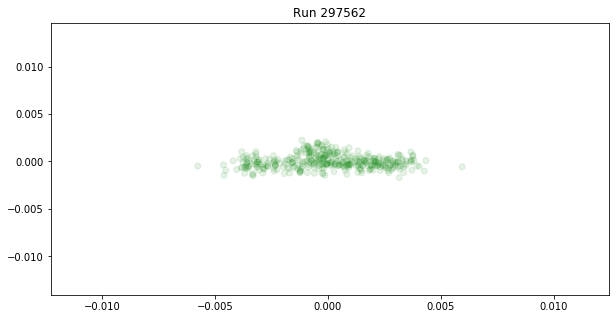

Good LS: 364 [1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92, 93, 94, 95, 96, 97, 98, 99, 100, 101, 102, 103, 104, 105, 106, 107, 108, 109, 110, 111, 112, 113, 114, 115, 116, 117, 118, 119, 120, 121, 122, 123, 124, 125, 126, 127, 128, 129, 130, 131, 132, 133, 134, 135, 136, 137, 138, 139, 140, 141, 142, 143, 144, 145, 146, 147, 148, 149, 150, 151, 152, 153, 154, 155, 156, 157, 158, 159, 160, 161, 162, 163, 164, 165, 166, 167, 168, 169, 170, 171, 172, 173, 174, 175, 176, 177, 178, 179, 180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192, 193, 194, 195, 196, 197, 198, 199, 200, 201, 202, 203, 204, 205, 206, 207, 208, 209, 210, 211, 212, 213, 214, 215, 216, 217, 218, 219,

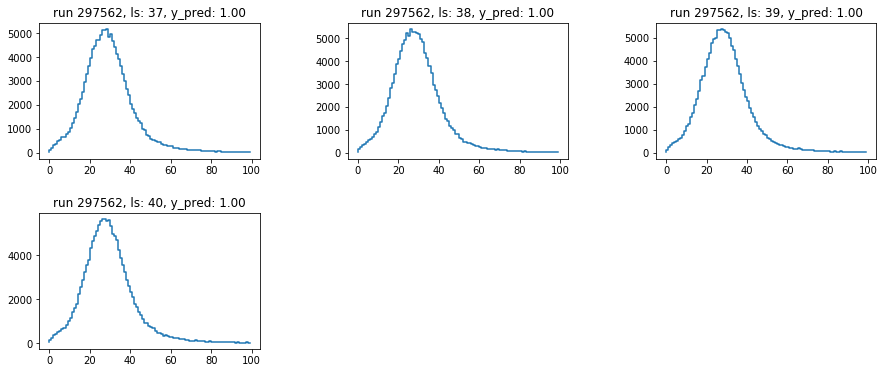

BAD LS
ANOMALOUS LS
Training set shape (18034, 121)
Explained variance ratio [0.79737616 0.1746447  0.00810711 0.00163453]


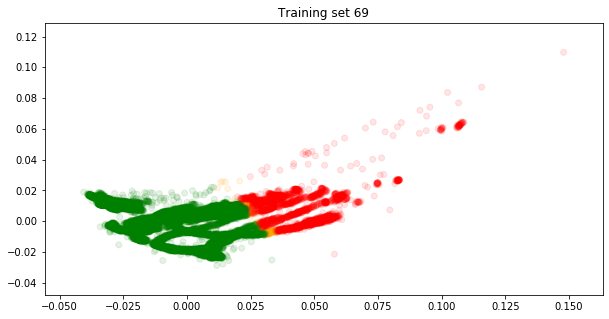

Training model
Epoch 00084: early stopping
Accuracy 1.0
[[ 680    1]
 [   0 3828]]

********************************************************************************
Classifying Run 297563

Explained variance ratio [0.60216871 0.12966575 0.05686323 0.01301658]


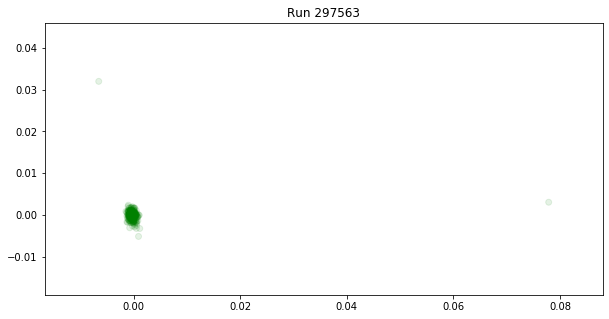

Good LS: 265 [1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92, 93, 94, 95, 96, 97, 98, 99, 100, 101, 102, 103, 104, 105, 106, 107, 108, 109, 110, 111, 112, 113, 114, 115, 116, 117, 118, 119, 120, 121, 122, 123, 124, 125, 126, 127, 128, 129, 130, 131, 132, 133, 134, 135, 136, 137, 138, 139, 140, 141, 142, 143, 144, 145, 146, 147, 148, 149, 150, 151, 152, 153, 154, 155, 156, 157, 158, 159, 160, 161, 162, 163, 164, 165, 166, 167, 168, 169, 170, 171, 172, 173, 174, 175, 176, 177, 178, 179, 180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192, 193, 194, 195, 196, 197, 198, 199, 200, 201, 202, 203, 204, 205, 206, 207, 208, 209, 210, 211, 212, 213, 214, 215, 216, 217, 218, 219,

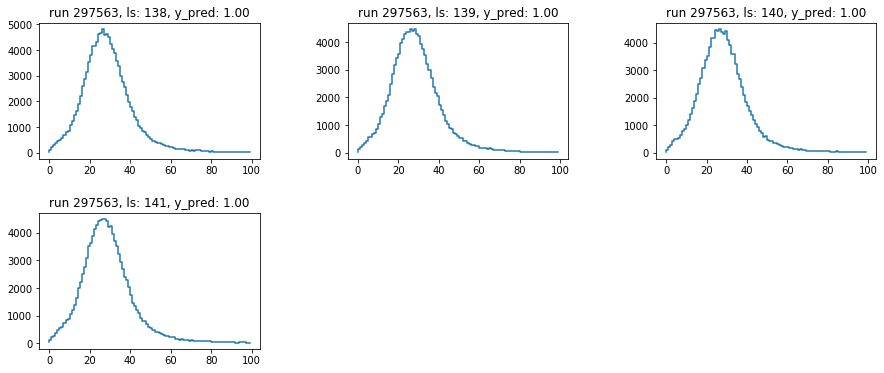

BAD LS
ANOMALOUS LS
Training set shape (18299, 121)
Explained variance ratio [0.79018484 0.18159754 0.00800971 0.00171877]


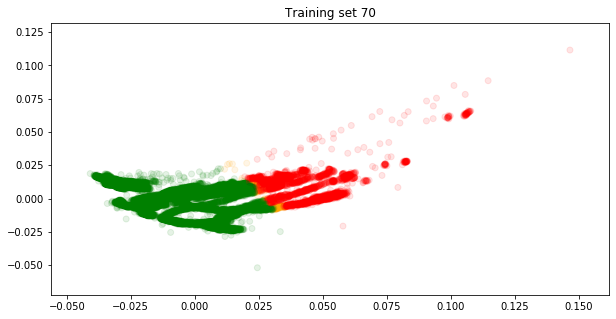

Training model
Epoch 00075: early stopping
Accuracy 1.0
[[ 680    1]
 [   0 3894]]

********************************************************************************
Classifying Run 297598

Explained variance ratio [0.66662609 0.19260899 0.06530392 0.04950272]


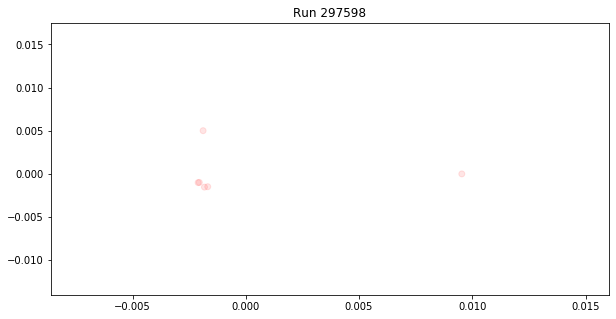

Good LS: 0 []
Bad LS: 6 [19, 21, 22, 23, 24, 25]
Anomalies LS: 0 []
GOOD LS
BAD LS


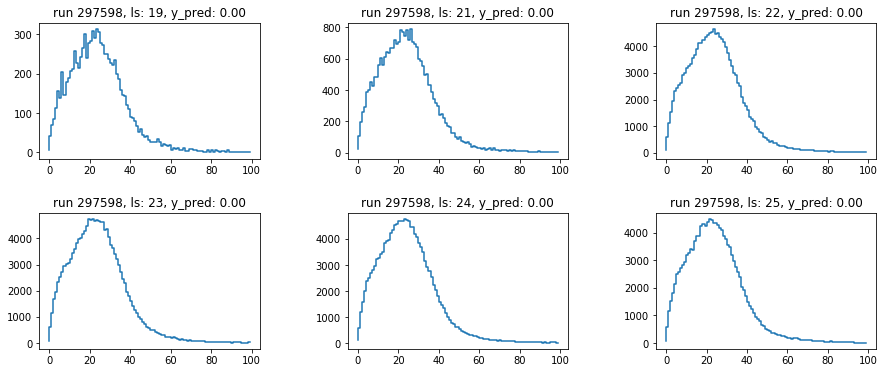

ANOMALOUS LS
Training set shape (18305, 121)
Explained variance ratio [0.79038222 0.18142101 0.00800279 0.00171678]


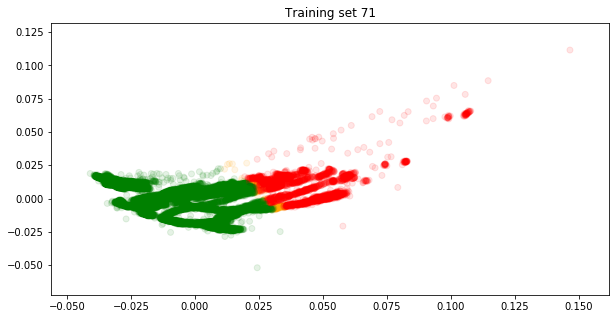

Training model
Epoch 00057: early stopping
Accuracy 1.0
[[ 682    1]
 [   0 3894]]

********************************************************************************
Classifying Run 297599

Explained variance ratio [0.75002114 0.10004949 0.0555609  0.02158099]


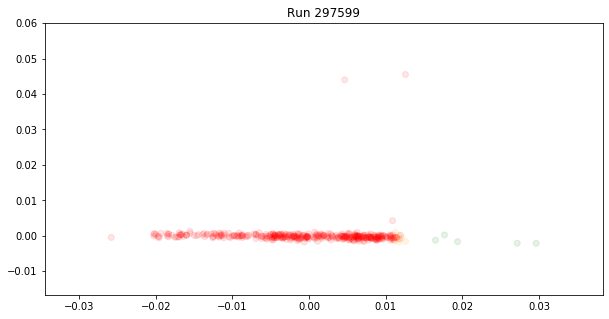

Good LS: 5 [38, 40, 46, 147, 311]
Bad LS: 389 [1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 39, 41, 42, 43, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92, 93, 94, 95, 96, 97, 98, 99, 100, 101, 102, 103, 104, 105, 106, 107, 108, 109, 110, 111, 112, 113, 114, 115, 116, 117, 118, 119, 120, 121, 122, 123, 124, 125, 126, 127, 128, 129, 130, 131, 132, 133, 134, 135, 136, 137, 138, 139, 140, 141, 142, 143, 144, 145, 146, 148, 149, 150, 151, 152, 153, 154, 155, 156, 157, 158, 159, 160, 161, 162, 163, 164, 165, 166, 167, 168, 169, 170, 171, 172, 173, 174, 175, 176, 177, 178, 179, 180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192, 193, 194, 195, 196, 197, 198, 199, 200, 201, 202, 203, 204, 205, 206, 207, 208, 209, 210, 211, 212, 213, 214, 215, 216, 217, 2

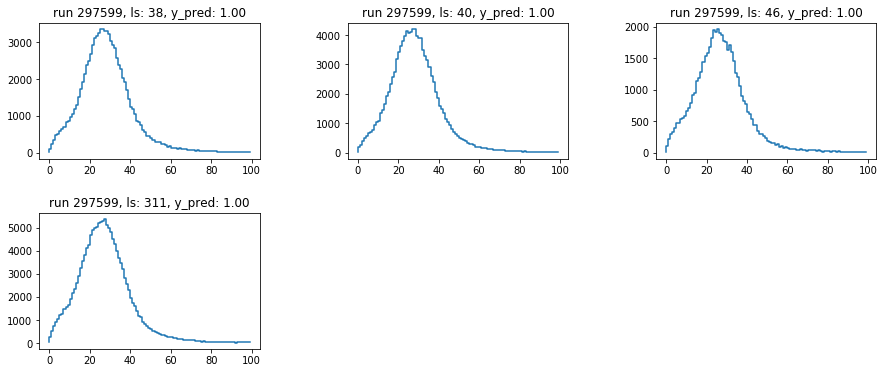

BAD LS


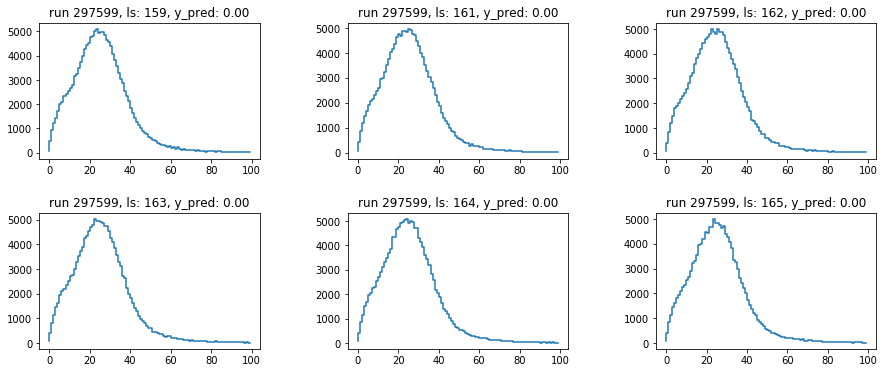

ANOMALOUS LS


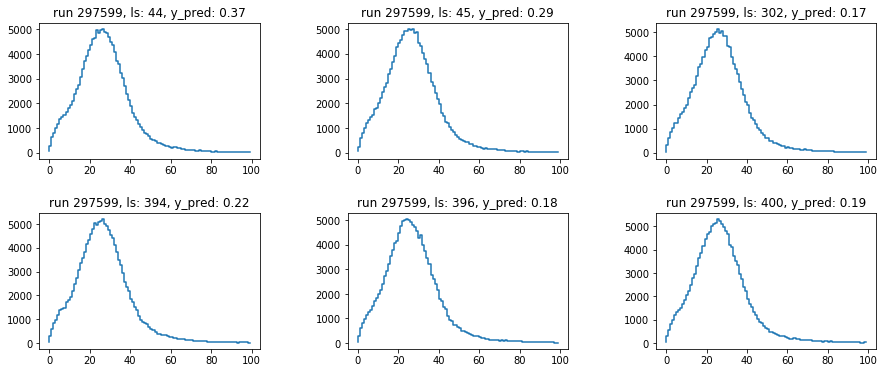

Training set shape (18699, 121)
Explained variance ratio [0.79786585 0.17446217 0.00771147 0.00168971]


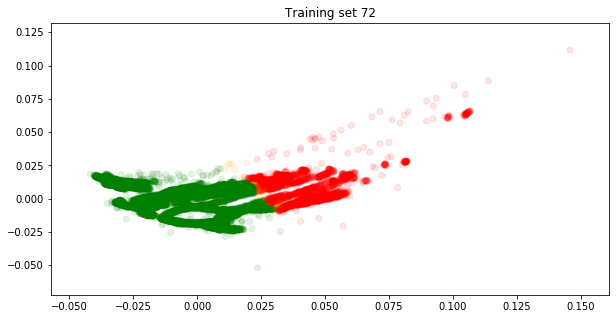

Training model
Epoch 00059: early stopping
Accuracy 1.0
[[ 780    0]
 [   1 3894]]

********************************************************************************
Classifying Run 297603

Explained variance ratio [0.65774221 0.02295196 0.01724925 0.01616688]


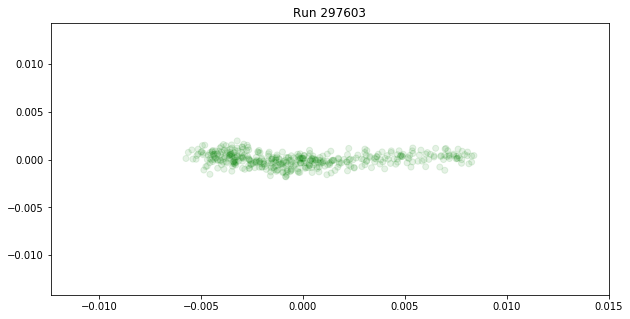

Good LS: 418 [1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92, 93, 94, 95, 96, 97, 98, 99, 100, 101, 102, 103, 104, 105, 106, 107, 108, 109, 110, 111, 112, 113, 114, 115, 116, 117, 118, 119, 120, 121, 122, 123, 124, 125, 126, 127, 128, 129, 130, 131, 132, 133, 134, 135, 136, 137, 138, 139, 140, 141, 142, 143, 144, 145, 146, 147, 148, 149, 150, 151, 152, 153, 154, 155, 156, 157, 158, 159, 160, 161, 162, 163, 164, 165, 166, 167, 168, 169, 170, 171, 172, 173, 174, 175, 176, 177, 178, 179, 180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192, 193, 194, 195, 196, 197, 198, 199, 200, 201, 202, 203, 204, 205, 206, 207, 208, 209, 210, 211, 212, 213, 214, 215, 216, 217, 218, 219,

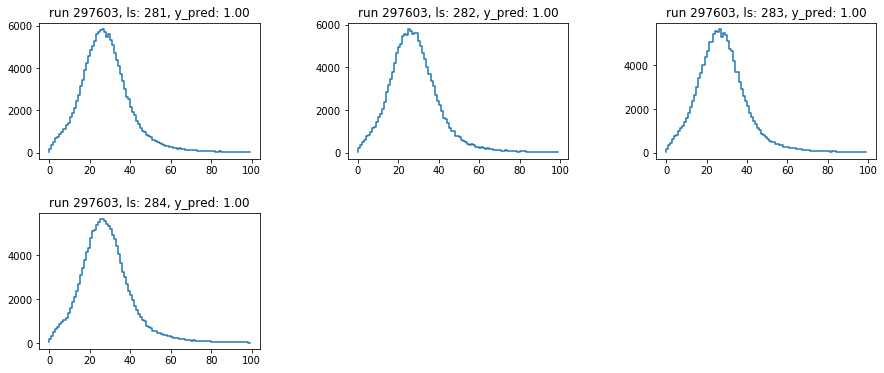

BAD LS
ANOMALOUS LS
Training set shape (19117, 121)
Explained variance ratio [0.79418811 0.1783713  0.00759413 0.00175281]


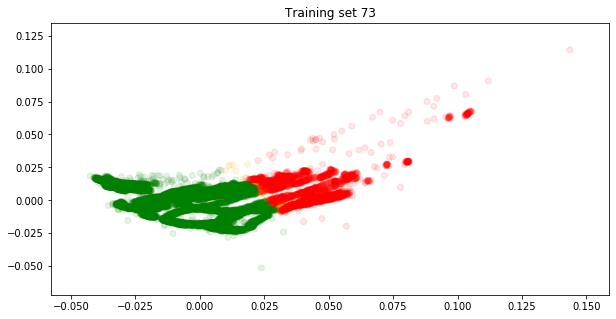

Training model
Epoch 00067: early stopping
Accuracy 1.0
[[ 779    1]
 [   0 4000]]

********************************************************************************
Classifying Run 297604

Explained variance ratio [0.30353296 0.07054528 0.03314237 0.03168093]


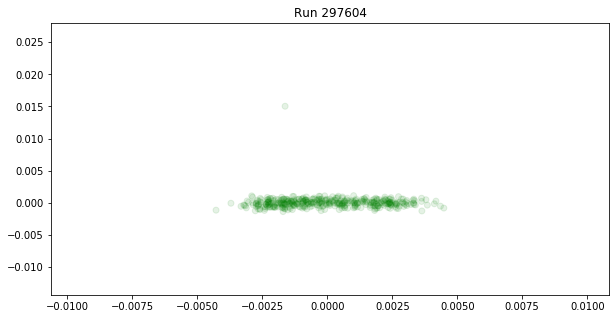

Good LS: 404 [1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92, 93, 94, 95, 96, 97, 98, 99, 100, 101, 102, 103, 104, 105, 106, 107, 108, 109, 110, 111, 112, 113, 114, 115, 116, 117, 118, 119, 120, 121, 122, 123, 124, 125, 126, 127, 128, 129, 130, 131, 132, 133, 134, 135, 136, 137, 138, 139, 140, 141, 142, 143, 144, 145, 146, 147, 148, 149, 150, 151, 152, 153, 154, 155, 156, 157, 158, 159, 160, 161, 162, 163, 164, 165, 166, 167, 168, 169, 170, 171, 172, 173, 174, 175, 176, 177, 178, 179, 180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192, 193, 194, 195, 196, 197, 198, 199, 200, 201, 202, 203, 204, 205, 206, 207, 208, 209, 210, 211, 212, 213, 214, 215, 216, 217, 218, 219,

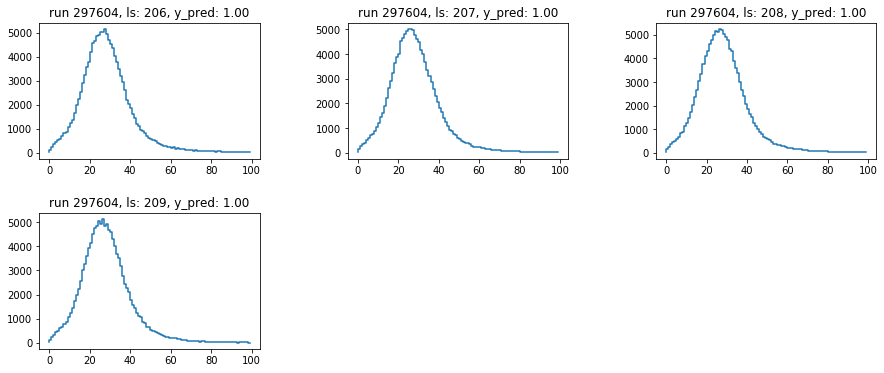

BAD LS
ANOMALOUS LS
Training set shape (19521, 121)
Explained variance ratio [0.78569906 0.18711682 0.00747289 0.00181097]


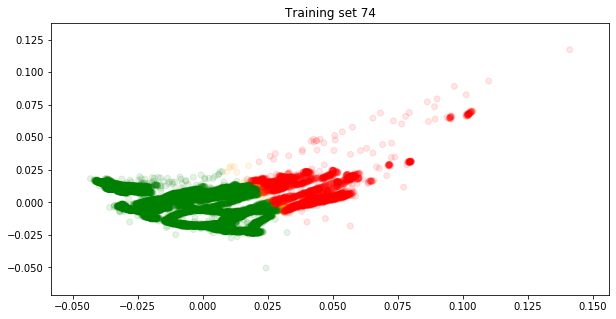

Training model
Epoch 00064: early stopping
Accuracy 1.0
[[ 779    1]
 [   0 4101]]

********************************************************************************
Classifying Run 297605

Explained variance ratio [0.46782061 0.16807347 0.0223334  0.01885301]


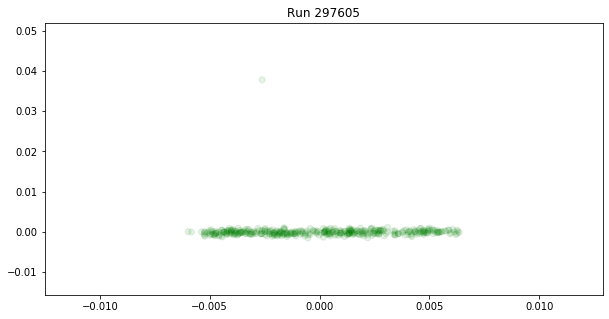

Good LS: 403 [1, 2, 3, 4, 5, 6, 7, 8, 9, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92, 93, 94, 95, 96, 97, 98, 99, 100, 101, 102, 103, 104, 105, 106, 107, 108, 109, 110, 111, 112, 113, 114, 115, 116, 117, 118, 119, 120, 121, 122, 123, 124, 125, 126, 127, 128, 129, 130, 131, 132, 133, 134, 135, 136, 137, 138, 139, 140, 141, 142, 143, 144, 145, 146, 147, 148, 149, 150, 151, 152, 153, 154, 155, 156, 157, 158, 159, 160, 161, 162, 163, 164, 165, 166, 167, 168, 169, 170, 171, 172, 173, 174, 175, 176, 177, 178, 179, 180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192, 193, 194, 195, 196, 197, 198, 199, 200, 201, 202, 203, 204, 205, 206, 207, 208, 209, 210, 211, 212, 213, 214, 215, 216, 217, 218, 219, 220

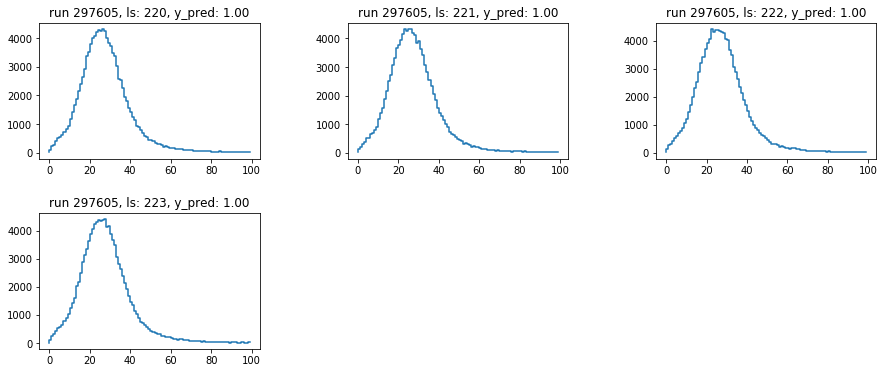

BAD LS
ANOMALOUS LS
Training set shape (19924, 121)
Explained variance ratio [0.77967975 0.19333951 0.00746584 0.0018483 ]


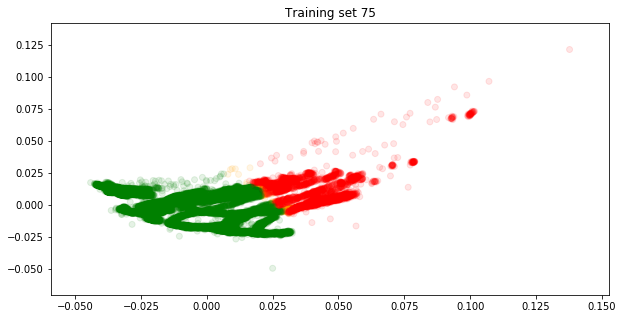

Training model
Epoch 00064: early stopping
Accuracy 1.0
[[ 779    1]
 [   0 4201]]

********************************************************************************
Classifying Run 297606

Explained variance ratio [0.27132267 0.04110927 0.04041399 0.03787047]


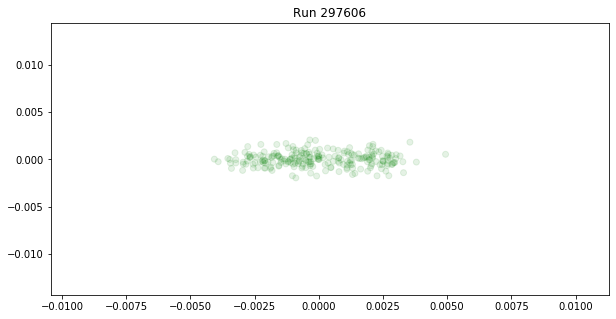

Good LS: 232 [1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92, 93, 94, 95, 96, 97, 98, 99, 100, 101, 102, 103, 104, 105, 106, 107, 108, 109, 110, 111, 112, 113, 114, 115, 116, 117, 118, 119, 120, 121, 122, 123, 124, 125, 126, 127, 128, 129, 130, 131, 132, 133, 134, 135, 136, 137, 138, 139, 140, 141, 142, 143, 144, 145, 146, 147, 148, 149, 150, 151, 152, 153, 154, 155, 156, 157, 158, 159, 160, 161, 162, 163, 164, 165, 166, 167, 168, 169, 170, 171, 172, 173, 174, 175, 176, 177, 178, 179, 180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192, 193, 194, 195, 196, 197, 198, 199, 200, 201, 202, 203, 204, 205, 206, 207, 208, 209, 210, 211, 212, 213, 214, 215, 216, 217, 218, 219,

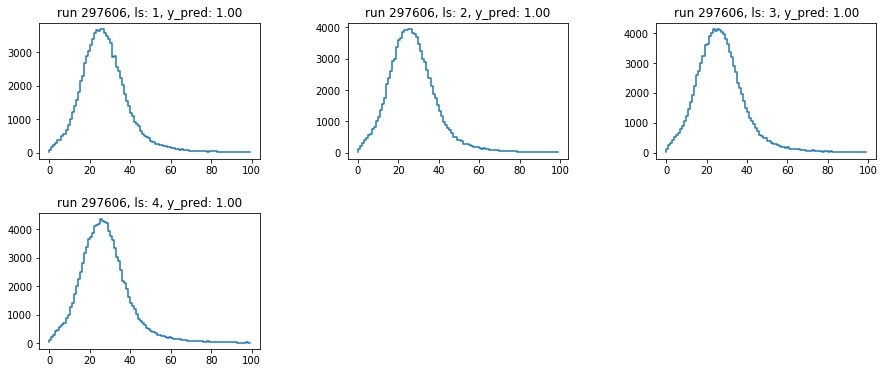

BAD LS
ANOMALOUS LS
Training set shape (20156, 121)
Explained variance ratio [0.77782044 0.19534912 0.00751701 0.00183884]


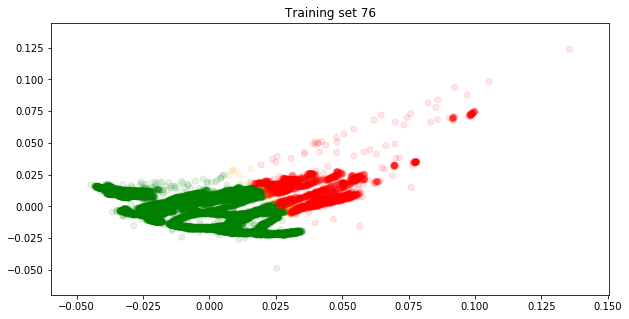

Training model
Epoch 00050: early stopping
Accuracy 0.998
[[ 780    0]
 [   8 4251]]

********************************************************************************
Classifying Run 297620

Explained variance ratio [0.91899321 0.01266616 0.00501939 0.00437261]


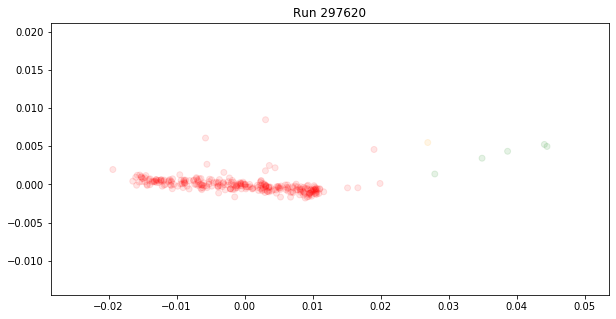

Good LS: 5 [39, 41, 44, 46, 291]
Bad LS: 278 [34, 37, 38, 40, 42, 43, 45, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92, 93, 94, 95, 96, 97, 98, 99, 100, 101, 102, 103, 104, 105, 106, 107, 108, 109, 110, 111, 112, 113, 114, 115, 116, 117, 118, 119, 120, 121, 122, 123, 124, 125, 126, 127, 128, 129, 130, 131, 132, 133, 134, 135, 136, 137, 138, 139, 140, 141, 142, 143, 144, 145, 146, 147, 148, 149, 150, 151, 152, 153, 154, 155, 156, 157, 158, 159, 160, 161, 162, 163, 164, 165, 166, 167, 168, 169, 170, 171, 172, 173, 174, 175, 176, 177, 178, 179, 180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192, 193, 194, 195, 196, 197, 198, 199, 200, 201, 202, 203, 204, 205, 206, 207, 208, 209, 210, 211, 212, 213, 214, 215, 216, 217, 218, 219, 220, 221, 222, 223, 224, 225, 226, 227, 228, 229, 230, 231, 232, 233, 234, 235, 236, 237, 238, 239, 240, 241, 242, 243

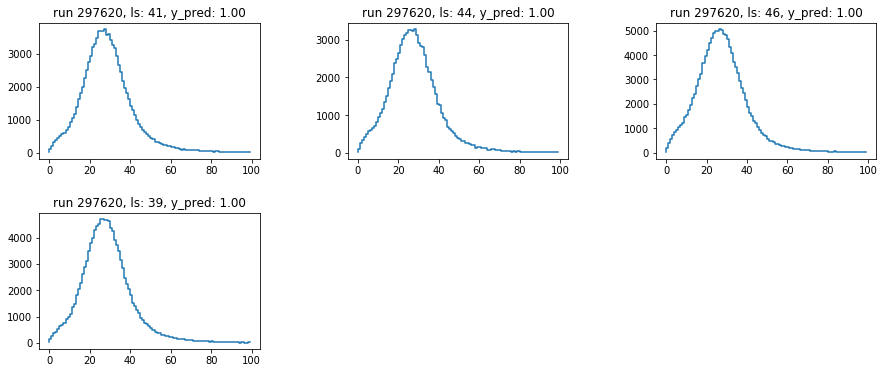

BAD LS


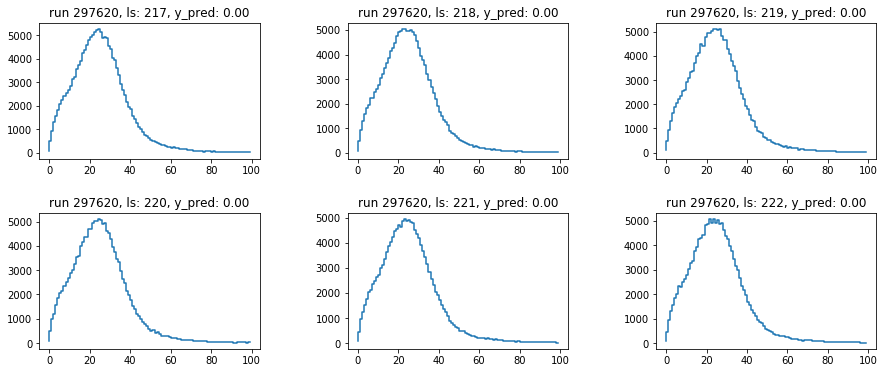

ANOMALOUS LS


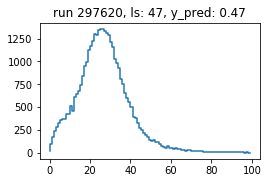

Training set shape (20439, 121)
Explained variance ratio [0.78380754 0.1901391  0.00730884 0.00179226]


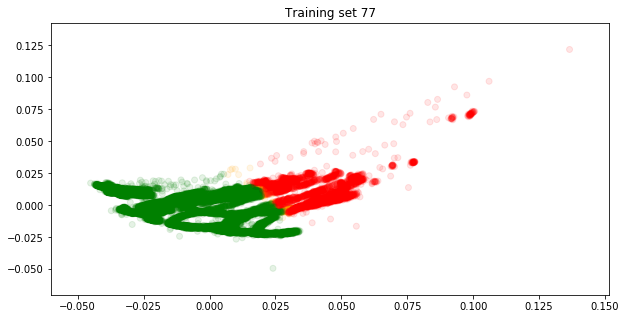

Training model
Epoch 00062: early stopping
Accuracy 1.0
[[ 850    0]
 [   0 4260]]

********************************************************************************
Classifying Run 297656

Explained variance ratio [0.72873483 0.0761619  0.0526382  0.04456182]


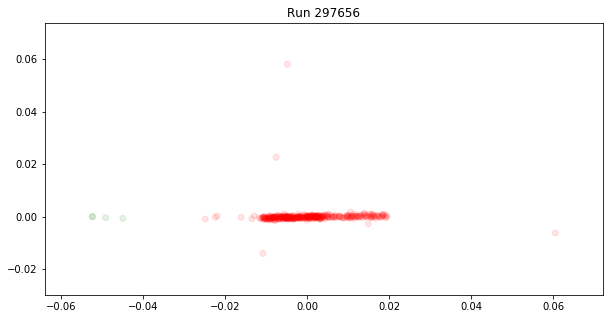

Good LS: 4 [40, 41, 44, 46]
Bad LS: 388 [37, 42, 43, 45, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92, 93, 94, 95, 96, 97, 98, 99, 100, 101, 102, 103, 104, 105, 106, 107, 108, 109, 110, 111, 112, 113, 114, 115, 116, 117, 118, 119, 120, 121, 122, 123, 124, 125, 126, 127, 128, 129, 130, 131, 132, 133, 134, 135, 136, 137, 138, 139, 140, 141, 142, 143, 144, 145, 146, 147, 148, 149, 150, 151, 152, 153, 154, 155, 156, 157, 158, 159, 160, 161, 162, 163, 164, 165, 166, 167, 168, 169, 170, 171, 172, 173, 174, 175, 176, 177, 178, 179, 180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192, 193, 194, 195, 196, 197, 198, 199, 200, 201, 202, 203, 204, 205, 206, 207, 208, 209, 210, 211, 212, 213, 214, 215, 216, 217, 218, 219, 220, 221, 222, 223, 224, 225, 226, 227, 228, 229, 230, 231, 232, 233, 234, 235, 236, 237, 238, 239, 240, 241, 242, 243, 244, 245, 2

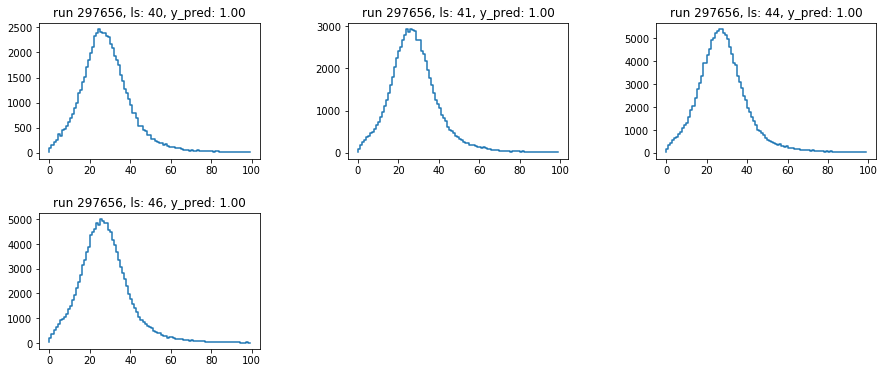

BAD LS


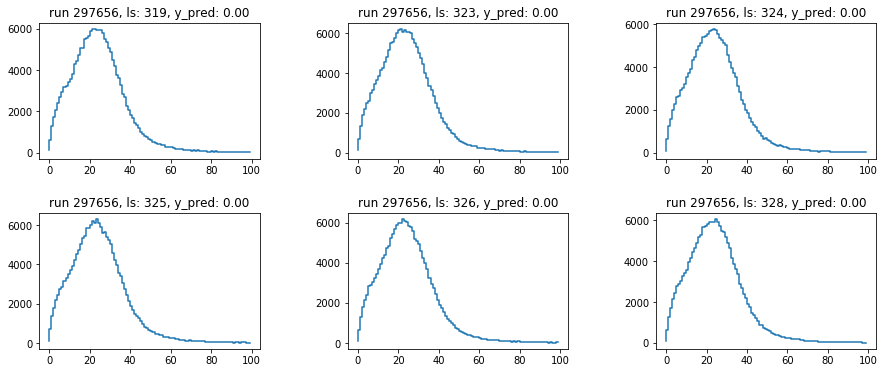

ANOMALOUS LS
Training set shape (20831, 121)
Explained variance ratio [0.79278996 0.18202562 0.00696901 0.00172249]


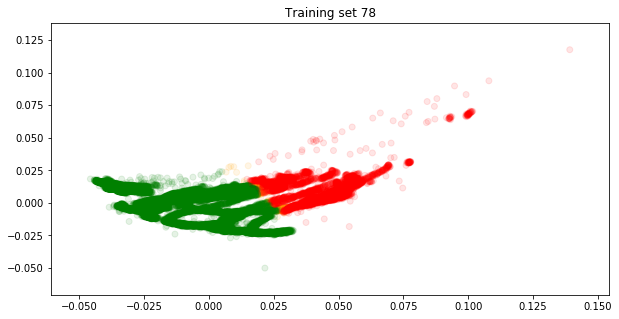

Training model
Epoch 00064: early stopping
Accuracy 1.0
[[ 946    1]
 [   0 4261]]

********************************************************************************
Classifying Run 297657

Explained variance ratio [0.15795911 0.12949883 0.1104251  0.09167779]


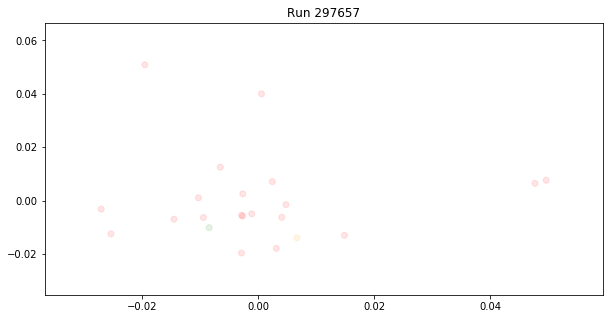

Good LS: 1 [17]
Bad LS: 20 [1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 15, 16, 19, 20, 21, 22, 23]
Anomalies LS: 1 [14]
GOOD LS


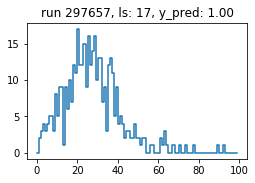

BAD LS


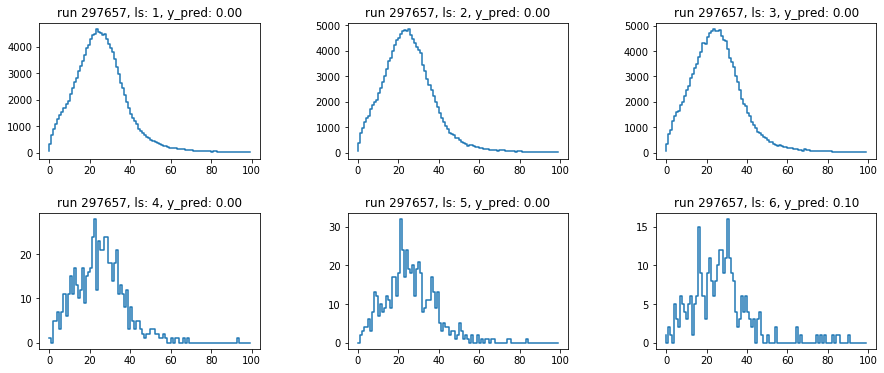

ANOMALOUS LS


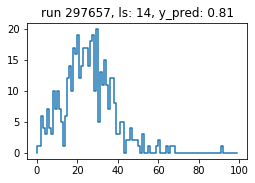

Training set shape (20852, 121)
Explained variance ratio [0.79129037 0.18135304 0.00699301 0.00173476]


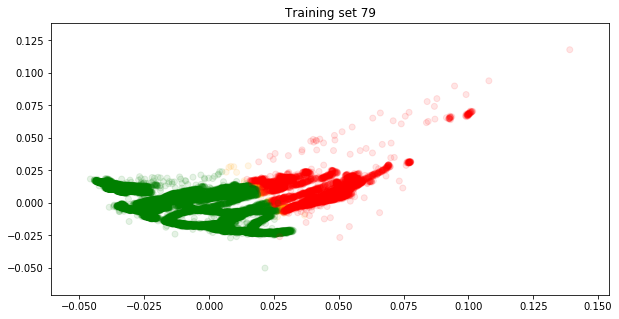

Training model
Epoch 00066: early stopping
Accuracy 1.0
[[ 951    0]
 [   0 4262]]

********************************************************************************
Classifying Run 297658

Explained variance ratio [0.24823483 0.17598962 0.12551061 0.07413267]


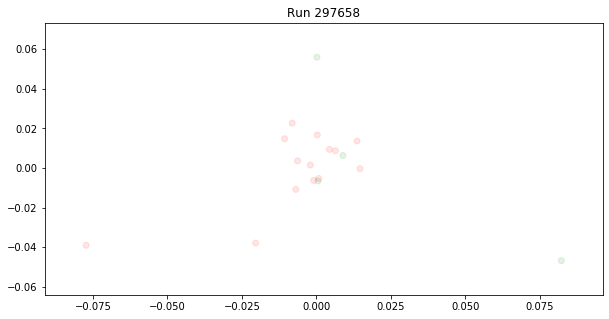

Good LS: 4 [3, 6, 15, 17]
Bad LS: 14 [1, 2, 4, 5, 7, 8, 9, 10, 11, 12, 13, 14, 16, 18]
Anomalies LS: 0 []
GOOD LS


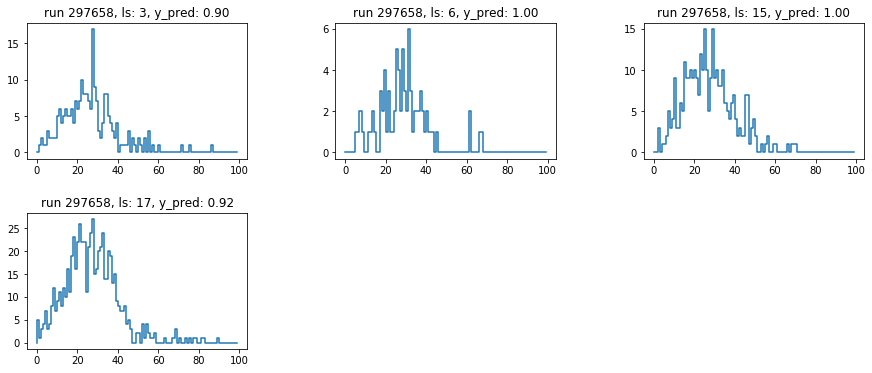

BAD LS


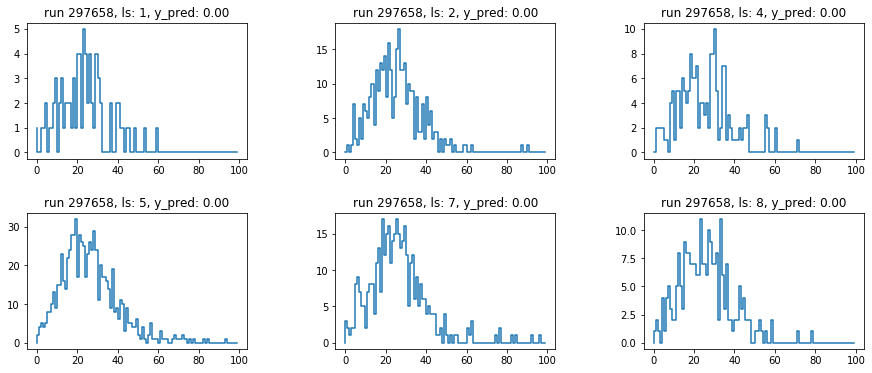

ANOMALOUS LS
Training set shape (20870, 121)
Explained variance ratio [0.78937651 0.18064    0.00701144 0.00179494]


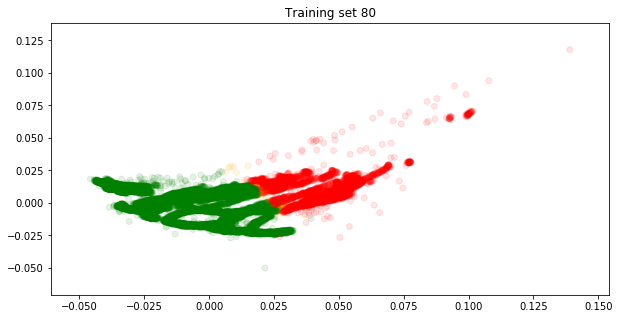

Training model
Epoch 00056: early stopping
Accuracy 1.0
[[ 955    0]
 [   2 4261]]

********************************************************************************
Classifying Run 297659

Explained variance ratio [0.22002606 0.15295496 0.14802992 0.09884247]


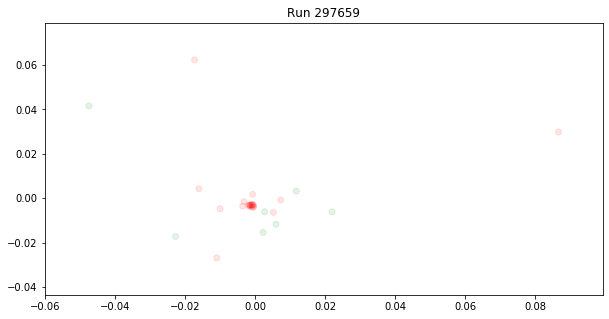

Good LS: 7 [11, 13, 16, 20, 21, 22, 24]
Bad LS: 23 [1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 12, 14, 15, 17, 18, 19, 23, 25, 26, 27, 28, 29, 30]
Anomalies LS: 0 []
GOOD LS


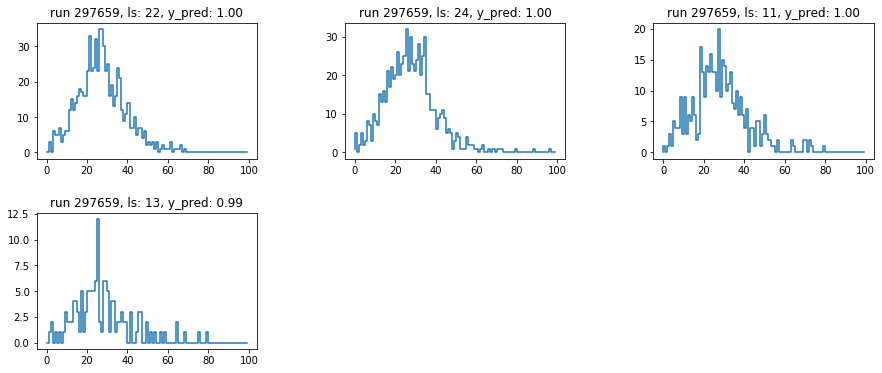

BAD LS


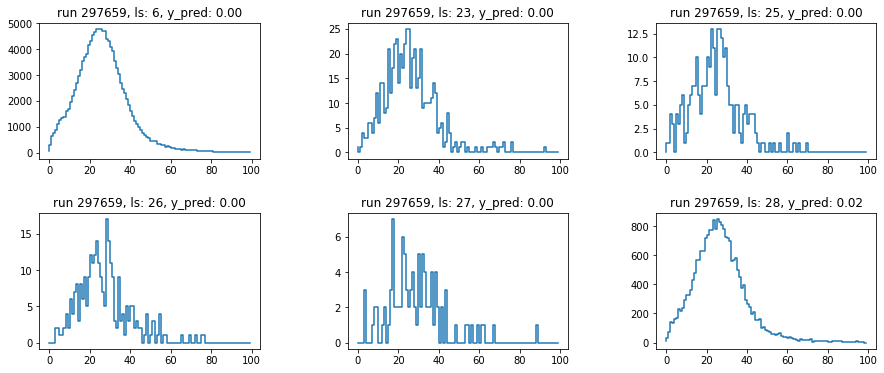

ANOMALOUS LS
Training set shape (20900, 121)
Explained variance ratio [0.78756921 0.18001037 0.00703667 0.00184854]


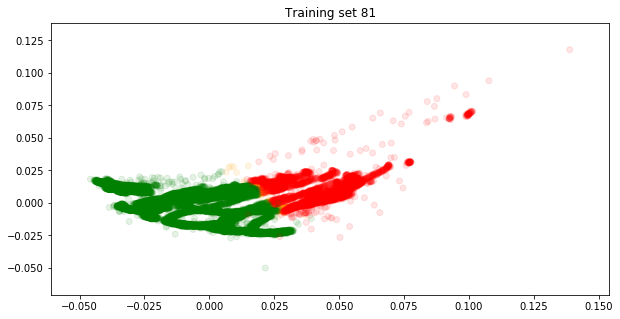

Training model
Epoch 00051: early stopping
Accuracy 1.0
[[ 961    0]
 [   0 4264]]

********************************************************************************
Classifying Run 297660

Explained variance ratio [0.7557775  0.13659296 0.01646676 0.01221259]


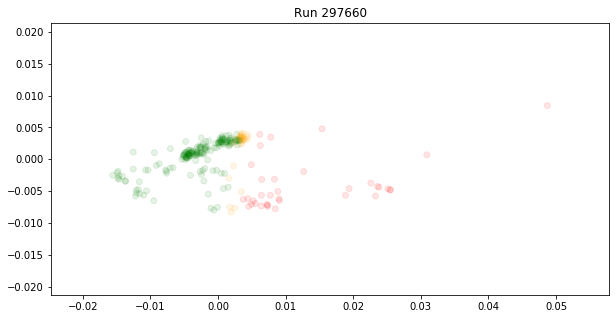

Good LS: 174 [12, 16, 17, 18, 19, 20, 21, 25, 26, 30, 31, 40, 41, 43, 44, 45, 46, 47, 48, 49, 50, 51, 53, 54, 55, 56, 58, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92, 95, 99, 102, 105, 109, 112, 115, 116, 119, 120, 121, 122, 123, 124, 125, 126, 127, 128, 129, 130, 131, 132, 133, 134, 135, 136, 137, 138, 139, 140, 141, 142, 143, 144, 145, 146, 147, 148, 149, 150, 151, 152, 153, 154, 155, 156, 157, 158, 159, 160, 161, 162, 163, 164, 171, 178, 181, 182, 184, 185, 186, 187, 188, 189, 190, 191, 192, 193, 194, 195, 196, 197, 198, 199, 200, 201, 202, 203, 204, 205, 206, 207, 208, 209, 210, 211, 212, 213, 214, 215, 216, 217, 218, 219, 220, 221, 223, 224, 225, 226, 227, 228, 229, 230, 231, 232, 233, 234, 235, 236, 237, 238, 239, 240]
Bad LS: 35 [1, 23, 24, 27, 28, 29, 32, 33, 93, 94, 96, 97, 100, 101, 103, 104, 107, 108, 110, 111, 113, 114, 117, 118, 165, 166, 167, 169, 170, 172, 173, 174, 175, 176, 177]
Anom

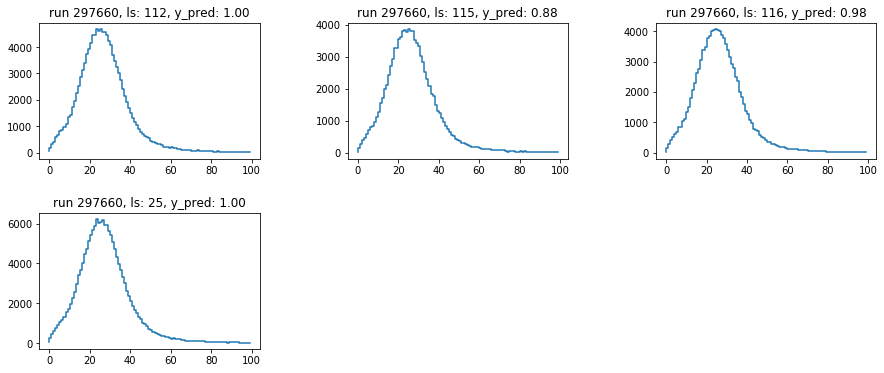

BAD LS


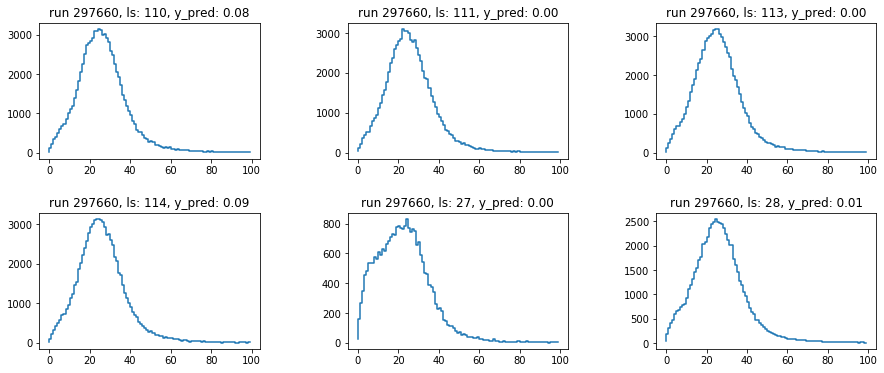

ANOMALOUS LS


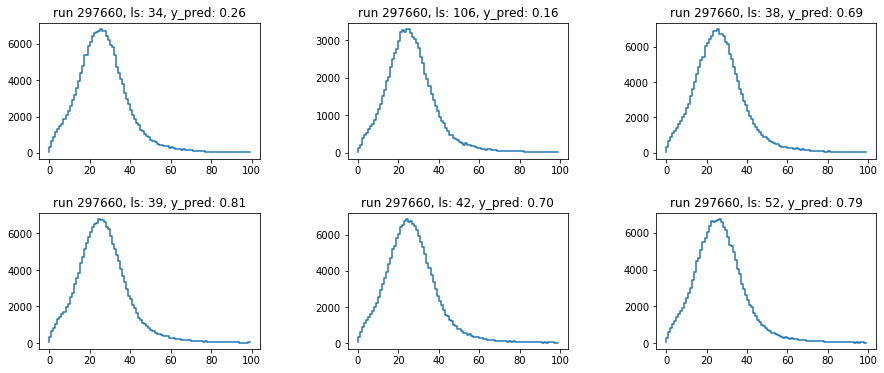

Training set shape (21109, 121)
Explained variance ratio [0.78686812 0.18095903 0.00701276 0.00185947]


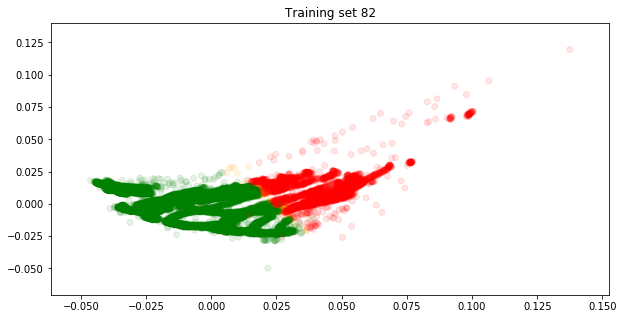

Training model
Epoch 00059: early stopping
Accuracy 1.0
[[ 970    0]
 [   0 4308]]

********************************************************************************
Classifying Run 297661

Explained variance ratio [0.88761299 0.0682309  0.00702317 0.00303046]


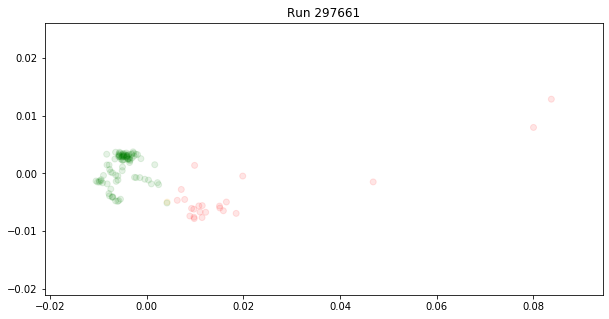

Good LS: 93 [1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 18, 21, 25, 28, 31, 35, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 92, 93, 94, 98, 99, 101, 102, 103, 104, 105, 106, 107, 108, 109, 110, 111, 112, 113, 114, 115, 116, 117]
Bad LS: 23 [12, 13, 14, 15, 16, 17, 19, 20, 22, 23, 24, 26, 27, 29, 30, 33, 34, 36, 91, 95, 96, 97, 100]
Anomalies LS: 1 [32]
GOOD LS


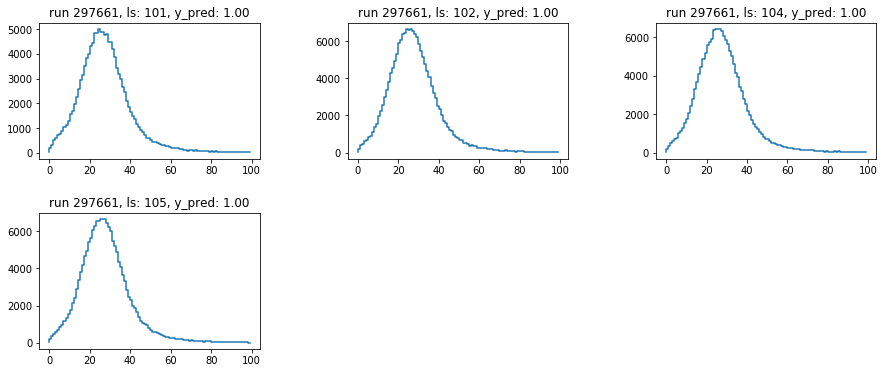

BAD LS


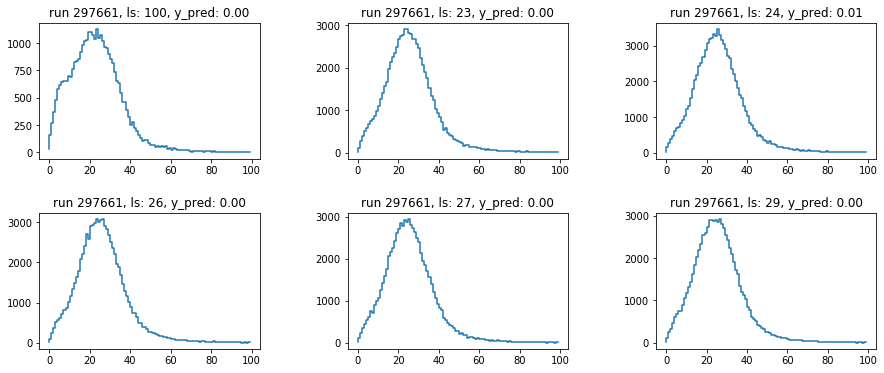

ANOMALOUS LS


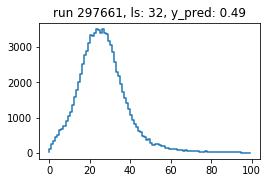

Training set shape (21225, 121)
Explained variance ratio [0.78572894 0.18219762 0.00702852 0.00186061]


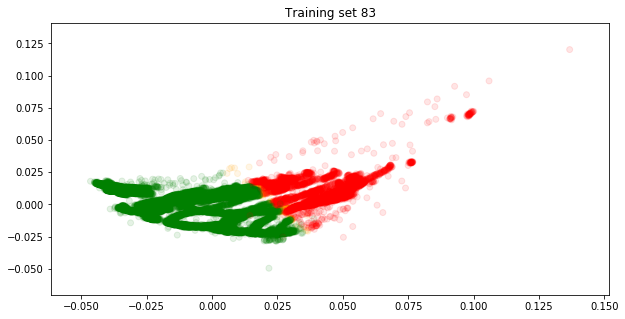

Training model
Epoch 00066: early stopping
Accuracy 1.0
[[ 975    0]
 [   1 4331]]

********************************************************************************
Classifying Run 297662

Explained variance ratio [0.54996547 0.07471145 0.06473743 0.05408856]


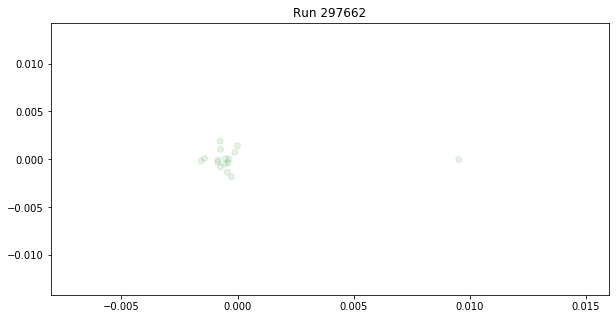

Good LS: 16 [1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16]
Bad LS: 0 []
Anomalies LS: 0 []
GOOD LS


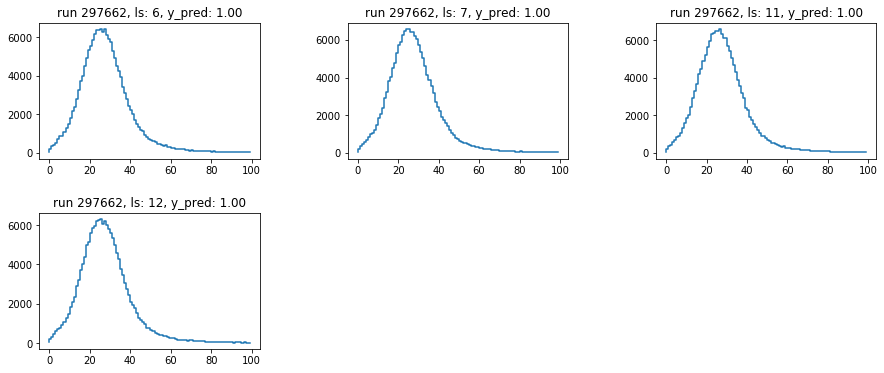

BAD LS
ANOMALOUS LS
Training set shape (21241, 121)
Explained variance ratio [0.78551795 0.18241506 0.00703028 0.00186103]


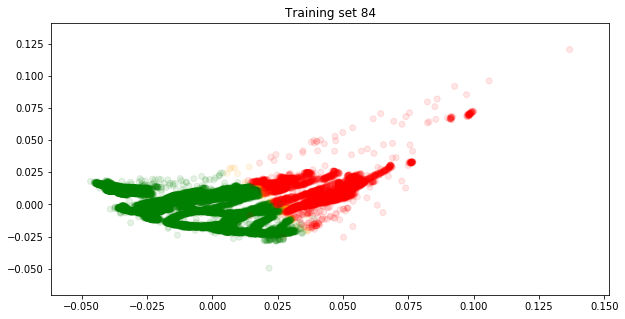

Training model
Epoch 00045: early stopping
Accuracy 1.0
[[ 974    1]
 [   0 4336]]

********************************************************************************
Classifying Run 297663

Explained variance ratio [0.1565181  0.12377573 0.10534834 0.09540404]


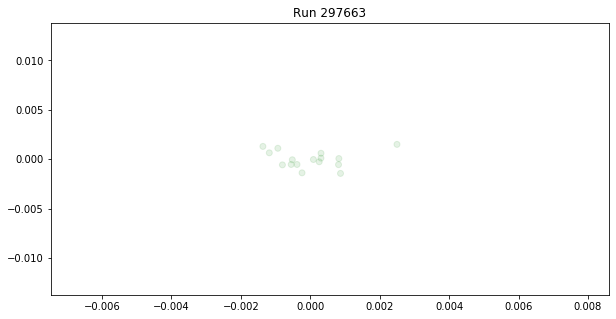

Good LS: 16 [1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16]
Bad LS: 0 []
Anomalies LS: 0 []
GOOD LS


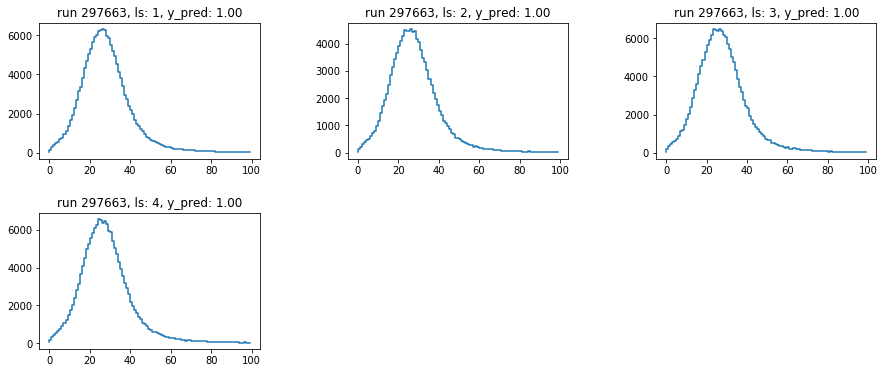

BAD LS
ANOMALOUS LS
Training set shape (21257, 121)
Explained variance ratio [0.78528106 0.18266389 0.00702987 0.00186109]


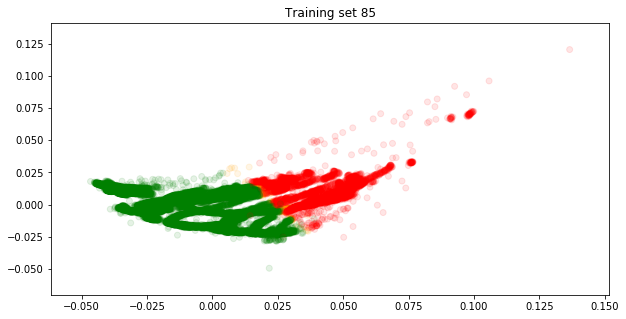

Training model
Epoch 00044: early stopping
Accuracy 1.0
[[ 975    0]
 [   0 4340]]

********************************************************************************
Classifying Run 297665

Explained variance ratio [0.21312418 0.04701994 0.04083619 0.04042608]


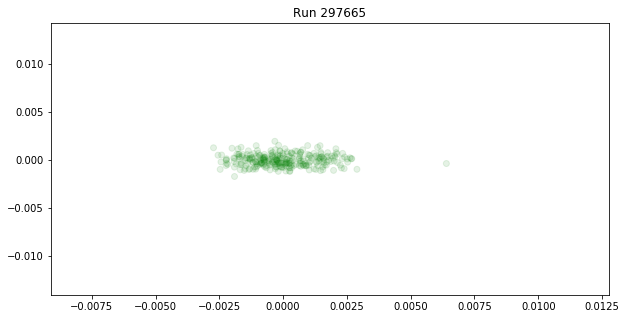

Good LS: 276 [1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92, 93, 94, 95, 96, 97, 98, 99, 100, 101, 102, 103, 104, 105, 106, 107, 108, 109, 110, 111, 112, 113, 114, 115, 116, 117, 118, 119, 120, 121, 122, 123, 124, 125, 126, 127, 128, 129, 130, 131, 132, 133, 134, 135, 136, 137, 138, 139, 140, 141, 142, 143, 144, 145, 146, 147, 148, 149, 150, 151, 152, 153, 154, 155, 156, 157, 158, 159, 160, 161, 162, 163, 164, 165, 166, 167, 168, 169, 170, 171, 172, 173, 174, 175, 176, 177, 178, 179, 180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192, 193, 194, 195, 196, 197, 198, 199, 200, 201, 202, 203, 204, 205, 206, 207, 208, 209, 210, 211, 212, 213, 214, 215, 216, 217, 218, 219,

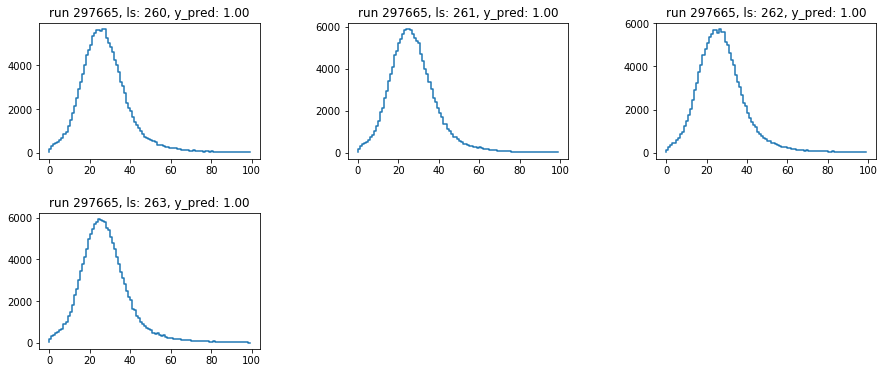

BAD LS
ANOMALOUS LS
Training set shape (21533, 121)
Explained variance ratio [0.78066617 0.18744426 0.00708693 0.00187967]


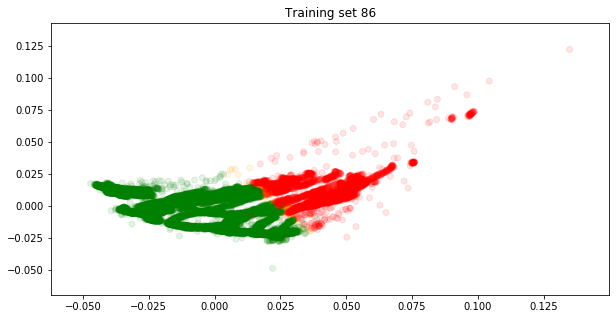

Training model
Epoch 00058: early stopping
Accuracy 1.0
[[ 974    1]
 [   0 4409]]

********************************************************************************
Classifying Run 297666

Explained variance ratio [0.59529449 0.33914522 0.00940774 0.00457829]


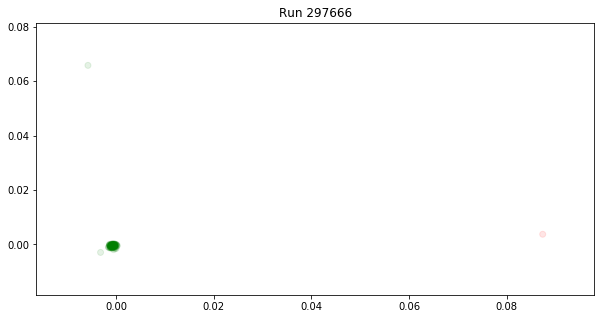

Good LS: 121 [1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 84, 85, 86, 87, 88, 89, 90, 91, 92, 93, 94, 95, 96, 97, 98, 99, 100, 101, 102, 103, 104, 105, 106, 107, 108, 109, 110, 111, 112, 113, 114, 115, 116, 117, 118, 119, 120, 121, 122]
Bad LS: 1 [83]
Anomalies LS: 0 []
GOOD LS


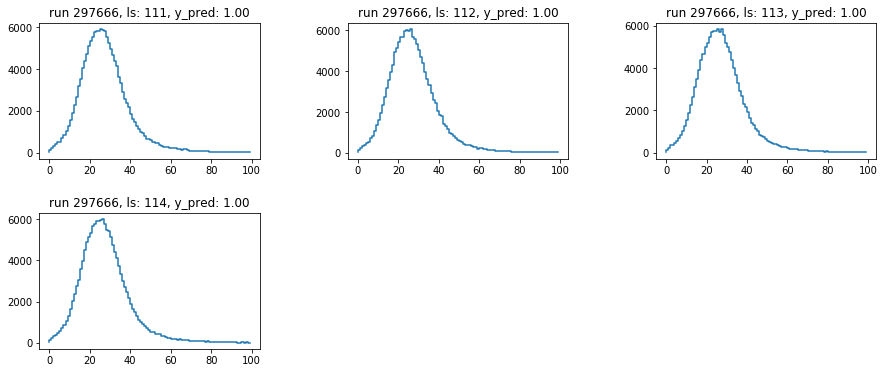

BAD LS


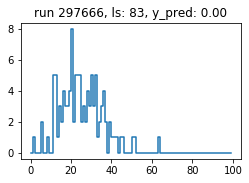

ANOMALOUS LS
Training set shape (21655, 121)
Explained variance ratio [0.77811939 0.18950688 0.00718041 0.00188469]


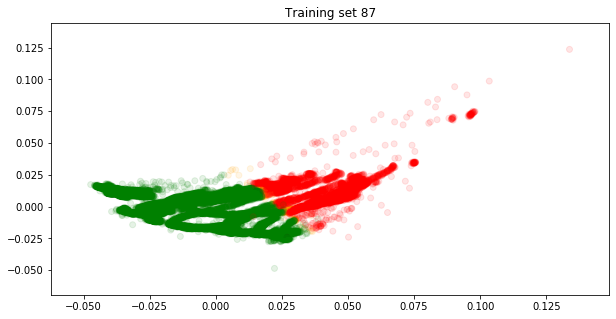

Training model
Epoch 00044: early stopping
Accuracy 1.0
[[ 976    0]
 [   0 4438]]

********************************************************************************
Classifying Run 297670

Explained variance ratio [0.43506935 0.0683187  0.0622562  0.05350008]


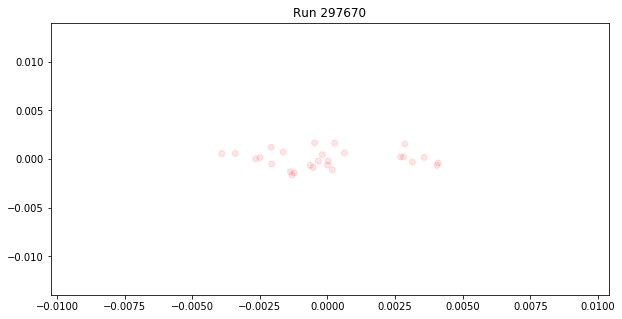

Good LS: 0 []
Bad LS: 27 [1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27]
Anomalies LS: 0 []
GOOD LS
BAD LS


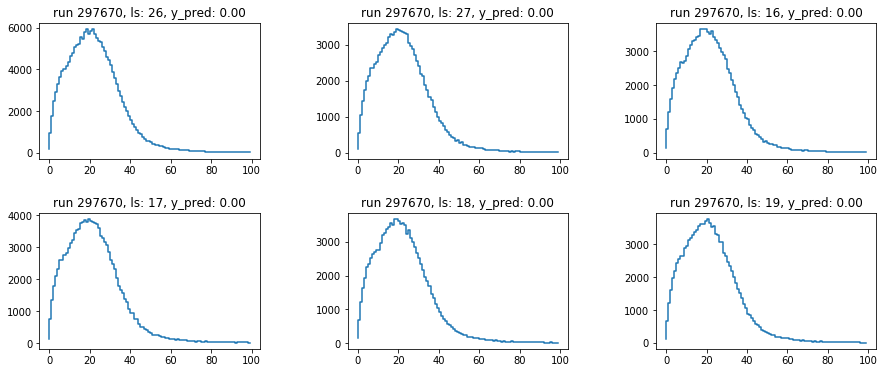

ANOMALOUS LS
Training set shape (21682, 121)
Explained variance ratio [0.7786067  0.18920833 0.00715116 0.00187406]


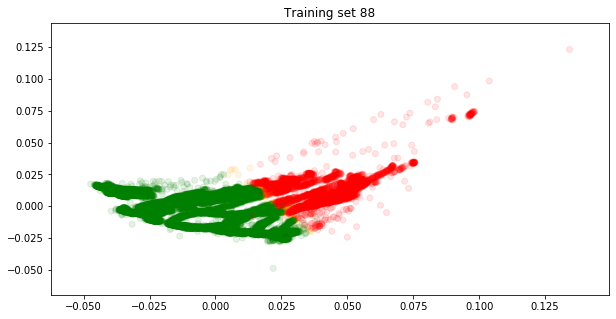

Training model
Epoch 00062: early stopping
Accuracy 1.0
[[ 982    0]
 [   0 4439]]

********************************************************************************
Classifying Run 297673

Explained variance ratio [0.33991651 0.10723051 0.09597314 0.08803144]


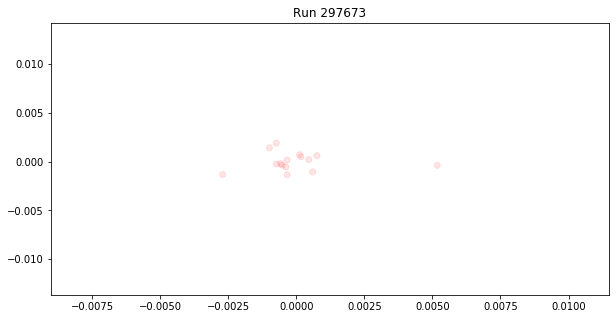

Good LS: 0 []
Bad LS: 15 [1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15]
Anomalies LS: 0 []
GOOD LS
BAD LS


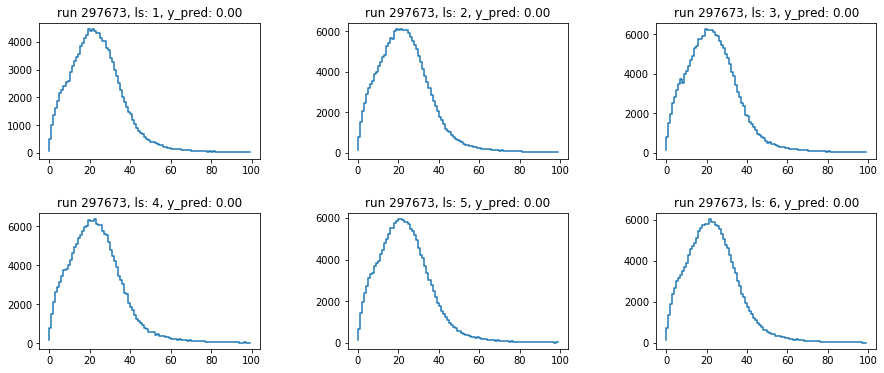

ANOMALOUS LS
Training set shape (21697, 121)
Explained variance ratio [0.77897961 0.18890734 0.00713452 0.00186961]


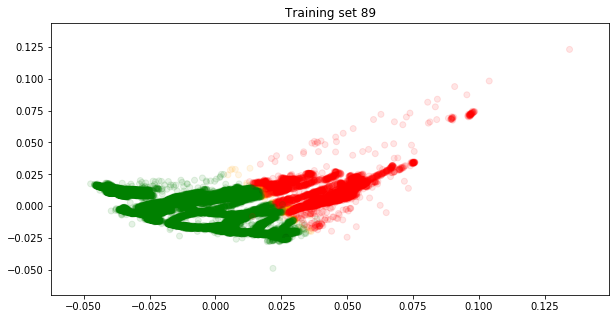

Training model
Epoch 00059: early stopping
Accuracy 1.0
[[ 986    0]
 [   0 4439]]

********************************************************************************
Classifying Run 297674

Explained variance ratio [0.52164589 0.27433664 0.01207269 0.01079549]


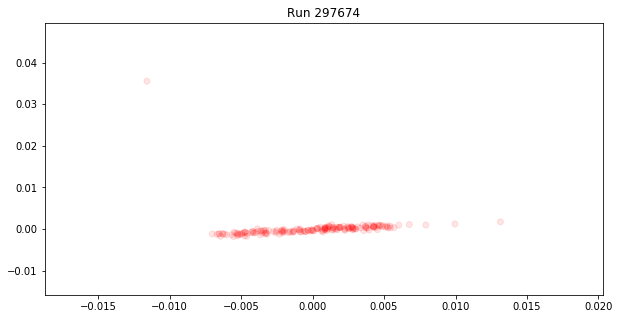

Good LS: 0 []
Bad LS: 181 [1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92, 93, 94, 95, 96, 97, 98, 99, 100, 101, 102, 103, 104, 105, 106, 107, 108, 109, 110, 111, 112, 113, 114, 115, 116, 117, 118, 119, 120, 121, 122, 123, 124, 125, 126, 127, 128, 129, 130, 131, 132, 133, 134, 135, 136, 137, 138, 139, 140, 141, 142, 143, 144, 145, 146, 147, 148, 149, 150, 151, 152, 153, 154, 155, 156, 157, 158, 159, 160, 161, 162, 163, 164, 165, 166, 167, 168, 169, 170, 171, 172, 173, 174, 175, 176, 177, 178, 179, 180, 181, 182]
Anomalies LS: 0 []
GOOD LS
BAD LS


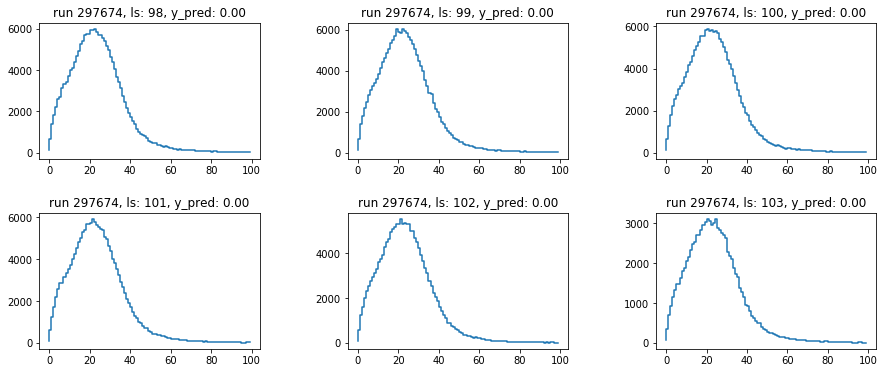

ANOMALOUS LS
Training set shape (21878, 121)
Explained variance ratio [0.78359639 0.18510175 0.00692786 0.00181692]


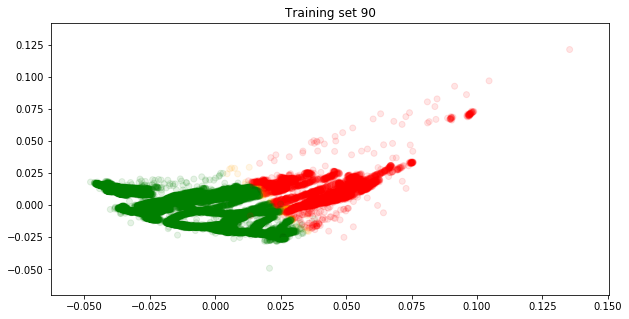

Training model
Epoch 00055: early stopping
Accuracy 1.0
[[1030    1]
 [   0 4439]]

********************************************************************************
Classifying Run 297678



/home/mantydze/anaconda3/lib/python3.7/site-packages/sklearn/decomposition/pca.py:445: RuntimeWarning: invalid value encountered in true_divide
  explained_variance_ = (S ** 2) / (n_samples - 1)


Explained variance ratio [nan]
index 1 is out of bounds for axis 1 with size 1
failed to do pca for run 297678
Good LS: 0 []
Bad LS: 1 [2]
Anomalies LS: 0 []
GOOD LS
BAD LS


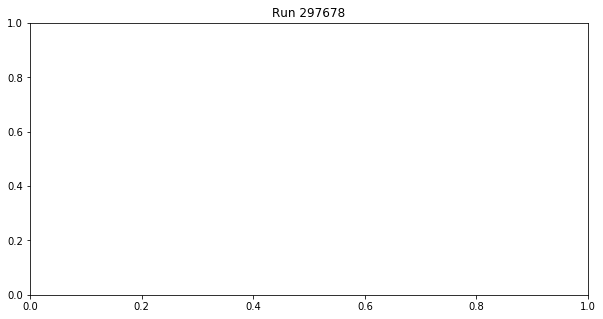

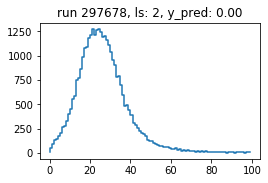

ANOMALOUS LS
Training set shape (21879, 121)
Explained variance ratio [0.78359724 0.18510027 0.00692929 0.00181677]


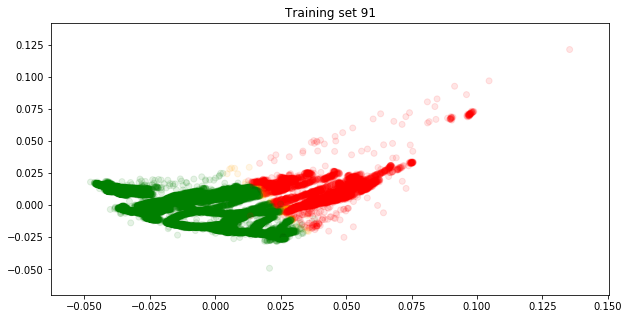

Training model
Epoch 00064: early stopping
Accuracy 1.0
[[1032    0]
 [   0 4438]]

********************************************************************************
Classifying Run 297722

Explained variance ratio [0.91750141 0.01343327 0.00595212 0.0036625 ]


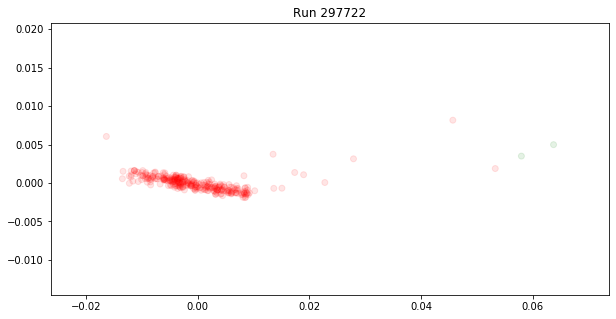

Good LS: 2 [38, 44]
Bad LS: 302 [33, 39, 40, 41, 42, 43, 45, 46, 47, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92, 93, 94, 95, 96, 97, 98, 99, 100, 101, 102, 103, 104, 105, 106, 107, 108, 109, 110, 111, 112, 113, 114, 115, 116, 117, 118, 119, 120, 121, 122, 123, 124, 125, 126, 127, 128, 129, 130, 131, 132, 133, 134, 135, 136, 137, 138, 139, 140, 141, 142, 143, 144, 145, 146, 147, 148, 149, 150, 151, 152, 153, 154, 155, 156, 157, 158, 159, 160, 161, 162, 163, 164, 165, 166, 167, 168, 169, 170, 171, 172, 173, 174, 175, 176, 177, 178, 179, 180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192, 193, 194, 195, 196, 197, 198, 199, 200, 201, 202, 203, 204, 205, 206, 207, 208, 209, 210, 211, 212, 213, 214, 215, 216, 217, 218, 219, 220, 221, 222, 223, 224, 225, 226, 227, 228, 229, 230, 231, 232, 233, 234, 235, 236, 237, 238, 239, 240, 241, 242, 243, 244, 245, 246, 247, 248

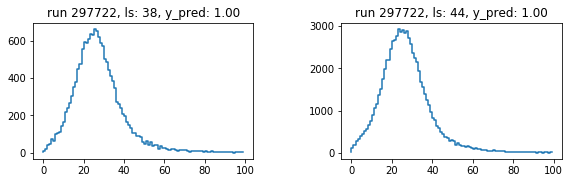

BAD LS


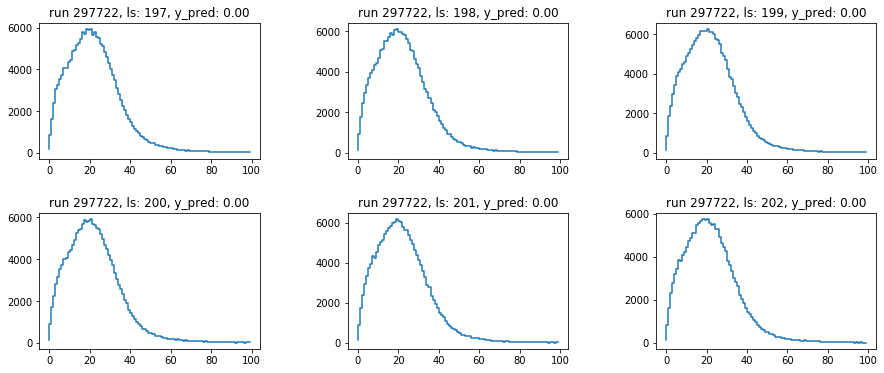

ANOMALOUS LS
Training set shape (22183, 121)
Explained variance ratio [0.79116904 0.17938754 0.00653883 0.00170629]


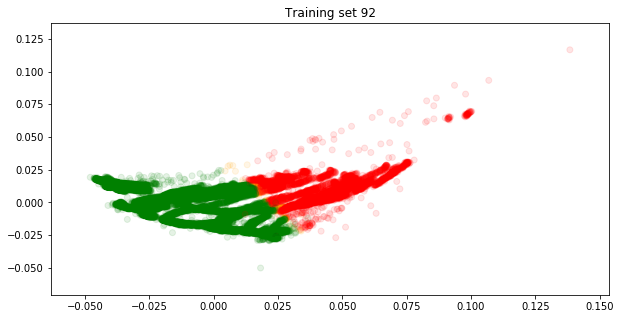

Training model
Epoch 00055: early stopping
Accuracy 1.0
[[1107    0]
 [   0 4439]]

********************************************************************************
Classifying Run 297723

Explained variance ratio [0.85168009 0.0085547  0.00767938 0.00743689]


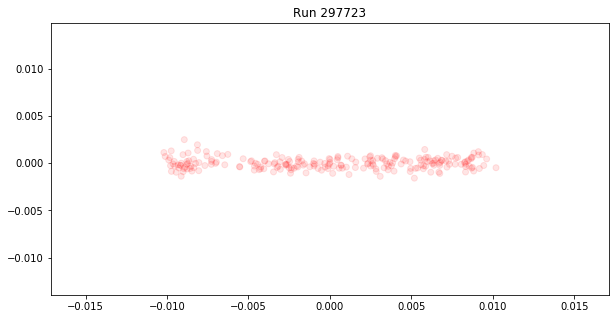

Good LS: 0 []
Bad LS: 223 [1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92, 93, 94, 95, 96, 97, 98, 99, 100, 101, 102, 103, 104, 105, 106, 107, 108, 109, 110, 111, 112, 113, 114, 115, 116, 117, 118, 119, 120, 121, 122, 123, 124, 125, 126, 127, 128, 129, 130, 131, 132, 133, 134, 135, 136, 137, 138, 139, 140, 141, 142, 143, 144, 145, 146, 147, 148, 149, 150, 151, 152, 153, 154, 155, 156, 157, 158, 159, 160, 161, 162, 163, 164, 165, 166, 167, 168, 169, 170, 171, 172, 173, 174, 175, 176, 177, 178, 179, 180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192, 193, 194, 195, 196, 197, 198, 199, 200, 201, 202, 203, 204, 205, 206, 207, 208, 209, 210, 211, 212, 213, 214, 215, 216, 2

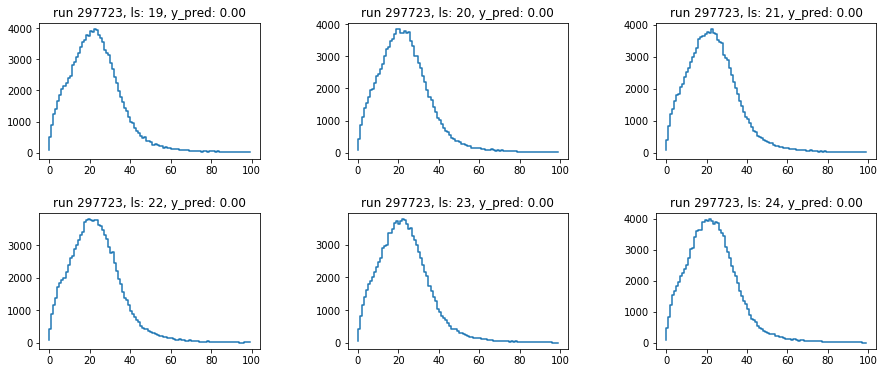

ANOMALOUS LS
Training set shape (22406, 121)
Explained variance ratio [0.79636848 0.17484522 0.00639687 0.00166202]


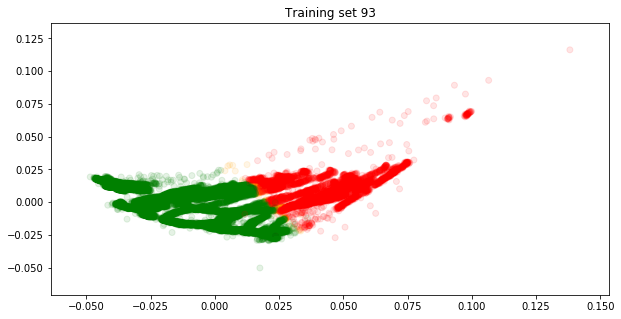

Training model
Epoch 00070: early stopping
Accuracy 0.999
[[1160    3]
 [   0 4439]]

********************************************************************************
Classifying Run 298653

Explained variance ratio [0.43745268 0.13063058 0.09426535 0.04881285]


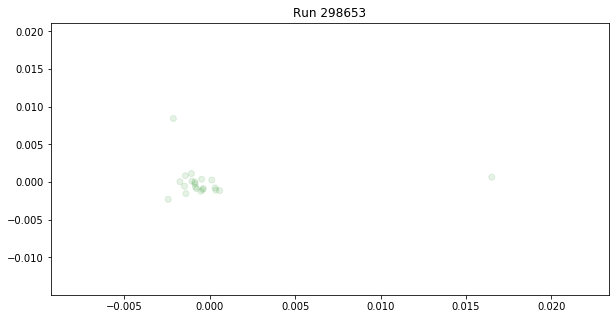

Good LS: 21 [69, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92]
Bad LS: 0 []
Anomalies LS: 0 []
GOOD LS


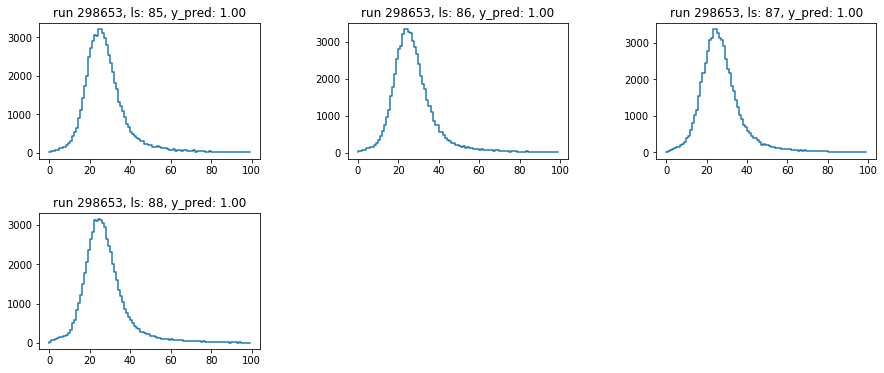

BAD LS
ANOMALOUS LS
Training set shape (22427, 121)
Explained variance ratio [0.79395007 0.1770925  0.00638927 0.00181304]


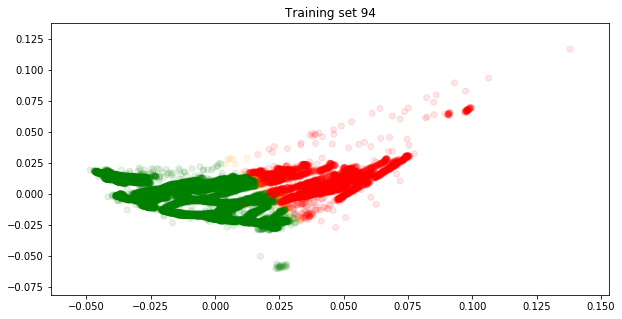

Training model
Epoch 00055: early stopping
Accuracy 1.0
[[1162    1]
 [   0 4444]]

********************************************************************************
Classifying Run 298678

Explained variance ratio [0.08124415 0.06586433 0.06452239 0.05734133]


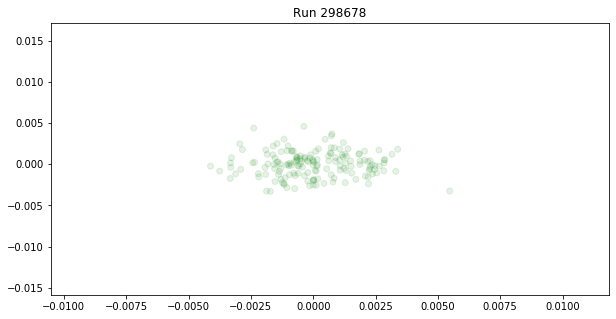

Good LS: 162 [1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92, 93, 94, 95, 96, 97, 98, 99, 100, 101, 102, 103, 104, 105, 106, 107, 108, 109, 110, 111, 112, 113, 114, 115, 116, 117, 118, 119, 120, 121, 122, 123, 124, 125, 126, 127, 128, 129, 130, 131, 132, 133, 134, 135, 136, 137, 138, 139, 140, 141, 142, 143, 144, 145, 146, 147, 148, 149, 150, 151, 152, 153, 154, 155, 156, 157, 158, 159, 160, 161, 162]
Bad LS: 0 []
Anomalies LS: 0 []
GOOD LS


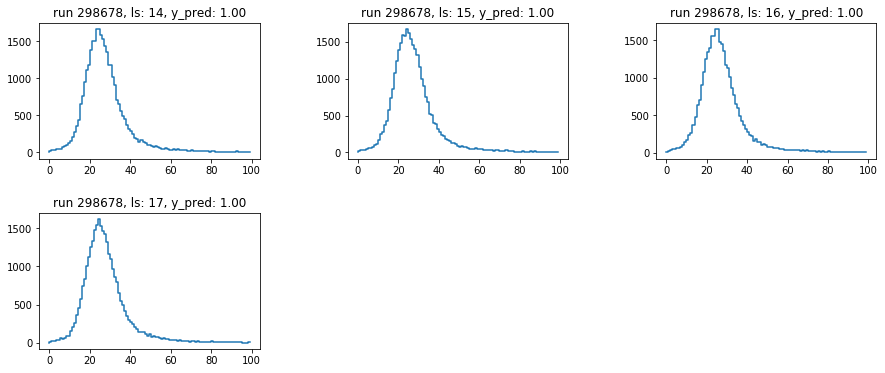

BAD LS
ANOMALOUS LS
Training set shape (22589, 121)
Explained variance ratio [0.77508228 0.19488169 0.00630431 0.00325382]


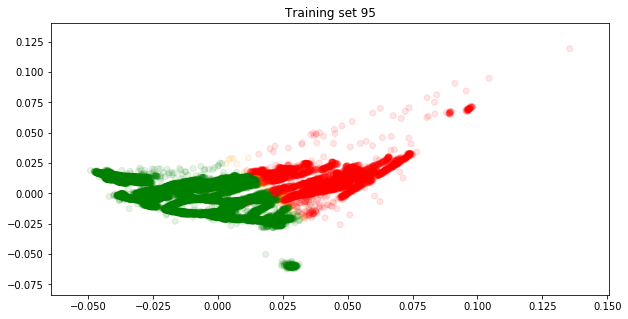

Training model
Epoch 00067: early stopping
Accuracy 1.0
[[1161    2]
 [   0 4485]]

********************************************************************************
Classifying Run 298996

Explained variance ratio [0.83987247 0.03612161 0.01147732 0.00892928]


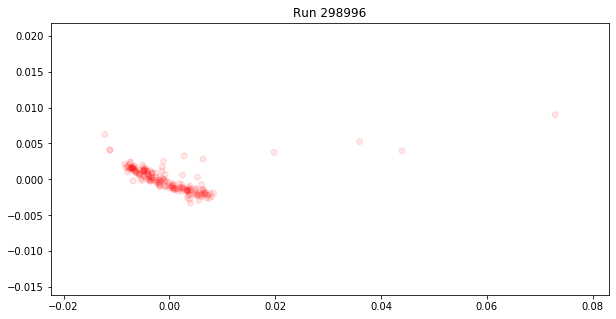

Good LS: 0 []
Bad LS: 179 [35, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92, 93, 94, 95, 96, 97, 98, 99, 100, 101, 102, 103, 104, 105, 106, 107, 108, 109, 110, 111, 112, 113, 114, 115, 116, 117, 118, 119, 120, 121, 122, 123, 124, 125, 126, 127, 128, 129, 130, 131, 132, 133, 134, 135, 136, 137, 138, 139, 140, 141, 142, 143, 144, 145, 146, 147, 148, 149, 150, 151, 152, 153, 154, 155, 156, 157, 158, 159, 160, 161, 162, 163, 164, 165, 166, 167, 168, 169, 170, 171, 172, 173, 174, 175, 176, 177, 178, 179, 180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192, 193, 194, 195, 196, 197, 198, 199, 200, 201, 202, 203, 204, 205, 206, 207, 208, 209, 210, 211, 212, 213, 214, 215, 216]
Anomalies LS: 0 []
GOOD LS
BAD LS


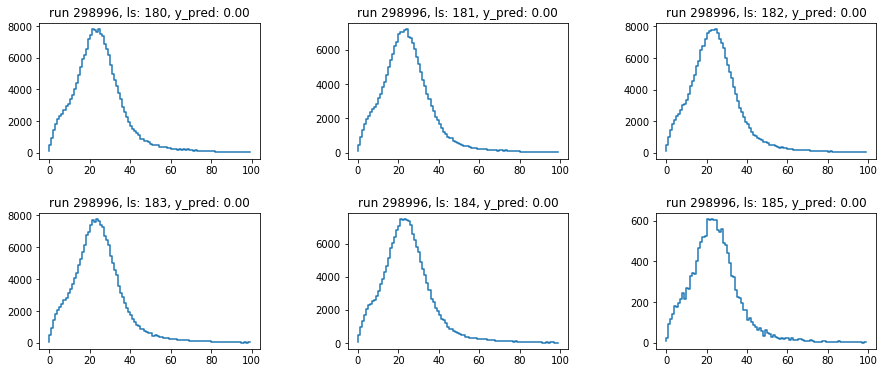

ANOMALOUS LS
Training set shape (22768, 121)
Explained variance ratio [0.77894507 0.19136343 0.0062311  0.00332623]


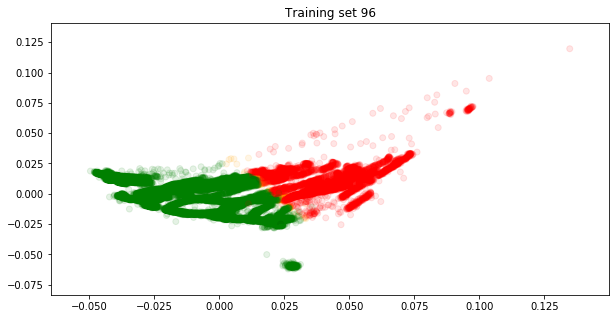

Training model
Epoch 00053: early stopping
Accuracy 1.0
[[1208    0]
 [   0 4484]]

********************************************************************************
Classifying Run 298997

Explained variance ratio [0.68914336 0.06881941 0.04685989 0.03547524]


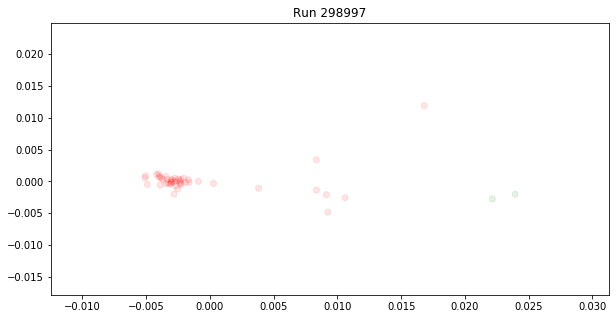

Good LS: 2 [1, 2]
Bad LS: 45 [3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47]
Anomalies LS: 0 []
GOOD LS


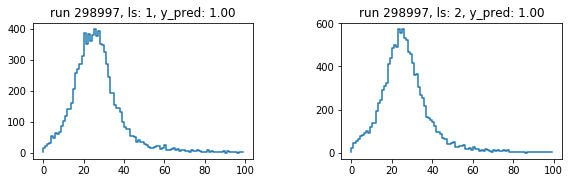

BAD LS


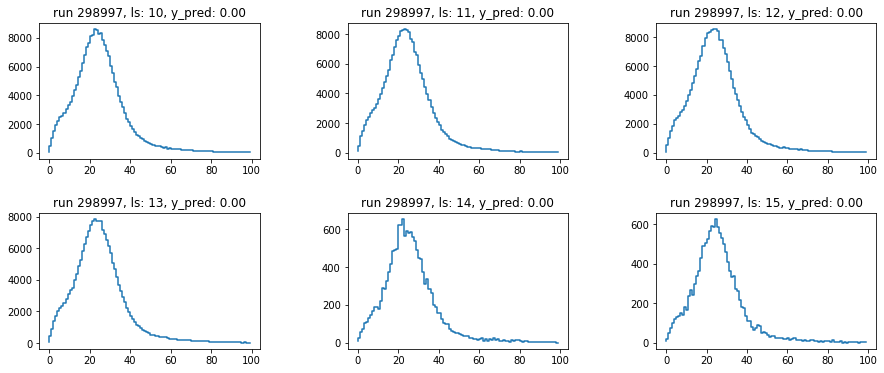

ANOMALOUS LS
Training set shape (22815, 121)
Explained variance ratio [0.77946431 0.19089064 0.00620322 0.00336323]


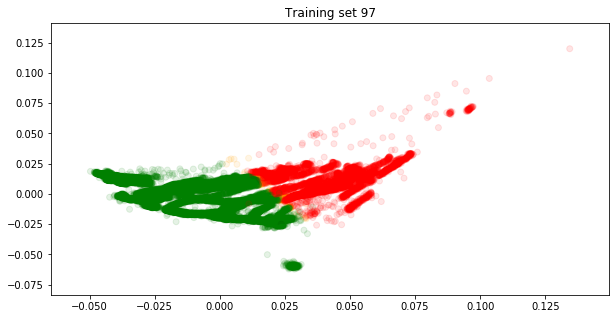

Training model
Epoch 00067: early stopping
Accuracy 1.0
[[1218    1]
 [   0 4485]]

********************************************************************************
Classifying Run 298998

Explained variance ratio [1.00000000e+00 2.25714693e-29]


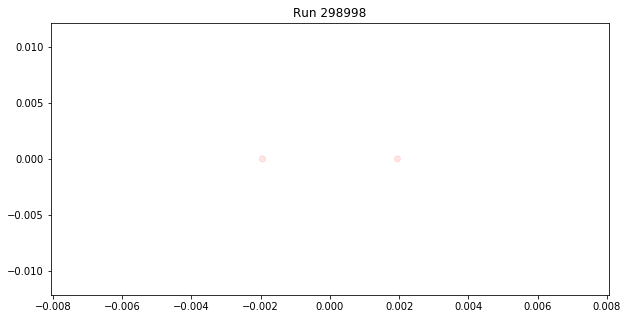

Good LS: 0 []
Bad LS: 2 [1, 2]
Anomalies LS: 0 []
GOOD LS
BAD LS


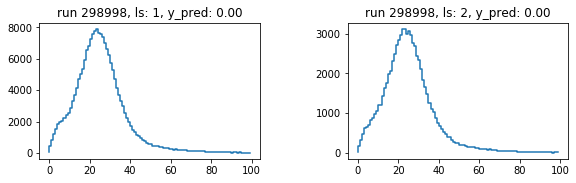

ANOMALOUS LS
Training set shape (22817, 121)
Explained variance ratio [0.77948136 0.19087636 0.00620214 0.00336464]


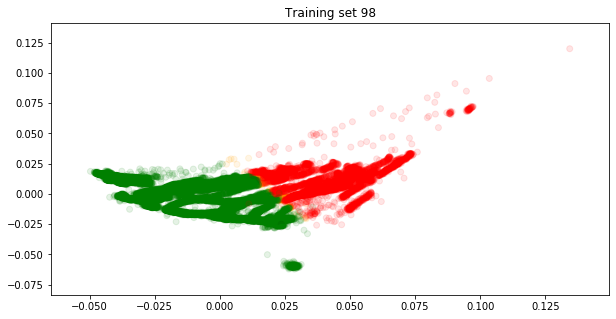

Training model
Epoch 00060: early stopping
Accuracy 1.0
[[1217    2]
 [   0 4486]]

********************************************************************************
Classifying Run 299000

Explained variance ratio [0.93632016 0.02448725 0.005495   0.00425767]


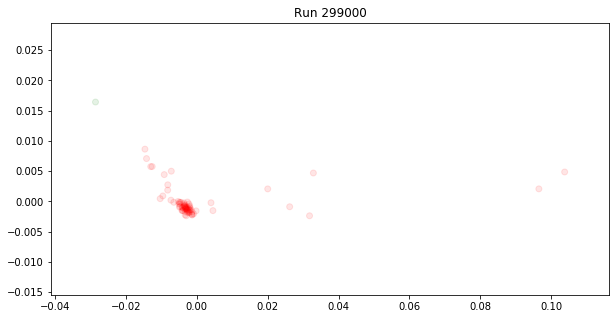

Good LS: 1 [5]
Bad LS: 77 [1, 2, 3, 4, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78]
Anomalies LS: 0 []
GOOD LS


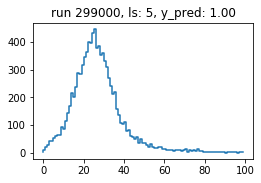

BAD LS


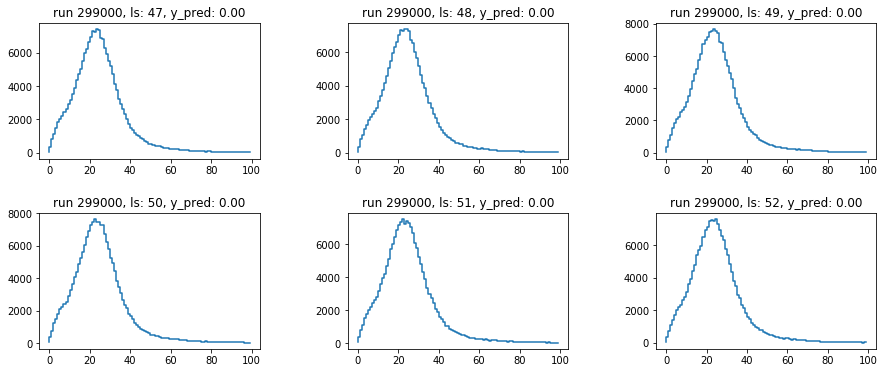

ANOMALOUS LS
Training set shape (22895, 121)
Explained variance ratio [0.78046604 0.18995712 0.00623375 0.00340785]


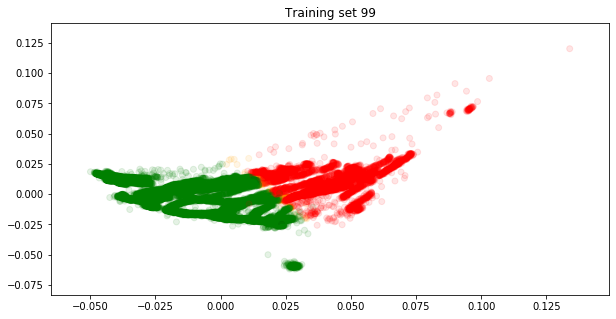

Training model
Epoch 00039: early stopping
Accuracy 0.999
[[1239    0]
 [   6 4479]]

********************************************************************************
Classifying Run 299042

Explained variance ratio [0.57054911 0.09501612 0.07399432 0.06307495]


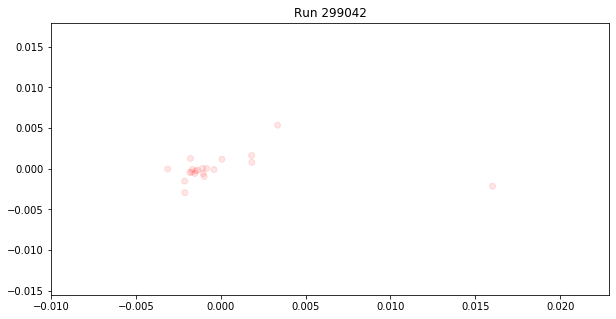

Good LS: 0 []
Bad LS: 20 [34, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56]
Anomalies LS: 0 []
GOOD LS
BAD LS


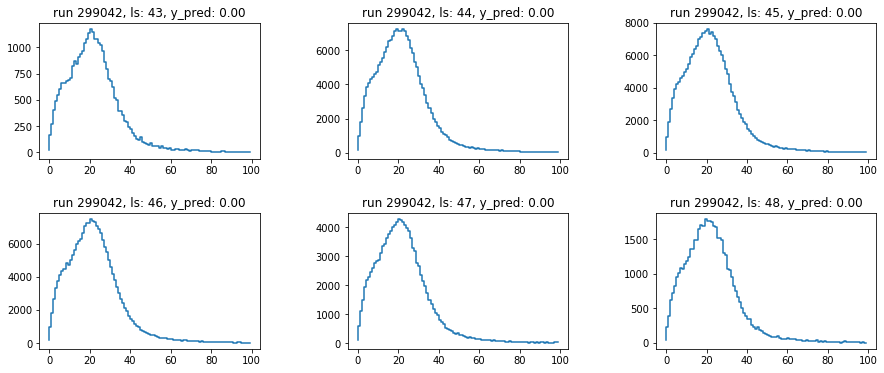

ANOMALOUS LS
Training set shape (22915, 121)
Explained variance ratio [0.78115525 0.1893639  0.00621085 0.00340367]


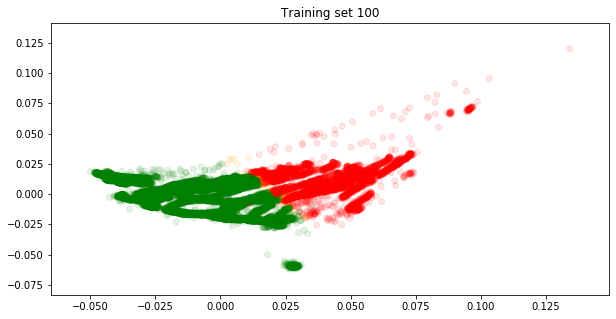

Training model
Epoch 00065: early stopping
Accuracy 1.0
[[1244    0]
 [   0 4485]]

********************************************************************************
Classifying Run 299061

Explained variance ratio [0.66779655 0.21332213 0.05604071 0.00652345]


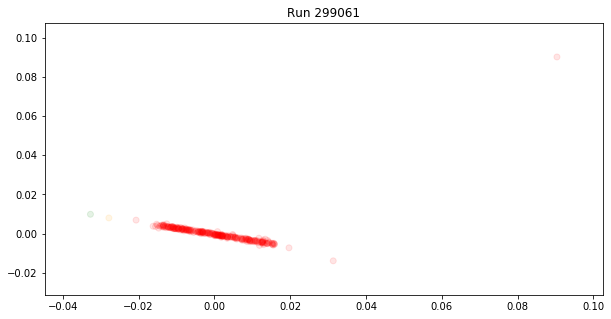

Good LS: 1 [48]
Bad LS: 300 [40, 43, 44, 45, 47, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92, 93, 94, 95, 96, 97, 98, 99, 100, 101, 102, 103, 104, 105, 106, 107, 108, 109, 110, 111, 112, 113, 114, 115, 116, 117, 118, 119, 120, 121, 122, 123, 124, 125, 126, 127, 128, 129, 130, 131, 132, 133, 134, 135, 136, 137, 138, 139, 140, 141, 142, 143, 144, 145, 146, 147, 148, 149, 150, 151, 152, 153, 154, 155, 156, 157, 158, 159, 160, 161, 162, 163, 164, 165, 166, 167, 168, 169, 170, 171, 172, 173, 174, 175, 176, 177, 178, 179, 180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192, 193, 194, 195, 196, 197, 198, 199, 200, 201, 202, 203, 204, 205, 206, 207, 208, 209, 210, 211, 212, 213, 214, 215, 216, 217, 218, 219, 220, 221, 222, 223, 224, 225, 226, 227, 228, 229, 230, 231, 232, 233, 234, 235, 236, 237, 238, 239, 240, 241, 242, 243, 244, 245, 246, 247, 248, 24

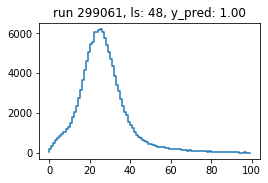

BAD LS


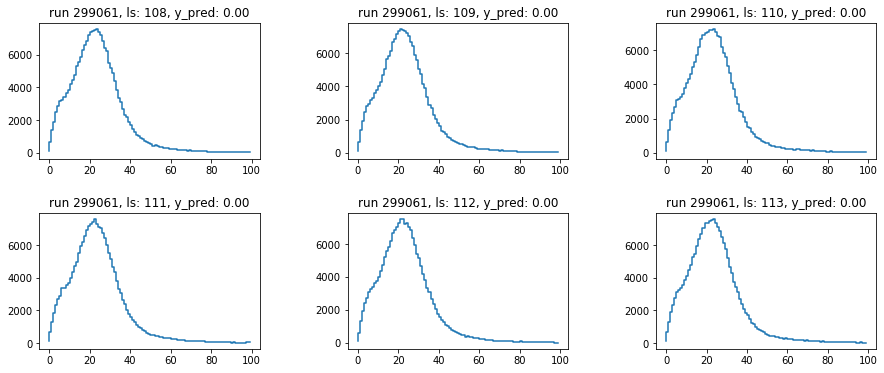

ANOMALOUS LS


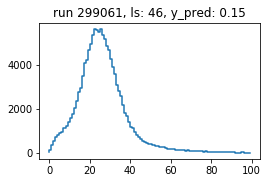

Training set shape (23216, 121)
Explained variance ratio [0.78683094 0.18384934 0.00601623 0.00344013]


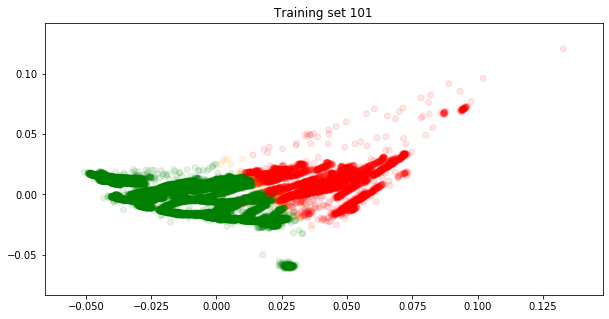

Training model
Epoch 00064: early stopping
Accuracy 1.0
[[1318    0]
 [   0 4486]]

********************************************************************************
Classifying Run 299062

Explained variance ratio [0.64456803 0.13526779 0.02465911 0.01754574]


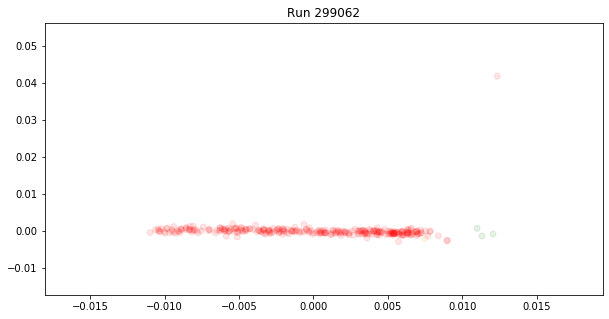

Good LS: 3 [213, 293, 294]
Bad LS: 292 [1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92, 93, 94, 95, 96, 97, 98, 99, 100, 101, 102, 103, 104, 105, 106, 107, 108, 109, 110, 111, 112, 113, 114, 115, 116, 117, 118, 119, 120, 121, 122, 123, 124, 125, 126, 127, 128, 129, 130, 131, 132, 133, 134, 135, 136, 137, 138, 139, 140, 141, 142, 143, 144, 145, 146, 147, 148, 149, 150, 151, 152, 153, 154, 155, 156, 157, 158, 159, 160, 161, 162, 163, 164, 165, 166, 167, 168, 169, 170, 171, 172, 173, 174, 175, 176, 177, 178, 179, 180, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192, 193, 194, 195, 196, 197, 198, 199, 200, 201, 202, 203, 204, 205, 206, 207, 208, 209, 210, 211, 212, 214, 215, 216

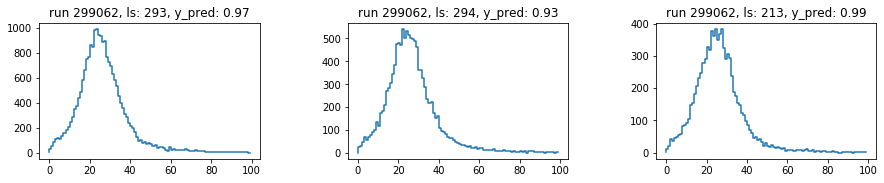

BAD LS


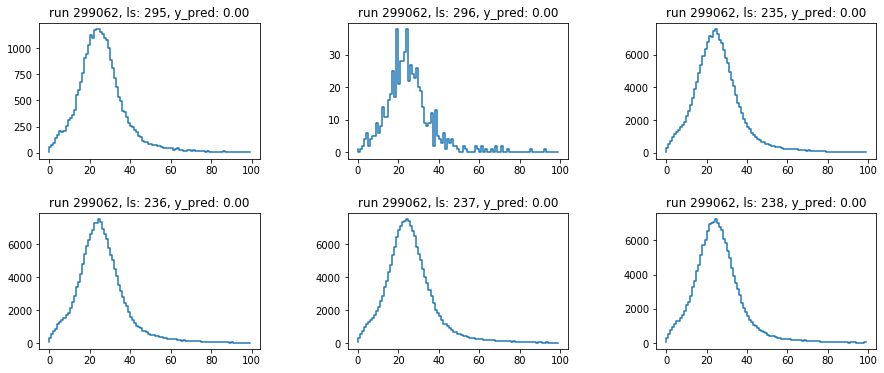

ANOMALOUS LS


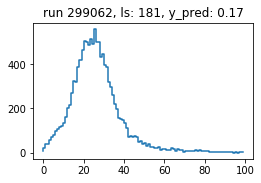

Training set shape (23511, 121)
Explained variance ratio [0.78642781 0.18456226 0.00587582 0.0035921 ]


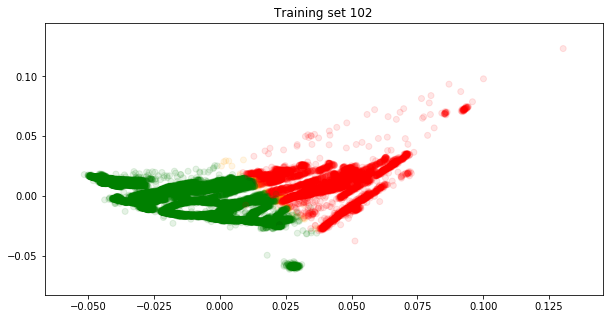

Training model
Epoch 00049: early stopping
Accuracy 1.0
[[1391    1]
 [   0 4486]]

********************************************************************************
Classifying Run 299064

Explained variance ratio [0.35948676 0.08075468 0.07028531 0.05482058]


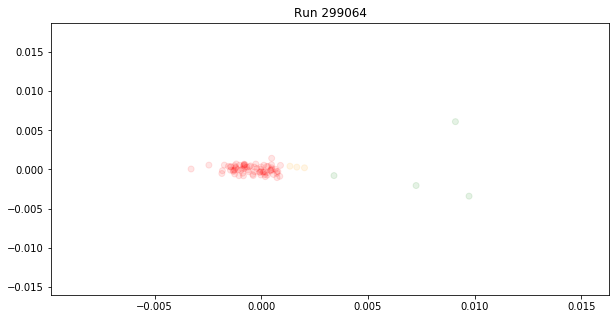

Good LS: 4 [1, 2, 3, 27]
Bad LS: 74 [4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 20, 21, 22, 23, 24, 26, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81]
Anomalies LS: 3 [19, 25, 28]
GOOD LS


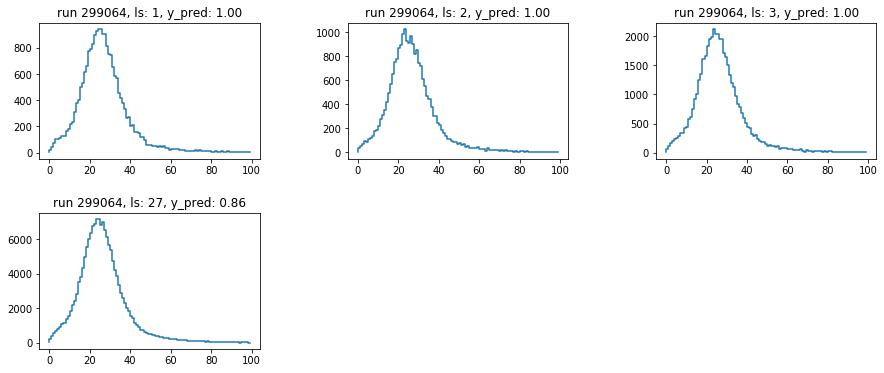

BAD LS


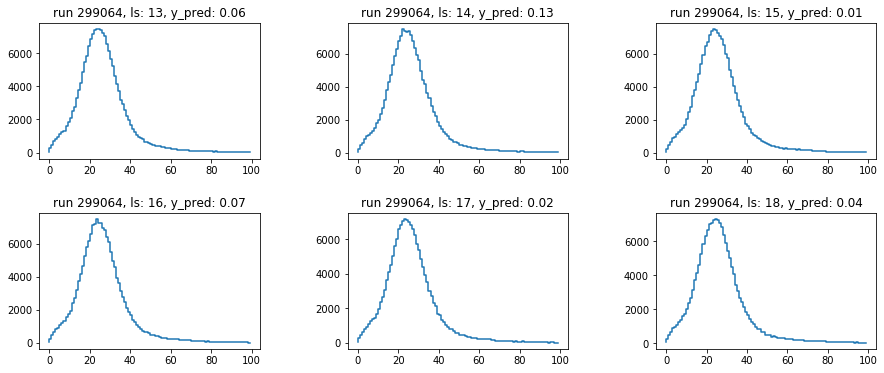

ANOMALOUS LS


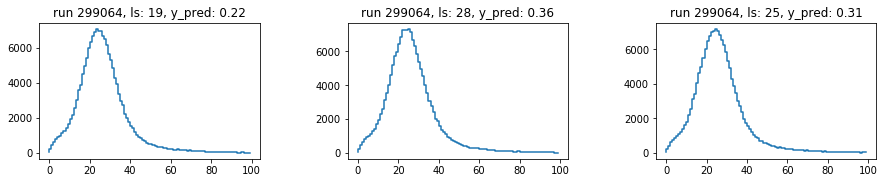

Training set shape (23589, 121)
Explained variance ratio [0.78549706 0.18558479 0.00583903 0.00364351]


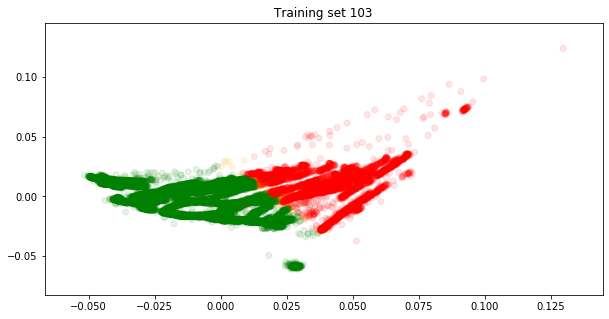

Training model
Epoch 00042: early stopping
Accuracy 1.0
[[1410    0]
 [   0 4488]]

********************************************************************************
Classifying Run 299065

Explained variance ratio [0.13966558 0.08747035 0.07669956 0.05654446]


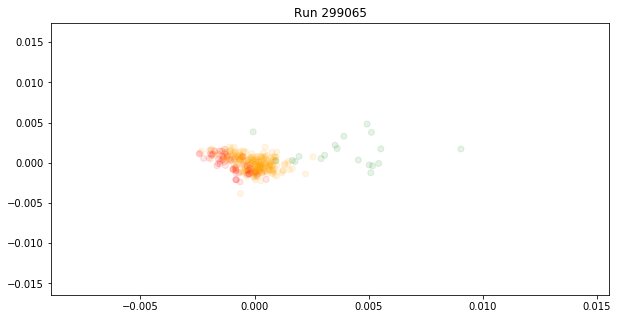

Good LS: 19 [1, 2, 3, 192, 200, 210, 211, 212, 214, 216, 217, 224, 225, 245, 249, 252, 288, 289, 322]
Bad LS: 64 [5, 6, 8, 9, 10, 12, 13, 16, 17, 21, 23, 29, 30, 31, 32, 37, 42, 44, 45, 46, 49, 50, 54, 56, 64, 67, 71, 73, 81, 88, 92, 99, 105, 107, 139, 140, 158, 159, 185, 189, 191, 201, 202, 241, 256, 257, 261, 264, 273, 275, 276, 285, 294, 303, 306, 308, 311, 316, 320, 324, 325, 326, 330, 334]
Anomalies LS: 247 [4, 7, 11, 14, 15, 18, 19, 20, 22, 24, 25, 26, 27, 28, 33, 34, 35, 36, 38, 39, 40, 41, 43, 47, 48, 51, 52, 53, 55, 57, 58, 59, 60, 61, 62, 63, 65, 66, 68, 69, 70, 72, 74, 75, 76, 77, 78, 79, 80, 82, 83, 84, 85, 86, 87, 89, 90, 91, 93, 94, 95, 96, 97, 98, 100, 101, 102, 103, 104, 106, 108, 109, 110, 111, 112, 113, 114, 115, 116, 117, 118, 119, 120, 121, 122, 123, 124, 125, 126, 127, 128, 129, 130, 131, 132, 133, 134, 135, 136, 137, 138, 141, 142, 143, 144, 145, 146, 147, 148, 149, 150, 151, 152, 153, 154, 155, 156, 157, 160, 161, 162, 163, 164, 165, 166, 167, 168, 169, 170, 171,

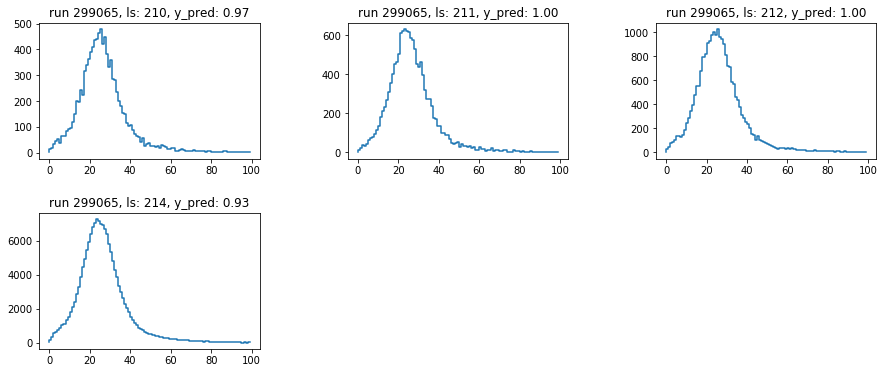

BAD LS


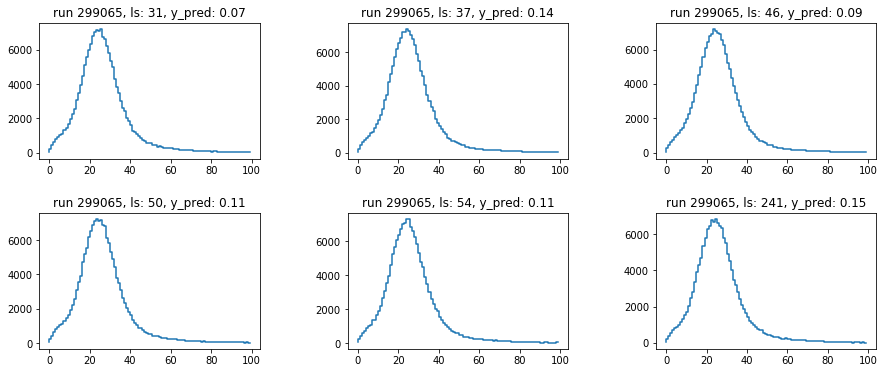

ANOMALOUS LS


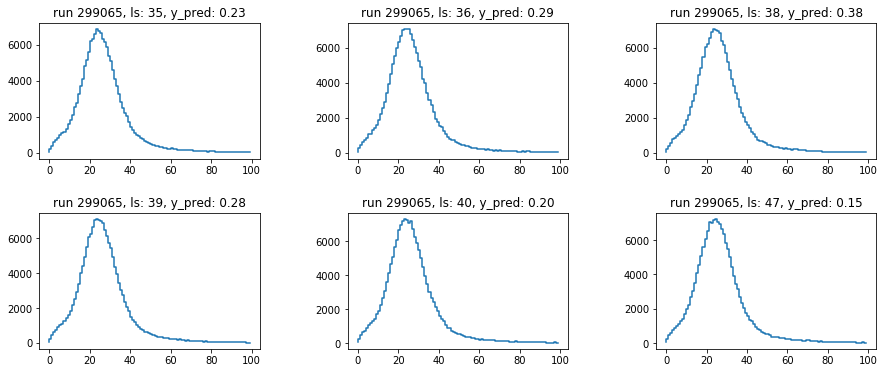

Training set shape (23672, 121)
Explained variance ratio [0.78028677 0.1911371  0.00569237 0.00385946]


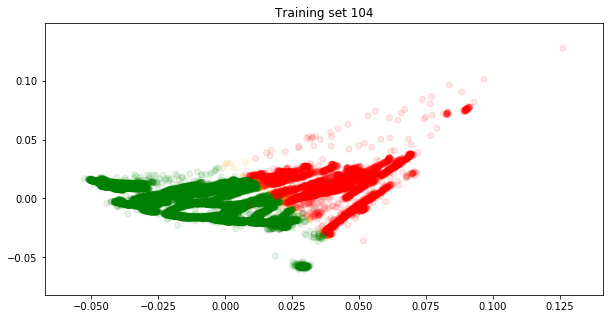

Training model
Epoch 00051: early stopping
Accuracy 1.0
[[1426    0]
 [   2 4490]]

********************************************************************************
Classifying Run 299067

Explained variance ratio [0.74886722 0.15384755 0.00957027 0.00660699]


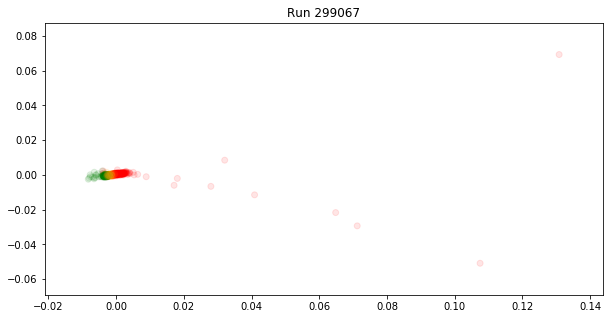

Good LS: 131 [1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 18, 19, 20, 21, 22, 23, 25, 26, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 40, 41, 42, 43, 44, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 61, 63, 72, 73, 75, 76, 77, 78, 79, 80, 82, 83, 84, 85, 86, 89, 90, 91, 94, 98, 103, 106, 107, 108, 110, 115, 117, 125, 126, 128, 136, 137, 138, 140, 141, 142, 143, 144, 145, 147, 148, 149, 150, 151, 153, 154, 156, 159, 161, 162, 163, 165, 166, 167, 168, 169, 170, 172, 174, 175, 177, 178, 182, 183, 184, 185, 189, 194, 197, 201, 202, 209, 224, 225, 250, 251, 289, 449]
Bad LS: 196 [130, 215, 216, 227, 228, 237, 238, 241, 246, 248, 249, 255, 258, 260, 261, 262, 266, 267, 268, 269, 270, 273, 274, 275, 276, 277, 278, 280, 282, 283, 284, 285, 287, 291, 292, 293, 294, 295, 298, 299, 300, 301, 302, 304, 306, 307, 308, 309, 310, 311, 312, 313, 314, 316, 317, 318, 320, 321, 322, 323, 324, 325, 326, 327, 328, 329, 330, 331, 332, 333, 334, 335, 336, 337, 338, 339, 340, 341, 342, 343, 

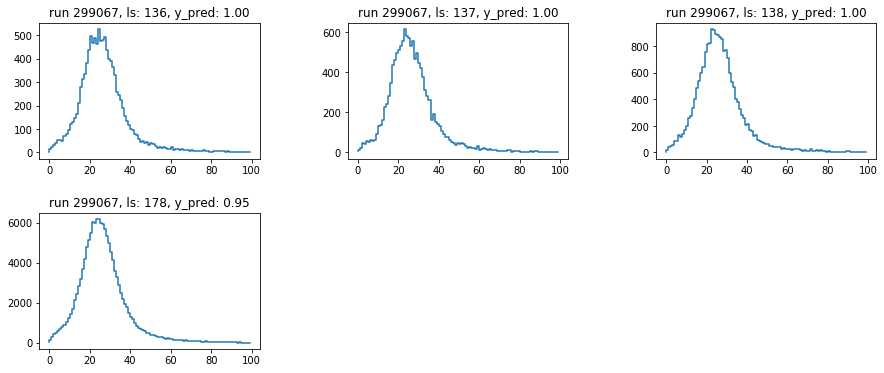

BAD LS


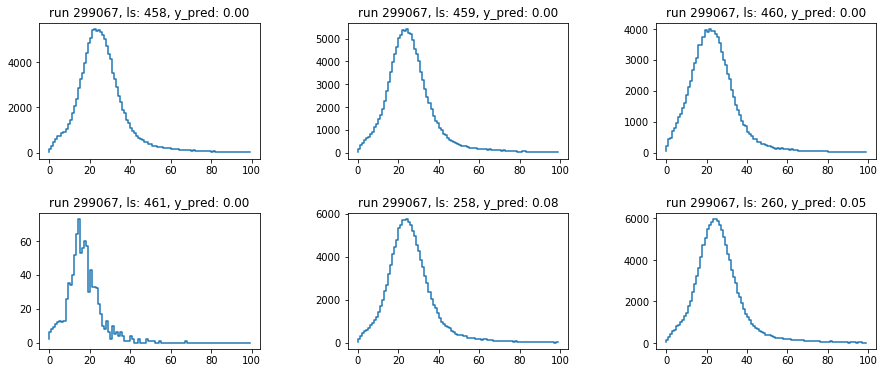

ANOMALOUS LS


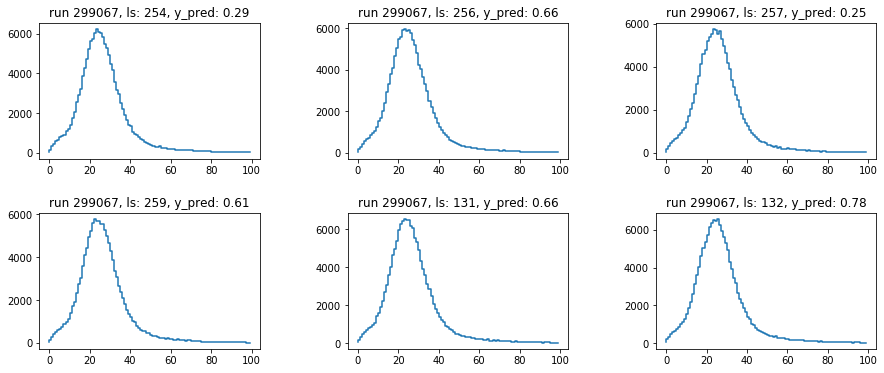

Training set shape (23999, 121)
Explained variance ratio [0.77325077 0.19846702 0.00565497 0.00410708]


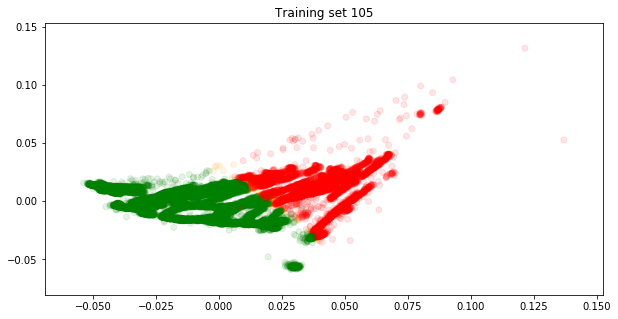

Training model
Epoch 00058: early stopping
Accuracy 1.0
[[1474    1]
 [   0 4525]]

********************************************************************************
Classifying Run 299096

Explained variance ratio [0.7678197  0.0185172  0.01751367 0.01376196]


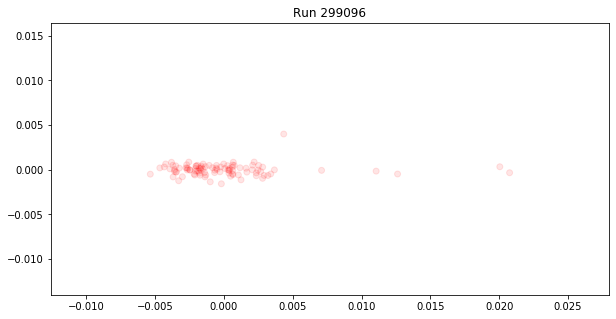

Good LS: 0 []
Bad LS: 98 [1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92, 93, 94, 95, 96, 97, 98]
Anomalies LS: 0 []
GOOD LS
BAD LS


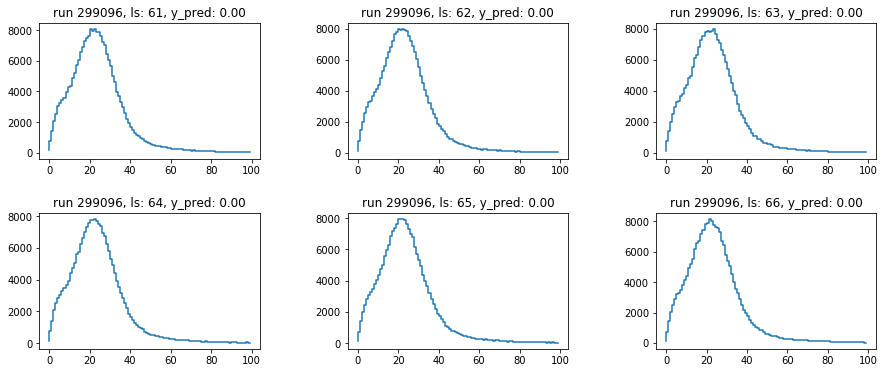

ANOMALOUS LS
Training set shape (24097, 121)
Explained variance ratio [0.77542682 0.19654297 0.00560081 0.00407694]


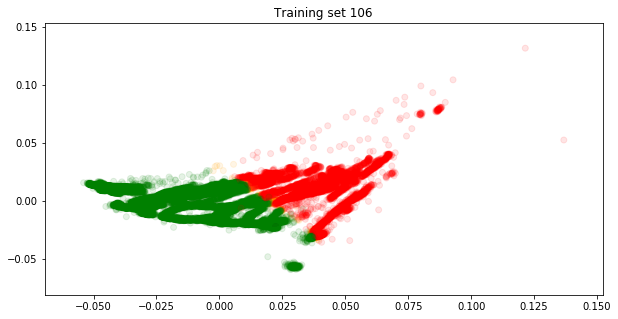

Training model
Epoch 00046: early stopping
Accuracy 1.0
[[1498    2]
 [   0 4525]]

********************************************************************************
Classifying Run 299149

Explained variance ratio [0.95127829 0.00789959 0.0056059  0.00250591]


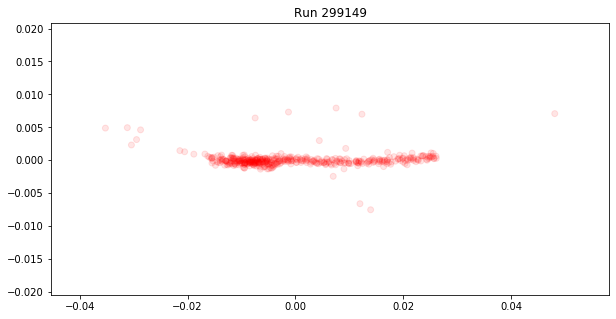

Good LS: 0 []
Bad LS: 439 [31, 32, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92, 93, 94, 95, 96, 97, 98, 99, 100, 101, 102, 103, 104, 105, 106, 107, 108, 109, 110, 111, 112, 113, 114, 115, 116, 117, 118, 119, 120, 121, 122, 123, 124, 125, 126, 127, 128, 129, 130, 131, 132, 133, 134, 135, 136, 137, 138, 139, 140, 141, 142, 143, 144, 145, 146, 147, 148, 149, 150, 151, 152, 153, 154, 155, 156, 157, 158, 159, 160, 161, 162, 163, 164, 165, 166, 167, 168, 169, 170, 171, 172, 173, 174, 175, 176, 177, 178, 179, 180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192, 193, 194, 195, 196, 197, 198, 199, 200, 201, 202, 203, 204, 205, 206, 207, 208, 209, 210, 211, 212, 213, 214, 215, 216, 217, 218, 219, 220, 221, 222, 223, 224, 225, 226, 227, 228, 229, 230, 231, 232, 233, 234, 235, 236, 237, 238, 239, 240, 

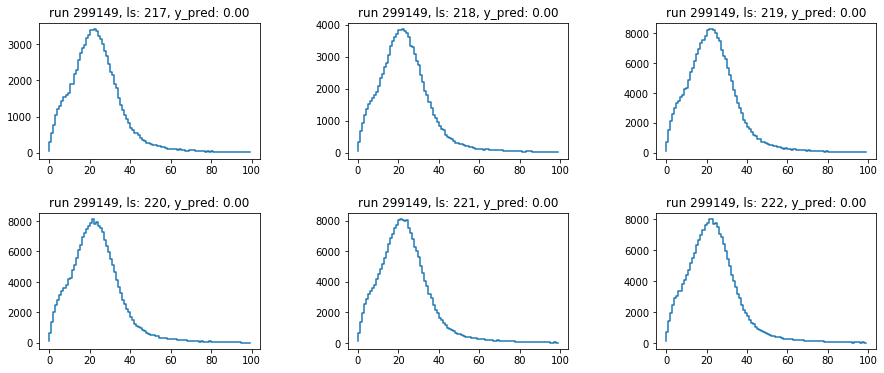

ANOMALOUS LS
Training set shape (24536, 121)
Explained variance ratio [0.78384776 0.18928102 0.00537255 0.00392217]


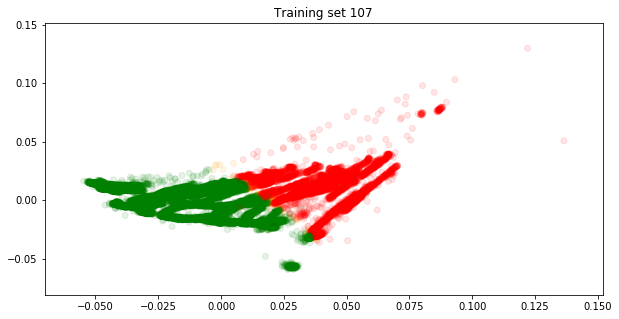

Training model
Epoch 00063: early stopping
Accuracy 1.0
[[1609    0]
 [   2 4523]]

********************************************************************************
Classifying Run 299178

Explained variance ratio [0.92323934 0.02539668 0.00698872 0.00557216]


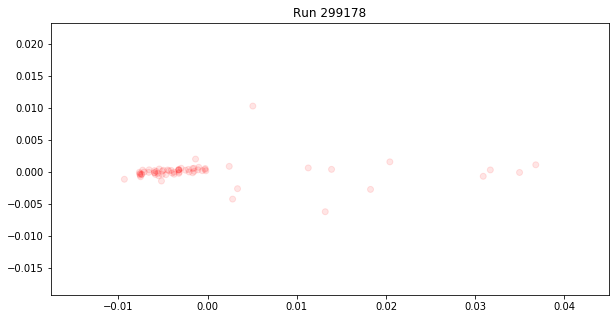

Good LS: 0 []
Bad LS: 65 [39, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92, 93, 94, 95, 96, 97, 98, 99, 100, 101, 102, 103, 104, 105, 106]
Anomalies LS: 0 []
GOOD LS
BAD LS


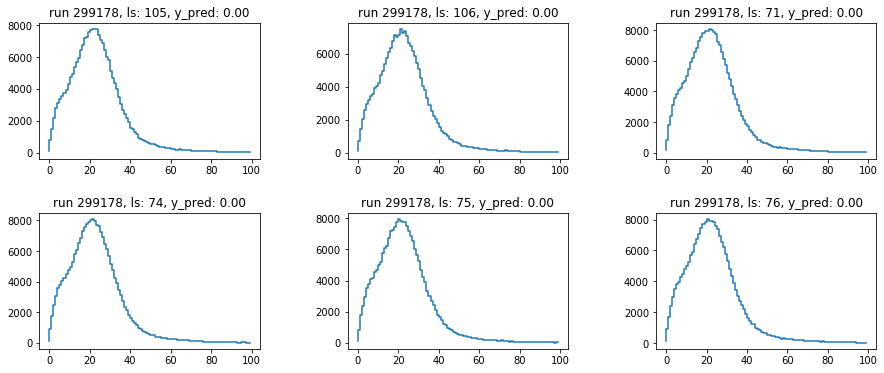

ANOMALOUS LS
Training set shape (24601, 121)
Explained variance ratio [0.78507003 0.18823389 0.00533458 0.00390169]


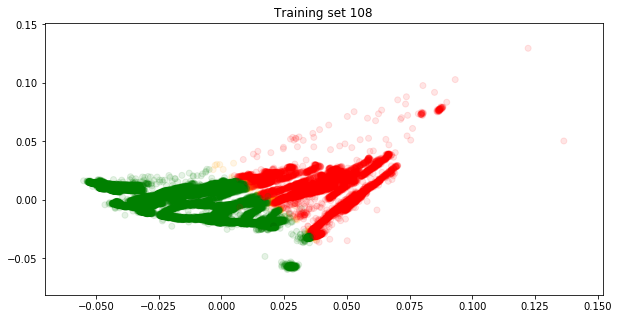

Training model
Epoch 00063: early stopping
Accuracy 0.999
[[1625    1]
 [   3 4522]]

********************************************************************************
Classifying Run 299180

Explained variance ratio [0.77524512 0.02007931 0.01745157 0.01554036]


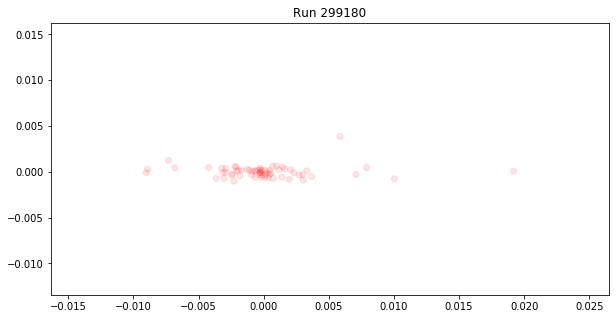

Good LS: 0 []
Bad LS: 65 [1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65]
Anomalies LS: 0 []
GOOD LS
BAD LS


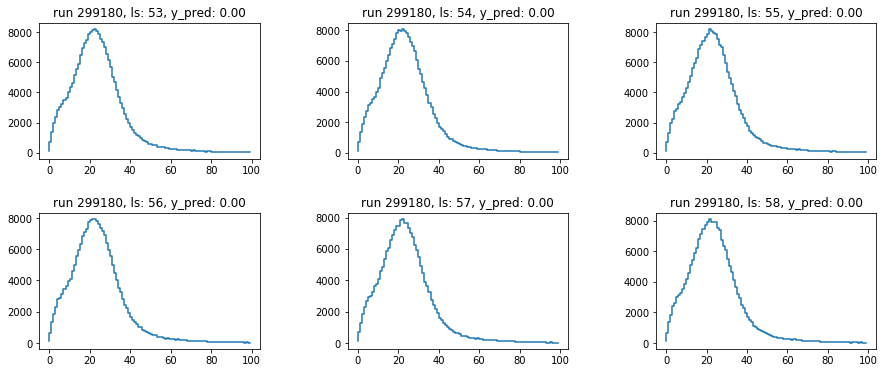

ANOMALOUS LS
Training set shape (24666, 121)
Explained variance ratio [0.7863583  0.18709794 0.00530284 0.00388126]


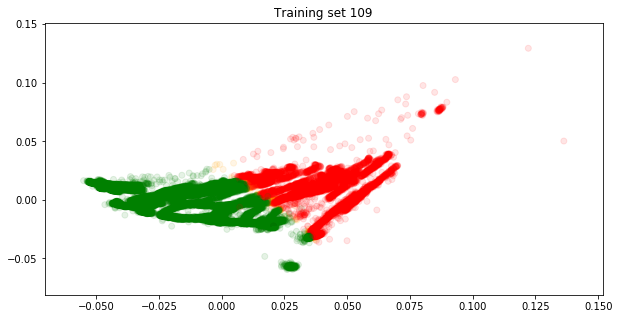

Training model
Epoch 00056: early stopping
Accuracy 1.0
[[1642    0]
 [   1 4524]]

********************************************************************************
Classifying Run 299183



/home/mantydze/anaconda3/lib/python3.7/site-packages/sklearn/decomposition/pca.py:445: RuntimeWarning: invalid value encountered in true_divide
  explained_variance_ = (S ** 2) / (n_samples - 1)


Explained variance ratio [nan]
index 1 is out of bounds for axis 1 with size 1
failed to do pca for run 299183
Good LS: 0 []
Bad LS: 1 [1]
Anomalies LS: 0 []
GOOD LS
BAD LS


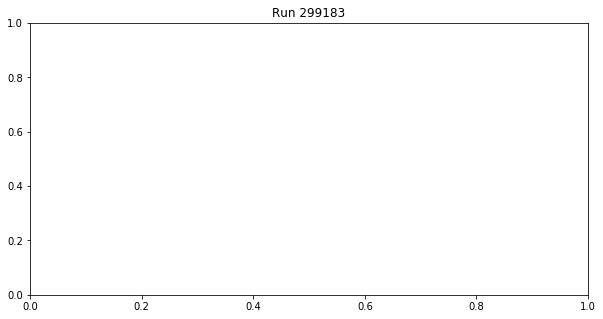

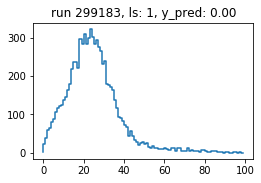

ANOMALOUS LS
Training set shape (24667, 121)
Explained variance ratio [0.78637066 0.18708461 0.00530247 0.00388103]


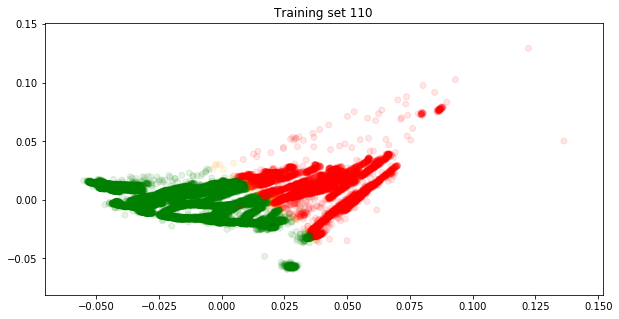

Training model
Epoch 00051: early stopping
Accuracy 1.0
[[1640    2]
 [   0 4525]]

********************************************************************************
Classifying Run 299184

Explained variance ratio [0.91014244 0.00618838 0.00497253 0.00474011]


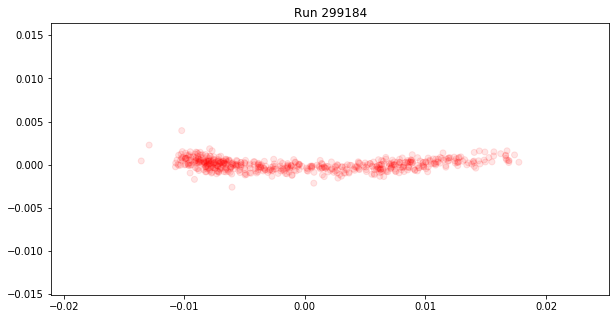

Good LS: 0 []
Bad LS: 555 [1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92, 93, 94, 95, 96, 97, 98, 99, 100, 101, 102, 103, 104, 105, 106, 107, 108, 109, 110, 111, 112, 113, 114, 115, 116, 117, 118, 119, 120, 121, 122, 123, 124, 125, 126, 127, 128, 129, 130, 131, 132, 133, 134, 135, 136, 137, 138, 139, 140, 141, 142, 143, 144, 145, 146, 147, 148, 149, 150, 151, 152, 153, 154, 155, 156, 157, 158, 159, 160, 161, 162, 163, 164, 165, 166, 167, 168, 169, 170, 171, 172, 173, 174, 175, 176, 177, 178, 179, 180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192, 193, 194, 195, 196, 197, 198, 199, 200, 201, 202, 203, 204, 205, 206, 207, 208, 209, 210, 211, 212, 213, 214, 215, 216, 2

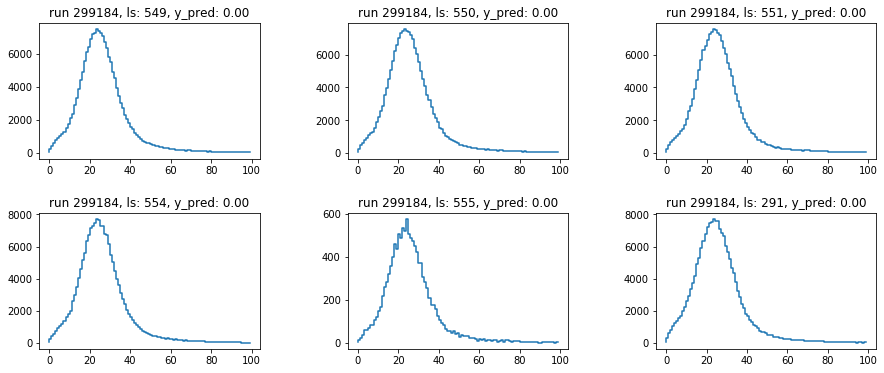

ANOMALOUS LS
Training set shape (25222, 121)
Explained variance ratio [0.78823702 0.18589852 0.00520901 0.00382616]


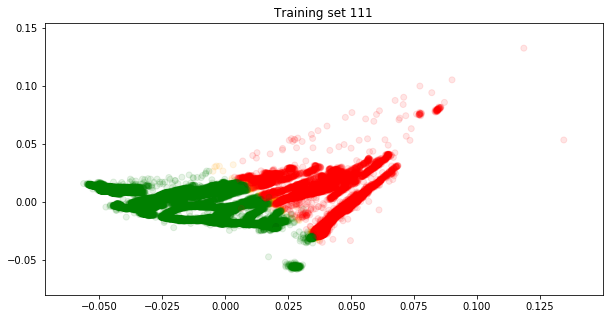

Training model
Epoch 00062: early stopping
Accuracy 1.0
[[1781    0]
 [   0 4525]]

********************************************************************************
Classifying Run 299185

Explained variance ratio [0.0973517  0.07173932 0.06373445 0.05826374]


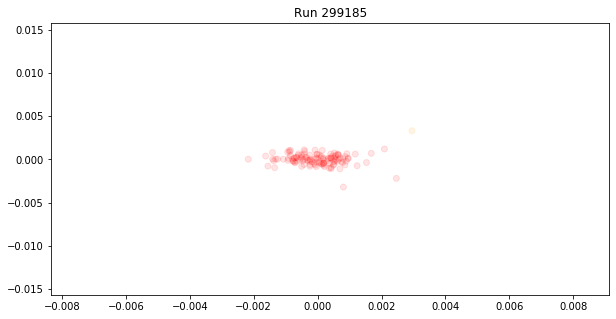

Good LS: 0 []
Bad LS: 120 [1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92, 93, 94, 95, 96, 97, 98, 99, 100, 101, 102, 103, 104, 106, 107, 108, 109, 110, 111, 112, 113, 114, 115, 116, 117, 118, 119, 120, 121]
Anomalies LS: 1 [105]
GOOD LS
BAD LS


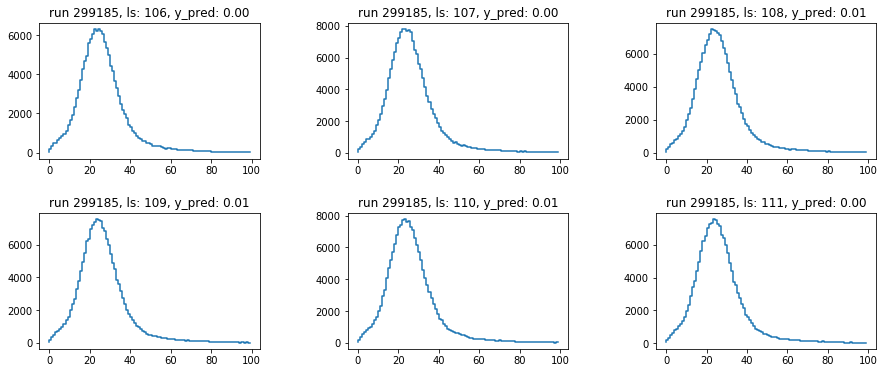

ANOMALOUS LS


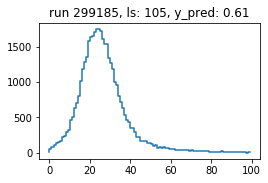

Training set shape (25342, 121)
Explained variance ratio [0.78703545 0.18721542 0.00521166 0.00382252]


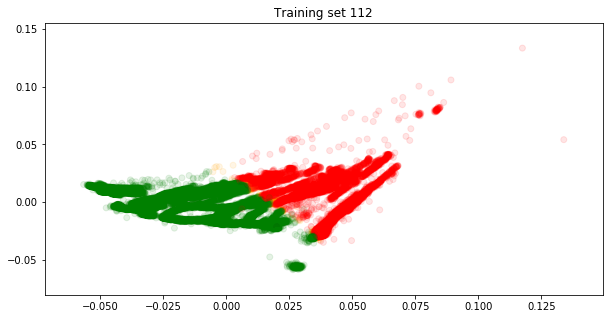

Training model
Epoch 00063: early stopping
Accuracy 1.0
[[1810    1]
 [   1 4524]]

********************************************************************************
Classifying Run 299316

Explained variance ratio [0.82274408 0.06951746 0.02442136 0.01929351]


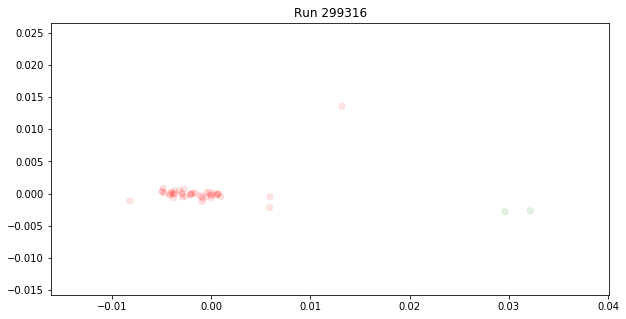

Good LS: 2 [56, 58]
Bad LS: 43 [52, 55, 57, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92, 93, 94, 95, 96, 97, 98]
Anomalies LS: 0 []
GOOD LS


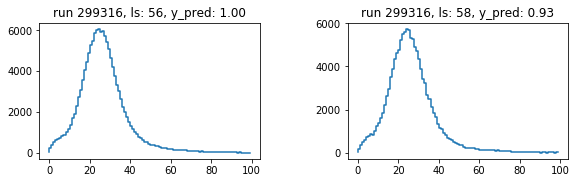

BAD LS


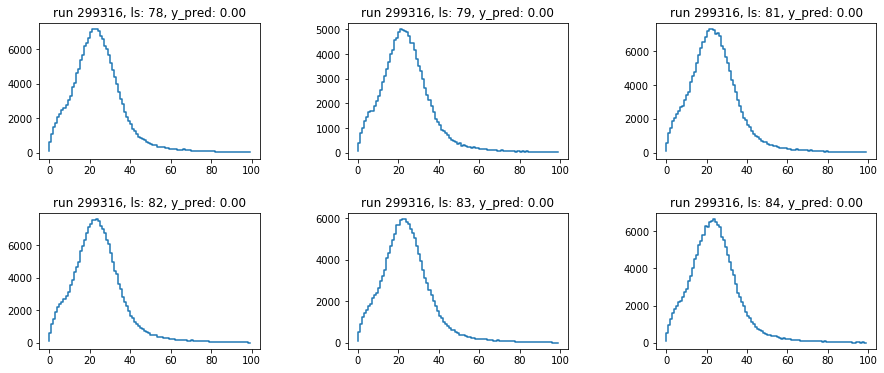

ANOMALOUS LS
Training set shape (25387, 121)
Explained variance ratio [0.78759369 0.18671235 0.00519764 0.00381523]


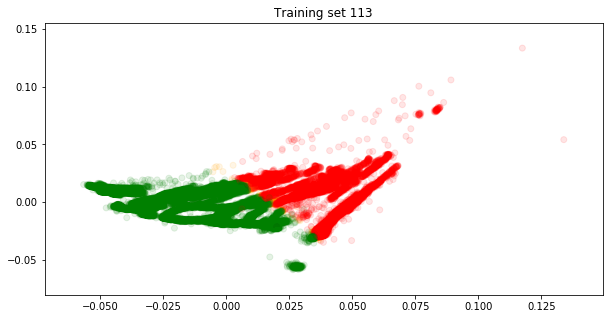

Training model
Epoch 00059: early stopping
Accuracy 0.999
[[1817    5]
 [   0 4525]]

********************************************************************************
Classifying Run 299317

Explained variance ratio [0.4501659  0.08128707 0.06865379 0.04614278]


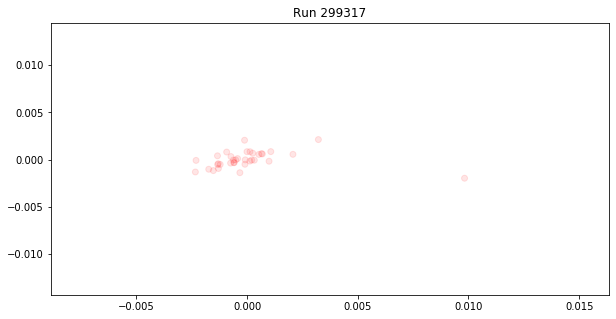

Good LS: 0 []
Bad LS: 35 [1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35]
Anomalies LS: 0 []
GOOD LS
BAD LS


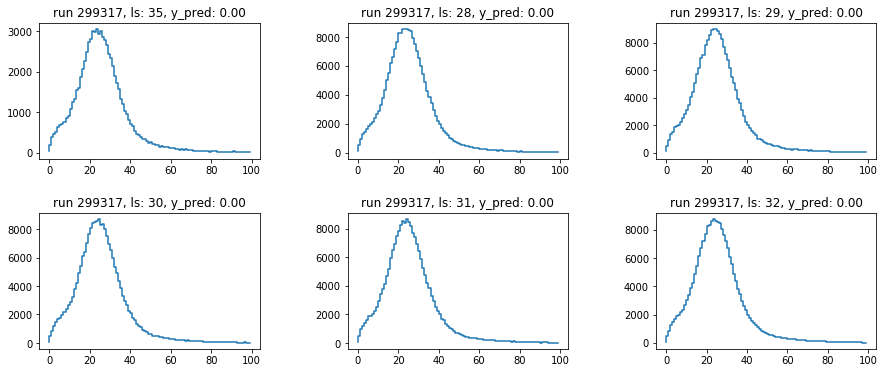

ANOMALOUS LS
Training set shape (25422, 121)
Explained variance ratio [0.78774684 0.18658794 0.00518859 0.00381806]


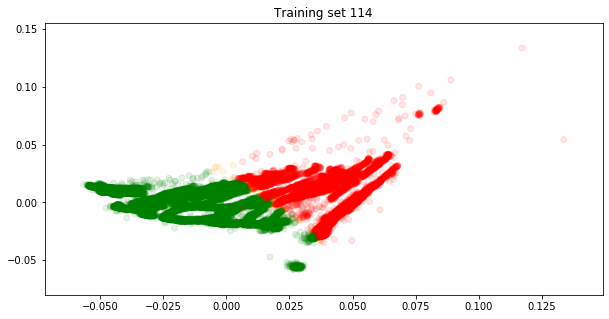

Training model
Epoch 00044: early stopping
Accuracy 1.0
[[1828    2]
 [   1 4525]]

********************************************************************************
Classifying Run 299318

Explained variance ratio [0.31974341 0.11485981 0.05912151 0.05187324]


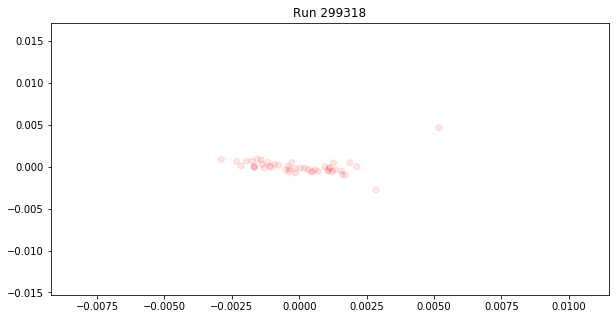

Good LS: 0 []
Bad LS: 46 [1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46]
Anomalies LS: 0 []
GOOD LS
BAD LS


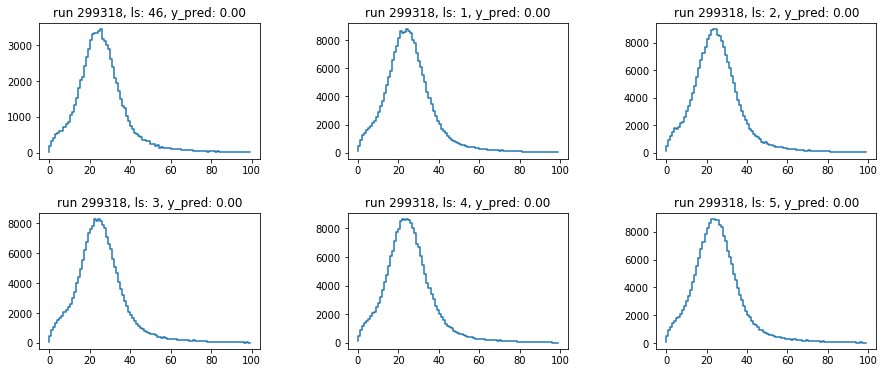

ANOMALOUS LS
Training set shape (25468, 121)
Explained variance ratio [0.78777097 0.18659926 0.00517708 0.00382344]


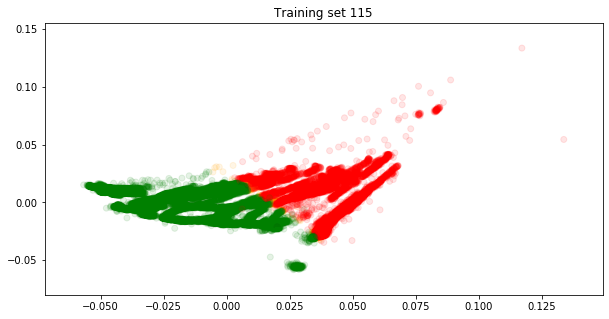

Training model
Epoch 00049: early stopping
Accuracy 1.0
[[1842    0]
 [   3 4522]]

********************************************************************************
Classifying Run 299324

Explained variance ratio [0.63575859 0.0668114  0.04011937 0.03862876]


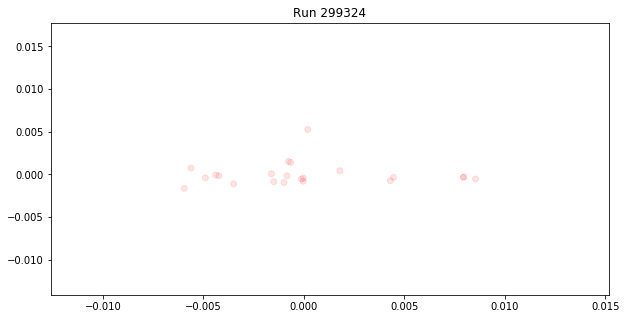

Good LS: 0 []
Bad LS: 22 [1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22]
Anomalies LS: 0 []
GOOD LS
BAD LS


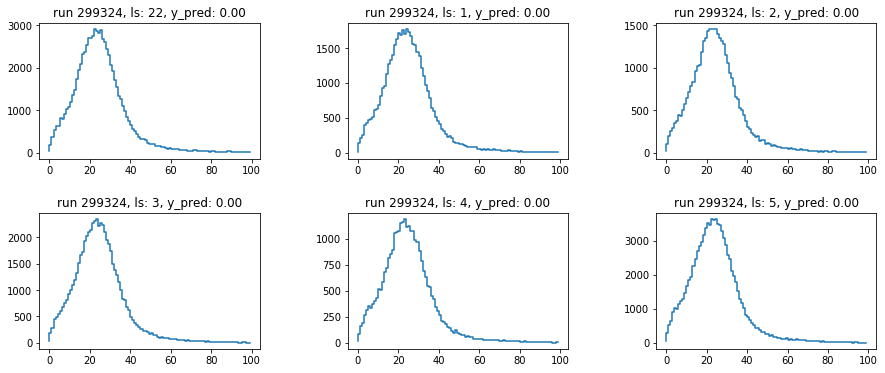

ANOMALOUS LS
Training set shape (25490, 121)
Explained variance ratio [0.78801644 0.1863799  0.00517058 0.00381884]


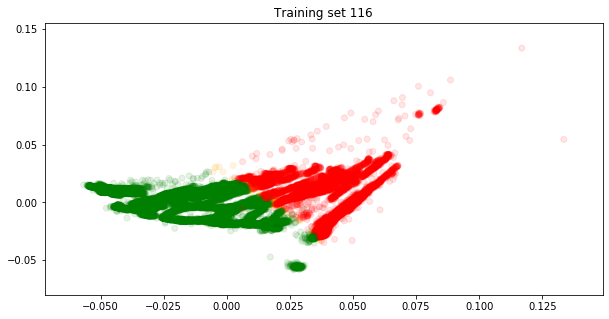

Training model
Epoch 00070: early stopping
Accuracy 1.0
[[1845    2]
 [   0 4526]]

********************************************************************************
Classifying Run 299325

Explained variance ratio [0.12394855 0.07100547 0.05530097 0.05010333]


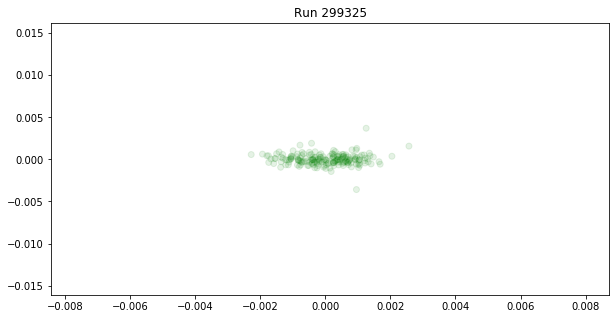

Good LS: 190 [1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92, 93, 94, 95, 96, 97, 98, 99, 100, 101, 102, 103, 104, 105, 106, 107, 108, 109, 110, 111, 112, 113, 114, 115, 116, 117, 118, 119, 120, 121, 122, 123, 124, 125, 126, 127, 128, 129, 130, 131, 132, 133, 134, 135, 136, 137, 138, 139, 140, 141, 142, 143, 144, 145, 146, 147, 148, 149, 150, 151, 152, 153, 154, 155, 156, 157, 158, 159, 160, 161, 162, 163, 164, 165, 166, 167, 168, 169, 170, 171, 172, 173, 174, 175, 176, 177, 178, 179, 180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190]
Bad LS: 0 []
Anomalies LS: 0 []
GOOD LS


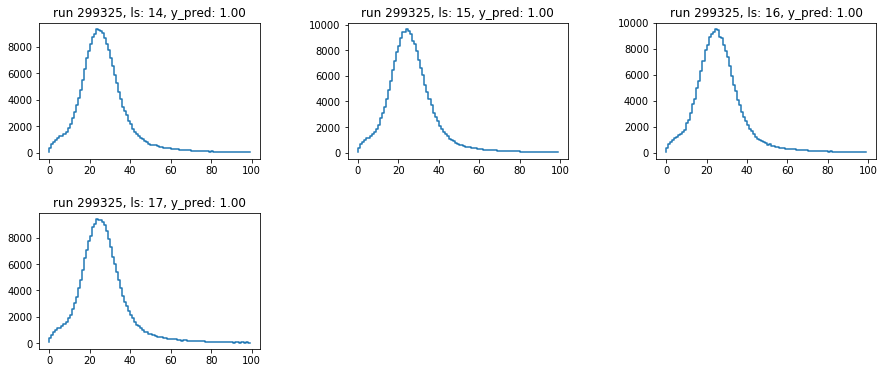

BAD LS
ANOMALOUS LS
Training set shape (25680, 121)
Explained variance ratio [0.78509792 0.1893871  0.00512896 0.00391181]


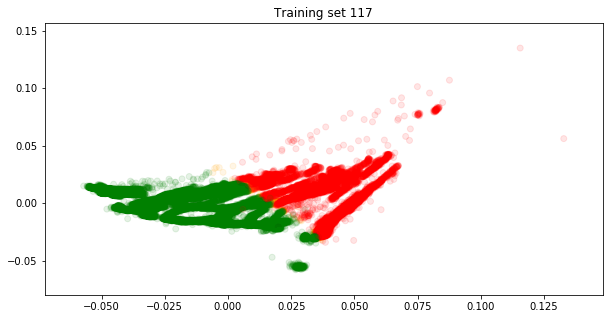

Training model
Epoch 00052: early stopping
Accuracy 0.999
[[1843    4]
 [   0 4573]]

********************************************************************************
Classifying Run 299326

Explained variance ratio [0.22600136 0.11056387 0.09922641 0.09110286]


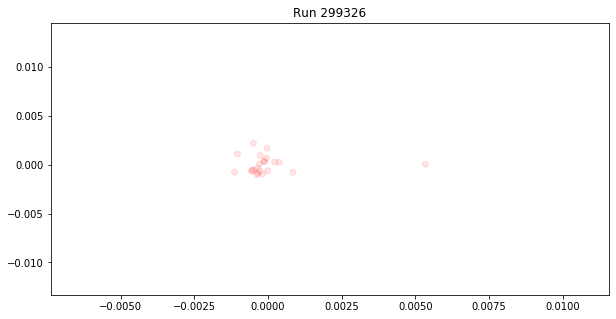

Good LS: 0 []
Bad LS: 22 [1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22]
Anomalies LS: 0 []
GOOD LS
BAD LS


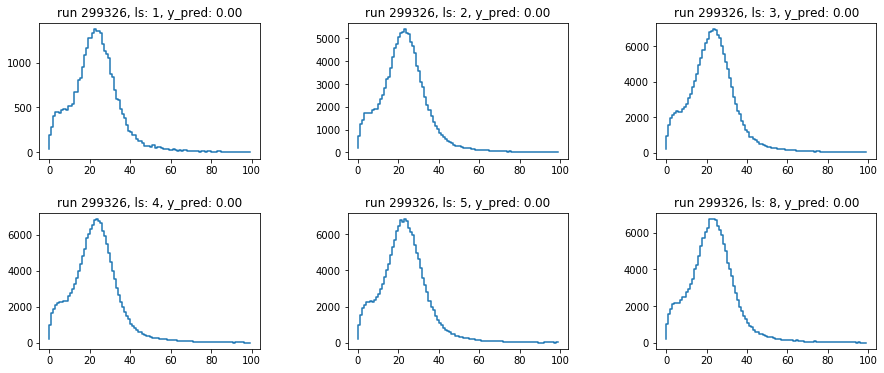

ANOMALOUS LS
Training set shape (25702, 121)
Explained variance ratio [0.78541418 0.1890284  0.00515104 0.0039449 ]


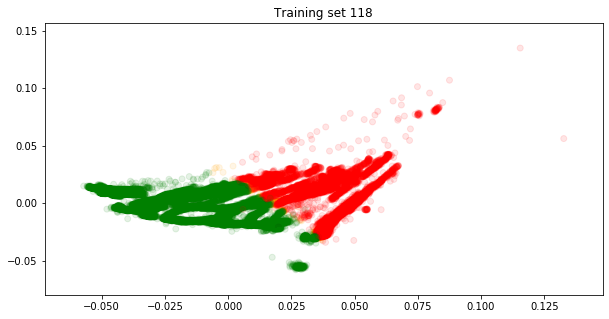

Training model
Epoch 00061: early stopping
Accuracy 0.999
[[1853    0]
 [   4 4569]]

********************************************************************************
Classifying Run 299327

Explained variance ratio [0.28681042 0.09679195 0.07134559 0.05477768]


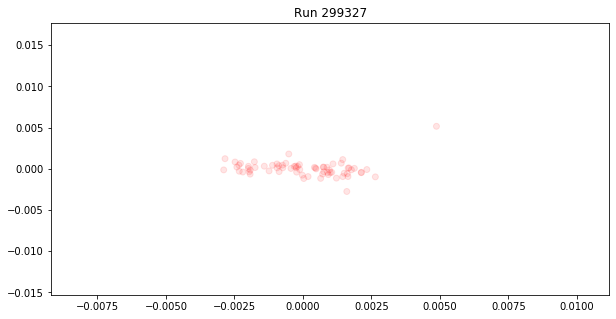

Good LS: 0 []
Bad LS: 69 [1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69]
Anomalies LS: 0 []
GOOD LS
BAD LS


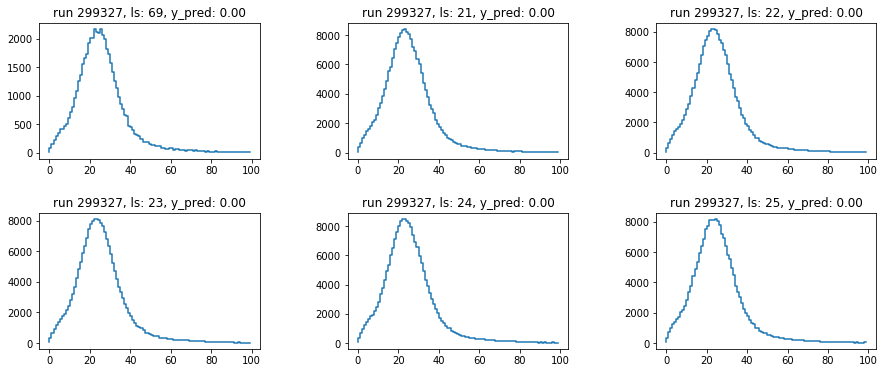

ANOMALOUS LS
Training set shape (25771, 121)
Explained variance ratio [0.78576705 0.18874452 0.00514974 0.00393476]


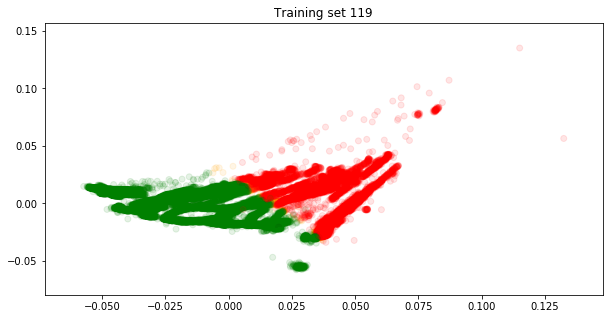

Training model
Epoch 00058: early stopping
Accuracy 1.0
[[1870    0]
 [   2 4571]]

********************************************************************************
Classifying Run 299329

Explained variance ratio [0.2314039  0.06581935 0.04828733 0.04477197]


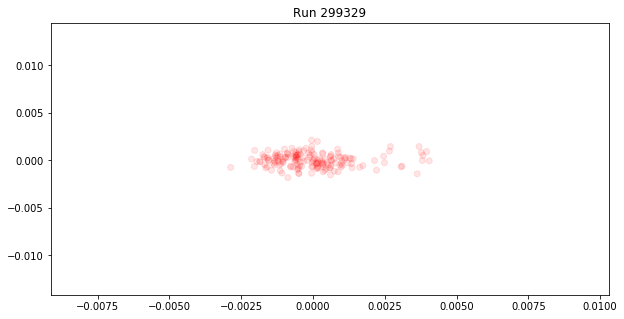

Good LS: 0 []
Bad LS: 173 [1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92, 93, 94, 95, 96, 97, 98, 99, 100, 101, 102, 103, 104, 105, 106, 107, 108, 109, 110, 111, 112, 113, 114, 115, 116, 117, 118, 119, 120, 121, 122, 123, 124, 125, 126, 127, 128, 129, 130, 131, 132, 133, 134, 135, 136, 137, 138, 139, 140, 141, 142, 143, 144, 145, 146, 147, 148, 149, 150, 151, 152, 153, 154, 155, 156, 157, 158, 159, 160, 161, 162, 163, 164, 165, 166, 167, 168, 169, 170, 171, 172, 173]
Anomalies LS: 0 []
GOOD LS
BAD LS


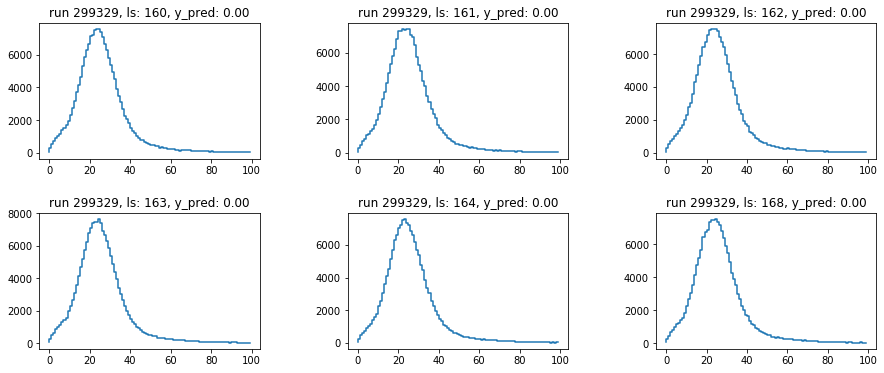

ANOMALOUS LS
Training set shape (25944, 121)
Explained variance ratio [0.7859064  0.18875728 0.00516809 0.00391577]


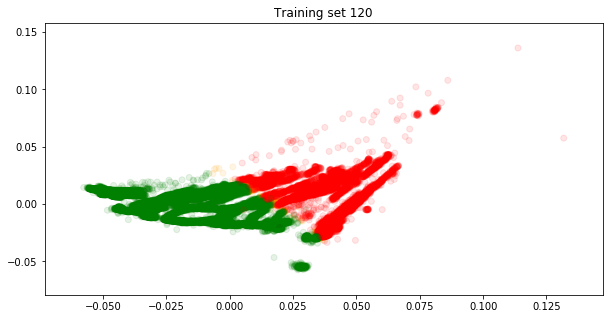

Training model
Epoch 00070: early stopping
Accuracy 1.0
[[1912    1]
 [   1 4572]]


In [13]:
model, df = self_train(df_train=df_train, df_test=df_test, run_numbers=run_numbers)

# View anomalies

In [14]:
df_anomalies

,Unnamed: 0,run,lumi,hname,metype,entries,xmax,xmin,xbins,ymax,...,bin_97,bin_98,bin_99,bin_100,bin_101,y_pred,y_good,y_bad,y_anom,y
0,2103,297057,650,chargeInner_PXLayer_1,3,45286,80000.0,0.0,100,1.0,...,3,7,6,10,179,0.615295,False,False,True,2
1,6574,297057,696,chargeInner_PXLayer_1,3,62560,80000.0,0.0,100,1.0,...,12,11,5,12,244,0.843802,False,False,True,2
2,13329,297057,286,chargeInner_PXLayer_1,3,46997,80000.0,0.0,100,1.0,...,8,9,7,10,157,0.693878,False,False,True,2
3,16555,297057,206,chargeInner_PXLayer_1,3,44198,80000.0,0.0,100,1.0,...,8,10,9,7,136,0.236643,False,False,True,2
4,14345,297101,278,chargeInner_PXLayer_1,3,28368,80000.0,0.0,100,1.0,...,3,8,5,7,116,0.515148,False,False,True,2
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
779,28331,299067,121,chargeInner_PXLayer_1,3,140441,80000.0,0.0,100,1.0,...,20,25,25,19,411,0.701439,False,False,True,2
780,28332,299067,122,chargeInner_PXLayer_1,3,142069,80000.0,0.0,100,1.0,...,16,21,16,23,386,0.841943,False,False,True,2
781,28333,299067,252,chargeInner_PXLayer_1,3,111651,80000.0,0.0,100,1.0,...,22,15,13,23,331,0.189513,False,False,True,2
782,28334,299067,253,chargeInner_PXLayer_1,3,130670,80000.0,0.0,100,1.0,...,23,14,5,16,357,0.554978,False,False,True,2


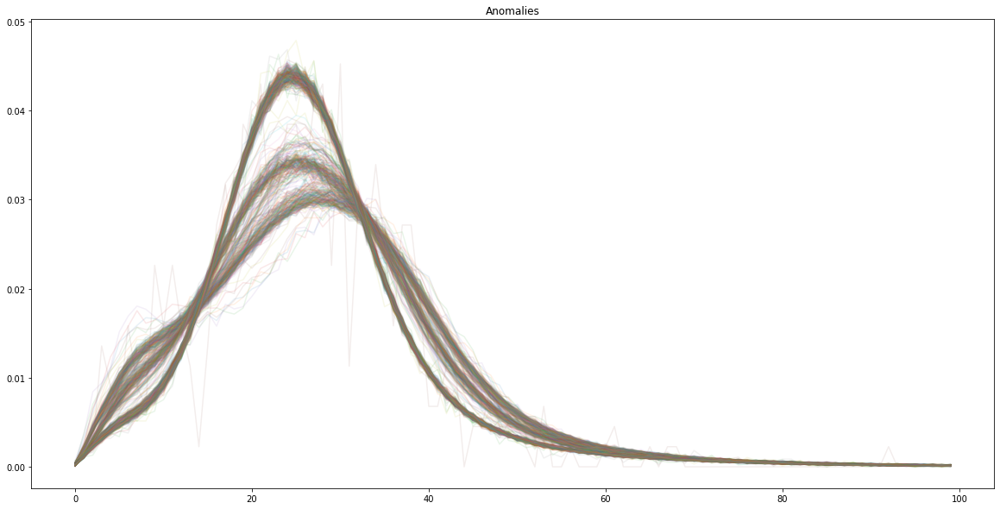

In [15]:
plt.figure(figsize=(20,10))

plt.title("Anomalies")

for index, row in df_anomalies.iterrows():

    data = [row[col]/row["entries"] for col in row.keys() if 'bin_' in col]
    data = data[1:-1]

    plt.plot(range(len(data)), data, alpha=.1)    
            
plt.show()

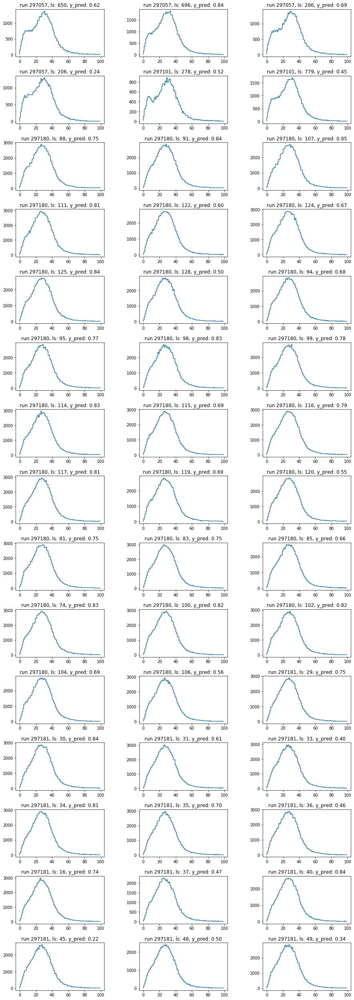

In [16]:
view_lumisections(df_anomalies, 2, 45)

In [17]:
model.save("{}/model.h5".format(target_dir))

In [18]:
df_anomalies.to_csv("{}/df_anomalies.csv".format(target_dir))

In [19]:
df.to_csv("{}/df.csv".format(target_dir))

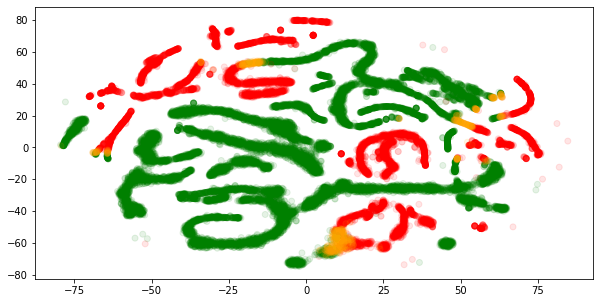

In [20]:
do_tsne(pd.concat([df, df_anomalies], ignore_index=True, sort=False))

In [21]:
#convert -loop 0 `ls -v` ann_training.gif